In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
%matplotlib inline
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('data.csv')
df

,OPC,RHA,GWP,CWP,Sand,CG,WC,Age,Compressive
0,100.0,0.0,0.0,0.0,100.0,100.0,0.5,7.0,17.2
1,100.0,0.0,0.0,0.0,100.0,100.0,0.5,7.0,18.1
2,100.0,0.0,0.0,0.0,100.0,100.0,0.5,7.0,19.8
3,95.0,5.0,0.0,0.0,100.0,100.0,0.6,7.0,13.2
4,90.0,10.0,0.0,0.0,100.0,100.0,0.6,7.0,12.6
...,...,...,...,...,...,...,...,...,...
493,70.0,10.0,5.0,15.0,100.0,100.0,0.7,90.0,11.8
494,70.0,10.0,5.0,15.0,100.0,100.0,0.7,90.0,11.6
495,70.0,15.0,10.0,5.0,100.0,100.0,0.7,90.0,13.8
496,70.0,15.0,10.0,5.0,100.0,100.0,0.7,90.0,13.6


#### Normal Approach

In [3]:
df_opc_cwp = df.drop(columns=['RHA', 'GWP'], axis=1)
df_opc_cwp

,OPC,CWP,Sand,CG,WC,Age,Compressive
0,100.0,0.0,100.0,100.0,0.5,7.0,17.2
1,100.0,0.0,100.0,100.0,0.5,7.0,18.1
2,100.0,0.0,100.0,100.0,0.5,7.0,19.8
3,95.0,0.0,100.0,100.0,0.6,7.0,13.2
4,90.0,0.0,100.0,100.0,0.6,7.0,12.6
...,...,...,...,...,...,...,...
493,70.0,15.0,100.0,100.0,0.7,90.0,11.8
494,70.0,15.0,100.0,100.0,0.7,90.0,11.6
495,70.0,5.0,100.0,100.0,0.7,90.0,13.8
496,70.0,5.0,100.0,100.0,0.7,90.0,13.6


In [5]:
df_opc_cwp.to_excel('opc-cwp.xlsx', index=False)

<ipython-input-5-c939645a113c>:1: UserWarning: Pandas requires version '1.4.3' or newer of 'xlsxwriter' (version '1.2.9' currently installed).
  df_opc_cwp.to_excel('opc-cwp.xlsx', index=False)


In [6]:
df_opc_cwp.describe()

,OPC,CWP,Sand,CG,WC,Age,Compressive
count,498.000000,498.000000,498.0,498.0,498.000000,498.000000,498.000000
mean,80.923695,6.495984,100.0,100.0,0.628112,46.110442,13.953153
std,11.341161,8.081637,0.0,0.0,0.073521,31.326891,4.138713
min,70.000000,0.000000,100.0,100.0,0.500000,7.000000,4.000000
25%,70.000000,0.000000,100.0,100.0,0.600000,28.000000,10.700000
50%,80.000000,5.000000,100.0,100.0,0.600000,56.000000,13.675000
75%,90.000000,10.000000,100.0,100.0,0.700000,90.000000,17.500000
max,100.000000,30.000000,100.0,100.0,0.700000,90.000000,24.000000


In [18]:
df_opc_cwp.corr()

,OPC,CWP,Sand,CG,WC,Age,Compressive
OPC,1.000000,-0.467880,NaN,NaN,-0.948187,-0.011218,0.740693
CWP,-0.467880,1.000000,NaN,NaN,0.437033,-0.044961,-0.284989
Sand,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CG,NaN,NaN,NaN,NaN,NaN,NaN,NaN
WC,-0.948187,0.437033,NaN,NaN,1.000000,0.011142,-0.724089
Age,-0.011218,-0.044961,NaN,NaN,0.011142,1.000000,0.446843
Compressive,0.740693,-0.284989,NaN,NaN,-0.724089,0.446843,1.000000


###### visualization

In [4]:
plt.style.use('fivethirtyeight')

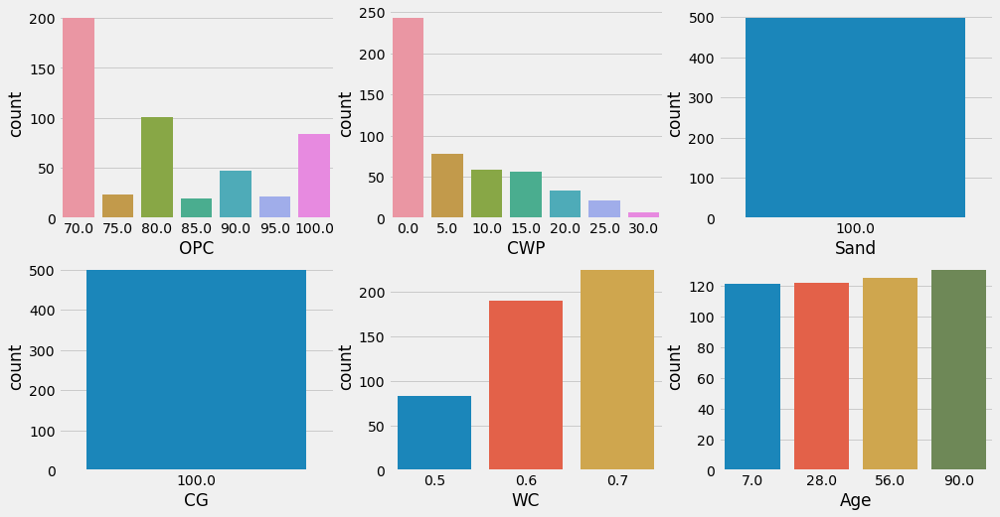

In [8]:
# plot for categorical features
cat_columns = df_opc_cwp.columns[:-1]
nCols=3   # The number of columns that you want
nRows=len(cat_columns)//nCols   # The number of corresponding rows 

fig,axes = plt.subplots(nRows, nCols, figsize=(15,8))
for ind,col in enumerate(cat_columns):
    sns.countplot(x=col,data=df_opc_cwp,ax=axes.flatten()[ind])
plt.savefig('categorical_plot_opc_cwp.jpg');

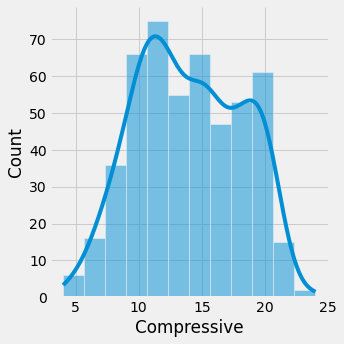

In [9]:
# continuous plot
sns.displot(df_opc_cwp, x='Compressive', kde=True)
plt.savefig('continuous_opc_cwp.jpg');

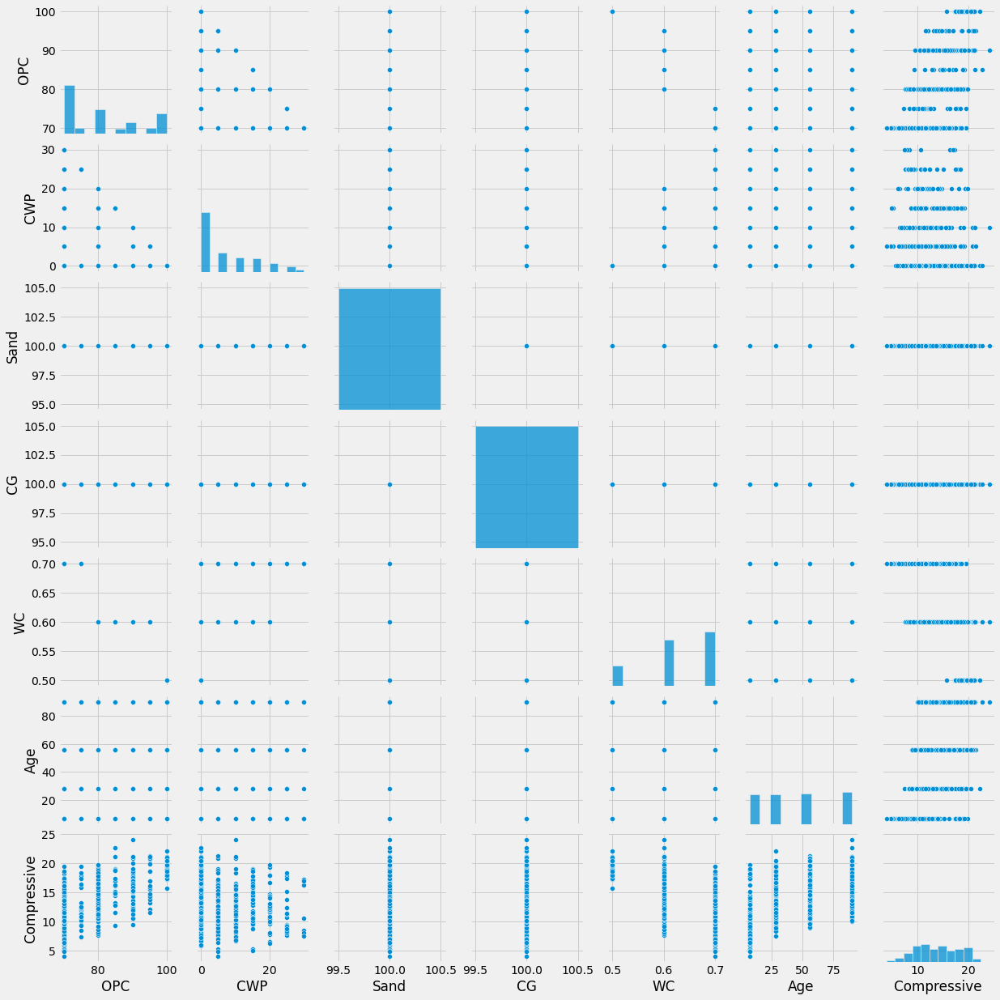

In [10]:
# pair plot of all the features
sns.pairplot(df_opc_cwp)
plt.savefig('pairplot_opc_cwp.jpg')

###### Feature Selection

In [9]:
from sklearn.model_selection import train_test_split
X_opc_cwp = df_opc_cwp.drop('Compressive', axis=1)
y_opc_cwp = df_opc_cwp['Compressive']
X_train, X_test, y_train, y_test = train_test_split(X_opc_cwp, y_opc_cwp, test_size=0.3, random_state=42)

In [10]:
constant_columns = ['Sand', 'CG'] # already gotten from OPC-RHA feature selection
# dropping the constant columns since they have no effect on the training data
X_train.drop(constant_columns, axis=1, inplace=True)
X_test.drop(constant_columns, axis=1, inplace=True)

In [11]:
from sklearn.feature_selection import mutual_info_regression
MI_reg_clf = mutual_info_regression(X_train, y_train)
MI_reg_clf_series = pd.Series(MI_reg_clf, index=X_train.columns)
MI_reg_clf_series.sort_values(ascending=False, inplace=True)

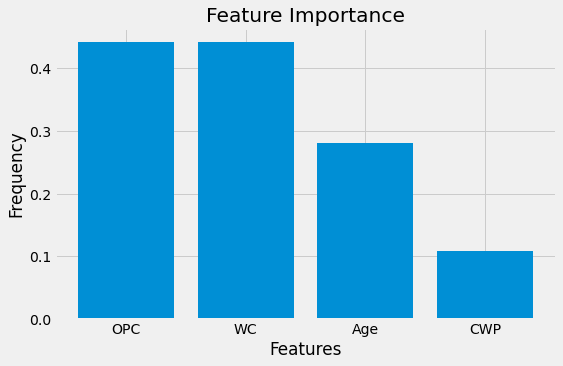

In [14]:
# The order in which the features are relevant for the prediction of the compressive strength
plt.style.use('fivethirtyeight')
plt.figure(figsize=(8, 5))
plt.bar(x=MI_reg_clf_series.index, height = MI_reg_clf_series.values)
plt.xlabel('Features')
plt.ylabel('Frequency')
plt.title('Feature Importance')
plt.savefig('featureimportance_opc_cwp.jpg');

###### Decision Tree

In [5]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

###### parameter optimization

In [15]:
import optuna
def objective(trial):
    min_samples_split = trial.suggest_int('min_samples_split', 2, 10, step=1)
    max_depth = trial.suggest_int('max_depth',3, 10, step=1)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 10, step=1)
    max_features = trial.suggest_categorical('max_features', ["auto", "sqrt", "log2"])
    model = DecisionTreeRegressor(random_state=42, min_samples_split=min_samples_split, max_depth=max_depth, min_samples_leaf=
                                 min_samples_leaf, max_features=max_features)
    model.fit(X_train, y_train)
    pred = model.predict(X_test)
    test_accuracy = r2_score(y_test, pred)
    error = mean_squared_error(y_test, pred)
    train_accuracy = model.score(X_train, y_train)
    return test_accuracy, train_accuracy, error
study = optuna.create_study(directions=['maximize', 'maximize', 'minimize'])
study.optimize(objective, n_trials=10000)

[I 2023-01-08 00:05:59,229] A new study created in memory with name: no-name-b56d0847-c131-4eb3-80c5-a48887e4625c
[I 2023-01-08 00:05:59,250] Trial 0 finished with values: [0.8268246952294205, 0.8309991533733527, 3.000656398352451] and parameters: {'min_samples_split': 8, 'max_depth': 9, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:05:59,265] Trial 1 finished with values: [0.8222527354713851, 0.8223020421212881, 3.0798760094808015] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': 'log2'}. 
[I 2023-01-08 00:05:59,284] Trial 2 finished with values: [0.7310493408014798, 0.7510538328151943, 4.6601824517317345] and parameters: {'min_samples_split': 6, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': 'log2'}. 
[I 2023-01-08 00:05:59,299] Trial 3 finished with values: [0.82772312691689, 0.820070485258424, 2.985089024037393] and parameters: {'min_samples_split': 4, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': '

[I 2023-01-08 00:05:59,826] Trial 34 finished with values: [0.8280215088882029, 0.8166134153928525, 2.979918877101262] and parameters: {'min_samples_split': 7, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'auto'}. 
[I 2023-01-08 00:05:59,839] Trial 35 finished with values: [0.7731762384112038, 0.8307712828943908, 3.9302380464204725] and parameters: {'min_samples_split': 9, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:05:59,860] Trial 36 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 6, 'max_depth': 3, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:05:59,874] Trial 37 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 2, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': 'log2'}. 
[I 2023-01-08 00:05:59,886] Trial 38 finished with values: [0.8000864059557059, 0.804883472412001

[I 2023-01-08 00:06:00,457] Trial 69 finished with values: [0.8054016511525748, 0.7815078584852503, 3.371859407733812] and parameters: {'min_samples_split': 7, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:00,475] Trial 70 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 6, 'max_depth': 3, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:00,497] Trial 71 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 5, 'max_depth': 3, 'min_samples_leaf': 6, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:00,516] Trial 72 finished with values: [0.8224778860077083, 0.8190381206064907, 3.0759747638712973] and parameters: {'min_samples_split': 8, 'max_depth': 9, 'min_samples_leaf': 5, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:00,542] Trial 73 finished with values: [0.824515460974602, 0.8375853965195826

[I 2023-01-08 00:06:01,287] Trial 104 finished with values: [0.8268246952294205, 0.8309991533733527, 3.000656398352451] and parameters: {'min_samples_split': 10, 'max_depth': 9, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:01,308] Trial 105 finished with values: [0.8126308541439036, 0.7950020245641519, 3.246597008226809] and parameters: {'min_samples_split': 10, 'max_depth': 5, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:01,325] Trial 106 finished with values: [0.8210473202781328, 0.8508518425929654, 3.100762571898553] and parameters: {'min_samples_split': 7, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:01,340] Trial 107 finished with values: [0.8210473202781328, 0.8508518425929654, 3.100762571898553] and parameters: {'min_samples_split': 7, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:01,357] Trial 108 finished with values: [0.8309880085557761, 0.81749312071

[I 2023-01-08 00:06:01,875] Trial 139 finished with values: [0.8189540277309808, 0.8485148699996875, 3.137033630774739] and parameters: {'min_samples_split': 10, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:01,891] Trial 140 finished with values: [0.8189540277309808, 0.8485148699996875, 3.137033630774739] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:01,921] Trial 141 finished with values: [0.7964826681048542, 0.8491158178025091, 3.5264010935959784] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:01,936] Trial 142 finished with values: [0.7964444354665363, 0.8421418030553257, 3.527063561093563] and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:01,950] Trial 143 finished with values: [0.8210824707909609, 0.855229

[I 2023-01-08 00:06:02,690] Trial 174 finished with values: [0.8313901451239974, 0.8236192788658896, 2.9215495854285845] and parameters: {'min_samples_split': 8, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:02,711] Trial 175 finished with values: [0.8313901451239974, 0.8236192788658896, 2.9215495854285845] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:02,723] Trial 176 finished with values: [0.8211193340994383, 0.8479752731447654, 3.099514768500971] and parameters: {'min_samples_split': 4, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:02,744] Trial 177 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 8, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:02,763] Trial 178 finished with values: [0.8293286586561631, 0.796036831

[I 2023-01-08 00:06:03,469] Trial 209 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:03,493] Trial 210 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:03,517] Trial 211 finished with values: [0.8003890682462321, 0.8584871940156481, 3.4587138180096635] and parameters: {'min_samples_split': 4, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:03,539] Trial 212 finished with values: [0.8011941300810306, 0.8392667022736643, 3.444764288953787] and parameters: {'min_samples_split': 7, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:03,562] Trial 213 finished with values: [0.7896646075991984, 0.779733430

[I 2023-01-08 00:06:04,214] Trial 244 finished with values: [0.8322538958090794, 0.823304514902452, 2.906583138433119] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 6, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:04,236] Trial 245 finished with values: [0.8268246952294205, 0.8309991533733527, 3.000656398352451] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:04,253] Trial 246 finished with values: [0.8268246952294205, 0.8309991533733527, 3.000656398352451] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:04,269] Trial 247 finished with values: [0.8218614142658082, 0.8551307395341889, 3.086656540231886] and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:04,288] Trial 248 finished with values: [0.799361153157977, 0.85531782199

[I 2023-01-08 00:06:05,000] Trial 279 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 3, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:05,016] Trial 280 finished with values: [0.8189540277309808, 0.8485148699996875, 3.137033630774738] and parameters: {'min_samples_split': 10, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:05,034] Trial 281 finished with values: [0.8268246952294205, 0.8309991533733527, 3.000656398352451] and parameters: {'min_samples_split': 10, 'max_depth': 9, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:05,056] Trial 282 finished with values: [0.8268246952294205, 0.8309991533733527, 3.000656398352451] and parameters: {'min_samples_split': 10, 'max_depth': 9, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:05,073] Trial 283 finished with values: [0.8192601586051177, 0.844458957747

[I 2023-01-08 00:06:05,753] Trial 314 finished with values: [0.8198074826837798, 0.844391092599594, 3.122245580779883] and parameters: {'min_samples_split': 8, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:05,770] Trial 315 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:05,787] Trial 316 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:05,809] Trial 317 finished with values: [0.8083709069791817, 0.8332111464032136, 3.3204102908620015] and parameters: {'min_samples_split': 5, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:05,827] Trial 318 finished with values: [0.8268246952294205, 0.8309991533

[I 2023-01-08 00:06:06,405] Trial 349 finished with values: [0.8224778860077083, 0.8190381206064907, 3.0759747638712973] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:06,519] Trial 350 finished with values: [0.8097208803385973, 0.8616310510354969, 3.297018929120774] and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:06,542] Trial 351 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:06,558] Trial 352 finished with values: [0.8392827866943174, 0.814506004105325, 2.7847916021857757] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:06,575] Trial 353 finished with values: [0.8000864059557059, 0.8048834724

[I 2023-01-08 00:06:07,194] Trial 384 finished with values: [0.8194623472254875, 0.8493386315578959, 3.128225838314841] and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:07,214] Trial 385 finished with values: [0.8328203528274712, 0.8280695619749485, 2.8967679810186073] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:07,231] Trial 386 finished with values: [0.8070640670054345, 0.861729948753155, 3.3430542685009716] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:07,248] Trial 387 finished with values: [0.8218614142658082, 0.8551307395341889, 3.086656540231886] and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:07,264] Trial 388 finished with values: [0.8355845905885089, 0.82125801

[I 2023-01-08 00:06:07,984] Trial 419 finished with values: [0.8218614142658082, 0.8551307395341889, 3.086656540231886] and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:08,006] Trial 420 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 6, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:08,024] Trial 421 finished with values: [0.8095202504035222, 0.8614643436480995, 3.3004952994911454] and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:08,044] Trial 422 finished with values: [0.8093048729586159, 0.8401068741439449, 3.304227204042864] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:08,062] Trial 423 finished with values: [0.8054016511525748, 0.78150785848

[I 2023-01-08 00:06:08,946] Trial 454 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:08,962] Trial 455 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:08,982] Trial 456 finished with values: [0.8087730487894476, 0.8615638768449981, 3.3134422685009715] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:08,997] Trial 457 finished with values: [0.7990241629783122, 0.8333864098551981, 3.482363909059045] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:09,017] Trial 458 finished with values: [0.8079920066395205, 0.86172

[I 2023-01-08 00:06:09,578] Trial 489 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:09,600] Trial 490 finished with values: [0.8205616818733006, 0.8308661163249841, 3.109177362845079] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:09,618] Trial 491 finished with values: [0.8204999961994707, 0.850919707741051, 3.1102462075750457] and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:09,631] Trial 492 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 6, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:09,654] Trial 493 finished with values: [0.8210473202781328, 0.85085184

[I 2023-01-08 00:06:10,347] Trial 524 finished with values: [0.8218614142658082, 0.8551307395341889, 3.086656540231886] and parameters: {'min_samples_split': 4, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:10,372] Trial 525 finished with values: [0.8032408907107456, 0.7970043198306666, 3.4092995014796927] and parameters: {'min_samples_split': 4, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:10,393] Trial 526 finished with values: [0.7984818898412762, 0.8500118651243126, 3.491760025673118] and parameters: {'min_samples_split': 9, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:10,409] Trial 527 finished with values: [0.8225256225493721, 0.8477467245893506, 3.075147619612083] and parameters: {'min_samples_split': 6, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:10,426] Trial 528 finished with values: [0.7869937650485246, 0.787679257861

[I 2023-01-08 00:06:11,321] Trial 559 finished with values: [0.8280215088882029, 0.8166134153928525, 2.979918877101262] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:11,344] Trial 560 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 6, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:11,365] Trial 561 finished with values: [0.8321748347284772, 0.8216391829063681, 2.907953051641495] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:11,388] Trial 562 finished with values: [0.8237427716618524, 0.796208106304254, 3.0540577403307894] and parameters: {'min_samples_split': 2, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:11,404] Trial 563 finished with values: [0.8146749318881527, 0.8354524314604

[I 2023-01-08 00:06:12,014] Trial 594 finished with values: [0.8095571309107507, 0.83991429847485, 3.2998562607428865] and parameters: {'min_samples_split': 10, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:12,043] Trial 595 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:12,072] Trial 596 finished with values: [0.7896646075991984, 0.7797334303543848, 3.644539513549989] and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:12,098] Trial 597 finished with values: [0.8194623472254875, 0.8493386315578959, 3.128225838314841] and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:12,120] Trial 598 finished with values: [0.829564814058183, 0.83438448513

[I 2023-01-08 00:06:12,923] Trial 629 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:12,961] Trial 630 finished with values: [0.8226691517261846, 0.8472399133267694, 3.072660649871661] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:12,996] Trial 631 finished with values: [0.8226691517261846, 0.8472399133267694, 3.072660649871661] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:13,024] Trial 632 finished with values: [0.8211193340994383, 0.8479752731447654, 3.099514768500971] and parameters: {'min_samples_split': 4, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:13,052] Trial 633 finished with values: [0.829564814058183, 0.834384485137

[I 2023-01-08 00:06:13,887] Trial 664 finished with values: [0.8230354982067032, 0.8539136130576007, 3.066312863088561] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:13,908] Trial 665 finished with values: [0.821018987069415, 0.8530331032574177, 3.1012535092417117] and parameters: {'min_samples_split': 5, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:13,928] Trial 666 finished with values: [0.8218614142658082, 0.8551307395341889, 3.086656540231886] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:13,945] Trial 667 finished with values: [0.8298289882919228, 0.8294026434768004, 2.9486001816045384] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:13,962] Trial 668 finished with values: [0.7994938629678565, 0.85130573422

[I 2023-01-08 00:06:14,702] Trial 699 finished with values: [0.8226691517261846, 0.8472399133267694, 3.072660649871661] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:14,829] Trial 700 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:14,853] Trial 701 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:14,876] Trial 702 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:14,899] Trial 703 finished with values: [0.8008212588811834, 0.84803560394

[I 2023-01-08 00:06:15,530] Trial 734 finished with values: [0.82772312691689, 0.820070485258424, 2.985089024037393] and parameters: {'min_samples_split': 4, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:15,546] Trial 735 finished with values: [0.8095202504035222, 0.8614643436480995, 3.3004952994911454] and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:15,561] Trial 736 finished with values: [0.8054016511525748, 0.7815078584852503, 3.371859407733812] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:15,577] Trial 737 finished with values: [0.8392827866943174, 0.814506004105325, 2.7847916021857757] and parameters: {'min_samples_split': 3, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:15,593] Trial 738 finished with values: [0.7896646075991984, 0.7797334303543

[I 2023-01-08 00:06:16,186] Trial 769 finished with values: [0.8364483412735908, 0.8209432501086524, 2.833904821872335] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:16,202] Trial 770 finished with values: [0.829564814058183, 0.8343844851374415, 2.9531776016113986] and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:16,218] Trial 771 finished with values: [0.7754095870866073, 0.8035960682865846, 3.8915401962767713] and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:16,233] Trial 772 finished with values: [0.8000864059557059, 0.8048834724120018, 3.463958131220549] and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:16,249] Trial 773 finished with values: [0.8169887529307032, 0.8384057164

[I 2023-01-08 00:06:16,780] Trial 804 finished with values: [0.8218614142658082, 0.8551307395341889, 3.086656540231886] and parameters: {'min_samples_split': 4, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:16,796] Trial 805 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:16,811] Trial 806 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:16,827] Trial 807 finished with values: [0.8218614142658082, 0.8551307395341889, 3.086656540231886] and parameters: {'min_samples_split': 4, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:16,827] Trial 808 finished with values: [0.8210824707909609, 0.8552297431

[I 2023-01-08 00:06:17,249] Trial 839 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:17,264] Trial 840 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:17,280] Trial 841 finished with values: [0.8192601586051177, 0.8444589577476795, 3.131729216456375] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:17,296] Trial 842 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:17,296] Trial 843 finished with values: [0.8218614142658082, 0.855130

[I 2023-01-08 00:06:17,842] Trial 874 finished with values: [0.8194623472254875, 0.8493386315578959, 3.128225838314841] and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:17,858] Trial 875 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:17,858] Trial 876 finished with values: [0.82772312691689, 0.820070485258424, 2.985089024037393] and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 6, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:17,874] Trial 877 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:17,889] Trial 878 finished with values: [0.8093048729586159, 0.8401068741439

[I 2023-01-08 00:06:18,403] Trial 909 finished with values: [0.8166531225924345, 0.8340533193047428, 3.176902050438428] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:18,418] Trial 910 finished with values: [0.824515460974602, 0.8375853965195826, 3.0406691389172535] and parameters: {'min_samples_split': 4, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:18,450] Trial 911 finished with values: [0.8298289882919228, 0.8294026434768004, 2.9486001816045384] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:18,481] Trial 912 finished with values: [0.8254648040872965, 0.837885989088357, 3.0242196082574835] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:18,496] Trial 913 finished with values: [0.8226691517261846, 0.84723991332

[I 2023-01-08 00:06:18,934] Trial 944 finished with values: [0.8392827866943174, 0.814506004105325, 2.7847916021857757] and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:18,950] Trial 945 finished with values: [0.8226691517261846, 0.8450436970719603, 3.072660649871661] and parameters: {'min_samples_split': 5, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:18,950] Trial 946 finished with values: [0.8189871490591804, 0.8503143845123546, 3.1364597283611384] and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:18,965] Trial 947 finished with values: [0.8290875458943121, 0.8148434574753941, 2.9614473590779506] and parameters: {'min_samples_split': 4, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:18,981] Trial 948 finished with values: [0.7984818898412762, 0.85001186

[I 2023-01-08 00:06:19,496] Trial 979 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:19,512] Trial 980 finished with values: [0.7455601172446058, 0.8383764249336761, 4.408750215265848] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:19,528] Trial 981 finished with values: [0.7455601172446058, 0.8383764249336761, 4.408750215265848] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:19,543] Trial 982 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:19,559] Trial 983 finished with values: [0.8364483412735908, 0.8209432501

[I 2023-01-08 00:06:20,090] Trial 1014 finished with values: [0.7383213256536574, 0.7522903635165822, 4.534178759090242] and parameters: {'min_samples_split': 7, 'max_depth': 4, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:20,106] Trial 1015 finished with values: [0.826572299335653, 0.8369417290692164, 3.005029731805248] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:20,121] Trial 1016 finished with values: [0.8194623472254875, 0.8493386315578959, 3.128225838314841] and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:20,121] Trial 1017 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:20,137] Trial 1018 finished with values: [0.8210824707909609, 0.8552297

[I 2023-01-08 00:06:20,606] Trial 1049 finished with values: [0.8194623472254875, 0.8493386315578959, 3.128225838314841] and parameters: {'min_samples_split': 9, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:20,715] Trial 1050 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 2, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:20,731] Trial 1051 finished with values: [0.8189540277309808, 0.8485148699996875, 3.137033630774739] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:20,746] Trial 1052 finished with values: [0.8230354982067032, 0.8539136130576007, 3.066312863088561] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:20,762] Trial 1053 finished with values: [0.7765281587591697, 0.72507

[I 2023-01-08 00:06:21,184] Trial 1083 finished with values: [0.8008212588811834, 0.8480356039445499, 3.4512251313531412] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:21,199] Trial 1084 finished with values: [0.8309880085557761, 0.8174931207181088, 2.9285175169592566] and parameters: {'min_samples_split': 3, 'max_depth': 5, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:21,215] Trial 1085 finished with values: [0.8280215088882029, 0.8166134153928525, 2.979918877101262] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:21,231] Trial 1086 finished with values: [0.821018987069415, 0.8530331032574177, 3.1012535092417117] and parameters: {'min_samples_split': 5, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:21,246] Trial 1087 finished with values: [0.8189540277309808, 0.8485

[I 2023-01-08 00:06:21,871] Trial 1117 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:21,887] Trial 1118 finished with values: [0.823366622036401, 0.8372632085447018, 3.060575388917254] and parameters: {'min_samples_split': 9, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:21,903] Trial 1119 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 10, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:21,934] Trial 1120 finished with values: [0.7896646075991984, 0.7797334303543848, 3.644539513549989] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:21,949] Trial 1121 finished with values: [0.832325998027944, 0.8242868

[I 2023-01-08 00:06:22,597] Trial 1152 finished with values: [0.8254648040872965, 0.837885989088357, 3.0242196082574835] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:22,613] Trial 1153 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:22,628] Trial 1154 finished with values: [0.799361153157977, 0.8553178219999488, 3.4765247870194895] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:22,644] Trial 1155 finished with values: [0.823704021453449, 0.8539864421529796, 3.054729175908378] and parameters: {'min_samples_split': 3, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:22,675] Trial 1156 finished with values: [0.8226691517261846, 0.847239

[I 2023-01-08 00:06:23,175] Trial 1187 finished with values: [0.8313901451239974, 0.8236192788658896, 2.9215495854285845] and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:23,190] Trial 1188 finished with values: [0.8321748347284772, 0.8216391829063681, 2.907953051641495] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:23,206] Trial 1189 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:23,222] Trial 1190 finished with values: [0.8250513515087674, 0.8424710573386138, 3.0313836154282656] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:23,222] Trial 1191 finished with values: [0.8192601586051177, 0.8

[I 2023-01-08 00:06:23,784] Trial 1222 finished with values: [0.8226691517261846, 0.8472399133267694, 3.072660649871661] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:23,800] Trial 1223 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:23,815] Trial 1224 finished with values: [0.8220792730305644, 0.8434722328436233, 3.0828816411649025] and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:23,831] Trial 1225 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:23,847] Trial 1226 finished with values: [0.8210824707909609, 0.8552

[I 2023-01-08 00:06:24,347] Trial 1256 finished with values: [0.8222527354713851, 0.8223020421212881, 3.0798760094808015] and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:24,362] Trial 1257 finished with values: [0.8364483412735908, 0.8209432501086524, 2.833904821872335] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:24,378] Trial 1258 finished with values: [0.8298289882919228, 0.8294026434768004, 2.9486001816045384] and parameters: {'min_samples_split': 5, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:24,378] Trial 1259 finished with values: [0.8093048729586159, 0.8401068741439449, 3.304227204042864] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:24,393] Trial 1260 finished with values: [0.824515460974602, 0.8375853

[I 2023-01-08 00:06:24,893] Trial 1291 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:24,925] Trial 1292 finished with values: [0.8290875458943121, 0.8148434574753941, 2.9614473590779506] and parameters: {'min_samples_split': 3, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:24,940] Trial 1293 finished with values: [0.8297914302355271, 0.8173377865285273, 2.9492509604345947] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:24,956] Trial 1294 finished with values: [0.8328203528274712, 0.8280695619749485, 2.8967679810186073] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:24,972] Trial 1295 finished with values: [0.824515460974602, 0.837

[I 2023-01-08 00:06:25,456] Trial 1325 finished with values: [0.8194623472254875, 0.8493386315578959, 3.128225838314841] and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:25,472] Trial 1326 finished with values: [0.8170609456058231, 0.8562733816432815, 3.169835588299725] and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:25,487] Trial 1327 finished with values: [0.8313901451239974, 0.8236192788658896, 2.9215495854285845] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:25,503] Trial 1328 finished with values: [0.8313901451239974, 0.8236192788658896, 2.9215495854285845] and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:25,518] Trial 1329 finished with values: [0.8328203528274712, 0.8280

[I 2023-01-08 00:06:26,065] Trial 1360 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 6, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:26,081] Trial 1361 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:26,081] Trial 1362 finished with values: [0.8296219001635766, 0.8209657101937189, 2.952188454875763] and parameters: {'min_samples_split': 4, 'max_depth': 5, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:26,097] Trial 1363 finished with values: [0.8230944206344051, 0.8367729458193884, 3.0652918978884465] and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:26,112] Trial 1364 finished with values: [0.7765281587591697, 0.72

[I 2023-01-08 00:06:26,565] Trial 1395 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:26,581] Trial 1396 finished with values: [0.8268246952294205, 0.8309991533733527, 3.000656398352451] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:26,597] Trial 1397 finished with values: [0.8250513515087674, 0.8424710573386138, 3.0313836154282656] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:26,612] Trial 1398 finished with values: [0.785207407993462, 0.8185313726898436, 3.721770643781897] and parameters: {'min_samples_split': 9, 'max_depth': 9, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:26,628] Trial 1399 finished with values: [0.82772312691689, 0.82007048

[I 2023-01-08 00:06:27,347] Trial 1430 finished with values: [0.7571745876144993, 0.8239981858164378, 4.207503075120397] and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:27,362] Trial 1431 finished with values: [0.8364483412735908, 0.8209432501086524, 2.833904821872335] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:27,378] Trial 1432 finished with values: [0.8007528589118411, 0.8480310849810626, 3.452410316538327] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:27,393] Trial 1433 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:27,409] Trial 1434 finished with values: [0.8364483412735908, 0.82094

[I 2023-01-08 00:06:27,940] Trial 1465 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:27,956] Trial 1466 finished with values: [0.7990241629783122, 0.8333864098551981, 3.482363909059045] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:27,972] Trial 1467 finished with values: [0.8189871490591804, 0.8503143845123546, 3.1364597283611384] and parameters: {'min_samples_split': 8, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:27,987] Trial 1468 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:28,003] Trial 1469 finished with values: [0.8392827866943174, 0.81450

[I 2023-01-08 00:06:28,534] Trial 1500 finished with values: [0.8238755561854592, 0.8433547344685962, 3.051756946167957] and parameters: {'min_samples_split': 8, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:28,550] Trial 1501 finished with values: [0.8254648040872965, 0.837885989088357, 3.0242196082574835] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:28,565] Trial 1502 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:28,581] Trial 1503 finished with values: [0.8193594294193685, 0.8439026597249853, 3.1300091236039567] and parameters: {'min_samples_split': 9, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:28,596] Trial 1504 finished with values: [0.8355845905885089, 0.82125

[I 2023-01-08 00:06:29,112] Trial 1535 finished with values: [0.8218614142658082, 0.8551307395341889, 3.086656540231886] and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:29,128] Trial 1536 finished with values: [0.8313901451239974, 0.8236192788658896, 2.9215495854285845] and parameters: {'min_samples_split': 4, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:29,143] Trial 1537 finished with values: [0.8037018677350432, 0.7963791315063686, 3.4013120250939317] and parameters: {'min_samples_split': 3, 'max_depth': 5, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:29,159] Trial 1538 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:29,159] Trial 1539 finished with values: [0.8054016511525748, 0.7815

[I 2023-01-08 00:06:29,737] Trial 1570 finished with values: [0.8032408907107456, 0.7970043198306666, 3.4092995014796927] and parameters: {'min_samples_split': 3, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:29,753] Trial 1571 finished with values: [0.7383213256536574, 0.7522903635165822, 4.534178759090242] and parameters: {'min_samples_split': 4, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:29,768] Trial 1572 finished with values: [0.8392827866943174, 0.814506004105325, 2.7847916021857757] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:29,768] Trial 1573 finished with values: [0.8298289882919228, 0.8294026434768004, 2.9486001816045384] and parameters: {'min_samples_split': 7, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:29,784] Trial 1574 finished with values: [0.8254648040872965, 0.8378

[I 2023-01-08 00:06:30,346] Trial 1605 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 8, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:30,362] Trial 1606 finished with values: [0.8229720144851574, 0.8517169731499646, 3.067412863088561] and parameters: {'min_samples_split': 5, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:30,378] Trial 1607 finished with values: [0.8280215088882029, 0.8166134153928525, 2.979918877101262] and parameters: {'min_samples_split': 3, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:30,393] Trial 1608 finished with values: [0.826572299335653, 0.8369417290692164, 3.005029731805248] and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:30,409] Trial 1609 finished with values: [0.7383213256536574, 0.75229036351

[I 2023-01-08 00:06:30,878] Trial 1640 finished with values: [0.829564814058183, 0.8343844851374415, 2.9531776016113986] and parameters: {'min_samples_split': 6, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:30,893] Trial 1641 finished with values: [0.8071505405374502, 0.8215666579965406, 3.3415559176970033] and parameters: {'min_samples_split': 4, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:30,909] Trial 1642 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:30,925] Trial 1643 finished with values: [0.8322538958090794, 0.823304514902452, 2.906583138433119] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 6, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:30,940] Trial 1644 finished with values: [0.8245307828706846, 0.843025

[I 2023-01-08 00:06:31,644] Trial 1675 finished with values: [0.830914858570084, 0.8157942160924636, 2.92978500699138] and parameters: {'min_samples_split': 7, 'max_depth': 5, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:31,675] Trial 1676 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 3, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:31,691] Trial 1677 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:31,722] Trial 1678 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 8, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:31,738] Trial 1679 finished with values: [0.7996418666321576, 0.858586

[I 2023-01-08 00:06:32,457] Trial 1710 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 10, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:32,488] Trial 1711 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:32,488] Trial 1712 finished with values: [0.8364483412735908, 0.8209432501086524, 2.833904821872335] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:32,504] Trial 1713 finished with values: [0.8087730487894476, 0.8615638768449981, 3.3134422685009715] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:32,519] Trial 1714 finished with values: [0.8321748347284772, 0.82

[I 2023-01-08 00:06:33,066] Trial 1745 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:33,082] Trial 1746 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:33,097] Trial 1747 finished with values: [0.8226025190774062, 0.8526835156771727, 3.073815212204675] and parameters: {'min_samples_split': 6, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:33,113] Trial 1748 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:33,129] Trial 1749 finished with values: [0.7820517387866809, 0.8427828

[I 2023-01-08 00:06:33,785] Trial 1780 finished with values: [0.7311265038784662, 0.7519404149841287, 4.65884542575691] and parameters: {'min_samples_split': 4, 'max_depth': 4, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:33,816] Trial 1781 finished with values: [0.8093048729586159, 0.8401068741439449, 3.304227204042864] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:33,832] Trial 1782 finished with values: [0.8297914302355271, 0.8173377865285273, 2.9492509604345947] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:33,847] Trial 1783 finished with values: [0.824515460974602, 0.8375853965195826, 3.0406691389172535] and parameters: {'min_samples_split': 7, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:33,863] Trial 1784 finished with values: [0.8135336353556932, 0.86172994

[I 2023-01-08 00:06:34,519] Trial 1815 finished with values: [0.8211193340994383, 0.8479752731447654, 3.099514768500971] and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:34,535] Trial 1816 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:34,550] Trial 1817 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:34,566] Trial 1818 finished with values: [0.8079920066395205, 0.861729948753155, 3.3269756018343046] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:34,582] Trial 1819 finished with values: [0.8298289882919228, 0.829

[I 2023-01-08 00:06:35,238] Trial 1850 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 6, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:35,254] Trial 1851 finished with values: [0.8170609456058231, 0.8562733816432815, 3.169835588299725] and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:35,285] Trial 1852 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:35,300] Trial 1853 finished with values: [0.7998754238139943, 0.8353793461435768, 3.4676138771382687] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:35,332] Trial 1854 finished with values: [0.8222527354713851, 0.82230

[I 2023-01-08 00:06:35,879] Trial 1885 finished with values: [0.8328203528274712, 0.8280695619749485, 2.8967679810186073] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:35,894] Trial 1886 finished with values: [0.832325998027944, 0.8242868052094853, 2.9053338033465823] and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:35,910] Trial 1887 finished with values: [0.826572299335653, 0.8369417290692164, 3.005029731805248] and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:35,925] Trial 1888 finished with values: [0.8083709069791817, 0.8332111464032136, 3.3204102908620015] and parameters: {'min_samples_split': 7, 'max_depth': 9, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:35,941] Trial 1889 finished with values: [0.8070640670054345, 0.86172

[I 2023-01-08 00:06:36,827] Trial 1920 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:36,843] Trial 1921 finished with values: [0.7383213256536574, 0.7522903635165822, 4.534178759090242] and parameters: {'min_samples_split': 5, 'max_depth': 4, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:36,874] Trial 1922 finished with values: [0.8296546133942643, 0.7946635260605286, 2.951621623680613] and parameters: {'min_samples_split': 2, 'max_depth': 4, 'min_samples_leaf': 8, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:36,906] Trial 1923 finished with values: [0.8298289882919228, 0.8294026434768004, 2.9486001816045384] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:36,937] Trial 1924 finished with values: [0.8135336353556932, 0.861729

[I 2023-01-08 00:06:37,749] Trial 1955 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:37,765] Trial 1956 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:37,796] Trial 1957 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:37,812] Trial 1958 finished with values: [0.7383213256536574, 0.7522903635165822, 4.534178759090242] and parameters: {'min_samples_split': 2, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:37,827] Trial 1959 finished with values: [0.8008592568105081, 0.85500834

[I 2023-01-08 00:06:38,448] Trial 1989 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:38,463] Trial 1990 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 6, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:38,495] Trial 1991 finished with values: [0.8268246952294205, 0.8309991533733527, 3.000656398352451] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:38,542] Trial 1992 finished with values: [0.8226691517261846, 0.8450436970719603, 3.072660649871661] and parameters: {'min_samples_split': 5, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:38,557] Trial 1993 finished with values: [0.8364483412735908, 0.82094

[I 2023-01-08 00:06:39,354] Trial 2024 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:39,370] Trial 2025 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:39,401] Trial 2026 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:39,417] Trial 2027 finished with values: [0.8364483412735908, 0.8209432501086524, 2.833904821872335] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:39,432] Trial 2028 finished with values: [0.8079920066395205, 0.861

[I 2023-01-08 00:06:40,354] Trial 2059 finished with values: [0.7943236537604339, 0.8302174117515425, 3.563810932229163] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:40,385] Trial 2060 finished with values: [0.8009433267400983, 0.8092928680913678, 3.4491100278031777] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 6, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:40,401] Trial 2061 finished with values: [0.8211193340994383, 0.8479752731447654, 3.099514768500971] and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:40,417] Trial 2062 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:40,432] Trial 2063 finished with values: [0.7869937650485246, 0.7876792

[I 2023-01-08 00:06:41,093] Trial 2094 finished with values: [0.823704021453449, 0.8539864421529796, 3.054729175908378] and parameters: {'min_samples_split': 3, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:41,124] Trial 2095 finished with values: [0.6977218041086906, 0.8269071567977119, 5.2376578969231185] and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:41,140] Trial 2096 finished with values: [0.8070640670054346, 0.861729948753155, 3.343054268500971] and parameters: {'min_samples_split': 3, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:41,171] Trial 2097 finished with values: [0.8192601586051177, 0.8444589577476795, 3.131729216456375] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:41,187] Trial 2098 finished with values: [0.8134969741589143, 0.8542735

[I 2023-01-08 00:06:41,890] Trial 2129 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 4, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:41,905] Trial 2130 finished with values: [0.8298289882919228, 0.8294026434768004, 2.9486001816045384] and parameters: {'min_samples_split': 5, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:41,921] Trial 2131 finished with values: [0.8087730487894476, 0.8615638768449981, 3.3134422685009715] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:41,937] Trial 2132 finished with values: [0.8129790234795005, 0.845575173160038, 3.2405641818607593] and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:41,952] Trial 2133 finished with values: [0.8000864059557059, 0.804

[I 2023-01-08 00:06:42,515] Trial 2164 finished with values: [0.8190872280173725, 0.843412396999672, 3.134725632575149] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:42,530] Trial 2165 finished with values: [0.7880735210696942, 0.8377430643410682, 3.6721087098705274] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:42,546] Trial 2166 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:42,562] Trial 2167 finished with values: [0.82772312691689, 0.820070485258424, 2.985089024037393] and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 6, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:42,577] Trial 2168 finished with values: [0.8313901451239974, 0.823619278

[I 2023-01-08 00:06:43,093] Trial 2199 finished with values: [0.829564814058183, 0.8343844851374415, 2.9531776016113986] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:43,187] Trial 2200 finished with values: [0.8025799918826408, 0.8430720051414354, 3.420751078249506] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:43,202] Trial 2201 finished with values: [0.7992196571338972, 0.8555788472162056, 3.4789765277602305] and parameters: {'min_samples_split': 5, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:43,218] Trial 2202 finished with values: [0.8000864059557059, 0.8048834724120018, 3.463958131220549] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:43,234] Trial 2203 finished with values: [0.8218614142658082, 0.855

[I 2023-01-08 00:06:43,734] Trial 2234 finished with values: [0.829564814058183, 0.8343844851374415, 2.9531776016113986] and parameters: {'min_samples_split': 6, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:43,749] Trial 2235 finished with values: [0.7990241629783122, 0.8333864098551981, 3.482363909059045] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:43,780] Trial 2236 finished with values: [0.8079920066395205, 0.861729948753155, 3.3269756018343046] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:43,796] Trial 2237 finished with values: [0.8087730487894476, 0.8615638768449981, 3.3134422685009715] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:43,812] Trial 2238 finished with values: [0.8087730487894476, 0.861

[I 2023-01-08 00:06:44,437] Trial 2269 finished with values: [0.799361153157977, 0.8553178219999488, 3.4765247870194895] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:44,452] Trial 2270 finished with values: [0.7455601172446058, 0.8383764249336761, 4.408750215265848] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:44,468] Trial 2271 finished with values: [0.826572299335653, 0.8369417290692164, 3.005029731805248] and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:44,483] Trial 2272 finished with values: [0.8054016511525748, 0.7815078584852503, 3.371859407733812] and parameters: {'min_samples_split': 6, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:44,499] Trial 2273 finished with values: [0.8000402167312561, 0.8482016

[I 2023-01-08 00:06:45,187] Trial 2304 finished with values: [0.8254648040872965, 0.837885989088357, 3.0242196082574835] and parameters: {'min_samples_split': 6, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:45,202] Trial 2305 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 2, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:45,218] Trial 2306 finished with values: [0.8169887529307032, 0.838405716442963, 3.1710864907468137] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:45,233] Trial 2307 finished with values: [0.8000402167312561, 0.8482016758527067, 3.4647584646864757] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:45,249] Trial 2308 finished with values: [0.799361153157977, 0.855317

[I 2023-01-08 00:06:45,858] Trial 2339 finished with values: [0.8054016511525748, 0.7815078584852503, 3.371859407733812] and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:45,890] Trial 2340 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:45,921] Trial 2341 finished with values: [0.829564814058183, 0.8343844851374415, 2.9531776016113986] and parameters: {'min_samples_split': 6, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:45,947] Trial 2342 finished with values: [0.8309880085557761, 0.8174931207181088, 2.9285175169592566] and parameters: {'min_samples_split': 3, 'max_depth': 5, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:45,972] Trial 2343 finished with values: [0.8135336353556932, 0.861729

[I 2023-01-08 00:06:46,854] Trial 2374 finished with values: [0.756411328983625, 0.861729948753155, 4.220728268500972] and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:46,884] Trial 2375 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:46,909] Trial 2376 finished with values: [0.6977218041086906, 0.8269071567977119, 5.2376578969231185] and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:46,934] Trial 2377 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:46,959] Trial 2378 finished with values: [0.8192601586051177, 0.84445895

[I 2023-01-08 00:06:47,813] Trial 2409 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:47,868] Trial 2410 finished with values: [0.8290875458943121, 0.8148434574753941, 2.9614473590779506] and parameters: {'min_samples_split': 2, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:47,893] Trial 2411 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 6, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:47,923] Trial 2412 finished with values: [0.8309880085557761, 0.8174931207181088, 2.9285175169592566] and parameters: {'min_samples_split': 6, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:47,978] Trial 2413 finished with values: [0.8218614142658082, 0.8551

[I 2023-01-08 00:06:48,932] Trial 2444 finished with values: [0.8211193340994383, 0.8479752731447654, 3.099514768500971] and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:48,952] Trial 2445 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 3, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:48,967] Trial 2446 finished with values: [0.8230354982067032, 0.8539136130576007, 3.066312863088561] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:48,987] Trial 2447 finished with values: [0.823366622036401, 0.8372632085447018, 3.060575388917254] and parameters: {'min_samples_split': 9, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:49,002] Trial 2448 finished with values: [0.8226691517261846, 0.84723991

[I 2023-01-08 00:06:49,782] Trial 2479 finished with values: [0.8093048729586159, 0.8401068741439449, 3.304227204042864] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:49,835] Trial 2480 finished with values: [0.824515460974602, 0.8375853965195826, 3.0406691389172535] and parameters: {'min_samples_split': 4, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:49,855] Trial 2481 finished with values: [0.8025093772331109, 0.8520095196899389, 3.4219746378107843] and parameters: {'min_samples_split': 7, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:49,878] Trial 2482 finished with values: [0.8245555464931486, 0.8513673855697197, 3.039974566051524] and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:49,893] Trial 2483 finished with values: [0.7869937650485246, 0.7876792

[I 2023-01-08 00:06:50,663] Trial 2514 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:50,683] Trial 2515 finished with values: [0.8392827866943174, 0.814506004105325, 2.7847916021857757] and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:50,698] Trial 2516 finished with values: [0.8000402167312561, 0.8482016758527067, 3.4647584646864757] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:50,718] Trial 2517 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:50,738] Trial 2518 finished with values: [0.8083709069791817, 0.83321

[I 2023-01-08 00:06:51,418] Trial 2549 finished with values: [0.7941547176354176, 0.846406450427055, 3.566738135187543] and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:51,518] Trial 2550 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:51,563] Trial 2551 finished with values: [0.8392827866943174, 0.814506004105325, 2.7847916021857757] and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:51,583] Trial 2552 finished with values: [0.8083709069791817, 0.8332111464032136, 3.3204102908620015] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:51,600] Trial 2553 finished with values: [0.7635439965616742, 0.86172

[I 2023-01-08 00:06:52,243] Trial 2584 finished with values: [0.8280215088882029, 0.8166134153928525, 2.979918877101262] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:52,263] Trial 2585 finished with values: [0.8083709069791817, 0.8332111464032136, 3.3204102908620015] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:52,315] Trial 2586 finished with values: [0.7980083898643023, 0.8558366907997322, 3.499964490723193] and parameters: {'min_samples_split': 4, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:52,337] Trial 2587 finished with values: [0.6977218041086906, 0.8269071567977119, 5.2376578969231185] and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:52,357] Trial 2588 finished with values: [0.7311265038784662, 0.751

[I 2023-01-08 00:06:53,114] Trial 2619 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:53,134] Trial 2620 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:53,154] Trial 2621 finished with values: [0.8144829366069402, 0.79209329833339, 3.2145054631860805] and parameters: {'min_samples_split': 5, 'max_depth': 5, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:53,174] Trial 2622 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:53,189] Trial 2623 finished with values: [0.8000864059557059, 0.80488347

[I 2023-01-08 00:06:53,949] Trial 2654 finished with values: [0.8025799918826408, 0.8430720051414354, 3.420751078249506] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:53,969] Trial 2655 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:53,984] Trial 2656 finished with values: [0.7625124016870384, 0.8121590571374805, 4.115013294483376] and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:54,004] Trial 2657 finished with values: [0.826572299335653, 0.8369417290692164, 3.005029731805248] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:54,019] Trial 2658 finished with values: [0.8135336353556932, 0.8617299

[I 2023-01-08 00:06:54,743] Trial 2689 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:54,758] Trial 2690 finished with values: [0.7998655348418442, 0.8533437079991398, 3.4677852260935644] and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:54,778] Trial 2691 finished with values: [0.8250513515087674, 0.8424710573386138, 3.0313836154282656] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:54,820] Trial 2692 finished with values: [0.756411328983625, 0.861729948753155, 4.220728268500972] and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:54,840] Trial 2693 finished with values: [0.8225256225493721, 0.847746

[I 2023-01-08 00:06:55,595] Trial 2724 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:55,615] Trial 2725 finished with values: [0.8313901451239974, 0.8236192788658896, 2.9215495854285845] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:55,640] Trial 2726 finished with values: [0.6977218041086906, 0.8269071567977119, 5.2376578969231185] and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:55,660] Trial 2727 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:55,675] Trial 2728 finished with values: [0.7998754238139943, 0.83

[I 2023-01-08 00:06:56,605] Trial 2759 finished with values: [0.8144829366069402, 0.79209329833339, 3.2145054631860805] and parameters: {'min_samples_split': 2, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:56,625] Trial 2760 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:56,643] Trial 2761 finished with values: [0.8224778860077083, 0.8190381206064907, 3.0759747638712973] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:56,663] Trial 2762 finished with values: [0.8072616685900142, 0.8326115917698498, 3.3396303711971433] and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:56,683] Trial 2763 finished with values: [0.785207407993462, 0.818531

[I 2023-01-08 00:06:57,423] Trial 2794 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:57,448] Trial 2795 finished with values: [0.8167090192624732, 0.8154946356457561, 3.175933513378134] and parameters: {'min_samples_split': 2, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:57,463] Trial 2796 finished with values: [0.8054016511525748, 0.7815078584852503, 3.371859407733812] and parameters: {'min_samples_split': 8, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:06:57,491] Trial 2797 finished with values: [0.7880735210696942, 0.8377430643410682, 3.6721087098705274] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:57,521] Trial 2798 finished with values: [0.8000864059557059, 0.8048834

[I 2023-01-08 00:06:58,657] Trial 2829 finished with values: [0.8392827866943174, 0.814506004105325, 2.7847916021857757] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:58,692] Trial 2830 finished with values: [0.8166531225924345, 0.8340533193047428, 3.176902050438428] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:58,713] Trial 2831 finished with values: [0.8364483412735908, 0.8209432501086524, 2.833904821872335] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:58,738] Trial 2832 finished with values: [0.8078533151560938, 0.8106623710243424, 3.3293787475235375] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:58,768] Trial 2833 finished with values: [0.8392827866943174, 0.81450

[I 2023-01-08 00:06:59,731] Trial 2864 finished with values: [0.8233814625522535, 0.8525845120463078, 3.060318243194849] and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:06:59,753] Trial 2865 finished with values: [0.8009638026474619, 0.8548418042714333, 3.4487552360935636] and parameters: {'min_samples_split': 5, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:59,773] Trial 2866 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:59,831] Trial 2867 finished with values: [0.8000864059557059, 0.8048834724120018, 3.463958131220549] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'log2'}. 
[I 2023-01-08 00:06:59,862] Trial 2868 finished with values: [0.7869937650485246, 0.7876

[I 2023-01-08 00:07:00,715] Trial 2899 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:00,880] Trial 2900 finished with values: [0.8298289882919228, 0.8294026434768004, 2.9486001816045384] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:00,906] Trial 2901 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:00,935] Trial 2902 finished with values: [0.7943236537604339, 0.8302174117515425, 3.563810932229163] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:00,960] Trial 2903 finished with values: [0.8364483412735908, 0.8209432

[I 2023-01-08 00:07:01,757] Trial 2934 finished with values: [0.8170609456058231, 0.8562733816432815, 3.169835588299725] and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:01,772] Trial 2935 finished with values: [0.8230354982067032, 0.8539136130576007, 3.066312863088561] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:01,830] Trial 2936 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:01,848] Trial 2937 finished with values: [0.7455601172446058, 0.8383764249336761, 4.408750215265848] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:01,878] Trial 2938 finished with values: [0.7964826681048542, 0.84911581

[I 2023-01-08 00:07:02,845] Trial 2969 finished with values: [0.8226025190774062, 0.8526835156771727, 3.073815212204675] and parameters: {'min_samples_split': 6, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:02,875] Trial 2970 finished with values: [0.8170686407721126, 0.8439680237725576, 3.1697022520252855] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:02,905] Trial 2971 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:02,951] Trial 2972 finished with values: [0.8297914302355271, 0.8173377865285273, 2.9492509604345947] and parameters: {'min_samples_split': 9, 'max_depth': 7, 'min_samples_leaf': 8, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:02,981] Trial 2973 finished with values: [0.8135336353556932, 0.8617

[I 2023-01-08 00:07:04,087] Trial 3004 finished with values: [0.830432867300091, 0.8206889236801241, 2.938136603023911] and parameters: {'min_samples_split': 10, 'max_depth': 5, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:04,117] Trial 3005 finished with values: [0.8321748347284772, 0.8216391829063681, 2.907953051641495] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:04,132] Trial 3006 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:04,167] Trial 3007 finished with values: [0.7985924422827727, 0.8447004334033679, 3.4898444529454156] and parameters: {'min_samples_split': 6, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:04,196] Trial 3008 finished with values: [0.8250513515087674, 0.84247105

[I 2023-01-08 00:07:05,006] Trial 3039 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 3, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:05,027] Trial 3040 finished with values: [0.8254648040872965, 0.837885989088357, 3.0242196082574835] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:05,100] Trial 3041 finished with values: [0.823480118862699, 0.8447669105583655, 3.058608798019809] and parameters: {'min_samples_split': 6, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:05,132] Trial 3042 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:05,152] Trial 3043 finished with values: [0.8135336353556932, 0.8617299487

[I 2023-01-08 00:07:06,137] Trial 3074 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 6, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:06,182] Trial 3075 finished with values: [0.8189871490591804, 0.8503143845123546, 3.1364597283611384] and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:06,205] Trial 3076 finished with values: [0.8321748347284772, 0.8216391829063681, 2.907953051641495] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:06,228] Trial 3077 finished with values: [0.8087730487894476, 0.8615638768449981, 3.3134422685009715] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:06,258] Trial 3078 finished with values: [0.8224778860077083, 0.81

[I 2023-01-08 00:07:07,088] Trial 3109 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:07,108] Trial 3110 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 2, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:07,128] Trial 3111 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:07,148] Trial 3112 finished with values: [0.8233814625522535, 0.8525845120463078, 3.060318243194849] and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:07,168] Trial 3113 finished with values: [0.8280215088882029, 0.81661

[I 2023-01-08 00:07:07,869] Trial 3144 finished with values: [0.8250513515087674, 0.8424710573386138, 3.0313836154282656] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:07,889] Trial 3145 finished with values: [0.824515460974602, 0.8375853965195826, 3.0406691389172535] and parameters: {'min_samples_split': 4, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:07,909] Trial 3146 finished with values: [0.8169887529307032, 0.838405716442963, 3.1710864907468137] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:07,929] Trial 3147 finished with values: [0.7980083898643023, 0.8558366907997322, 3.499964490723193] and parameters: {'min_samples_split': 4, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:07,949] Trial 3148 finished with values: [0.8328203528274712, 0.82806

[I 2023-01-08 00:07:08,850] Trial 3179 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:08,870] Trial 3180 finished with values: [0.8250513515087674, 0.8424710573386138, 3.0313836154282656] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:08,890] Trial 3181 finished with values: [0.8226025190774062, 0.8526835156771727, 3.073815212204675] and parameters: {'min_samples_split': 6, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:08,905] Trial 3182 finished with values: [0.823704021453449, 0.8539864421529796, 3.054729175908378] and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:08,930] Trial 3183 finished with values: [0.8134969741589143, 0.8542735

[I 2023-01-08 00:07:09,729] Trial 3214 finished with values: [0.8192997788129652, 0.841850156293434, 3.131042706157811] and parameters: {'min_samples_split': 10, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:09,749] Trial 3215 finished with values: [0.824515460974602, 0.8375853965195826, 3.0406691389172535] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:09,764] Trial 3216 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:09,815] Trial 3217 finished with values: [0.8309880085557761, 0.8174931207181088, 2.9285175169592566] and parameters: {'min_samples_split': 2, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:09,835] Trial 3218 finished with values: [0.7978972331097125, 0.836778

[I 2023-01-08 00:07:10,574] Trial 3249 finished with values: [0.8280215088882029, 0.8166134153928525, 2.979918877101262] and parameters: {'min_samples_split': 5, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:10,679] Trial 3250 finished with values: [0.8083709069791817, 0.8332111464032136, 3.3204102908620015] and parameters: {'min_samples_split': 3, 'max_depth': 9, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:10,699] Trial 3251 finished with values: [0.7994442252533641, 0.8477227439833435, 3.475085373848666] and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:10,719] Trial 3252 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:10,739] Trial 3253 finished with values: [0.8207764216563713, 0.84854

[I 2023-01-08 00:07:11,490] Trial 3284 finished with values: [0.7896646075991984, 0.7797334303543848, 3.644539513549989] and parameters: {'min_samples_split': 10, 'max_depth': 9, 'min_samples_leaf': 8, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:11,509] Trial 3285 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 2, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:11,529] Trial 3286 finished with values: [0.824515460974602, 0.8375853965195826, 3.0406691389172535] and parameters: {'min_samples_split': 4, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:11,589] Trial 3287 finished with values: [0.8218614142658082, 0.8551307395341889, 3.086656540231886] and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:11,614] Trial 3288 finished with values: [0.7943236537604339, 0.830217

[I 2023-01-08 00:07:12,475] Trial 3319 finished with values: [0.8087730487894476, 0.8615638768449981, 3.3134422685009715] and parameters: {'min_samples_split': 3, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:12,500] Trial 3320 finished with values: [0.8226691517261846, 0.8472399133267694, 3.072660649871661] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:12,525] Trial 3321 finished with values: [0.8297914302355271, 0.8173377865285273, 2.9492509604345947] and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 8, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:12,585] Trial 3322 finished with values: [0.8226025190774062, 0.8526835156771727, 3.073815212204675] and parameters: {'min_samples_split': 6, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:12,605] Trial 3323 finished with values: [0.8135336353556932, 0.86172

[I 2023-01-08 00:07:13,630] Trial 3354 finished with values: [0.8254648040872965, 0.837885989088357, 3.0242196082574835] and parameters: {'min_samples_split': 5, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:13,653] Trial 3355 finished with values: [0.8297914302355271, 0.8173377865285273, 2.9492509604345947] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:13,679] Trial 3356 finished with values: [0.824515460974602, 0.8375853965195826, 3.0406691389172535] and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:13,711] Trial 3357 finished with values: [0.8313901451239974, 0.8236192788658896, 2.9215495854285845] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:13,742] Trial 3358 finished with values: [0.8070640670054345, 0.8617

[I 2023-01-08 00:07:14,733] Trial 3389 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:14,762] Trial 3390 finished with values: [0.8224778860077083, 0.8190381206064907, 3.0759747638712973] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:14,821] Trial 3391 finished with values: [0.8000864059557059, 0.8048834724120018, 3.463958131220549] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:14,848] Trial 3392 finished with values: [0.7383213256536574, 0.7522903635165822, 4.534178759090242] and parameters: {'min_samples_split': 2, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:14,871] Trial 3393 finished with values: [0.8000864059557059, 0.8048

[I 2023-01-08 00:07:15,883] Trial 3424 finished with values: [0.8170609456058231, 0.8562733816432815, 3.169835588299725] and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:15,911] Trial 3425 finished with values: [0.8000864059557059, 0.8048834724120018, 3.463958131220549] and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:15,934] Trial 3426 finished with values: [0.8364483412735908, 0.8209432501086524, 2.833904821872335] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:15,965] Trial 3427 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:15,988] Trial 3428 finished with values: [0.8254648040872965, 0.8378859

[I 2023-01-08 00:07:17,109] Trial 3459 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 8, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:17,137] Trial 3460 finished with values: [0.8245555464931486, 0.8513673855697197, 3.039974566051524] and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:17,161] Trial 3461 finished with values: [0.824515460974602, 0.8375853965195826, 3.0406691389172535] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:17,186] Trial 3462 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:17,210] Trial 3463 finished with values: [0.8083709069791817, 0.8332111

[I 2023-01-08 00:07:18,274] Trial 3494 finished with values: [0.8054016511525748, 0.7815078584852503, 3.371859407733812] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:18,328] Trial 3495 finished with values: [0.8224778860077083, 0.8190381206064907, 3.0759747638712973] and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:18,349] Trial 3496 finished with values: [0.8079920066395205, 0.861729948753155, 3.3269756018343046] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:18,370] Trial 3497 finished with values: [0.8230354982067032, 0.8539136130576007, 3.066312863088561] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:18,394] Trial 3498 finished with values: [0.832325998027944, 0.824286

[I 2023-01-08 00:07:19,679] Trial 3529 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:19,701] Trial 3530 finished with values: [0.8204999961994707, 0.850919707741051, 3.1102462075750457] and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:19,730] Trial 3531 finished with values: [0.8009433267400983, 0.8092928680913678, 3.4491100278031777] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:19,757] Trial 3532 finished with values: [0.8093048729586159, 0.8401068741439449, 3.304227204042864] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:19,811] Trial 3533 finished with values: [0.8215874570771197, 0.852292

[I 2023-01-08 00:07:20,977] Trial 3563 finished with values: [0.7635439965616742, 0.8617294191871214, 4.097138564797268] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:21,003] Trial 3564 finished with values: [0.7736080586872436, 0.8308455689045473, 3.922755777075234] and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:21,027] Trial 3565 finished with values: [0.8000864059557059, 0.8048834724120018, 3.463958131220549] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:21,085] Trial 3566 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:21,114] Trial 3567 finished with values: [0.7383213256536574, 0.7522

[I 2023-01-08 00:07:21,994] Trial 3598 finished with values: [0.756411328983625, 0.861729948753155, 4.220728268500972] and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:22,014] Trial 3599 finished with values: [0.8268246952294205, 0.8309991533733527, 3.000656398352451] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:22,149] Trial 3600 finished with values: [0.8134969741589143, 0.8542735411867449, 3.2315895071964165] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:22,170] Trial 3601 finished with values: [0.8087392082535949, 0.8616304155562564, 3.314028632824479] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:22,199] Trial 3602 finished with values: [0.8215874570771197, 0.85229234

[I 2023-01-08 00:07:23,415] Trial 3633 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:23,455] Trial 3634 finished with values: [0.7994442252533641, 0.8477227439833435, 3.475085373848666] and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:23,476] Trial 3635 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:23,500] Trial 3636 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 3, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:23,525] Trial 3637 finished with values: [0.8230354982067032, 0.85391

[I 2023-01-08 00:07:24,625] Trial 3668 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:24,664] Trial 3669 finished with values: [0.8364483412735908, 0.8209432501086524, 2.833904821872335] and parameters: {'min_samples_split': 5, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:24,695] Trial 3670 finished with values: [0.8079920066395205, 0.861729948753155, 3.3269756018343046] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:24,730] Trial 3671 finished with values: [0.8054016511525748, 0.7815078584852503, 3.371859407733812] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:24,755] Trial 3672 finished with values: [0.7964826681048542, 0.8491

[I 2023-01-08 00:07:25,897] Trial 3703 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:25,925] Trial 3704 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:25,949] Trial 3705 finished with values: [0.8079920066395205, 0.861729948753155, 3.3269756018343046] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:25,974] Trial 3706 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 3, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:25,995] Trial 3707 finished with values: [0.8268246952294205, 0.830999

[I 2023-01-08 00:07:26,964] Trial 3738 finished with values: [0.829564814058183, 0.8343844851374415, 2.9531776016113986] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:26,989] Trial 3739 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:27,015] Trial 3740 finished with values: [0.7996418666321576, 0.8585867272125467, 3.4716607870194895] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:27,056] Trial 3741 finished with values: [0.7310493408014798, 0.7510538328151943, 4.6601824517317345] and parameters: {'min_samples_split': 10, 'max_depth': 4, 'min_samples_leaf': 10, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:27,100] Trial 3742 finished with values: [0.7455601172446058, 0.838

[I 2023-01-08 00:07:28,145] Trial 3773 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 6, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:28,172] Trial 3774 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:28,200] Trial 3775 finished with values: [0.8079920066395205, 0.861729948753155, 3.3269756018343046] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:28,223] Trial 3776 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:28,250] Trial 3777 finished with values: [0.8193818470611856, 0.83175

[I 2023-01-08 00:07:29,276] Trial 3808 finished with values: [0.8250513515087674, 0.8424710573386138, 3.0313836154282656] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:29,335] Trial 3809 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 2, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:29,356] Trial 3810 finished with values: [0.8226691517261846, 0.8472399133267694, 3.072660649871661] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:29,384] Trial 3811 finished with values: [0.8083709069791817, 0.8332111464032136, 3.3204102908620015] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:29,408] Trial 3812 finished with values: [0.8210824707909609, 0.855

[I 2023-01-08 00:07:30,361] Trial 3843 finished with values: [0.8233814625522535, 0.8525845120463078, 3.060318243194849] and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:30,384] Trial 3844 finished with values: [0.8009433267400983, 0.8092928680913678, 3.4491100278031777] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 6, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:30,410] Trial 3845 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:30,439] Trial 3846 finished with values: [0.7901670695089069, 0.798526702329674, 3.6358332170818373] and parameters: {'min_samples_split': 4, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:30,463] Trial 3847 finished with values: [0.8169887529307032, 0.838405

[I 2023-01-08 00:07:31,474] Trial 3878 finished with values: [0.8000402167312561, 0.8482016758527067, 3.4647584646864757] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:31,504] Trial 3879 finished with values: [0.8280215088882029, 0.8166134153928525, 2.979918877101262] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:31,529] Trial 3880 finished with values: [0.8000864059557059, 0.8048834724120018, 3.463958131220549] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:31,584] Trial 3881 finished with values: [0.8192997788129652, 0.841850156293434, 3.131042706157811] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:31,607] Trial 3882 finished with values: [0.7943236537604339, 0.830

[I 2023-01-08 00:07:32,632] Trial 3913 finished with values: [0.8134969741589143, 0.8542735411867449, 3.2315895071964165] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:32,660] Trial 3914 finished with values: [0.8083709069791817, 0.8332111464032136, 3.3204102908620015] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:32,683] Trial 3915 finished with values: [0.799361153157977, 0.8553178219999488, 3.4765247870194895] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:32,709] Trial 3916 finished with values: [0.7994442252533641, 0.8477227439833435, 3.475085373848666] and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:32,733] Trial 3917 finished with values: [0.8135336353556932, 0.861

[I 2023-01-08 00:07:33,694] Trial 3948 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:33,721] Trial 3949 finished with values: [0.8224778860077083, 0.8190381206064907, 3.0759747638712973] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:33,865] Trial 3950 finished with values: [0.8250513515087674, 0.8424710573386138, 3.0313836154282656] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:33,886] Trial 3951 finished with values: [0.8189540277309808, 0.8485148699996875, 3.137033630774739] and parameters: {'min_samples_split': 10, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:33,916] Trial 3952 finished with values: [0.7994442252533641, 0.8477

[I 2023-01-08 00:07:34,912] Trial 3983 finished with values: [0.8392827866943174, 0.814506004105325, 2.7847916021857757] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:34,935] Trial 3984 finished with values: [0.8170686407721126, 0.8439680237725576, 3.1697022520252855] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:34,967] Trial 3985 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:34,994] Trial 3986 finished with values: [0.8254648040872965, 0.837885989088357, 3.0242196082574835] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:35,020] Trial 3987 finished with values: [0.8218614142658082, 0.85513

[I 2023-01-08 00:07:36,080] Trial 4018 finished with values: [0.8079920066395205, 0.861729948753155, 3.3269756018343046] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:36,114] Trial 4019 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:36,148] Trial 4020 finished with values: [0.7625124016870384, 0.8121590571374805, 4.115013294483376] and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:36,169] Trial 4021 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:36,210] Trial 4022 finished with values: [0.8254648040872965, 0.83788

[I 2023-01-08 00:07:37,331] Trial 4053 finished with values: [0.7880735210696942, 0.8377430643410682, 3.6721087098705274] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:37,355] Trial 4054 finished with values: [0.8309880085557761, 0.8174931207181088, 2.9285175169592566] and parameters: {'min_samples_split': 6, 'max_depth': 5, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:37,378] Trial 4055 finished with values: [0.824515460974602, 0.8375853965195826, 3.0406691389172535] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:37,412] Trial 4056 finished with values: [0.8217979305442624, 0.8529340996265529, 3.0877565402318856] and parameters: {'min_samples_split': 5, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:37,445] Trial 4057 finished with values: [0.8226691517261846, 0.8450

[I 2023-01-08 00:07:38,406] Trial 4088 finished with values: [0.8000864059557059, 0.8048834724120018, 3.463958131220549] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:38,435] Trial 4089 finished with values: [0.8079920066395205, 0.861729948753155, 3.3269756018343046] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:38,466] Trial 4090 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:38,499] Trial 4091 finished with values: [0.8000402167312561, 0.8482016758527067, 3.4647584646864757] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:38,526] Trial 4092 finished with values: [0.8083709069791817, 0.8332

[I 2023-01-08 00:07:39,729] Trial 4123 finished with values: [0.8371097427851102, 0.7911859104358043, 2.8224445349679743] and parameters: {'min_samples_split': 7, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:39,759] Trial 4124 finished with values: [0.8009638026474619, 0.8548418042714333, 3.4487552360935636] and parameters: {'min_samples_split': 5, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:39,823] Trial 4125 finished with values: [0.8328203528274712, 0.8280695619749485, 2.8967679810186073] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:39,856] Trial 4126 finished with values: [0.824515460974602, 0.8375853965195826, 3.0406691389172535] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:39,881] Trial 4127 finished with values: [0.8070640670054345, 0.8

[I 2023-01-08 00:07:40,956] Trial 4158 finished with values: [0.829292612656187, 0.8338942224121282, 2.9578941105825916] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:40,985] Trial 4159 finished with values: [0.8268246952294205, 0.8309991533733527, 3.0006563983524512] and parameters: {'min_samples_split': 7, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:41,009] Trial 4160 finished with values: [0.8000864059557059, 0.8048834724120018, 3.463958131220549] and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:41,031] Trial 4161 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:41,092] Trial 4162 finished with values: [0.8230944206344051, 0.836

[I 2023-01-08 00:07:42,154] Trial 4192 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 4, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:42,178] Trial 4193 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:42,205] Trial 4194 finished with values: [0.8392827866943174, 0.814506004105325, 2.7847916021857757] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:42,236] Trial 4195 finished with values: [0.7943236537604339, 0.8302174117515425, 3.563810932229163] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:42,270] Trial 4196 finished with values: [0.7896646075991984, 0.779

[I 2023-01-08 00:07:43,365] Trial 4227 finished with values: [0.8212700339093469, 0.8491964281016705, 3.0969035512178125] and parameters: {'min_samples_split': 8, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:43,389] Trial 4228 finished with values: [0.8083709069791817, 0.8332111464032136, 3.3204102908620015] and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:43,410] Trial 4229 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 2, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:43,438] Trial 4230 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:43,464] Trial 4231 finished with values: [0.8135336353556932, 0.8617

[I 2023-01-08 00:07:44,567] Trial 4262 finished with values: [0.8392827866943174, 0.814506004105325, 2.7847916021857757] and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:44,592] Trial 4263 finished with values: [0.829292612656187, 0.8338942224121282, 2.9578941105825916] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:44,621] Trial 4264 finished with values: [0.799361153157977, 0.8553178219999488, 3.4765247870194895] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:44,645] Trial 4265 finished with values: [0.8070640670054345, 0.861729948753155, 3.3430542685009716] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:44,673] Trial 4266 finished with values: [0.799361153157977, 0.85531

[I 2023-01-08 00:07:45,741] Trial 4297 finished with values: [0.7980080273317053, 0.8458306362383302, 3.499970772425763] and parameters: {'min_samples_split': 8, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:45,771] Trial 4298 finished with values: [0.8166531225924345, 0.8340533193047428, 3.176902050438428] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:45,836] Trial 4299 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:45,950] Trial 4300 finished with values: [0.8328203528274712, 0.8280695619749485, 2.8967679810186073] and parameters: {'min_samples_split': 10, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:45,984] Trial 4301 finished with values: [0.8211193340994383, 0.84797

[I 2023-01-08 00:07:46,976] Trial 4332 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:47,002] Trial 4333 finished with values: [0.7994442252533641, 0.8477227439833435, 3.475085373848666] and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:47,031] Trial 4334 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:47,101] Trial 4335 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 4, 'max_depth': 3, 'min_samples_leaf': 9, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:47,132] Trial 4336 finished with values: [0.8280215088882029, 0.8166

[I 2023-01-08 00:07:48,193] Trial 4367 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:48,219] Trial 4368 finished with values: [0.8364483412735908, 0.8209432501086524, 2.833904821872335] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:48,246] Trial 4369 finished with values: [0.8008592568105081, 0.8550083458693576, 3.4505667307231933] and parameters: {'min_samples_split': 6, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:48,271] Trial 4370 finished with values: [0.8083709069791817, 0.8332111464032136, 3.3204102908620015] and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:48,332] Trial 4371 finished with values: [0.8135336353556932, 0.86172

[I 2023-01-08 00:07:49,394] Trial 4402 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:49,417] Trial 4403 finished with values: [0.7998754238139943, 0.8353793461435768, 3.4676138771382687] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:49,444] Trial 4404 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:49,468] Trial 4405 finished with values: [0.8211193340994383, 0.8479752731447654, 3.099514768500971] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:49,496] Trial 4406 finished with values: [0.824515460974602, 0.837585

[I 2023-01-08 00:07:50,489] Trial 4437 finished with values: [0.7992196571338972, 0.8555788472162056, 3.4789765277602305] and parameters: {'min_samples_split': 5, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:50,514] Trial 4438 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:50,573] Trial 4439 finished with values: [0.7896646075991984, 0.7797334303543848, 3.644539513549989] and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:50,599] Trial 4440 finished with values: [0.8008592568105081, 0.8550083458693576, 3.4505667307231933] and parameters: {'min_samples_split': 6, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:50,623] Trial 4441 finished with values: [0.82772312691689, 0.82007

[I 2023-01-08 00:07:51,702] Trial 4472 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:51,730] Trial 4473 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:51,750] Trial 4474 finished with values: [0.829292612656187, 0.8338942224121282, 2.9578941105825916] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:51,811] Trial 4475 finished with values: [0.8222527354713851, 0.8223020421212881, 3.0798760094808015] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:51,842] Trial 4476 finished with values: [0.8134969741589143, 0.85427

[I 2023-01-08 00:07:52,939] Trial 4507 finished with values: [0.7964444354665363, 0.8421418030553257, 3.527063561093563] and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:52,965] Trial 4508 finished with values: [0.7994442252533641, 0.8477227439833435, 3.475085373848666] and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:52,995] Trial 4509 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:53,018] Trial 4510 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:53,084] Trial 4511 finished with values: [0.8170609456058231, 0.8562

[I 2023-01-08 00:07:54,137] Trial 4542 finished with values: [0.8222527354713851, 0.8223020421212881, 3.0798760094808015] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:54,162] Trial 4543 finished with values: [0.8254648040872965, 0.837885989088357, 3.0242196082574835] and parameters: {'min_samples_split': 6, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:54,189] Trial 4544 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 5, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:54,212] Trial 4545 finished with values: [0.8054016511525748, 0.7815078584852503, 3.371859407733812] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:54,241] Trial 4546 finished with values: [0.799361153157977, 0.85531782

[I 2023-01-08 00:07:55,356] Trial 4577 finished with values: [0.8020633770605763, 0.8542129908581916, 3.429702606144116] and parameters: {'min_samples_split': 5, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:55,390] Trial 4578 finished with values: [0.829564814058183, 0.8343844851374415, 2.9531776016113986] and parameters: {'min_samples_split': 5, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:55,410] Trial 4579 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:55,438] Trial 4580 finished with values: [0.829564814058183, 0.8343844851374415, 2.9531776016113986] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:55,467] Trial 4581 finished with values: [0.824515460974602, 0.83758539

[I 2023-01-08 00:07:56,563] Trial 4612 finished with values: [0.8169887529307032, 0.838405716442963, 3.1710864907468137] and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:56,590] Trial 4613 finished with values: [0.8254648040872965, 0.837885989088357, 3.0242196082574835] and parameters: {'min_samples_split': 6, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:56,615] Trial 4614 finished with values: [0.82772312691689, 0.820070485258424, 2.985089024037393] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:56,645] Trial 4615 finished with values: [0.823704021453449, 0.8539864421529796, 3.054729175908378] and parameters: {'min_samples_split': 3, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:56,675] Trial 4616 finished with values: [0.8212700339093469, 0.84919642810

[I 2023-01-08 00:07:57,646] Trial 4647 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:57,669] Trial 4648 finished with values: [0.8003890682462321, 0.8584871940156481, 3.4587138180096635] and parameters: {'min_samples_split': 4, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:57,691] Trial 4649 finished with values: [0.7383213256536574, 0.7522903635165822, 4.534178759090242] and parameters: {'min_samples_split': 6, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:07:57,838] Trial 4650 finished with values: [0.8166531225924345, 0.8340533193047428, 3.176902050438428] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:57,869] Trial 4651 finished with values: [0.8210824707909609, 0.8552

[I 2023-01-08 00:07:58,852] Trial 4682 finished with values: [0.799361153157977, 0.8553178219999488, 3.4765247870194895] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:58,873] Trial 4683 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:58,905] Trial 4684 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:07:58,934] Trial 4685 finished with values: [0.8224778860077083, 0.8190381206064907, 3.0759747638712973] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'log2'}. 
[I 2023-01-08 00:07:58,955] Trial 4686 finished with values: [0.8211193340994383, 0.84

[I 2023-01-08 00:08:00,132] Trial 4717 finished with values: [0.8392827866943174, 0.814506004105325, 2.7847916021857757] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:00,156] Trial 4718 finished with values: [0.8192997788129652, 0.841850156293434, 3.131042706157811] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:00,183] Trial 4719 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:00,207] Trial 4720 finished with values: [0.82772312691689, 0.820070485258424, 2.985089024037393] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:00,237] Trial 4721 finished with values: [0.8135336353556932, 0.8617299

[I 2023-01-08 00:08:01,350] Trial 4752 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 2, 'max_depth': 3, 'min_samples_leaf': 10, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:01,385] Trial 4753 finished with values: [0.8170686407721126, 0.8439680237725576, 3.1697022520252855] and parameters: {'min_samples_split': 4, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:01,417] Trial 4754 finished with values: [0.8000864059557059, 0.8048834724120018, 3.463958131220549] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:01,439] Trial 4755 finished with values: [0.8250513515087674, 0.8424710573386138, 3.0313836154282656] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:01,468] Trial 4756 finished with values: [0.7635439965616742, 0.

[I 2023-01-08 00:08:02,459] Trial 4787 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 2, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:02,488] Trial 4788 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:02,513] Trial 4789 finished with values: [0.8078533151560938, 0.8106623710243424, 3.3293787475235375] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:02,562] Trial 4790 finished with values: [0.8000864059557059, 0.8048834724120018, 3.463958131220549] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:02,588] Trial 4791 finished with values: [0.8210824707909608, 0.85522

[I 2023-01-08 00:08:03,618] Trial 4821 finished with values: [0.8250513515087674, 0.8424710573386138, 3.0313836154282656] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:03,644] Trial 4822 finished with values: [0.8093048729586159, 0.8401068741439449, 3.304227204042864] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:03,669] Trial 4823 finished with values: [0.82772312691689, 0.820070485258424, 2.985089024037393] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:03,699] Trial 4824 finished with values: [0.7383213256536574, 0.7522903635165822, 4.534178759090242] and parameters: {'min_samples_split': 10, 'max_depth': 4, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:03,720] Trial 4825 finished with values: [0.7978972331097125, 0.8367784

[I 2023-01-08 00:08:04,830] Trial 4856 finished with values: [0.8169887529307032, 0.838405716442963, 3.1710864907468137] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:04,855] Trial 4857 finished with values: [0.6977218041086906, 0.8269071567977119, 5.2376578969231185] and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:04,885] Trial 4858 finished with values: [0.8309880085557761, 0.8174931207181088, 2.9285175169592566] and parameters: {'min_samples_split': 2, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:04,915] Trial 4859 finished with values: [0.8007528589118411, 0.8480310849810626, 3.452410316538327] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:04,948] Trial 4860 finished with values: [0.8250513515087674, 0.8424

[I 2023-01-08 00:08:06,007] Trial 4891 finished with values: [0.8167090192624732, 0.8154946356457561, 3.175933513378134] and parameters: {'min_samples_split': 2, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:06,034] Trial 4892 finished with values: [0.7310493408014798, 0.7510538328151943, 4.6601824517317345] and parameters: {'min_samples_split': 2, 'max_depth': 4, 'min_samples_leaf': 10, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:06,096] Trial 4893 finished with values: [0.8167090192624732, 0.8154946356457561, 3.175933513378134] and parameters: {'min_samples_split': 2, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:06,129] Trial 4894 finished with values: [0.8328203528274712, 0.8280695619749485, 2.8967679810186073] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:06,161] Trial 4895 finished with values: [0.7869937650485246, 0.787

[I 2023-01-08 00:08:07,258] Trial 4926 finished with values: [0.8392827866943174, 0.814506004105325, 2.7847916021857757] and parameters: {'min_samples_split': 5, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:07,308] Trial 4927 finished with values: [0.8230354982067032, 0.8539136130576007, 3.066312863088561] and parameters: {'min_samples_split': 4, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:07,344] Trial 4928 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:07,381] Trial 4929 finished with values: [0.8392827866943174, 0.814506004105325, 2.7847916021857757] and parameters: {'min_samples_split': 5, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:07,410] Trial 4930 finished with values: [0.7765281587591697, 0.72507

[I 2023-01-08 00:08:08,494] Trial 4961 finished with values: [0.8008212588811834, 0.8480356039445499, 3.4512251313531412] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:08,525] Trial 4962 finished with values: [0.8025799918826408, 0.8430720051414354, 3.420751078249506] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:08,569] Trial 4963 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:08,595] Trial 4964 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:08,620] Trial 4965 finished with values: [0.8169887529307032, 0.83840

[I 2023-01-08 00:08:09,647] Trial 4996 finished with values: [0.8222527354713851, 0.8223020421212881, 3.0798760094808015] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:09,674] Trial 4997 finished with values: [0.8298289882919228, 0.8294026434768004, 2.9486001816045384] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:09,703] Trial 4998 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:09,729] Trial 4999 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:09,865] Trial 5000 finished with values: [0.7994442252533641, 0.84772

[I 2023-01-08 00:08:10,956] Trial 5031 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:10,980] Trial 5032 finished with values: [0.8193818470611856, 0.831756845088413, 3.129620686924467] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:11,012] Trial 5033 finished with values: [0.823704021453449, 0.8539864421529796, 3.054729175908378] and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:11,073] Trial 5034 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:11,095] Trial 5035 finished with values: [0.8254648040872965, 0.8378859890

[I 2023-01-08 00:08:12,201] Trial 5066 finished with values: [0.8328203528274712, 0.8280695619749485, 2.8967679810186073] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:12,226] Trial 5067 finished with values: [0.829564814058183, 0.8343844851374415, 2.9531776016113986] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:12,256] Trial 5068 finished with values: [0.8254648040872965, 0.837885989088357, 3.0242196082574835] and parameters: {'min_samples_split': 5, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:12,310] Trial 5069 finished with values: [0.8254648040872965, 0.837885989088357, 3.024219608257484] and parameters: {'min_samples_split': 7, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:12,338] Trial 5070 finished with values: [0.8135336353556932, 0.861729

[I 2023-01-08 00:08:13,440] Trial 5101 finished with values: [0.8211193340994383, 0.8479752731447654, 3.099514768500971] and parameters: {'min_samples_split': 4, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:13,469] Trial 5102 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:13,506] Trial 5103 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:13,560] Trial 5104 finished with values: [0.8009638026474619, 0.8548418042714333, 3.4487552360935636] and parameters: {'min_samples_split': 5, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:13,588] Trial 5105 finished with values: [0.8226691517261846, 0.847239

[I 2023-01-08 00:08:14,618] Trial 5136 finished with values: [0.8298289882919228, 0.8294026434768004, 2.9486001816045384] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:14,648] Trial 5137 finished with values: [0.824515460974602, 0.8375853965195826, 3.0406691389172535] and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:14,672] Trial 5138 finished with values: [0.8328203528274712, 0.8280695619749485, 2.8967679810186073] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:14,707] Trial 5139 finished with values: [0.824515460974602, 0.8375853965195826, 3.0406691389172535] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:14,738] Trial 5140 finished with values: [0.8392827866943174, 0.8145

[I 2023-01-08 00:08:15,889] Trial 5171 finished with values: [0.8078533151560938, 0.8106623710243424, 3.3293787475235375] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:15,927] Trial 5172 finished with values: [0.7943236537604339, 0.8302174117515425, 3.563810932229163] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:15,954] Trial 5173 finished with values: [0.8134969741589143, 0.8542735411867449, 3.2315895071964165] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:15,980] Trial 5174 finished with values: [0.7982483623932117, 0.8526826078496864, 3.4958064203490435] and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:16,007] Trial 5175 finished with values: [0.7869937650485246, 0.7876

[I 2023-01-08 00:08:17,188] Trial 5206 finished with values: [0.8226691517261846, 0.8472399133267694, 3.072660649871661] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:17,259] Trial 5207 finished with values: [0.8105755549387769, 0.8318865068380907, 3.2822097459584545] and parameters: {'min_samples_split': 9, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:17,326] Trial 5208 finished with values: [0.8268246952294205, 0.8309991533733527, 3.000656398352451] and parameters: {'min_samples_split': 10, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:17,356] Trial 5209 finished with values: [0.8298289882919228, 0.8294026434768004, 2.9486001816045384] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:17,386] Trial 5210 finished with values: [0.8371245216328785, 0.79863

[I 2023-01-08 00:08:18,425] Trial 5241 finished with values: [0.7761676081366137, 0.8473561943526055, 3.878405755908379] and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:18,455] Trial 5242 finished with values: [0.829564814058183, 0.8343844851374415, 2.9531776016113986] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:18,486] Trial 5243 finished with values: [0.8220792730305644, 0.8434722328436233, 3.0828816411649025] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:18,518] Trial 5244 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:18,584] Trial 5245 finished with values: [0.8135336353556932, 0.861729

[I 2023-01-08 00:08:19,701] Trial 5276 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:19,729] Trial 5277 finished with values: [0.826572299335653, 0.8369417290692164, 3.005029731805248] and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:19,750] Trial 5278 finished with values: [0.8192997788129652, 0.841850156293434, 3.131042706157811] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:19,800] Trial 5279 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:19,846] Trial 5280 finished with values: [0.8054016511525748, 0.78150785

[I 2023-01-08 00:08:20,965] Trial 5311 finished with values: [0.7983872280463407, 0.8366161992666081, 3.4934002567732123] and parameters: {'min_samples_split': 8, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:20,995] Trial 5312 finished with values: [0.8202681021618646, 0.847721096262611, 3.1142642996962295] and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:21,020] Trial 5313 finished with values: [0.824515460974602, 0.8375853965195826, 3.0406691389172535] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:21,078] Trial 5314 finished with values: [0.8392827866943174, 0.814506004105325, 2.7847916021857757] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:21,113] Trial 5315 finished with values: [0.7571745876144993, 0.823

[I 2023-01-08 00:08:22,158] Trial 5346 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:22,197] Trial 5347 finished with values: [0.8009638026474619, 0.8548418042714333, 3.4487552360935636] and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:22,226] Trial 5348 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:22,253] Trial 5349 finished with values: [0.7383213256536574, 0.7522903635165822, 4.534178759090242] and parameters: {'min_samples_split': 2, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:22,400] Trial 5350 finished with values: [0.8054016511525748, 0.7815078

[I 2023-01-08 00:08:23,526] Trial 5381 finished with values: [0.8280215088882029, 0.8166134153928525, 2.979918877101262] and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:23,591] Trial 5382 finished with values: [0.8280215088882029, 0.8166134153928525, 2.979918877101262] and parameters: {'min_samples_split': 5, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:23,622] Trial 5383 finished with values: [0.8268246952294205, 0.8309991533733527, 3.0006563983524512] and parameters: {'min_samples_split': 7, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:23,650] Trial 5384 finished with values: [0.8079920066395205, 0.861729948753155, 3.3269756018343046] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:23,680] Trial 5385 finished with values: [0.8135336353556932, 0.86172

[I 2023-01-08 00:08:24,850] Trial 5416 finished with values: [0.824515460974602, 0.8375853965195826, 3.0406691389172535] and parameters: {'min_samples_split': 8, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:24,878] Trial 5417 finished with values: [0.8078533151560938, 0.8106623710243424, 3.3293787475235375] and parameters: {'min_samples_split': 5, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:24,908] Trial 5418 finished with values: [0.8211193340994383, 0.8479752731447654, 3.099514768500971] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:24,939] Trial 5419 finished with values: [0.7786294152654586, 0.8085625871941421, 3.8357493429604452] and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:24,965] Trial 5420 finished with values: [0.8280215088882029, 0.81661

[I 2023-01-08 00:08:26,156] Trial 5451 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:26,185] Trial 5452 finished with values: [0.8224778860077083, 0.8190381206064907, 3.0759747638712973] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:26,212] Trial 5453 finished with values: [0.8037018677350432, 0.7963791315063686, 3.4013120250939317] and parameters: {'min_samples_split': 6, 'max_depth': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:26,242] Trial 5454 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:26,269] Trial 5455 finished with values: [0.8218614142658082, 0.85513

[I 2023-01-08 00:08:27,349] Trial 5485 finished with values: [0.8392827866943174, 0.814506004105325, 2.7847916021857757] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:27,378] Trial 5486 finished with values: [0.8083709069791817, 0.8332111464032136, 3.3204102908620015] and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:27,406] Trial 5487 finished with values: [0.6977218041086906, 0.8269071567977119, 5.2376578969231185] and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:27,434] Trial 5488 finished with values: [0.829564814058183, 0.8343844851374415, 2.9531776016113986] and parameters: {'min_samples_split': 6, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:27,463] Trial 5489 finished with values: [0.8097208803385973, 0.8616

[I 2023-01-08 00:08:28,739] Trial 5520 finished with values: [0.8000864059557059, 0.8048834724120018, 3.463958131220549] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:28,770] Trial 5521 finished with values: [0.8364483412735908, 0.8209432501086524, 2.833904821872335] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:28,832] Trial 5522 finished with values: [0.8254648040872965, 0.837885989088357, 3.0242196082574835] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:28,860] Trial 5523 finished with values: [0.829564814058183, 0.8343844851374415, 2.9531776016113986] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:28,893] Trial 5524 finished with values: [0.8278846920469402, 0.7939391

[I 2023-01-08 00:08:30,087] Trial 5555 finished with values: [0.8000864059557059, 0.8048834724120018, 3.463958131220549] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:30,116] Trial 5556 finished with values: [0.8192997788129652, 0.841850156293434, 3.131042706157811] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:30,142] Trial 5557 finished with values: [0.756411328983625, 0.861729948753155, 4.220728268500972] and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:30,174] Trial 5558 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:30,206] Trial 5559 finished with values: [0.8268246952294205, 0.830999153

[I 2023-01-08 00:08:31,281] Trial 5590 finished with values: [0.7880735210696942, 0.8377430643410682, 3.6721087098705274] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:31,331] Trial 5591 finished with values: [0.8000864059557059, 0.8048834724120018, 3.463958131220549] and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:31,363] Trial 5592 finished with values: [0.8226025190774062, 0.8526835156771727, 3.073815212204675] and parameters: {'min_samples_split': 6, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:31,388] Trial 5593 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:31,418] Trial 5594 finished with values: [0.8322538958090794, 0.82330

[I 2023-01-08 00:08:32,556] Trial 5625 finished with values: [0.8207764216563713, 0.8485448578208195, 3.1054565072363314] and parameters: {'min_samples_split': 9, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:32,614] Trial 5626 finished with values: [0.7310493408014798, 0.7510538328151943, 4.6601824517317345] and parameters: {'min_samples_split': 10, 'max_depth': 4, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:32,649] Trial 5627 finished with values: [0.823480118862699, 0.8447669105583655, 3.058608798019809] and parameters: {'min_samples_split': 6, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:32,683] Trial 5628 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:32,710] Trial 5629 finished with values: [0.7990241629783122, 0.83338

[I 2023-01-08 00:08:33,888] Trial 5660 finished with values: [0.8079920066395205, 0.861729948753155, 3.3269756018343046] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:33,919] Trial 5661 finished with values: [0.8009638026474619, 0.8548418042714333, 3.4487552360935636] and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:33,956] Trial 5662 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:33,986] Trial 5663 finished with values: [0.8322538958090794, 0.823304514902452, 2.906583138433119] and parameters: {'min_samples_split': 5, 'max_depth': 6, 'min_samples_leaf': 6, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:34,019] Trial 5664 finished with values: [0.8226691517261846, 0.847239

[I 2023-01-08 00:08:35,176] Trial 5695 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:35,203] Trial 5696 finished with values: [0.826572299335653, 0.8369417290692164, 3.005029731805248] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:35,233] Trial 5697 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 5, 'max_depth': 3, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:35,261] Trial 5698 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:35,318] Trial 5699 finished with values: [0.8135336353556932, 0.86172994

[I 2023-01-08 00:08:36,445] Trial 5729 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:36,473] Trial 5730 finished with values: [0.8298289882919228, 0.8294026434768004, 2.9486001816045384] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:36,502] Trial 5731 finished with values: [0.7820517387866809, 0.8427828987621182, 3.776449796845643] and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:36,562] Trial 5732 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 9, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:36,592] Trial 5733 finished with values: [0.8169887529307032, 0.838405716

[I 2023-01-08 00:08:37,759] Trial 5764 finished with values: [0.8015638260483554, 0.8455580822126587, 3.4383584646864755] and parameters: {'min_samples_split': 6, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:37,813] Trial 5765 finished with values: [0.829564814058183, 0.8343844851374415, 2.9531776016113986] and parameters: {'min_samples_split': 6, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:37,850] Trial 5766 finished with values: [0.8297914302355271, 0.8173377865285273, 2.9492509604345947] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:37,880] Trial 5767 finished with values: [0.824515460974602, 0.8375853965195826, 3.0406691389172535] and parameters: {'min_samples_split': 8, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:37,909] Trial 5768 finished with values: [0.8218614142658082, 0.85513

[I 2023-01-08 00:08:38,981] Trial 5799 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 2, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:39,124] Trial 5800 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:39,151] Trial 5801 finished with values: [0.826572299335653, 0.8369417290692164, 3.005029731805248] and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:39,180] Trial 5802 finished with values: [0.8070640670054345, 0.861729948753155, 3.3430542685009716] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:39,209] Trial 5803 finished with values: [0.8135336353556932, 0.86172

[I 2023-01-08 00:08:40,408] Trial 5834 finished with values: [0.7994442252533641, 0.8477227439833435, 3.475085373848666] and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:40,442] Trial 5835 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:40,473] Trial 5836 finished with values: [0.8298289882919228, 0.8294026434768004, 2.9486001816045384] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:40,505] Trial 5837 finished with values: [0.8233666220364011, 0.8372632085447018, 3.0605753889172522] and parameters: {'min_samples_split': 9, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:40,531] Trial 5838 finished with values: [0.8093048729586159, 0.8401

[I 2023-01-08 00:08:41,760] Trial 5869 finished with values: [0.8070640670054346, 0.861729948753155, 3.343054268500971] and parameters: {'min_samples_split': 3, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:41,821] Trial 5870 finished with values: [0.8070640670054345, 0.861729948753155, 3.3430542685009716] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:41,856] Trial 5871 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:41,887] Trial 5872 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:41,918] Trial 5873 finished with values: [0.8297914302355271, 0.8173

[I 2023-01-08 00:08:43,145] Trial 5904 finished with values: [0.8078533151560938, 0.8106623710243424, 3.3293787475235375] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:43,174] Trial 5905 finished with values: [0.8313901451239974, 0.8236192788658896, 2.9215495854285845] and parameters: {'min_samples_split': 7, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:43,204] Trial 5906 finished with values: [0.7956769400956453, 0.8272624380035762, 3.5403621656401008] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:43,233] Trial 5907 finished with values: [0.6977218041086906, 0.8269071567977119, 5.2376578969231185] and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:43,262] Trial 5908 finished with values: [0.8355845905885089, 0.821

[I 2023-01-08 00:08:44,406] Trial 5939 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:44,434] Trial 5940 finished with values: [0.811020543803651, 0.8413786112347059, 3.274499300832637] and parameters: {'min_samples_split': 8, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:44,462] Trial 5941 finished with values: [0.823704021453449, 0.8539864421529796, 3.054729175908378] and parameters: {'min_samples_split': 3, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:44,493] Trial 5942 finished with values: [0.8392827866943174, 0.814506004105325, 2.7847916021857757] and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:44,525] Trial 5943 finished with values: [0.8097208803385973, 0.861631

[I 2023-01-08 00:08:45,762] Trial 5974 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:45,823] Trial 5975 finished with values: [0.8392827866943174, 0.814506004105325, 2.7847916021857757] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:45,855] Trial 5976 finished with values: [0.8007528589118411, 0.8458348687262535, 3.452410316538327] and parameters: {'min_samples_split': 5, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:45,889] Trial 5977 finished with values: [0.8037018677350432, 0.7963791315063686, 3.4013120250939317] and parameters: {'min_samples_split': 2, 'max_depth': 5, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:45,918] Trial 5978 finished with values: [0.8015638260483554, 0.845558

[I 2023-01-08 00:08:47,130] Trial 6009 finished with values: [0.8070640670054345, 0.861729948753155, 3.3430542685009716] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:47,165] Trial 6010 finished with values: [0.810849103283934, 0.850699277503541, 3.2774698981306014] and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:47,190] Trial 6011 finished with values: [0.8364483412735908, 0.8209432501086524, 2.833904821872335] and parameters: {'min_samples_split': 7, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:47,223] Trial 6012 finished with values: [0.8129790234795005, 0.845575173160038, 3.2405641818607593] and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:47,254] Trial 6013 finished with values: [0.8296546133942643, 0.7946635

[I 2023-01-08 00:08:48,461] Trial 6044 finished with values: [0.8313901451239974, 0.8236192788658896, 2.9215495854285845] and parameters: {'min_samples_split': 5, 'max_depth': 7, 'min_samples_leaf': 6, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:48,490] Trial 6045 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 2, 'max_depth': 3, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:48,518] Trial 6046 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:48,575] Trial 6047 finished with values: [0.8364483412735908, 0.8209432501086524, 2.833904821872335] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:48,605] Trial 6048 finished with values: [0.8355845905885089, 0.82125

[I 2023-01-08 00:08:49,834] Trial 6079 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:49,868] Trial 6080 finished with values: [0.824515460974602, 0.8375853965195826, 3.0406691389172535] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:49,898] Trial 6081 finished with values: [0.824515460974602, 0.8375853965195826, 3.0406691389172535] and parameters: {'min_samples_split': 5, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:49,926] Trial 6082 finished with values: [0.8245555464931486, 0.8513673855697197, 3.039974566051524] and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:49,959] Trial 6083 finished with values: [0.8070640670054345, 0.861729

[I 2023-01-08 00:08:51,220] Trial 6114 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:51,251] Trial 6115 finished with values: [0.824515460974602, 0.8375853965195826, 3.0406691389172535] and parameters: {'min_samples_split': 4, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:51,307] Trial 6116 finished with values: [0.7703511824152494, 0.8440747432667564, 3.9791885729473053] and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:51,339] Trial 6117 finished with values: [0.8254648040872965, 0.837885989088357, 3.0242196082574835] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:51,367] Trial 6118 finished with values: [0.824515460974602, 0.83758539

[I 2023-01-08 00:08:52,492] Trial 6149 finished with values: [0.8226691517261846, 0.8472399133267694, 3.072660649871661] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:52,645] Trial 6150 finished with values: [0.8224778860077083, 0.8190381206064907, 3.0759747638712973] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:52,677] Trial 6151 finished with values: [0.829292612656187, 0.8338942224121282, 2.9578941105825916] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:52,714] Trial 6152 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:52,743] Trial 6153 finished with values: [0.8230354982067032, 0.853913

[I 2023-01-08 00:08:54,074] Trial 6184 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:54,117] Trial 6185 finished with values: [0.7901670695089069, 0.798526702329674, 3.6358332170818373] and parameters: {'min_samples_split': 4, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:54,176] Trial 6186 finished with values: [0.824515460974602, 0.8375853965195826, 3.0406691389172535] and parameters: {'min_samples_split': 5, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:54,210] Trial 6187 finished with values: [0.7978972331097125, 0.8367784582993226, 3.501890534550989] and parameters: {'min_samples_split': 5, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:54,241] Trial 6188 finished with values: [0.7994442252533641, 0.84772

[I 2023-01-08 00:08:55,645] Trial 6219 finished with values: [0.8009638026474619, 0.8548418042714333, 3.4487552360935636] and parameters: {'min_samples_split': 5, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:55,676] Trial 6220 finished with values: [0.8129790234795005, 0.845575173160038, 3.2405641818607593] and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:55,708] Trial 6221 finished with values: [0.8054016511525748, 0.7815078584852503, 3.371859407733812] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:55,741] Trial 6222 finished with values: [0.8151649268247808, 0.8352901724277741, 3.2026884300733713] and parameters: {'min_samples_split': 8, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:55,774] Trial 6223 finished with values: [0.8230354982067032, 0.853

[I 2023-01-08 00:08:57,328] Trial 6254 finished with values: [0.8083709069791817, 0.8332111464032136, 3.3204102908620015] and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:57,370] Trial 6255 finished with values: [0.823704021453449, 0.8539864421529796, 3.054729175908378] and parameters: {'min_samples_split': 3, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:57,427] Trial 6256 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:57,490] Trial 6257 finished with values: [0.7901670695089069, 0.798526702329674, 3.6358332170818373] and parameters: {'min_samples_split': 5, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:57,586] Trial 6258 finished with values: [0.7990241629783122, 0.83338

[I 2023-01-08 00:08:59,130] Trial 6289 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:59,185] Trial 6290 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:08:59,233] Trial 6291 finished with values: [0.8250513515087674, 0.8424710573386138, 3.0313836154282656] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:08:59,335] Trial 6292 finished with values: [0.7383213256536574, 0.7522903635165822, 4.534178759090242] and parameters: {'min_samples_split': 2, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:08:59,380] Trial 6293 finished with values: [0.8192601586051177, 0.8444

[I 2023-01-08 00:09:01,131] Trial 6324 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:01,172] Trial 6325 finished with values: [0.7896646075991984, 0.7797334303543848, 3.644539513549989] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:01,206] Trial 6326 finished with values: [0.8000402167312561, 0.8482016758527067, 3.4647584646864757] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:01,241] Trial 6327 finished with values: [0.8093048729586159, 0.8401068741439449, 3.304227204042864] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:01,275] Trial 6328 finished with values: [0.826572299335653, 0.836941

[I 2023-01-08 00:09:03,014] Trial 6359 finished with values: [0.7455601172446058, 0.8383764249336761, 4.408750215265848] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:03,096] Trial 6360 finished with values: [0.8070640670054345, 0.861729948753155, 3.3430542685009716] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:03,135] Trial 6361 finished with values: [0.7761676081366137, 0.8473561943526055, 3.878405755908379] and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:03,188] Trial 6362 finished with values: [0.8054016511525748, 0.7815078584852503, 3.371859407733812] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:03,230] Trial 6363 finished with values: [0.8250513515087674, 0.84247

[I 2023-01-08 00:09:04,736] Trial 6394 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:04,776] Trial 6395 finished with values: [0.832325998027944, 0.8242868052094853, 2.9053338033465823] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:04,845] Trial 6396 finished with values: [0.8083709069791817, 0.8332111464032136, 3.3204102908620015] and parameters: {'min_samples_split': 5, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:04,883] Trial 6397 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:04,922] Trial 6398 finished with values: [0.7869937650485246, 0.787

[I 2023-01-08 00:09:06,530] Trial 6429 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:06,590] Trial 6430 finished with values: [0.8218614142658082, 0.8551307395341889, 3.086656540231886] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:06,620] Trial 6431 finished with values: [0.8079920066395205, 0.861729948753155, 3.3269756018343046] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:06,652] Trial 6432 finished with values: [0.8238755561854592, 0.8433547344685962, 3.051756946167957] and parameters: {'min_samples_split': 8, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:06,681] Trial 6433 finished with values: [0.8079920066395205, 0.8617299

[I 2023-01-08 00:09:07,968] Trial 6464 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 3, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:08,013] Trial 6465 finished with values: [0.7896646075991984, 0.7797334303543848, 3.644539513549989] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:08,081] Trial 6466 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:08,111] Trial 6467 finished with values: [0.8087392082535949, 0.8616304155562564, 3.314028632824479] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:08,144] Trial 6468 finished with values: [0.8280215088882029, 0.8166134

[I 2023-01-08 00:09:09,343] Trial 6499 finished with values: [0.8079920066395205, 0.861729948753155, 3.3269756018343046] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:09,491] Trial 6500 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:09,532] Trial 6501 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:09,598] Trial 6502 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:09,654] Trial 6503 finished with values: [0.8079920066395205, 0.861729

[I 2023-01-08 00:09:10,922] Trial 6534 finished with values: [0.8211193340994383, 0.8479752731447654, 3.099514768500971] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:10,980] Trial 6535 finished with values: [0.8226025190774062, 0.8526835156771727, 3.073815212204675] and parameters: {'min_samples_split': 6, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:11,076] Trial 6536 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:11,130] Trial 6537 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:11,175] Trial 6538 finished with values: [0.8226691517261846, 0.8472399

[I 2023-01-08 00:09:12,648] Trial 6569 finished with values: [0.8189871490591804, 0.8503143845123546, 3.1364597283611384] and parameters: {'min_samples_split': 8, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:12,684] Trial 6570 finished with values: [0.8120817158861492, 0.8479927417629959, 3.2561120786861566] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:12,721] Trial 6571 finished with values: [0.7635439965616742, 0.8617294191871214, 4.097138564797268] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:12,753] Trial 6572 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 10, 'max_depth': 3, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:12,826] Trial 6573 finished with values: [0.8215874570771197, 0.8522

[I 2023-01-08 00:09:14,378] Trial 6604 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:14,419] Trial 6605 finished with values: [0.8321748347284772, 0.8216391829063681, 2.907953051641495] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:14,453] Trial 6606 finished with values: [0.8198074826837798, 0.844391092599594, 3.122245580779883] and parameters: {'min_samples_split': 8, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:14,485] Trial 6607 finished with values: [0.8211193340994383, 0.8479752731447654, 3.099514768500971] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:14,515] Trial 6608 finished with values: [0.8020471320678576, 0.85682983

[I 2023-01-08 00:09:15,970] Trial 6639 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 9, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:16,007] Trial 6640 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 5, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:16,069] Trial 6641 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:16,105] Trial 6642 finished with values: [0.8392827866943174, 0.814506004105325, 2.7847916021857757] and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:16,148] Trial 6643 finished with values: [0.7956769400956453, 0.82726

[I 2023-01-08 00:09:17,532] Trial 6674 finished with values: [0.8211193340994383, 0.8479752731447654, 3.099514768500971] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:17,597] Trial 6675 finished with values: [0.756411328983625, 0.861729948753155, 4.220728268500972] and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:17,628] Trial 6676 finished with values: [0.8037347185979602, 0.8536430190773772, 3.4007428091070793] and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:17,655] Trial 6677 finished with values: [0.756411328983625, 0.861729948753155, 4.220728268500972] and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:17,693] Trial 6678 finished with values: [0.7765281587591697, 0.72507029384

[I 2023-01-08 00:09:19,112] Trial 6709 finished with values: [0.8009433267400983, 0.8092928680913678, 3.4491100278031777] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 6, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:19,143] Trial 6710 finished with values: [0.8000864059557059, 0.8048834724120018, 3.463958131220549] and parameters: {'min_samples_split': 8, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:19,175] Trial 6711 finished with values: [0.7978972331097125, 0.8367784582993226, 3.501890534550989] and parameters: {'min_samples_split': 6, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:19,216] Trial 6712 finished with values: [0.7383213256536574, 0.7522903635165822, 4.534178759090242] and parameters: {'min_samples_split': 7, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:19,250] Trial 6713 finished with values: [0.829564814058183, 0.8343844

[I 2023-01-08 00:09:20,576] Trial 6744 finished with values: [0.824515460974602, 0.8375853965195826, 3.0406691389172535] and parameters: {'min_samples_split': 6, 'max_depth': 9, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:20,609] Trial 6745 finished with values: [0.7943236537604339, 0.8302174117515425, 3.563810932229163] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:20,635] Trial 6746 finished with values: [0.826572299335653, 0.8369417290692164, 3.005029731805248] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:20,670] Trial 6747 finished with values: [0.816263160496484, 0.8398113366397284, 3.1836590315211484] and parameters: {'min_samples_split': 10, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:20,703] Trial 6748 finished with values: [0.7869937650485246, 0.78767925

[I 2023-01-08 00:09:21,990] Trial 6779 finished with values: [0.7383213256536574, 0.7522903635165822, 4.534178759090242] and parameters: {'min_samples_split': 3, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:22,023] Trial 6780 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:22,091] Trial 6781 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:22,126] Trial 6782 finished with values: [0.8189540277309808, 0.8485148699996875, 3.137033630774739] and parameters: {'min_samples_split': 10, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:22,157] Trial 6783 finished with values: [0.8000864059557059, 0.8048

[I 2023-01-08 00:09:23,442] Trial 6814 finished with values: [0.8250513515087674, 0.8424710573386138, 3.0313836154282656] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:23,474] Trial 6815 finished with values: [0.7990241629783122, 0.8333864098551981, 3.482363909059045] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:23,504] Trial 6816 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:23,562] Trial 6817 finished with values: [0.8070640670054345, 0.861729948753155, 3.3430542685009716] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:23,595] Trial 6818 finished with values: [0.8134969741589143, 0.854

[I 2023-01-08 00:09:24,750] Trial 6849 finished with values: [0.8296546133942643, 0.7946635260605286, 2.951621623680613] and parameters: {'min_samples_split': 2, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:24,905] Trial 6850 finished with values: [0.8000864059557059, 0.8048834724120018, 3.463958131220549] and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:24,935] Trial 6851 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:24,966] Trial 6852 finished with values: [0.8079920066395205, 0.861729948753155, 3.3269756018343046] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:24,995] Trial 6853 finished with values: [0.7943236537604339, 0.83021

[I 2023-01-08 00:09:26,187] Trial 6884 finished with values: [0.8007528589118411, 0.8480310849810626, 3.452410316538327] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:26,217] Trial 6885 finished with values: [0.799361153157977, 0.8553178219999488, 3.4765247870194895] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:26,258] Trial 6886 finished with values: [0.8298289882919228, 0.8294026434768004, 2.9486001816045384] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:26,316] Trial 6887 finished with values: [0.7148510522721588, 0.8542395502057286, 4.94085467680596] and parameters: {'min_samples_split': 5, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:26,349] Trial 6888 finished with values: [0.7765281587591697, 0.7250702

[I 2023-01-08 00:09:27,707] Trial 6919 finished with values: [0.7383213256536574, 0.7522903635165822, 4.534178759090242] and parameters: {'min_samples_split': 10, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:27,742] Trial 6920 finished with values: [0.8193818470611856, 0.831756845088413, 3.129620686924467] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:27,772] Trial 6921 finished with values: [0.8054016511525748, 0.7815078584852503, 3.371859407733812] and parameters: {'min_samples_split': 7, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:27,826] Trial 6922 finished with values: [0.82772312691689, 0.820070485258424, 2.985089024037393] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:27,860] Trial 6923 finished with values: [0.8169887529307032, 0.838405716

[I 2023-01-08 00:09:29,187] Trial 6954 finished with values: [0.8070640670054345, 0.861729948753155, 3.3430542685009716] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:29,219] Trial 6955 finished with values: [0.8167090192624732, 0.8154946356457561, 3.175933513378134] and parameters: {'min_samples_split': 2, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:29,254] Trial 6956 finished with values: [0.8011941300810306, 0.8392667022736643, 3.444764288953787] and parameters: {'min_samples_split': 7, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:29,312] Trial 6957 finished with values: [0.8280215088882029, 0.8166134153928525, 2.979918877101262] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:29,346] Trial 6958 finished with values: [0.8297914302355271, 0.8173377

[I 2023-01-08 00:09:30,625] Trial 6989 finished with values: [0.8298289882919228, 0.8294026434768004, 2.9486001816045384] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:30,660] Trial 6990 finished with values: [0.8144829366069402, 0.79209329833339, 3.2145054631860805] and parameters: {'min_samples_split': 2, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:30,692] Trial 6991 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:30,723] Trial 6992 finished with values: [0.8226691517261846, 0.8472399133267694, 3.072660649871661] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:30,755] Trial 6993 finished with values: [0.756411328983625, 0.861729948

[I 2023-01-08 00:09:32,113] Trial 7024 finished with values: [0.8242795762017282, 0.8484959297594785, 3.0447563796120827] and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:32,152] Trial 7025 finished with values: [0.8054016511525748, 0.7815078584852503, 3.371859407733812] and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:32,187] Trial 7026 finished with values: [0.7943236537604339, 0.8302174117515425, 3.563810932229163] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:32,218] Trial 7027 finished with values: [0.8226691517261846, 0.8450436970719603, 3.072660649871661] and parameters: {'min_samples_split': 5, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:32,263] Trial 7028 finished with values: [0.8079920066395205, 0.8617299

[I 2023-01-08 00:09:33,605] Trial 7059 finished with values: [0.8166531225924345, 0.8340533193047428, 3.176902050438428] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:33,640] Trial 7060 finished with values: [0.8032408907107456, 0.7970043198306666, 3.4092995014796927] and parameters: {'min_samples_split': 2, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:33,673] Trial 7061 finished with values: [0.82772312691689, 0.820070485258424, 2.985089024037393] and parameters: {'min_samples_split': 3, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:33,711] Trial 7062 finished with values: [0.8079920066395205, 0.861729948753155, 3.3269756018343046] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:33,744] Trial 7063 finished with values: [0.7703511824152494, 0.84407474

[I 2023-01-08 00:09:34,967] Trial 7094 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:35,000] Trial 7095 finished with values: [0.8079920066395205, 0.861729948753155, 3.3269756018343046] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:35,062] Trial 7096 finished with values: [0.7896646075991984, 0.7797334303543848, 3.644539513549989] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 8, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:35,102] Trial 7097 finished with values: [0.8079920066395205, 0.861729948753155, 3.3269756018343046] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:35,134] Trial 7098 finished with values: [0.7765281587591697, 0.72507029

[I 2023-01-08 00:09:36,466] Trial 7129 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:36,500] Trial 7130 finished with values: [0.826572299335653, 0.8369417290692164, 3.005029731805248] and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:36,574] Trial 7131 finished with values: [0.8037347185979602, 0.8536430190773772, 3.4007428091070793] and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:36,620] Trial 7132 finished with values: [0.8167090192624732, 0.8154946356457561, 3.175933513378134] and parameters: {'min_samples_split': 2, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:36,651] Trial 7133 finished with values: [0.8135336353556932, 0.86172994

[I 2023-01-08 00:09:38,035] Trial 7164 finished with values: [0.7383213256536574, 0.7522903635165822, 4.534178759090242] and parameters: {'min_samples_split': 2, 'max_depth': 4, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:38,111] Trial 7165 finished with values: [0.8134969741589143, 0.8542735411867449, 3.2315895071964165] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:38,143] Trial 7166 finished with values: [0.8224778860077083, 0.8190381206064907, 3.0759747638712973] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:38,179] Trial 7167 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:38,213] Trial 7168 finished with values: [0.8170609456058231, 0.856

[I 2023-01-08 00:09:39,459] Trial 7199 finished with values: [0.7964826681048542, 0.8491158178025091, 3.5264010935959784] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:39,602] Trial 7200 finished with values: [0.7987604956822931, 0.8558596745708116, 3.4869325452158244] and parameters: {'min_samples_split': 4, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:39,645] Trial 7201 finished with values: [0.8083709069791817, 0.8332111464032136, 3.3204102908620015] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:39,683] Trial 7202 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:39,715] Trial 7203 finished with values: [0.8392827866943174, 0.8

[I 2023-01-08 00:09:40,988] Trial 7234 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:41,021] Trial 7235 finished with values: [0.8000402167312561, 0.8482016758527067, 3.4647584646864757] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:41,086] Trial 7236 finished with values: [0.8083709069791817, 0.8332111464032136, 3.3204102908620015] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:41,119] Trial 7237 finished with values: [0.8167090192624732, 0.8154946356457561, 3.175933513378134] and parameters: {'min_samples_split': 2, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:41,150] Trial 7238 finished with values: [0.8093048729586159, 0.8401

[I 2023-01-08 00:09:42,521] Trial 7269 finished with values: [0.7943236537604339, 0.8302174117515425, 3.563810932229163] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:42,581] Trial 7270 finished with values: [0.8222527354713851, 0.8223020421212881, 3.0798760094808015] and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:42,614] Trial 7271 finished with values: [0.8226691517261846, 0.8472399133267694, 3.072660649871661] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:42,645] Trial 7272 finished with values: [0.8321748347284772, 0.8216391829063681, 2.907953051641495] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:42,686] Trial 7273 finished with values: [0.6977218041086906, 0.8269071

[I 2023-01-08 00:09:44,022] Trial 7304 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 3, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:44,081] Trial 7305 finished with values: [0.8280215088882029, 0.8166134153928525, 2.979918877101262] and parameters: {'min_samples_split': 4, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:44,118] Trial 7306 finished with values: [0.832325998027944, 0.8242868052094853, 2.9053338033465823] and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:44,151] Trial 7307 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:44,185] Trial 7308 finished with values: [0.7992196571338972, 0.8555788472

[I 2023-01-08 00:09:45,468] Trial 7339 finished with values: [0.8224778860077083, 0.8190381206064907, 3.0759747638712973] and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:45,502] Trial 7340 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:45,554] Trial 7341 finished with values: [0.8170609456058231, 0.8562733816432815, 3.169835588299725] and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:45,590] Trial 7342 finished with values: [0.8280215088882029, 0.8166134153928525, 2.979918877101262] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:45,623] Trial 7343 finished with values: [0.7869937650485246, 0.78767

[I 2023-01-08 00:09:46,932] Trial 7374 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:46,965] Trial 7375 finished with values: [0.8254648040872965, 0.837885989088357, 3.0242196082574835] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:46,997] Trial 7376 finished with values: [0.8250513515087674, 0.8424710573386138, 3.0313836154282656] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:47,031] Trial 7377 finished with values: [0.8070640670054345, 0.861729948753155, 3.3430542685009716] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:47,090] Trial 7378 finished with values: [0.8135336353556932, 0.86172

[I 2023-01-08 00:09:48,445] Trial 7409 finished with values: [0.8070640670054345, 0.861729948753155, 3.3430542685009716] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:48,481] Trial 7410 finished with values: [0.7455601172446058, 0.8383764249336761, 4.408750215265848] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:48,513] Trial 7411 finished with values: [0.8083709069791817, 0.8332111464032136, 3.3204102908620015] and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:48,585] Trial 7412 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:48,619] Trial 7413 finished with values: [0.8237427716618524, 0.796208

[I 2023-01-08 00:09:49,885] Trial 7444 finished with values: [0.7985924422827727, 0.8447004334033679, 3.4898444529454156] and parameters: {'min_samples_split': 6, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:49,917] Trial 7445 finished with values: [0.8008212588811834, 0.8480356039445499, 3.4512251313531412] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:49,951] Trial 7446 finished with values: [0.7880735210696942, 0.8377430643410682, 3.6721087098705274] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:49,983] Trial 7447 finished with values: [0.7896646075991984, 0.7797334303543848, 3.644539513549989] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:50,020] Trial 7448 finished with values: [0.8124592035061182, 0.8416

[I 2023-01-08 00:09:51,466] Trial 7479 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:51,509] Trial 7480 finished with values: [0.8298289882919228, 0.8294026434768004, 2.9486001816045384] and parameters: {'min_samples_split': 8, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:51,575] Trial 7481 finished with values: [0.8245555464931486, 0.8513673855697197, 3.039974566051524] and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:51,609] Trial 7482 finished with values: [0.7383213256536574, 0.7522903635165822, 4.534178759090242] and parameters: {'min_samples_split': 9, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:51,642] Trial 7483 finished with values: [0.8135336353556932, 0.8617299

[I 2023-01-08 00:09:52,937] Trial 7514 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:52,969] Trial 7515 finished with values: [0.823704021453449, 0.8539864421529796, 3.054729175908378] and parameters: {'min_samples_split': 3, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:53,001] Trial 7516 finished with values: [0.8268246952294205, 0.8309991533733527, 3.000656398352451] and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:53,059] Trial 7517 finished with values: [0.7703511824152494, 0.8440747432667564, 3.9791885729473053] and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:53,097] Trial 7518 finished with values: [0.8135336353556932, 0.86172

[I 2023-01-08 00:09:54,327] Trial 7549 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:54,435] Trial 7550 finished with values: [0.8167090192624732, 0.8154946356457561, 3.175933513378134] and parameters: {'min_samples_split': 2, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:54,472] Trial 7551 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:54,516] Trial 7552 finished with values: [0.8192997788129652, 0.841850156293434, 3.131042706157811] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:54,582] Trial 7553 finished with values: [0.8079920066395205, 0.861729948

[I 2023-01-08 00:09:55,844] Trial 7584 finished with values: [0.7985924422827727, 0.8447004334033679, 3.4898444529454156] and parameters: {'min_samples_split': 6, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:55,876] Trial 7585 finished with values: [0.829564814058183, 0.8343844851374415, 2.9531776016113986] and parameters: {'min_samples_split': 6, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:55,912] Trial 7586 finished with values: [0.7990241629783122, 0.8333864098551981, 3.482363909059045] and parameters: {'min_samples_split': 10, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:55,946] Trial 7587 finished with values: [0.82772312691689, 0.820070485258424, 2.985089024037393] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:55,978] Trial 7588 finished with values: [0.82772312691689, 0.820070485

[I 2023-01-08 00:09:57,392] Trial 7619 finished with values: [0.7896646075991984, 0.7797334303543848, 3.644539513549989] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:57,426] Trial 7620 finished with values: [0.8083709069791817, 0.8332111464032136, 3.3204102908620015] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:57,465] Trial 7621 finished with values: [0.7943236537604339, 0.8302174117515425, 3.563810932229163] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:57,497] Trial 7622 finished with values: [0.823704021453449, 0.8539864421529796, 3.054729175908378] and parameters: {'min_samples_split': 3, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:57,561] Trial 7623 finished with values: [0.7765281587591697, 0.7250702

[I 2023-01-08 00:09:58,890] Trial 7654 finished with values: [0.8193818470611856, 0.831756845088413, 3.129620686924467] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:58,929] Trial 7655 finished with values: [0.8226691517261846, 0.8472399133267694, 3.072660649871661] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:09:58,962] Trial 7656 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 6, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:09:58,995] Trial 7657 finished with values: [0.7383213256536574, 0.7522903635165822, 4.534178759090242] and parameters: {'min_samples_split': 10, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:09:59,030] Trial 7658 finished with values: [0.8170686407721126, 0.8439680

[I 2023-01-08 00:10:00,320] Trial 7689 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:00,353] Trial 7690 finished with values: [0.8328203528274712, 0.8280695619749485, 2.8967679810186073] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:00,384] Trial 7691 finished with values: [0.8078533151560938, 0.8106623710243424, 3.3293787475235375] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:00,421] Trial 7692 finished with values: [0.8083709069791817, 0.8332111464032136, 3.3204102908620015] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:00,454] Trial 7693 finished with values: [0.7869937650485246, 0.7

[I 2023-01-08 00:10:01,756] Trial 7724 finished with values: [0.7943236537604339, 0.8302174117515425, 3.563810932229163] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:01,824] Trial 7725 finished with values: [0.8166531225924345, 0.8340533193047428, 3.176902050438428] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:01,858] Trial 7726 finished with values: [0.8218614142658082, 0.8551307395341889, 3.086656540231886] and parameters: {'min_samples_split': 4, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:01,891] Trial 7727 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:01,930] Trial 7728 finished with values: [0.82772312691689, 0.82007048

[I 2023-01-08 00:10:03,322] Trial 7759 finished with values: [0.8218614142658082, 0.8551307395341889, 3.086656540231886] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:03,360] Trial 7760 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:03,398] Trial 7761 finished with values: [0.8151649268247808, 0.8352901724277741, 3.2026884300733713] and parameters: {'min_samples_split': 8, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:03,431] Trial 7762 finished with values: [0.8321748347284772, 0.8216391829063681, 2.907953051641495] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:03,467] Trial 7763 finished with values: [0.8169887529307032, 0.8384057

[I 2023-01-08 00:10:04,808] Trial 7794 finished with values: [0.8321748347284772, 0.8216391829063681, 2.907953051641495] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:04,842] Trial 7795 finished with values: [0.8170686407721126, 0.8439680237725576, 3.1697022520252855] and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:04,876] Trial 7796 finished with values: [0.823480118862699, 0.8447669105583655, 3.058608798019809] and parameters: {'min_samples_split': 6, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:04,913] Trial 7797 finished with values: [0.8364483412735908, 0.8209432501086524, 2.833904821872335] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:04,947] Trial 7798 finished with values: [0.8170686407721126, 0.84396802

[I 2023-01-08 00:10:06,316] Trial 7829 finished with values: [0.8328203528274712, 0.8280695619749485, 2.8967679810186073] and parameters: {'min_samples_split': 10, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:06,355] Trial 7830 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:06,389] Trial 7831 finished with values: [0.8392827866943174, 0.814506004105325, 2.7847916021857757] and parameters: {'min_samples_split': 6, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:06,424] Trial 7832 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 6, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:06,458] Trial 7833 finished with values: [0.823704021453449, 0.85398

[I 2023-01-08 00:10:07,860] Trial 7864 finished with values: [0.8083709069791817, 0.8332111464032136, 3.3204102908620015] and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:07,895] Trial 7865 finished with values: [0.829564814058183, 0.8343844851374415, 2.9531776016113986] and parameters: {'min_samples_split': 6, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:07,933] Trial 7866 finished with values: [0.7896646075991984, 0.7797334303543848, 3.644539513549989] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:07,964] Trial 7867 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 3, 'max_depth': 3, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:08,004] Trial 7868 finished with values: [0.8125381844520267, 0.79695

[I 2023-01-08 00:10:09,322] Trial 7899 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 10, 'max_depth': 3, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:09,435] Trial 7900 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 8, 'max_depth': 3, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:09,472] Trial 7901 finished with values: [0.8170609456058231, 0.8562733816432815, 3.169835588299725] and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:09,510] Trial 7902 finished with values: [0.8134969741589143, 0.8542735411867449, 3.2315895071964165] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:09,576] Trial 7903 finished with values: [0.8087392082535949, 0.8616

[I 2023-01-08 00:10:10,900] Trial 7934 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:10,940] Trial 7935 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:10,976] Trial 7936 finished with values: [0.7983872280463407, 0.8366161992666081, 3.4934002567732123] and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:11,012] Trial 7937 finished with values: [0.7985924422827727, 0.8447004334033679, 3.4898444529454156] and parameters: {'min_samples_split': 6, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:11,075] Trial 7938 finished with values: [0.8135336353556932, 0.861

[I 2023-01-08 00:10:12,449] Trial 7969 finished with values: [0.8032408907107456, 0.7970043198306666, 3.4092995014796927] and parameters: {'min_samples_split': 8, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:12,485] Trial 7970 finished with values: [0.824515460974602, 0.8375853965195826, 3.0406691389172535] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:12,518] Trial 7971 finished with values: [0.8210473202781328, 0.8508518425929654, 3.100762571898553] and parameters: {'min_samples_split': 7, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:12,585] Trial 7972 finished with values: [0.8000402167312561, 0.8482016758527067, 3.4647584646864757] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:12,622] Trial 7973 finished with values: [0.7982483623932117, 0.85268

[I 2023-01-08 00:10:14,133] Trial 8004 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 10, 'max_depth': 3, 'min_samples_leaf': 3, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:14,169] Trial 8005 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:14,206] Trial 8006 finished with values: [0.8218614142658082, 0.8551307395341889, 3.086656540231886] and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:14,240] Trial 8007 finished with values: [0.7896646075991984, 0.7797334303543848, 3.644539513549989] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:14,272] Trial 8008 finished with values: [0.8054016511525748, 0.7815078

[I 2023-01-08 00:10:15,620] Trial 8039 finished with values: [0.7635439965616742, 0.8617294191871214, 4.097138564797268] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:15,659] Trial 8040 finished with values: [0.8037018677350432, 0.7963791315063686, 3.4013120250939317] and parameters: {'min_samples_split': 4, 'max_depth': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:15,693] Trial 8041 finished with values: [0.7985924422827727, 0.8447004334033679, 3.4898444529454156] and parameters: {'min_samples_split': 6, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:15,735] Trial 8042 finished with values: [0.8224778860077083, 0.8190381206064907, 3.0759747638712973] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:15,774] Trial 8043 finished with values: [0.8135336353556932, 0.861

[I 2023-01-08 00:10:17,195] Trial 8074 finished with values: [0.6977218041086906, 0.8269071567977119, 5.2376578969231185] and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:17,233] Trial 8075 finished with values: [0.8259677426664739, 0.7960784703548682, 3.015505052405619] and parameters: {'min_samples_split': 6, 'max_depth': 4, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:17,268] Trial 8076 finished with values: [0.7383213256536574, 0.7522903635165822, 4.534178759090242] and parameters: {'min_samples_split': 2, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:17,337] Trial 8077 finished with values: [0.8167090192624732, 0.8154946356457561, 3.175933513378134] and parameters: {'min_samples_split': 2, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:17,370] Trial 8078 finished with values: [0.8079920066395205, 0.861729

[I 2023-01-08 00:10:18,750] Trial 8109 finished with values: [0.785207407993462, 0.8185313726898436, 3.721770643781897] and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:18,805] Trial 8110 finished with values: [0.7956769400956453, 0.8272624380035762, 3.5403621656401008] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:18,843] Trial 8111 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:18,875] Trial 8112 finished with values: [0.8193818470611856, 0.831756845088413, 3.129620686924467] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:18,911] Trial 8113 finished with values: [0.8135336353556932, 0.86172994

[I 2023-01-08 00:10:20,253] Trial 8144 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 10, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:20,308] Trial 8145 finished with values: [0.8313901451239974, 0.8236192788658896, 2.9215495854285845] and parameters: {'min_samples_split': 9, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:20,345] Trial 8146 finished with values: [0.8328203528274712, 0.8280695619749485, 2.8967679810186073] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:20,387] Trial 8147 finished with values: [0.8079920066395205, 0.861729948753155, 3.3269756018343046] and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:20,420] Trial 8148 finished with values: [0.8210824707909609, 0.85

[I 2023-01-08 00:10:21,922] Trial 8179 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:21,961] Trial 8180 finished with values: [0.7990241629783122, 0.8333864098551981, 3.482363909059045] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:21,997] Trial 8181 finished with values: [0.826572299335653, 0.8369417290692164, 3.005029731805248] and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:22,064] Trial 8182 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:22,101] Trial 8183 finished with values: [0.8135336353556932, 0.86172

[I 2023-01-08 00:10:23,481] Trial 8214 finished with values: [0.8008592568105081, 0.8550083458693576, 3.4505667307231933] and parameters: {'min_samples_split': 6, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:23,525] Trial 8215 finished with values: [0.8079920066395205, 0.861729948753155, 3.3269756018343046] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:23,599] Trial 8216 finished with values: [0.7994442252533641, 0.8477227439833435, 3.475085373848666] and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:23,630] Trial 8217 finished with values: [0.8032408907107456, 0.7970043198306666, 3.4092995014796927] and parameters: {'min_samples_split': 3, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:23,671] Trial 8218 finished with values: [0.8135336353556932, 0.861

[I 2023-01-08 00:10:24,918] Trial 8248 finished with values: [0.8000864059557059, 0.8048834724120018, 3.463958131220549] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:24,953] Trial 8249 finished with values: [0.8015638260483554, 0.8455580822126587, 3.4383584646864755] and parameters: {'min_samples_split': 6, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:25,099] Trial 8250 finished with values: [0.8079920066395205, 0.861729948753155, 3.3269756018343046] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:25,139] Trial 8251 finished with values: [0.7310493408014798, 0.7510538328151943, 4.6601824517317345] and parameters: {'min_samples_split': 4, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:25,173] Trial 8252 finished with values: [0.8000402167312561, 0.848

[I 2023-01-08 00:10:26,456] Trial 8283 finished with values: [0.8009638026474619, 0.8548418042714333, 3.4487552360935636] and parameters: {'min_samples_split': 5, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:26,491] Trial 8284 finished with values: [0.8297914302355271, 0.8173377865285273, 2.9492509604345947] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:26,526] Trial 8285 finished with values: [0.8079920066395205, 0.861729948753155, 3.3269756018343046] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:26,586] Trial 8286 finished with values: [0.8000864059557059, 0.8048834724120018, 3.463958131220549] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:26,627] Trial 8287 finished with values: [0.8298289882919228, 0.82

[I 2023-01-08 00:10:28,054] Trial 8318 finished with values: [0.7383213256536574, 0.7522903635165822, 4.534178759090242] and parameters: {'min_samples_split': 4, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:28,141] Trial 8319 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:28,203] Trial 8320 finished with values: [0.8313901451239974, 0.8236192788658896, 2.9215495854285845] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:28,242] Trial 8321 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:28,279] Trial 8322 finished with values: [0.7983872280463407, 0.836616

[I 2023-01-08 00:10:29,682] Trial 8353 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:29,719] Trial 8354 finished with values: [0.7383213256536574, 0.7522903635165822, 4.534178759090242] and parameters: {'min_samples_split': 10, 'max_depth': 4, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:29,756] Trial 8355 finished with values: [0.8007528589118411, 0.8480310849810626, 3.452410316538327] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:29,818] Trial 8356 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:29,858] Trial 8357 finished with values: [0.8392827866943174, 0.81450600

[I 2023-01-08 00:10:31,143] Trial 8388 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:31,177] Trial 8389 finished with values: [0.823704021453449, 0.8539864421529796, 3.054729175908378] and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:31,215] Trial 8390 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:31,251] Trial 8391 finished with values: [0.8083709069791817, 0.8332111464032136, 3.3204102908620015] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:31,305] Trial 8392 finished with values: [0.8215874570771197, 0.852292

[I 2023-01-08 00:10:32,672] Trial 8423 finished with values: [0.8144829366069402, 0.79209329833339, 3.2145054631860805] and parameters: {'min_samples_split': 2, 'max_depth': 5, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:32,712] Trial 8424 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:32,748] Trial 8425 finished with values: [0.7383213256536574, 0.7522903635165822, 4.534178759090242] and parameters: {'min_samples_split': 6, 'max_depth': 4, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:32,810] Trial 8426 finished with values: [0.8169887529307032, 0.838405716442963, 3.1710864907468137] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:32,852] Trial 8427 finished with values: [0.785207407993462, 0.818531372

[I 2023-01-08 00:10:34,269] Trial 8458 finished with values: [0.824515460974602, 0.8375853965195826, 3.0406691389172535] and parameters: {'min_samples_split': 7, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:34,338] Trial 8459 finished with values: [0.7994442252533641, 0.8477227439833435, 3.475085373848666] and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:34,377] Trial 8460 finished with values: [0.8166531225924345, 0.8340533193047428, 3.176902050438428] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:34,412] Trial 8461 finished with values: [0.8009638026474619, 0.8548418042714333, 3.4487552360935636] and parameters: {'min_samples_split': 5, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:34,447] Trial 8462 finished with values: [0.8192997788129652, 0.8418

[I 2023-01-08 00:10:35,885] Trial 8493 finished with values: [0.824515460974602, 0.8375853965195826, 3.0406691389172535] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:35,925] Trial 8494 finished with values: [0.8321748347284772, 0.8216391829063681, 2.907953051641495] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:35,964] Trial 8495 finished with values: [0.7901670695089069, 0.798526702329674, 3.6358332170818373] and parameters: {'min_samples_split': 6, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:35,998] Trial 8496 finished with values: [0.8268246952294205, 0.8309991533733527, 3.000656398352451] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:36,065] Trial 8497 finished with values: [0.8254648040872965, 0.8378859

[I 2023-01-08 00:10:37,494] Trial 8528 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:37,530] Trial 8529 finished with values: [0.8210824707909609, 0.8552297431650537, 3.1001535092417116] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:37,592] Trial 8530 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:37,632] Trial 8531 finished with values: [0.82772312691689, 0.820070485258424, 2.985089024037393] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:37,667] Trial 8532 finished with values: [0.8135336353556932, 0.86172994875

[I 2023-01-08 00:10:39,144] Trial 8563 finished with values: [0.8087392082535949, 0.8616304155562564, 3.314028632824479] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:39,187] Trial 8564 finished with values: [0.8083709069791817, 0.8332111464032136, 3.3204102908620015] and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:39,226] Trial 8565 finished with values: [0.756411328983625, 0.861729948753155, 4.220728268500972] and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:39,262] Trial 8566 finished with values: [0.8170686407721126, 0.8439680237725576, 3.1697022520252855] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:39,317] Trial 8567 finished with values: [0.7869937650485246, 0.7876792

[I 2023-01-08 00:10:40,659] Trial 8598 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 2, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:40,703] Trial 8599 finished with values: [0.8083709069791817, 0.8332111464032136, 3.3204102908620015] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:40,860] Trial 8600 finished with values: [0.8070640670054345, 0.861729948753155, 3.3430542685009716] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:40,897] Trial 8601 finished with values: [0.6977218041086906, 0.8269071567977119, 5.2376578969231185] and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:40,938] Trial 8602 finished with values: [0.7943236537604339, 0.83

[I 2023-01-08 00:10:42,361] Trial 8633 finished with values: [0.823704021453449, 0.8539864421529796, 3.054729175908378] and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:42,401] Trial 8634 finished with values: [0.8079920066395205, 0.861729948753155, 3.3269756018343046] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:42,437] Trial 8635 finished with values: [0.7383213256536574, 0.7522903635165822, 4.534178759090242] and parameters: {'min_samples_split': 4, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:42,472] Trial 8636 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:42,508] Trial 8637 finished with values: [0.829564814058183, 0.834384485

[I 2023-01-08 00:10:44,008] Trial 8668 finished with values: [0.829564814058183, 0.8343844851374415, 2.9531776016113986] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:44,081] Trial 8669 finished with values: [0.8296546133942643, 0.7946635260605286, 2.951621623680613] and parameters: {'min_samples_split': 4, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:44,119] Trial 8670 finished with values: [0.8268246952294205, 0.8309991533733527, 3.000656398352451] and parameters: {'min_samples_split': 5, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:44,156] Trial 8671 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:44,198] Trial 8672 finished with values: [0.82772312691689, 0.820070485

[I 2023-01-08 00:10:45,673] Trial 8703 finished with values: [0.8193818470611856, 0.831756845088413, 3.129620686924467] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:45,710] Trial 8704 finished with values: [0.8392827866943174, 0.814506004105325, 2.7847916021857757] and parameters: {'min_samples_split': 5, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:45,750] Trial 8705 finished with values: [0.8328203528274712, 0.8280695619749485, 2.8967679810186073] and parameters: {'min_samples_split': 10, 'max_depth': 9, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:45,820] Trial 8706 finished with values: [0.8000864059557059, 0.8048834724120018, 3.463958131220549] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:45,865] Trial 8707 finished with values: [0.8070640670054346, 0.8617

[I 2023-01-08 00:10:47,465] Trial 8738 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:47,504] Trial 8739 finished with values: [0.8328203528274712, 0.8280695619749485, 2.8967679810186073] and parameters: {'min_samples_split': 10, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:47,561] Trial 8740 finished with values: [0.8238755561854592, 0.8433547344685962, 3.051756946167957] and parameters: {'min_samples_split': 8, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:47,599] Trial 8741 finished with values: [0.8245555464931486, 0.8513673855697197, 3.039974566051524] and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:47,636] Trial 8742 finished with values: [0.8170609456058231, 0.856273

[I 2023-01-08 00:10:49,100] Trial 8773 finished with values: [0.829564814058183, 0.8343844851374415, 2.9531776016113986] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:49,140] Trial 8774 finished with values: [0.8000864059557059, 0.8048834724120018, 3.463958131220549] and parameters: {'min_samples_split': 6, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:49,177] Trial 8775 finished with values: [0.8000864059557059, 0.8048834724120018, 3.463958131220549] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:49,215] Trial 8776 finished with values: [0.829564814058183, 0.8343844851374415, 2.9531776016113986] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:49,251] Trial 8777 finished with values: [0.8225256225493721, 0.847

[I 2023-01-08 00:10:50,770] Trial 8808 finished with values: [0.8097208803385973, 0.8616310510354969, 3.297018929120774] and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:50,830] Trial 8809 finished with values: [0.8079920066395205, 0.861729948753155, 3.3269756018343046] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:50,868] Trial 8810 finished with values: [0.8125381844520267, 0.7969546105385705, 3.2482027216062783] and parameters: {'min_samples_split': 10, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:50,912] Trial 8811 finished with values: [0.7996418666321576, 0.8585867272125467, 3.4716607870194895] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:50,956] Trial 8812 finished with values: [0.8210824707909608, 0.855

[I 2023-01-08 00:10:52,429] Trial 8843 finished with values: [0.8134969741589143, 0.8542735411867449, 3.2315895071964165] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:52,467] Trial 8844 finished with values: [0.7943236537604339, 0.8302174117515425, 3.563810932229163] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:52,505] Trial 8845 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:52,565] Trial 8846 finished with values: [0.8233814625522535, 0.8525845120463078, 3.060318243194849] and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:52,609] Trial 8847 finished with values: [0.8371097427851102, 0.791185

[I 2023-01-08 00:10:54,108] Trial 8878 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:54,145] Trial 8879 finished with values: [0.8328203528274712, 0.8280695619749485, 2.8967679810186073] and parameters: {'min_samples_split': 10, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:54,180] Trial 8880 finished with values: [0.8000864059557059, 0.8048834724120018, 3.463958131220549] and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:54,222] Trial 8881 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:54,262] Trial 8882 finished with values: [0.756411328983625, 0.861729

[I 2023-01-08 00:10:55,745] Trial 8913 finished with values: [0.8097208803385973, 0.8616310510354969, 3.297018929120774] and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:10:55,815] Trial 8914 finished with values: [0.7996418666321576, 0.8585867272125467, 3.4716607870194895] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:55,851] Trial 8915 finished with values: [0.8222527354713851, 0.8223020421212881, 3.0798760094808015] and parameters: {'min_samples_split': 8, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:55,910] Trial 8916 finished with values: [0.8298289882919228, 0.8294026434768004, 2.9486001816045384] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:55,957] Trial 8917 finished with values: [0.8224778860077083, 0.8190

[I 2023-01-08 00:10:57,565] Trial 8948 finished with values: [0.7994442252533641, 0.8477227439833435, 3.475085373848666] and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:57,621] Trial 8949 finished with values: [0.8008212588811834, 0.8480356039445499, 3.4512251313531412] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:57,861] Trial 8950 finished with values: [0.8364483412735908, 0.8209432501086524, 2.833904821872335] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:57,930] Trial 8951 finished with values: [0.8105755549387769, 0.8318865068380907, 3.2822097459584545] and parameters: {'min_samples_split': 9, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:57,984] Trial 8952 finished with values: [0.826572299335653, 0.836941

[I 2023-01-08 00:10:59,605] Trial 8983 finished with values: [0.7635439965616742, 0.8617294191871214, 4.097138564797268] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:59,651] Trial 8984 finished with values: [0.799361153157977, 0.8553178219999488, 3.4765247870194895] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:59,698] Trial 8985 finished with values: [0.7964826681048542, 0.8491158178025091, 3.5264010935959784] and parameters: {'min_samples_split': 10, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:10:59,756] Trial 8986 finished with values: [0.7943236537604339, 0.8302174117515425, 3.563810932229163] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:10:59,828] Trial 8987 finished with values: [0.824515460974602, 0.837585

[I 2023-01-08 00:11:01,506] Trial 9018 finished with values: [0.8226691517261846, 0.8472399133267694, 3.072660649871661] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:01,583] Trial 9019 finished with values: [0.823480118862699, 0.8447669105583655, 3.058608798019809] and parameters: {'min_samples_split': 6, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:01,627] Trial 9020 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 4, 'max_depth': 3, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:01,670] Trial 9021 finished with values: [0.7703511824152494, 0.8440747432667564, 3.9791885729473053] and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:01,717] Trial 9022 finished with values: [0.8245307828706846, 0.8430253

[I 2023-01-08 00:11:03,445] Trial 9053 finished with values: [0.8226691517261846, 0.8472399133267694, 3.072660649871661] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:03,489] Trial 9054 finished with values: [0.8313901451239974, 0.8236192788658896, 2.9215495854285845] and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:03,531] Trial 9055 finished with values: [0.829292612656187, 0.8338942224121282, 2.9578941105825916] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:03,603] Trial 9056 finished with values: [0.7761676081366137, 0.8473561943526055, 3.878405755908379] and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:03,652] Trial 9057 finished with values: [0.8000864059557059, 0.80488

[I 2023-01-08 00:11:05,442] Trial 9088 finished with values: [0.8296219001635766, 0.8209657101937189, 2.952188454875763] and parameters: {'min_samples_split': 2, 'max_depth': 5, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:05,494] Trial 9089 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:05,560] Trial 9090 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:05,607] Trial 9091 finished with values: [0.8079920066395205, 0.861729948753155, 3.3269756018343046] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:05,651] Trial 9092 finished with values: [0.8210824707909609, 0.855229

[I 2023-01-08 00:11:07,419] Trial 9123 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:11:07,463] Trial 9124 finished with values: [0.8268246952294205, 0.8309991533733527, 3.000656398352451] and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:07,506] Trial 9125 finished with values: [0.8170609456058231, 0.8562733816432815, 3.169835588299725] and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:11:07,575] Trial 9126 finished with values: [0.8245555464931486, 0.8513673855697197, 3.039974566051524] and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:07,626] Trial 9127 finished with values: [0.8192997788129652, 0.841850

[I 2023-01-08 00:11:09,365] Trial 9158 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:09,407] Trial 9159 finished with values: [0.826572299335653, 0.8369417290692164, 3.005029731805248] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:09,457] Trial 9160 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:09,513] Trial 9161 finished with values: [0.82772312691689, 0.820070485258424, 2.985089024037393] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:11:09,589] Trial 9162 finished with values: [0.8355845905885089, 0.82125801407

[I 2023-01-08 00:11:11,012] Trial 9193 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:11:11,085] Trial 9194 finished with values: [0.8298289882919228, 0.8294026434768004, 2.9486001816045384] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:11,132] Trial 9195 finished with values: [0.8210824707909608, 0.8552297431650537, 3.100153509241712] and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:11,172] Trial 9196 finished with values: [0.7761676081366137, 0.8473561943526055, 3.878405755908379] and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:11,211] Trial 9197 finished with values: [0.7761676081366137, 0.847356

[I 2023-01-08 00:11:12,832] Trial 9228 finished with values: [0.8224778860077083, 0.8190381206064907, 3.0759747638712973] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:11:12,868] Trial 9229 finished with values: [0.8134969741589143, 0.8542735411867449, 3.2315895071964165] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:12,906] Trial 9230 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 4, 'max_depth': 8, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:12,945] Trial 9231 finished with values: [0.829564814058183, 0.8343844851374415, 2.9531776016113986] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:12,984] Trial 9232 finished with values: [0.8134969741589143, 0.8542735

[I 2023-01-08 00:11:14,494] Trial 9263 finished with values: [0.8000864059557059, 0.8048834724120018, 3.463958131220549] and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:14,540] Trial 9264 finished with values: [0.829564814058183, 0.8343844851374415, 2.9531776016113986] and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:14,604] Trial 9265 finished with values: [0.7383213256536574, 0.7522903635165822, 4.534178759090242] and parameters: {'min_samples_split': 2, 'max_depth': 4, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:14,645] Trial 9266 finished with values: [0.7310493408014798, 0.7510538328151943, 4.6601824517317345] and parameters: {'min_samples_split': 10, 'max_depth': 4, 'min_samples_leaf': 10, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:14,684] Trial 9267 finished with values: [0.8392827866943174, 0.814

[I 2023-01-08 00:11:16,101] Trial 9298 finished with values: [0.7994442252533641, 0.8477227439833435, 3.475085373848666] and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:16,141] Trial 9299 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:11:16,264] Trial 9300 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:11:16,328] Trial 9301 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:16,368] Trial 9302 finished with values: [0.756411328983625, 0.86172994

[I 2023-01-08 00:11:17,835] Trial 9333 finished with values: [0.8392827866943174, 0.814506004105325, 2.7847916021857757] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:17,875] Trial 9334 finished with values: [0.8079920066395205, 0.861729948753155, 3.3269756018343046] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:17,915] Trial 9335 finished with values: [0.8218614142658082, 0.8551307395341889, 3.086656540231886] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:17,955] Trial 9336 finished with values: [0.7996418666321576, 0.8585867272125467, 3.4716607870194895] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:17,996] Trial 9337 finished with values: [0.8298289882919228, 0.829

[I 2023-01-08 00:11:19,525] Trial 9368 finished with values: [0.8192601586051177, 0.8444589577476795, 3.131729216456375] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:19,582] Trial 9369 finished with values: [0.829292612656187, 0.8338942224121282, 2.9578941105825916] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:19,621] Trial 9370 finished with values: [0.8210824707909608, 0.8552297431650537, 3.100153509241712] and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:19,661] Trial 9371 finished with values: [0.8245555464931486, 0.8513673855697197, 3.039974566051524] and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:19,696] Trial 9372 finished with values: [0.8166531225924345, 0.834053

[I 2023-01-08 00:11:21,185] Trial 9403 finished with values: [0.7985924422827727, 0.8447004334033679, 3.4898444529454156] and parameters: {'min_samples_split': 6, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:11:21,231] Trial 9404 finished with values: [0.826572299335653, 0.8369417290692164, 3.005029731805248] and parameters: {'min_samples_split': 4, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:21,274] Trial 9405 finished with values: [0.8151649268247808, 0.8352901724277741, 3.2026884300733713] and parameters: {'min_samples_split': 8, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:11:21,351] Trial 9406 finished with values: [0.8078533151560938, 0.8106623710243424, 3.3293787475235375] and parameters: {'min_samples_split': 5, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:21,391] Trial 9407 finished with values: [0.7761676081366137, 0.84735

[I 2023-01-08 00:11:22,772] Trial 9438 finished with values: [0.8392827866943174, 0.814506004105325, 2.7847916021857757] and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:22,840] Trial 9439 finished with values: [0.8189540277309808, 0.8485148699996875, 3.137033630774738] and parameters: {'min_samples_split': 10, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:22,878] Trial 9440 finished with values: [0.8202681021618646, 0.847721096262611, 3.1142642996962295] and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:22,914] Trial 9441 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:22,961] Trial 9442 finished with values: [0.8259677426664739, 0.796

[I 2023-01-08 00:11:24,603] Trial 9473 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:24,645] Trial 9474 finished with values: [0.7896646075991984, 0.7797334303543848, 3.644539513549989] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:11:24,683] Trial 9475 finished with values: [0.8254648040872965, 0.837885989088357, 3.0242196082574835] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:24,724] Trial 9476 finished with values: [0.8297914302355271, 0.8173377865285273, 2.9492509604345947] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 8, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:24,764] Trial 9477 finished with values: [0.826572299335653, 0.8369417

[I 2023-01-08 00:11:26,332] Trial 9508 finished with values: [0.8392827866943174, 0.814506004105325, 2.7847916021857757] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:26,374] Trial 9509 finished with values: [0.82772312691689, 0.820070485258424, 2.985089024037393] and parameters: {'min_samples_split': 4, 'max_depth': 7, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:11:26,413] Trial 9510 finished with values: [0.8014595007400134, 0.8455023052919016, 3.440166138155863] and parameters: {'min_samples_split': 8, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:26,454] Trial 9511 finished with values: [0.8211193340994383, 0.8479752731447654, 3.099514768500971] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:26,493] Trial 9512 finished with values: [0.799361153157977, 0.8553178219

[I 2023-01-08 00:11:27,994] Trial 9543 finished with values: [0.8210824707909608, 0.8552297431650537, 3.100153509241712] and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:28,034] Trial 9544 finished with values: [0.8093048729586159, 0.8401068741439449, 3.304227204042864] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:28,108] Trial 9545 finished with values: [0.7983872280463407, 0.8366161992666081, 3.4934002567732123] and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:28,151] Trial 9546 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:28,190] Trial 9547 finished with values: [0.8170609456058231, 0.8562733

[I 2023-01-08 00:11:29,743] Trial 9578 finished with values: [0.8233302051282994, 0.8497338861822814, 3.0612063947552275] and parameters: {'min_samples_split': 7, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:29,783] Trial 9579 finished with values: [0.7761676081366137, 0.8473561943526055, 3.878405755908379] and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:29,848] Trial 9580 finished with values: [0.8230944206344051, 0.8367729458193884, 3.0652918978884465] and parameters: {'min_samples_split': 10, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:29,902] Trial 9581 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:29,951] Trial 9582 finished with values: [0.8094086921547082, 0.8404

[I 2023-01-08 00:11:31,466] Trial 9613 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:31,505] Trial 9614 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:31,559] Trial 9615 finished with values: [0.823704021453449, 0.8539864421529796, 3.054729175908378] and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:11:31,605] Trial 9616 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:31,647] Trial 9617 finished with values: [0.8280215088882029, 0.816613415

[I 2023-01-08 00:11:33,176] Trial 9648 finished with values: [0.8297520069754388, 0.7980731855278721, 2.949934058164866] and parameters: {'min_samples_split': 5, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:11:33,221] Trial 9649 finished with values: [0.756411328983625, 0.861729948753155, 4.220728268500972] and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:33,370] Trial 9650 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 4, 'max_depth': 3, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:33,410] Trial 9651 finished with values: [0.8078533151560938, 0.8106623710243424, 3.3293787475235375] and parameters: {'min_samples_split': 8, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:11:33,451] Trial 9652 finished with values: [0.824515460974602, 0.837585396

[I 2023-01-08 00:11:34,948] Trial 9683 finished with values: [0.8230944206344051, 0.8367729458193884, 3.0652918978884465] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:34,986] Trial 9684 finished with values: [0.8364483412735908, 0.8209432501086524, 2.833904821872335] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:35,026] Trial 9685 finished with values: [0.8392827866943174, 0.814506004105325, 2.7847916021857757] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:35,102] Trial 9686 finished with values: [0.8245555464931486, 0.8513673855697197, 3.039974566051524] and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:35,142] Trial 9687 finished with values: [0.8000864059557059, 0.8048

[I 2023-01-08 00:11:36,733] Trial 9718 finished with values: [0.8083709069791817, 0.8332111464032136, 3.3204102908620015] and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:11:36,776] Trial 9719 finished with values: [0.8268246952294205, 0.8309991533733527, 3.000656398352451] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:36,847] Trial 9720 finished with values: [0.8218614142658082, 0.8551307395341889, 3.086656540231886] and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:36,886] Trial 9721 finished with values: [0.8000864059557059, 0.8048834724120018, 3.463958131220549] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:36,925] Trial 9722 finished with values: [0.8298289882919228, 0.82940

[I 2023-01-08 00:11:38,496] Trial 9753 finished with values: [0.829564814058183, 0.8343844851374415, 2.9531776016113986] and parameters: {'min_samples_split': 3, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:38,572] Trial 9754 finished with values: [0.799361153157977, 0.8553178219999488, 3.4765247870194895] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:11:38,613] Trial 9755 finished with values: [0.8250513515087674, 0.8424710573386138, 3.0313836154282656] and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:38,656] Trial 9756 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:11:38,696] Trial 9757 finished with values: [0.8328203528274712, 0.82806

[I 2023-01-08 00:11:40,210] Trial 9788 finished with values: [0.7984818898412762, 0.8500118651243126, 3.491760025673118] and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:40,251] Trial 9789 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:40,314] Trial 9790 finished with values: [0.7869937650485246, 0.7876792578611314, 3.6908179410618596] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:11:40,361] Trial 9791 finished with values: [0.756411328983625, 0.861729948753155, 4.220728268500972] and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:40,407] Trial 9792 finished with values: [0.8078533151560938, 0.8106623710

[I 2023-01-08 00:11:41,961] Trial 9823 finished with values: [0.7980080273317053, 0.8458306362383302, 3.499970772425763] and parameters: {'min_samples_split': 8, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:42,006] Trial 9824 finished with values: [0.82772312691689, 0.820070485258424, 2.985089024037393] and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:42,090] Trial 9825 finished with values: [0.8268246952294205, 0.8309991533733527, 3.000656398352451] and parameters: {'min_samples_split': 5, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:42,130] Trial 9826 finished with values: [0.8070640670054346, 0.861729948753155, 3.343054268500971] and parameters: {'min_samples_split': 3, 'max_depth': 9, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:42,173] Trial 9827 finished with values: [0.8268246952294205, 0.830999153

[I 2023-01-08 00:11:43,732] Trial 9858 finished with values: [0.8296546133942643, 0.7946635260605286, 2.951621623680613] and parameters: {'min_samples_split': 6, 'max_depth': 4, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:43,771] Trial 9859 finished with values: [0.7943236537604339, 0.8302174117515425, 3.563810932229163] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:11:43,835] Trial 9860 finished with values: [0.7978972331097125, 0.8367784582993226, 3.501890534550989] and parameters: {'min_samples_split': 5, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:43,907] Trial 9861 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:11:43,949] Trial 9862 finished with values: [0.8054016511525748, 0.78150785

[I 2023-01-08 00:11:45,420] Trial 9893 finished with values: [0.8355845905885089, 0.82125801407209, 2.848871268867799] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:45,467] Trial 9894 finished with values: [0.8230354982067032, 0.8539136130576007, 3.066312863088561] and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'auto'}. 
[I 2023-01-08 00:11:45,507] Trial 9895 finished with values: [0.7383213256536574, 0.7522903635165822, 4.534178759090242] and parameters: {'min_samples_split': 2, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:11:45,582] Trial 9896 finished with values: [0.8000864059557059, 0.8048834724120018, 3.463958131220549] and parameters: {'min_samples_split': 6, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:45,621] Trial 9897 finished with values: [0.8144829366069402, 0.7920932

[I 2023-01-08 00:11:47,341] Trial 9928 finished with values: [0.8097208803385973, 0.8616310510354969, 3.297018929120774] and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:47,382] Trial 9929 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:47,424] Trial 9930 finished with values: [0.8215874570771197, 0.8522923491138814, 3.091403472204675] and parameters: {'min_samples_split': 4, 'max_depth': 10, 'min_samples_leaf': 2, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:47,465] Trial 9931 finished with values: [0.7943236537604339, 0.8302174117515425, 3.563810932229163] and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:11:47,505] Trial 9932 finished with values: [0.7869937650485246, 0.7876792

[I 2023-01-08 00:11:49,087] Trial 9963 finished with values: [0.8070640670054345, 0.861729948753155, 3.3430542685009716] and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:49,129] Trial 9964 finished with values: [0.826572299335653, 0.8369417290692164, 3.005029731805248] and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'sqrt'}. 
[I 2023-01-08 00:11:49,168] Trial 9965 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:49,211] Trial 9966 finished with values: [0.8135336353556932, 0.861729948753155, 3.230954268500971] and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:49,253] Trial 9967 finished with values: [0.7455601172446058, 0.83837642

[I 2023-01-08 00:11:50,746] Trial 9998 finished with values: [0.7383213256536574, 0.7522903635165822, 4.534178759090242] and parameters: {'min_samples_split': 2, 'max_depth': 4, 'min_samples_leaf': 1, 'max_features': 'log2'}. 
[I 2023-01-08 00:11:50,810] Trial 9999 finished with values: [0.7765281587591697, 0.7250702938486424, 3.8721583955590737] and parameters: {'min_samples_split': 4, 'max_depth': 3, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. 


In [12]:
dtree = DecisionTreeRegressor(min_samples_split= 9, max_depth = 10, min_samples_leaf = 10, max_features = 'auto',
                             random_state=42)
dtree.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=10, max_features='auto', min_samples_leaf=10,
                      min_samples_split=9, random_state=42)

In [14]:
dtree.fit(X_train, y_train)
dtree_pred = dtree.predict(X_test)
accuracy = r2_score(y_test, dtree_pred)
MSE = mean_squared_error(y_test, dtree_pred)
RMSE = np.sqrt(MSE)
MAE = mean_absolute_error(y_test, dtree_pred)
print('R^2 score: {}%'.format(np.round(accuracy*100, 2)))
print('MSE: {}'.format(np.round(MSE, 2)))
print('RMSE: {}'.format(np.round(RMSE, 2)))
print('MAE: {}'.format(np.round(MAE, 2)))
print('Test score {}%'.format(np.round(dtree.score(X_test, y_test)*100, 2)))
print('Train score {}%'.format(np.round(dtree.score(X_train, y_train)*100, 2)))

R^2 score: 83.93%
MSE: 2.78
RMSE: 1.67
MAE: 1.29
Test score 83.93%
Train score 81.45%


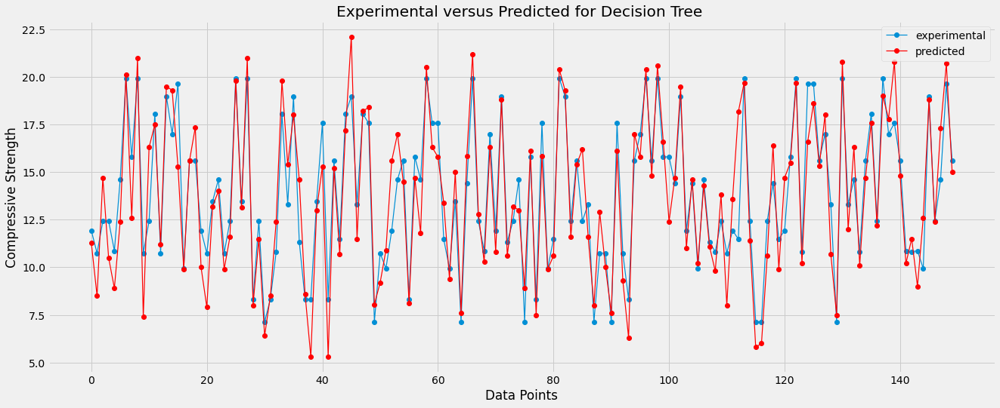

In [11]:
plt.figure(figsize=(20, 8))
plt.plot(np.arange(len(dtree_pred)), dtree_pred, marker='o', linewidth=1.2)
plt.plot(np.arange(len(y_test)), y_test, marker='o', linewidth=1.2, color='red')
plt.title('Experimental versus Predicted for Decision Tree ')
plt.xlabel('Data Points')
plt.ylabel('Compressive Strength')
plt.legend(['experimental', 'predicted'])
plt.savefig('opc_cwp_dtree_experimental_predicted.jpg');

In [28]:
# the residual between the actual value and the predicted value
dtree_residual = dtree_pred-y_test

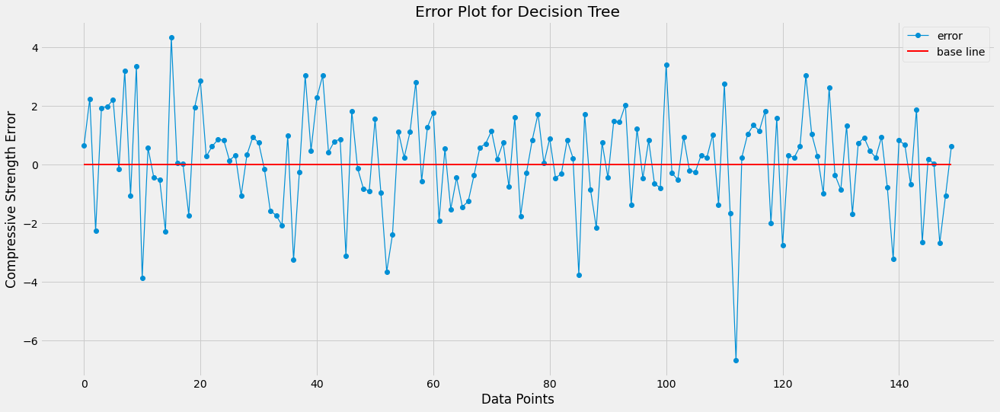

In [29]:
plt.figure(figsize=(20, 8))
plt.plot(np.arange(len(dtree_residual)), dtree_residual, marker='o', linewidth=1.2)
plt.plot(np.zeros(len(dtree_residual)), color='red', linewidth=2)
plt.title('Error Plot for Decision Tree')
plt.xlabel('Data Points')
plt.ylabel('Compressive Strength Error')
plt.legend(['error', 'base line'])
plt.savefig('opc_cwp_dtree_error_analysis.jpg');

###### SVR

In [15]:
from sklearn.svm import SVR
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

In [17]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.fit_transform(X_test)

In [20]:
import optuna
def objective(trial):
    epsilon = trial.suggest_float('epsilon', 0.1, 10, step=0.1)
    C = trial.suggest_int('C',1, 201, step=2)
    degree = trial.suggest_int('degree', 1, 20, step=1)
    kernel = trial.suggest_categorical('kernel', ['linear', 'poly', 'rbf', 'sigmoid'])
    gamma = trial.suggest_categorical('gamma', ['auto', 'scale'])
    svr_model = SVR(kernel=kernel, degree=degree, gamma=gamma, C=C, epsilon=epsilon)
    svr_model.fit(X_train_scaled, y_train)
    svr_pred = svr_model.predict(X_test_scaled)
    test_accuracy = r2_score(y_test, svr_pred)
    error = mean_squared_error(y_test, svr_pred)
    training_accuracy = svr_model.score(X_train_scaled, y_train)
    return test_accuracy, training_accuracy, error
study = optuna.create_study(directions=['maximize', 'maximize', 'minimize'])
study.optimize(objective, n_trials=10000)

[I 2023-01-08 00:31:12,644] A new study created in memory with name: no-name-bba14d46-fbb1-405a-ad9f-e78fb30c2648
[I 2023-01-08 00:31:12,747] Trial 0 finished with values: [-118161.03919583402, -105931.97239179266, 2047426.331514612] and parameters: {'epsilon': 0.1, 'C': 175, 'degree': 8, 'kernel': 'sigmoid', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:12,755] Trial 1 finished with values: [0.32966642319796935, 0.32621864583597004, 11.615055269723529] and parameters: {'epsilon': 8.5, 'C': 181, 'degree': 16, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:12,817] Trial 2 finished with values: [0.7984715811467344, 0.800086883109409, 3.4919386472743708] and parameters: {'epsilon': 2.4000000000000004, 'C': 127, 'degree': 6, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:12,836] Trial 3 finished with values: [0.13828533331660964, 0.150703308095691, 14.931168341601484] and parameters: {'epsilon': 9.0, 'C': 47, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00

[I 2023-01-08 00:31:14,072] Trial 35 finished with values: [-154.35836221174338, 0.6764877343486568, 2691.93730726105] and parameters: {'epsilon': 0.6, 'C': 85, 'degree': 15, 'kernel': 'poly', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:14,102] Trial 36 finished with values: [0.7962573516677828, 0.7977499426456609, 3.5303052138136293] and parameters: {'epsilon': 2.4000000000000004, 'C': 49, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:14,281] Trial 37 finished with values: [0.7871123231819643, 0.756059290445365, 3.6887636514958393] and parameters: {'epsilon': 0.9, 'C': 165, 'degree': 2, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:14,292] Trial 38 finished with values: [0.33006120461975785, 0.354318035304115, 11.608214782849203] and parameters: {'epsilon': 7.3, 'C': 69, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:14,303] Trial 39 finished with values: [0.23323610604928713, 0.23512520107513157, 13.285930043298677] and parame

[I 2023-01-08 00:31:15,611] Trial 71 finished with values: [0.6473235196191147, 0.6774334459350675, 6.110922910199563] and parameters: {'epsilon': 4.2, 'C': 135, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:15,681] Trial 72 finished with values: [0.8004457804584766, 0.804348353153362, 3.457731149824027] and parameters: {'epsilon': 2.2, 'C': 189, 'degree': 8, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:15,710] Trial 73 finished with values: [0.7560191263139311, 0.7688819953717496, 4.227524072624585] and parameters: {'epsilon': 2.9000000000000004, 'C': 201, 'degree': 8, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:15,719] Trial 74 finished with values: [0.4672832010886435, 0.5001454676513057, 9.230531300527353] and parameters: {'epsilon': 5.9, 'C': 199, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:15,731] Trial 75 finished with values: [0.33006120461975785, 0.354318035304115, 11.608214782849203] and parameters: 

[I 2023-01-08 00:31:16,946] Trial 107 finished with values: [0.721615893632414, 0.7286206088096017, 4.823638399702358] and parameters: {'epsilon': 4.6, 'C': 95, 'degree': 6, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:17,015] Trial 108 finished with values: [-202.02636198855777, 0.6555615263696213, 3517.8939222440736] and parameters: {'epsilon': 0.5, 'C': 27, 'degree': 14, 'kernel': 'poly', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:17,020] Trial 109 finished with values: [0.28041387764671644, 0.30135023581838316, 12.468467747555186] and parameters: {'epsilon': 7.8, 'C': 27, 'degree': 6, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:17,040] Trial 110 finished with values: [-23.23959720164486, -0.2463944717049371, 420.00620430817116] and parameters: {'epsilon': 7.9, 'C': 199, 'degree': 16, 'kernel': 'poly', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:17,058] Trial 111 finished with values: [0.739110923483154, 0.7415260867214961, 4.520497179130887] and parameters: {'epsi

[I 2023-01-08 00:31:19,031] Trial 143 finished with values: [-47633.63595980242, -42570.98362897911, 825378.5108987082] and parameters: {'epsilon': 4.3999999999999995, 'C': 111, 'degree': 2, 'kernel': 'sigmoid', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:19,049] Trial 144 finished with values: [0.7152007042266375, 0.7347586854182089, 4.934796160692519] and parameters: {'epsilon': 3.4000000000000004, 'C': 61, 'degree': 8, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:19,087] Trial 145 finished with values: [0.7871095166689592, 0.7560406177487683, 3.6888122807228343] and parameters: {'epsilon': 0.9, 'C': 11, 'degree': 12, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:19,234] Trial 146 finished with values: [0.7866348937207447, 0.7555356565295525, 3.697036203806161] and parameters: {'epsilon': 0.8, 'C': 107, 'degree': 14, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:19,283] Trial 147 finished with values: [0.8417749677329048, 0.8193901429488083, 2.741608

[I 2023-01-08 00:31:22,037] Trial 178 finished with values: [0.7871123231819643, 0.756059290445365, 3.6887636514958393] and parameters: {'epsilon': 0.9, 'C': 165, 'degree': 2, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:22,070] Trial 179 finished with values: [0.8004457804584766, 0.804348353153362, 3.457731149824027] and parameters: {'epsilon': 2.2, 'C': 189, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:22,159] Trial 180 finished with values: [0.8312347361720015, 0.8318077503741841, 2.9242423993190276] and parameters: {'epsilon': 0.5, 'C': 105, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:22,298] Trial 181 finished with values: [0.8212691952185514, 0.832844671242834, 3.096918083445173] and parameters: {'epsilon': 0.5, 'C': 199, 'degree': 5, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:22,367] Trial 182 finished with values: [0.8207516900055629, 0.8268372894384638, 3.105885039389565] and parameters: {'epsilon':

[I 2023-01-08 00:31:24,472] Trial 214 finished with values: [0.04039824311370721, 0.047489071868862864, 16.627285024765786] and parameters: {'epsilon': 9.700000000000001, 'C': 105, 'degree': 7, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:25,012] Trial 215 finished with values: [0.5927503443034723, 0.6576349605345235, 7.05652741140852] and parameters: {'epsilon': 1.7000000000000002, 'C': 127, 'degree': 6, 'kernel': 'poly', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:25,054] Trial 216 finished with values: [0.8213340736537265, 0.8267682032606023, 3.0957939168564015] and parameters: {'epsilon': 1.7000000000000002, 'C': 105, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:25,104] Trial 217 finished with values: [0.8206974806627096, 0.8272013124218803, 3.106824339665078] and parameters: {'epsilon': 1.7000000000000002, 'C': 187, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:25,439] Trial 218 finished with values: [0.7831499095658622, 0.7

[I 2023-01-08 00:31:27,313] Trial 249 finished with values: [0.8314782869173674, 0.8313917865662355, 2.92002232819876] and parameters: {'epsilon': 0.5, 'C': 101, 'degree': 19, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:27,461] Trial 250 finished with values: [0.8263086355065773, 0.8365526493327478, 3.0095983078893394] and parameters: {'epsilon': 0.9, 'C': 127, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:27,532] Trial 251 finished with values: [0.8214324638315691, 0.8328612488853887, 3.0940890830345733] and parameters: {'epsilon': 0.5, 'C': 197, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:27,581] Trial 252 finished with values: [0.8367090408067015, 0.829203682460971, 2.829387608964222] and parameters: {'epsilon': 0.9, 'C': 33, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:27,665] Trial 253 finished with values: [0.8308817887054463, 0.8322177455000372, 2.9303580176816113] and parameters: {'epsilon': 0

[I 2023-01-08 00:31:29,554] Trial 285 finished with values: [0.8267573090716795, 0.8313669534762711, 3.001824016943646] and parameters: {'epsilon': 1.5000000000000002, 'C': 119, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:29,615] Trial 286 finished with values: [0.8263086355065773, 0.8365526493327478, 3.0095983078893394] and parameters: {'epsilon': 0.9, 'C': 127, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:29,625] Trial 287 finished with values: [0.44142225541584934, 0.4723868073663877, 9.678631058188056] and parameters: {'epsilon': 6.1, 'C': 127, 'degree': 11, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:29,712] Trial 288 finished with values: [0.8312347361720015, 0.8318077503741841, 2.9242423993190276] and parameters: {'epsilon': 0.5, 'C': 105, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:29,772] Trial 289 finished with values: [0.8297567399415794, 0.8329506665290655, 2.9498520487516204] and parame

[I 2023-01-08 00:31:31,849] Trial 321 finished with values: [0.8375154257255806, 0.8266134656758201, 2.815415154464574] and parameters: {'epsilon': 0.5, 'C': 41, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:31,939] Trial 322 finished with values: [0.8235284389516153, 0.8337931028560649, 3.0577715424759684] and parameters: {'epsilon': 0.7000000000000001, 'C': 141, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:31,984] Trial 323 finished with values: [0.8351663480644043, 0.8310093402454211, 2.8561182727502525] and parameters: {'epsilon': 0.9, 'C': 49, 'degree': 11, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:32,041] Trial 324 finished with values: [0.8323853748702089, 0.8302901830636613, 2.904304964379663] and parameters: {'epsilon': 0.5, 'C': 85, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:32,093] Trial 325 finished with values: [0.8391604935639241, 0.8237618531456503, 2.7869106090769455] and paramet

[I 2023-01-08 00:31:33,817] Trial 357 finished with values: [0.8377762945139647, 0.8264291909481538, 2.8108950088235294] and parameters: {'epsilon': 0.5, 'C': 39, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:34,047] Trial 358 finished with values: [0.7831604634547296, 0.7531475071687831, 3.757238617898397] and parameters: {'epsilon': 0.5, 'C': 127, 'degree': 11, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:34,097] Trial 359 finished with values: [0.8373132271444419, 0.8267238612165718, 2.818918705199106] and parameters: {'epsilon': 0.5, 'C': 43, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:34,177] Trial 360 finished with values: [0.830440256423389, 0.8326410094858011, 2.9380085696410236] and parameters: {'epsilon': 0.5, 'C': 119, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:34,247] Trial 361 finished with values: [0.8297567399415794, 0.8329506665290655, 2.9498520487516204] and parameters: {'epsil

[I 2023-01-08 00:31:36,367] Trial 394 finished with values: [0.830440256423389, 0.8326410094858011, 2.9380085696410236] and parameters: {'epsilon': 0.5, 'C': 119, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:36,430] Trial 395 finished with values: [0.8367090408067015, 0.829203682460971, 2.829387608964222] and parameters: {'epsilon': 0.9, 'C': 33, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:36,442] Trial 396 finished with values: [0.23664161143390572, 0.25482466523739766, 13.226921909687956] and parameters: {'epsilon': 8.2, 'C': 127, 'degree': 19, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:36,507] Trial 397 finished with values: [0.8297567399415794, 0.8329506665290655, 2.9498520487516204] and parameters: {'epsilon': 0.5, 'C': 127, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:36,560] Trial 398 finished with values: [0.8263086355065773, 0.8365526493327478, 3.0095983078893394] and parameters: {'epsilon': 

[I 2023-01-08 00:31:39,330] Trial 431 finished with values: [0.32058222862896935, 0.3441857344061243, 11.772459621305067] and parameters: {'epsilon': 7.4, 'C': 39, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:39,553] Trial 432 finished with values: [0.783158303114348, 0.7531459300883945, 3.7572760507136436] and parameters: {'epsilon': 0.5, 'C': 117, 'degree': 12, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:39,827] Trial 433 finished with values: [0.6072839547871995, 0.6621007450163205, 6.804699523206254] and parameters: {'epsilon': 0.5, 'C': 127, 'degree': 6, 'kernel': 'poly', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:39,836] Trial 434 finished with values: [0.26980867814637866, 0.29006478742250363, 12.652226972224376] and parameters: {'epsilon': 7.9, 'C': 127, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:39,847] Trial 435 finished with values: [0.17685827287491973, 0.19147853827066452, 14.262804350313916] and parameters: {'

[I 2023-01-08 00:31:41,783] Trial 467 finished with values: [0.830440256423389, 0.8326410094858011, 2.9380085696410236] and parameters: {'epsilon': 0.5, 'C': 119, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:41,824] Trial 468 finished with values: [0.8403129515920923, 0.823987343493353, 2.7669416501042057] and parameters: {'epsilon': 0.9, 'C': 15, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:41,912] Trial 469 finished with values: [0.8297567399415794, 0.8329506665290655, 2.9498520487516204] and parameters: {'epsilon': 0.5, 'C': 127, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:41,982] Trial 470 finished with values: [0.8212691952185514, 0.832844671242834, 3.096918083445173] and parameters: {'epsilon': 0.5, 'C': 199, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:42,046] Trial 471 finished with values: [0.830440256423389, 0.8326410094858011, 2.9380085696410236] and parameters: {'epsilon': 

[I 2023-01-08 00:31:44,223] Trial 504 finished with values: [0.8297567399415794, 0.8329506665290655, 2.9498520487516204] and parameters: {'epsilon': 0.5, 'C': 127, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:44,287] Trial 505 finished with values: [0.8271878503043963, 0.8375554783017025, 2.99436390993579] and parameters: {'epsilon': 0.9, 'C': 199, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:44,329] Trial 506 finished with values: [0.8403129515920923, 0.823987343493353, 2.7669416501042057] and parameters: {'epsilon': 0.9, 'C': 15, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:44,503] Trial 507 finished with values: [0.7871117327207391, 0.7560631078256772, 3.6887738825807834] and parameters: {'epsilon': 0.9, 'C': 141, 'degree': 5, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:44,554] Trial 508 finished with values: [0.8434431918717485, 0.8199695999263719, 2.712703111093262] and parameters: {'epsilon

[I 2023-01-08 00:31:46,286] Trial 541 finished with values: [-5878.165832877217, -5260.097419307672, 101869.93230223669] and parameters: {'epsilon': 2.7, 'C': 39, 'degree': 18, 'kernel': 'sigmoid', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:46,333] Trial 542 finished with values: [0.8353095800200346, 0.8323132765093801, 2.8536364530434524] and parameters: {'epsilon': 0.9, 'C': 65, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:46,371] Trial 543 finished with values: [0.82949522519569, 0.8234437321752783, 2.954383387077003] and parameters: {'epsilon': 1.4000000000000001, 'C': 17, 'degree': 7, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:46,562] Trial 544 finished with values: [0.7831589478059506, 0.7531425851632245, 3.7572648799639516] and parameters: {'epsilon': 0.5, 'C': 119, 'degree': 20, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:46,606] Trial 545 finished with values: [0.8422247836612574, 0.8208890500733902, 2.7338148071140007] and 

[I 2023-01-08 00:31:48,748] Trial 577 finished with values: [0.09768519144111076, 0.10785241242451715, 15.634658228073047] and parameters: {'epsilon': 9.3, 'C': 119, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:48,827] Trial 578 finished with values: [0.8219887069814161, 0.8330689428519413, 3.0844509041450388] and parameters: {'epsilon': 0.5, 'C': 191, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:49,049] Trial 579 finished with values: [0.7871107196704344, 0.7560404285704349, 3.6887914359835774] and parameters: {'epsilon': 0.9, 'C': 199, 'degree': 11, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:49,122] Trial 580 finished with values: [0.8297567399415794, 0.8329506665290655, 2.9498520487516204] and parameters: {'epsilon': 0.5, 'C': 127, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:49,212] Trial 581 finished with values: [0.8284620500229045, 0.8333315237505562, 2.9722854990261887] and parameters:

[I 2023-01-08 00:31:51,498] Trial 614 finished with values: [0.830440256423389, 0.8326410094858011, 2.9380085696410236] and parameters: {'epsilon': 0.5, 'C': 119, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:51,563] Trial 615 finished with values: [0.8271878503043963, 0.8375554783017025, 2.99436390993579] and parameters: {'epsilon': 0.9, 'C': 199, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:51,642] Trial 616 finished with values: [0.8266929959108957, 0.8368653353664314, 3.002938388866709] and parameters: {'epsilon': 0.9, 'C': 149, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:51,722] Trial 617 finished with values: [0.8284620500229045, 0.8333315237505562, 2.9722854990261887] and parameters: {'epsilon': 0.5, 'C': 141, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:51,773] Trial 618 finished with values: [0.8406135968027352, 0.8218537656128044, 2.761732287394293] and parameters: {'epsilon

[I 2023-01-08 00:31:54,097] Trial 651 finished with values: [0.8377762945139647, 0.8264291909481538, 2.8108950088235294] and parameters: {'epsilon': 0.5, 'C': 39, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:54,167] Trial 652 finished with values: [-2597.9357297190377, -2968.9882368224557, 45032.478138956365] and parameters: {'epsilon': 0.5, 'C': 33, 'degree': 4, 'kernel': 'sigmoid', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:54,214] Trial 653 finished with values: [0.8360889594171195, 0.8298403939300222, 2.840131930688461] and parameters: {'epsilon': 0.9, 'C': 39, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:54,256] Trial 654 finished with values: [0.8386760528590389, 0.8258712887011666, 2.7953046471452603] and parameters: {'epsilon': 0.9, 'C': 19, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:54,322] Trial 655 finished with values: [0.8271878503043963, 0.8375554783017025, 2.99436390993579] and parameters: {'eps

[I 2023-01-08 00:31:56,364] Trial 688 finished with values: [0.8403129515920923, 0.823987343493353, 2.7669416501042057] and parameters: {'epsilon': 0.9, 'C': 15, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:56,432] Trial 689 finished with values: [0.8381107599703873, 0.8264037905081781, 2.8050996333618152] and parameters: {'epsilon': 0.9, 'C': 21, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:56,612] Trial 690 finished with values: [0.7747157874126899, 0.7608097109765779, 3.9035618551008935] and parameters: {'epsilon': 2.0, 'C': 199, 'degree': 20, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:56,703] Trial 691 finished with values: [0.8306539493562397, 0.8252998341087687, 2.934305853095552] and parameters: {'epsilon': 0.30000000000000004, 'C': 65, 'degree': 7, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:56,714] Trial 692 finished with values: [0.5511588446340898, 0.589486676796096, 7.777194828540207] and param

[I 2023-01-08 00:31:58,793] Trial 724 finished with values: [0.8367090408067015, 0.829203682460971, 2.829387608964222] and parameters: {'epsilon': 0.9, 'C': 33, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:58,848] Trial 725 finished with values: [0.826494146000327, 0.8366827659596368, 3.006383916260179] and parameters: {'epsilon': 0.9, 'C': 135, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:58,912] Trial 726 finished with values: [0.8353095800200346, 0.8323132765093801, 2.8536364530434524] and parameters: {'epsilon': 0.9, 'C': 65, 'degree': 11, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:31:58,941] Trial 727 finished with values: [0.7717640009820744, 0.7794986142548033, 3.954708274917104] and parameters: {'epsilon': 2.8000000000000003, 'C': 65, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:31:59,008] Trial 728 finished with values: [0.8271878503043963, 0.8375554783017025, 2.99436390993579] and parameters: 

[I 2023-01-08 00:32:00,765] Trial 760 finished with values: [0.8367090408067015, 0.829203682460971, 2.829387608964222] and parameters: {'epsilon': 0.9, 'C': 33, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:00,775] Trial 761 finished with values: [0.08370132141212505, 0.09310752153497048, 15.876960611382225] and parameters: {'epsilon': 9.4, 'C': 77, 'degree': 11, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:00,823] Trial 762 finished with values: [0.835179823638508, 0.831693039143433, 2.855884777751014] and parameters: {'epsilon': 0.9, 'C': 57, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:00,871] Trial 763 finished with values: [0.8370150431014836, 0.8287671616446519, 2.824085422575898] and parameters: {'epsilon': 0.9, 'C': 31, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:00,952] Trial 764 finished with values: [0.8353095800200346, 0.8323132765093801, 2.8536364530434524] and parameters: {'epsilon': 0.9

[I 2023-01-08 00:32:02,538] Trial 797 finished with values: [0.647844815548736, 0.6425508367408999, 6.101890271459731] and parameters: {'epsilon': 6.3, 'C': 31, 'degree': 12, 'kernel': 'sigmoid', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:02,606] Trial 798 finished with values: [-31.742099298316496, 0.6675310101551564, 567.3314095513916] and parameters: {'epsilon': 0.9, 'C': 21, 'degree': 12, 'kernel': 'poly', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:02,678] Trial 799 finished with values: [0.8263086355065773, 0.8365526493327478, 3.0095983078893394] and parameters: {'epsilon': 0.9, 'C': 127, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:02,809] Trial 800 finished with values: [0.8367090408067015, 0.829203682460971, 2.829387608964222] and parameters: {'epsilon': 0.9, 'C': 33, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:02,854] Trial 801 finished with values: [0.8367090408067015, 0.829203682460971, 2.829387608964222] and parameters: {'epsil

[I 2023-01-08 00:32:04,626] Trial 834 finished with values: [0.5423847998854749, 0.5802146892715183, 7.929225128410278] and parameters: {'epsilon': 5.2, 'C': 31, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:04,704] Trial 835 finished with values: [0.8424209473355285, 0.8270682646730729, 2.730415824879752] and parameters: {'epsilon': 0.7000000000000001, 'C': 33, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:04,802] Trial 836 finished with values: [-5.164632629639351, 0.714051579031536, 106.81629443716275] and parameters: {'epsilon': 0.9, 'C': 65, 'degree': 10, 'kernel': 'poly', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:04,839] Trial 837 finished with values: [0.8141223074589282, 0.818611279084142, 3.2207541841676783] and parameters: {'epsilon': 1.9000000000000001, 'C': 65, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:04,925] Trial 838 finished with values: [0.823642368554267, 0.8351810800568167, 3.0557974527429574] a

[I 2023-01-08 00:32:06,999] Trial 870 finished with values: [0.8360889594171195, 0.8298403939300222, 2.840131930688461] and parameters: {'epsilon': 0.9, 'C': 39, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:07,048] Trial 871 finished with values: [0.8353095800200346, 0.8323132765093801, 2.8536364530434524] and parameters: {'epsilon': 0.9, 'C': 65, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:07,058] Trial 872 finished with values: [0.42382223761244076, 0.45345935962429496, 9.983591434050417] and parameters: {'epsilon': 6.3, 'C': 39, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:07,122] Trial 873 finished with values: [0.8266693613774088, 0.8369025292207539, 3.003347910964697] and parameters: {'epsilon': 0.9, 'C': 155, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:07,202] Trial 874 finished with values: [0.8348105165482874, 0.831729806911344, 2.862283863837192] and parameters: {'epsilon': 0

[I 2023-01-08 00:32:08,987] Trial 907 finished with values: [0.7871148339689253, 0.7560613239109426, 3.6887201463957937] and parameters: {'epsilon': 0.9, 'C': 35, 'degree': 9, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:09,036] Trial 908 finished with values: [0.8353095800200346, 0.8323132765093801, 2.8536364530434524] and parameters: {'epsilon': 0.9, 'C': 65, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:09,120] Trial 909 finished with values: [0.7871137201836571, 0.7560599840383702, 3.6887394452611577] and parameters: {'epsilon': 0.9, 'C': 61, 'degree': 8, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:09,180] Trial 910 finished with values: [-21708.779288503785, -19465.768226069296, 376171.3496919773] and parameters: {'epsilon': 0.9, 'C': 75, 'degree': 12, 'kernel': 'sigmoid', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:09,232] Trial 911 finished with values: [0.8424209473355285, 0.8270682646730729, 2.730415824879752] and parameters: 

[I 2023-01-08 00:32:10,943] Trial 943 finished with values: [0.7871099362326628, 0.7560461163193228, 3.688805010826511] and parameters: {'epsilon': 0.9, 'C': 41, 'degree': 11, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:10,992] Trial 944 finished with values: [0.8370150431014836, 0.8287671616446519, 2.824085422575898] and parameters: {'epsilon': 0.9, 'C': 31, 'degree': 8, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:11,037] Trial 945 finished with values: [0.8367090408067015, 0.829203682460971, 2.829387608964222] and parameters: {'epsilon': 0.9, 'C': 33, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:11,119] Trial 946 finished with values: [0.4953484150005265, 0.746370106076711, 8.74423757748533] and parameters: {'epsilon': 0.9, 'C': 65, 'degree': 7, 'kernel': 'poly', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:11,188] Trial 947 finished with values: [0.8337873084830644, 0.8342093586550918, 2.8800132729571866] and parameters: {'epsilon': 0.

[I 2023-01-08 00:32:13,082] Trial 979 finished with values: [0.8271878503043963, 0.8375554783017025, 2.99436390993579] and parameters: {'epsilon': 0.9, 'C': 199, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:13,157] Trial 980 finished with values: [0.8353095800200346, 0.8323132765093801, 2.8536364530434524] and parameters: {'epsilon': 0.9, 'C': 65, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:13,205] Trial 981 finished with values: [0.8337873084830644, 0.8342093586550918, 2.8800132729571866] and parameters: {'epsilon': 0.9, 'C': 77, 'degree': 18, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:13,256] Trial 982 finished with values: [0.8353095800200346, 0.8323132765093801, 2.8536364530434524] and parameters: {'epsilon': 0.9, 'C': 65, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:13,304] Trial 983 finished with values: [0.8347457617747097, 0.8333628915667023, 2.8634058877072657] and parameters: {'epsilon'

[I 2023-01-08 00:32:15,183] Trial 1015 finished with values: [0.8337873084830644, 0.8342093586550918, 2.8800132729571866] and parameters: {'epsilon': 0.9, 'C': 77, 'degree': 19, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:15,232] Trial 1016 finished with values: [0.8367090408067015, 0.829203682460971, 2.829387608964222] and parameters: {'epsilon': 0.9, 'C': 33, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:15,283] Trial 1017 finished with values: [0.8347457617747097, 0.8333628915667023, 2.8634058877072657] and parameters: {'epsilon': 0.9, 'C': 71, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:15,333] Trial 1018 finished with values: [0.845907484435043, 0.8232199365161532, 2.670003632335259] and parameters: {'epsilon': 0.7000000000000001, 'C': 21, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:15,343] Trial 1019 finished with values: [0.43237145155890433, 0.4626637972803129, 9.835456839667431] and paramet

[I 2023-01-08 00:32:17,157] Trial 1051 finished with values: [0.8310467204473486, 0.8253283077562938, 2.92750019977688] and parameters: {'epsilon': 0.2, 'C': 77, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:17,210] Trial 1052 finished with values: [0.8337873084830644, 0.8342093586550918, 2.8800132729571866] and parameters: {'epsilon': 0.9, 'C': 77, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:17,274] Trial 1053 finished with values: [0.8337873084830644, 0.8342093586550918, 2.8800132729571866] and parameters: {'epsilon': 0.9, 'C': 77, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:17,326] Trial 1054 finished with values: [0.8365688094857625, 0.8294839203532656, 2.831817435843882] and parameters: {'epsilon': 0.9, 'C': 35, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:17,336] Trial 1055 finished with values: [0.32058222862896935, 0.3441857344061243, 11.772459621305067] and parameters: {'epsilo

[I 2023-01-08 00:32:19,832] Trial 1087 finished with values: [0.8353095800200346, 0.8323132765093801, 2.8536364530434524] and parameters: {'epsilon': 0.9, 'C': 65, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:19,904] Trial 1088 finished with values: [0.845907484435043, 0.8232199365161532, 2.670003632335259] and parameters: {'epsilon': 0.7000000000000001, 'C': 21, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:19,919] Trial 1089 finished with values: [0.4672832010886435, 0.5001454676513057, 9.230531300527353] and parameters: {'epsilon': 5.9, 'C': 77, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:19,970] Trial 1090 finished with values: [0.8337873084830644, 0.8342093586550918, 2.8800132729571866] and parameters: {'epsilon': 0.9, 'C': 77, 'degree': 7, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:20,020] Trial 1091 finished with values: [0.8337873084830644, 0.8342093586550918, 2.8800132729571866] and para

[I 2023-01-08 00:32:22,067] Trial 1123 finished with values: [-21293.496825153074, 0.6365766134391556, 368975.6356008271] and parameters: {'epsilon': 0.9, 'C': 75, 'degree': 20, 'kernel': 'poly', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:22,105] Trial 1124 finished with values: [0.830713139000792, 0.8057924287858662, 2.933280257755169] and parameters: {'epsilon': 0.9, 'C': 3, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:22,179] Trial 1125 finished with values: [0.8365688094857625, 0.8294839203532656, 2.831817435843882] and parameters: {'epsilon': 0.9, 'C': 35, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:22,241] Trial 1126 finished with values: [0.7871148339689253, 0.7560613239109426, 3.6887201463957937] and parameters: {'epsilon': 0.9, 'C': 35, 'degree': 18, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:22,303] Trial 1127 finished with values: [0.8353095800200346, 0.8323132765093801, 2.8536364530434524] and parameters: {'ep

[I 2023-01-08 00:32:24,549] Trial 1159 finished with values: [-19457.316866916914, -17446.951446209867, 337159.63765870075] and parameters: {'epsilon': 0.9, 'C': 71, 'degree': 9, 'kernel': 'sigmoid', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:24,596] Trial 1160 finished with values: [0.8360889594171195, 0.8298403939300222, 2.840131930688461] and parameters: {'epsilon': 0.9, 'C': 39, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:24,720] Trial 1161 finished with values: [0.7871139525399039, 0.7560614986862515, 3.6887354191602117] and parameters: {'epsilon': 0.9, 'C': 77, 'degree': 9, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:24,766] Trial 1162 finished with values: [0.8381107599703873, 0.8264037905081781, 2.8050996333618152] and parameters: {'epsilon': 0.9, 'C': 21, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:24,813] Trial 1163 finished with values: [0.845907484435043, 0.8232199365161532, 2.670003632335259] and parameters:

[I 2023-01-08 00:32:26,567] Trial 1195 finished with values: [0.7871139525399039, 0.7560614986862515, 3.6887354191602117] and parameters: {'epsilon': 0.9, 'C': 77, 'degree': 18, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:26,699] Trial 1196 finished with values: [0.7871139525399039, 0.7560614986862515, 3.6887354191602117] and parameters: {'epsilon': 0.9, 'C': 77, 'degree': 20, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:26,747] Trial 1197 finished with values: [0.8337873084830644, 0.8342093586550918, 2.8800132729571866] and parameters: {'epsilon': 0.9, 'C': 77, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:26,798] Trial 1198 finished with values: [0.8337873084830644, 0.8342093586550918, 2.8800132729571866] and parameters: {'epsilon': 0.9, 'C': 77, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:26,839] Trial 1199 finished with values: [0.8386625254208635, 0.8122590941521064, 2.7955390408076135] and parameter

[I 2023-01-08 00:32:28,756] Trial 1231 finished with values: [0.833645828289103, 0.8378559790426948, 2.8824647394050884] and parameters: {'epsilon': 1.2000000000000002, 'C': 199, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:28,796] Trial 1232 finished with values: [-22878.78600496724, -20517.28862411812, 396444.37963999715] and parameters: {'epsilon': 0.7000000000000001, 'C': 77, 'degree': 11, 'kernel': 'sigmoid', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:28,841] Trial 1233 finished with values: [0.8367090408067015, 0.829203682460971, 2.829387608964222] and parameters: {'epsilon': 0.9, 'C': 33, 'degree': 7, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:28,918] Trial 1234 finished with values: [0.8337873084830644, 0.8342093586550918, 2.8800132729571866] and parameters: {'epsilon': 0.9, 'C': 77, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:29,028] Trial 1235 finished with values: [0.7871139525399039, 0.7560614986862515, 3.688735

[I 2023-01-08 00:32:30,912] Trial 1267 finished with values: [0.8360889594171195, 0.8298403939300222, 2.840131930688461] and parameters: {'epsilon': 0.9, 'C': 39, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:30,966] Trial 1268 finished with values: [0.8337873084830644, 0.8342093586550918, 2.8800132729571866] and parameters: {'epsilon': 0.9, 'C': 77, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:30,974] Trial 1269 finished with values: [0.3397752749746662, 0.3645766816720717, 11.439896399329582] and parameters: {'epsilon': 7.2, 'C': 199, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:31,032] Trial 1270 finished with values: [0.8346410875190259, 0.8318538400108637, 2.8652196074837466] and parameters: {'epsilon': 0.7000000000000001, 'C': 77, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:31,102] Trial 1271 finished with values: [-28.502330440549482, 0.6928896424220292, 511.19503857678615] and 

[I 2023-01-08 00:32:33,175] Trial 1303 finished with values: [-177.64574991663525, 0.6839859140838311, 3095.4443142801556] and parameters: {'epsilon': 0.9, 'C': 77, 'degree': 14, 'kernel': 'poly', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:33,225] Trial 1304 finished with values: [0.8370150431014836, 0.8287671616446519, 2.824085422575898] and parameters: {'epsilon': 0.9, 'C': 31, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:33,275] Trial 1305 finished with values: [0.8432964530655261, 0.8265484965755606, 2.71524569497011] and parameters: {'epsilon': 0.7000000000000001, 'C': 31, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:33,300] Trial 1306 finished with values: [0.7682640656449999, 0.7738880684672255, 4.0153526224291545] and parameters: {'epsilon': 2.9000000000000004, 'C': 41, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:33,366] Trial 1307 finished with values: [0.8234931243570236, 0.8353102048800604, 3.058383448

[I 2023-01-08 00:32:35,193] Trial 1339 finished with values: [-0.021258099406253672, -0.1483367325837357, 17.69562152301321] and parameters: {'epsilon': 8.9, 'C': 41, 'degree': 12, 'kernel': 'poly', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:35,267] Trial 1340 finished with values: [-152812.1204126013, -136982.35564966788, 2647835.198706555] and parameters: {'epsilon': 0.9, 'C': 199, 'degree': 7, 'kernel': 'sigmoid', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:35,335] Trial 1341 finished with values: [0.8337873084830644, 0.8342093586550918, 2.8800132729571866] and parameters: {'epsilon': 0.9, 'C': 77, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:35,414] Trial 1342 finished with values: [0.8337873084830644, 0.8342093586550918, 2.8800132729571866] and parameters: {'epsilon': 0.9, 'C': 77, 'degree': 19, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:35,464] Trial 1343 finished with values: [0.8337873084830644, 0.8342093586550918, 2.8800132729571866] and paramet

[I 2023-01-08 00:32:37,277] Trial 1375 finished with values: [0.8271878503043963, 0.8375554783017025, 2.99436390993579] and parameters: {'epsilon': 0.9, 'C': 199, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:37,325] Trial 1376 finished with values: [0.8337873084830644, 0.8342093586550918, 2.8800132729571866] and parameters: {'epsilon': 0.9, 'C': 77, 'degree': 7, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:37,406] Trial 1377 finished with values: [0.8237685495197908, 0.8350033849863696, 3.05361108025728] and parameters: {'epsilon': 0.7000000000000001, 'C': 179, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:37,462] Trial 1378 finished with values: [0.8432964530655261, 0.8265484965755606, 2.71524569497011] and parameters: {'epsilon': 0.7000000000000001, 'C': 31, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:37,694] Trial 1379 finished with values: [0.7858421352435019, 0.7594712725760618, 3.71077254918310

[I 2023-01-08 00:32:39,592] Trial 1411 finished with values: [0.8341323688949176, 0.8339409928563222, 2.874034315772634] and parameters: {'epsilon': 0.9, 'C': 75, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:39,666] Trial 1412 finished with values: [0.833313698544964, 0.8323509851438768, 2.888219643334113] and parameters: {'epsilon': 1.2000000000000002, 'C': 49, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:39,681] Trial 1413 finished with values: [0.28041387764671644, 0.30135023581838316, 12.468467747555186] and parameters: {'epsilon': 7.8, 'C': 75, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:39,747] Trial 1414 finished with values: [0.8236533043717443, 0.8336991867576999, 3.055607964809167] and parameters: {'epsilon': 0.7000000000000001, 'C': 137, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:39,797] Trial 1415 finished with values: [0.8337873084830644, 0.8342093586550918, 2.88001327

[I 2023-01-08 00:32:41,457] Trial 1446 finished with values: [0.8346410875190259, 0.8318538400108637, 2.8652196074837466] and parameters: {'epsilon': 0.7000000000000001, 'C': 77, 'degree': 13, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:41,547] Trial 1447 finished with values: [0.8344818529184892, 0.8336703804252878, 2.867978709444458] and parameters: {'epsilon': 0.9, 'C': 73, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:41,593] Trial 1448 finished with values: [0.8313350322985866, 0.8302763780103926, 2.9225045405962358] and parameters: {'epsilon': 1.2000000000000002, 'C': 41, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:41,688] Trial 1449 finished with values: [0.8271878503043963, 0.8375554783017025, 2.99436390993579] and parameters: {'epsilon': 0.9, 'C': 199, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:41,814] Trial 1450 finished with values: [0.8313350322985866, 0.8302763780103926, 2.922504540596

[I 2023-01-08 00:32:43,717] Trial 1481 finished with values: [0.833645828289103, 0.8378559790426948, 2.8824647394050884] and parameters: {'epsilon': 1.2000000000000002, 'C': 199, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:43,783] Trial 1482 finished with values: [-139.8431170548849, 0.7010755815855378, 2440.4276401564753] and parameters: {'epsilon': 0.7000000000000001, 'C': 149, 'degree': 14, 'kernel': 'poly', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:43,854] Trial 1483 finished with values: [0.8234931243570236, 0.8353102048800604, 3.058383448222907] and parameters: {'epsilon': 0.7000000000000001, 'C': 199, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:43,927] Trial 1484 finished with values: [0.8402308658172389, 0.8095865074653095, 2.7683639730263665] and parameters: {'epsilon': 0.7000000000000001, 'C': 5, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:43,989] Trial 1485 finished with values: [0.833645828289103, 

[I 2023-01-08 00:32:45,997] Trial 1516 finished with values: [0.8265626949693785, 0.8321747745321895, 3.0051961493158252] and parameters: {'epsilon': 0.4, 'C': 173, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:46,057] Trial 1517 finished with values: [0.826596280586501, 0.8367248843797159, 3.004614202039655] and parameters: {'epsilon': 0.9, 'C': 139, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:46,116] Trial 1518 finished with values: [0.833645828289103, 0.8378559790426948, 2.8824647394050884] and parameters: {'epsilon': 1.2000000000000002, 'C': 199, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:46,181] Trial 1519 finished with values: [0.8367090408067015, 0.829203682460971, 2.829387608964222] and parameters: {'epsilon': 0.9, 'C': 33, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:46,248] Trial 1520 finished with values: [0.8271878503043963, 0.8375554783017025, 2.99436390993579] and paramet

[I 2023-01-08 00:32:48,451] Trial 1552 finished with values: [0.8323206770035395, 0.836281497633488, 2.9054260022079985] and parameters: {'epsilon': 1.2000000000000002, 'C': 121, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:48,506] Trial 1553 finished with values: [0.8349344769029168, 0.8314056091756036, 2.8601359684906047] and parameters: {'epsilon': 0.7000000000000001, 'C': 71, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:48,578] Trial 1554 finished with values: [0.8234931243570236, 0.8353102048800604, 3.058383448222907] and parameters: {'epsilon': 0.7000000000000001, 'C': 199, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:48,652] Trial 1555 finished with values: [0.8365688094857625, 0.8294839203532656, 2.831817435843882] and parameters: {'epsilon': 0.9, 'C': 35, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:48,706] Trial 1556 finished with values: [0.8370150431014836, 0.82876716164465

[I 2023-01-08 00:32:51,008] Trial 1587 finished with values: [0.3966006658416854, 0.7608540307999443, 10.4552671363992] and parameters: {'epsilon': 1.2000000000000002, 'C': 165, 'degree': 7, 'kernel': 'poly', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:51,254] Trial 1588 finished with values: [0.7858421352435019, 0.7594712725760618, 3.7107725491831087] and parameters: {'epsilon': 1.2000000000000002, 'C': 199, 'degree': 9, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:51,303] Trial 1589 finished with values: [0.8349555857202793, 0.8330282605969684, 2.8597702101744047] and parameters: {'epsilon': 0.9, 'C': 69, 'degree': 18, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:51,353] Trial 1590 finished with values: [0.832340889904711, 0.8363040720121674, 2.9050757676794103] and parameters: {'epsilon': 1.2000000000000002, 'C': 125, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:51,427] Trial 1591 finished with values: [0.8348881252504883, 0.831571567005

[I 2023-01-08 00:32:53,297] Trial 1622 finished with values: [0.833645828289103, 0.8378559790426948, 2.8824647394050884] and parameters: {'epsilon': 1.2000000000000002, 'C': 199, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:53,372] Trial 1623 finished with values: [0.8271878503043963, 0.8375554783017025, 2.99436390993579] and parameters: {'epsilon': 0.9, 'C': 199, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:53,440] Trial 1624 finished with values: [0.8308724051081886, 0.8286052065906395, 2.930520609866381] and parameters: {'epsilon': 1.2000000000000002, 'C': 29, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:53,497] Trial 1625 finished with values: [0.832505135973787, 0.8363415040035795, 2.9022298306173684] and parameters: {'epsilon': 1.2000000000000002, 'C': 113, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:53,540] Trial 1626 finished with values: [0.8309177394444325, 0.829447061497727,

[I 2023-01-08 00:32:55,243] Trial 1658 finished with values: [0.8268288257040808, 0.8371864163924412, 3.0005848284757066] and parameters: {'epsilon': 0.9, 'C': 175, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:55,312] Trial 1659 finished with values: [0.8234931243570236, 0.8353102048800604, 3.058383448222907] and parameters: {'epsilon': 0.7000000000000001, 'C': 199, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:55,424] Trial 1660 finished with values: [0.7871111773332904, 0.7560358808583554, 3.688783505932702] and parameters: {'epsilon': 0.9, 'C': 33, 'degree': 18, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:55,613] Trial 1661 finished with values: [0.7858421352435019, 0.7594712725760618, 3.7107725491831087] and parameters: {'epsilon': 1.2000000000000002, 'C': 199, 'degree': 11, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:55,693] Trial 1662 finished with values: [0.8370150431014836, 0.8287671616446519, 2.8240

[I 2023-01-08 00:32:58,020] Trial 1693 finished with values: [0.8370150431014836, 0.8287671616446519, 2.824085422575898] and parameters: {'epsilon': 0.9, 'C': 31, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:58,047] Trial 1694 finished with values: [0.7166613437301809, 0.7401951355594252, 4.909487256066653] and parameters: {'epsilon': 3.2, 'C': 199, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:58,094] Trial 1695 finished with values: [0.8377352249399129, 0.8267513610144754, 2.8116066326911437] and parameters: {'epsilon': 0.9, 'C': 23, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:32:58,168] Trial 1696 finished with values: [0.8357340523803116, 0.8300448035958335, 2.846281503066743] and parameters: {'epsilon': 0.9, 'C': 41, 'degree': 18, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:32:58,182] Trial 1697 finished with values: [0.47941359887171, 0.5131448683300717, 9.020344543411262] and parameters: {'epsilon'

[I 2023-01-08 00:33:00,208] Trial 1729 finished with values: [0.8352088838910073, 0.8318349616604827, 2.8553812427191825] and parameters: {'epsilon': 0.9, 'C': 59, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:00,267] Trial 1730 finished with values: [-533.2687800126105, 0.6888717655606215, 9257.422906277776] and parameters: {'epsilon': 1.2000000000000002, 'C': 199, 'degree': 16, 'kernel': 'poly', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:00,314] Trial 1731 finished with values: [0.8365688094857625, 0.8294839203532656, 2.831817435843882] and parameters: {'epsilon': 0.9, 'C': 35, 'degree': 18, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:00,369] Trial 1732 finished with values: [0.8348105165482874, 0.831729806911344, 2.862283863837192] and parameters: {'epsilon': 0.7000000000000001, 'C': 75, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:00,461] Trial 1733 finished with values: [0.8271878503043963, 0.8375554783017025, 2.994363909

[I 2023-01-08 00:33:02,298] Trial 1764 finished with values: [0.8265708314840787, 0.833217579237074, 3.005055165675418] and parameters: {'epsilon': 0.7000000000000001, 'C': 117, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:02,351] Trial 1765 finished with values: [0.8263086355065773, 0.8365526493327478, 3.0095983078893394] and parameters: {'epsilon': 0.9, 'C': 127, 'degree': 13, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:02,438] Trial 1766 finished with values: [0.8413572869200878, 0.827521544788596, 2.748846163059289] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:02,488] Trial 1767 finished with values: [0.8357340523803116, 0.8300448035958335, 2.846281503066743] and parameters: {'epsilon': 0.9, 'C': 41, 'degree': 6, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:02,535] Trial 1768 finished with values: [0.8370150431014836, 0.8287671616446519, 2.8240854225758

[I 2023-01-08 00:33:04,767] Trial 1799 finished with values: [0.831048853728631, 0.8348628191598307, 2.92746323582213] and parameters: {'epsilon': 1.2000000000000002, 'C': 75, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:05,097] Trial 1800 finished with values: [0.8359636154953118, 0.8232750605427304, 2.8423037994861806] and parameters: {'epsilon': 0.4, 'C': 35, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:05,177] Trial 1801 finished with values: [0.8370150431014836, 0.8287671616446519, 2.824085422575898] and parameters: {'epsilon': 0.9, 'C': 31, 'degree': 6, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:05,246] Trial 1802 finished with values: [0.8363002161465172, 0.8297236764591633, 2.8364714269139664] and parameters: {'epsilon': 0.9, 'C': 37, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:05,322] Trial 1803 finished with values: [0.8453781449968691, 0.824497867289787, 2.6791756431722606] and parameters

[I 2023-01-08 00:33:07,747] Trial 1834 finished with values: [0.7871144948911399, 0.7560610329673203, 3.6887260216903535] and parameters: {'epsilon': 0.9, 'C': 37, 'degree': 15, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:07,805] Trial 1835 finished with values: [0.8337873084830644, 0.8342093586550918, 2.8800132729571866] and parameters: {'epsilon': 0.9, 'C': 77, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:07,819] Trial 1836 finished with values: [0.5673402549111202, 0.6065011235147836, 7.496815057611191] and parameters: {'epsilon': 4.9, 'C': 25, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:07,870] Trial 1837 finished with values: [0.8353095800200346, 0.8323132765093801, 2.8536364530434524] and parameters: {'epsilon': 0.9, 'C': 65, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:07,996] Trial 1838 finished with values: [-26.528892063513645, 0.7221492469954522, 477.00072605253956] and parameters: {

[I 2023-01-08 00:33:10,292] Trial 1870 finished with values: [0.8363002161465172, 0.8297236764591633, 2.8364714269139664] and parameters: {'epsilon': 0.9, 'C': 37, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:10,338] Trial 1871 finished with values: [0.8370150431014836, 0.8287671616446519, 2.824085422575898] and parameters: {'epsilon': 0.9, 'C': 31, 'degree': 6, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:10,410] Trial 1872 finished with values: [0.8413572869200878, 0.827521544788596, 2.748846163059289] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:10,477] Trial 1873 finished with values: [0.8264423620216204, 0.8366561985824644, 3.0072811915803763] and parameters: {'epsilon': 0.9, 'C': 133, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:10,496] Trial 1874 finished with values: [0.2907938324451447, 0.3124050547146854, 12.288611400128653] and parame

[I 2023-01-08 00:33:12,452] Trial 1905 finished with values: [0.8363002161465172, 0.8297236764591633, 2.8364714269139664] and parameters: {'epsilon': 0.9, 'C': 37, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:12,517] Trial 1906 finished with values: [0.8235805146907071, 0.8352666850344266, 3.056869211742888] and parameters: {'epsilon': 0.7000000000000001, 'C': 195, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:12,573] Trial 1907 finished with values: [0.8424209473355285, 0.8270682646730729, 2.730415824879752] and parameters: {'epsilon': 0.7000000000000001, 'C': 33, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:12,689] Trial 1908 finished with values: [0.8270036921879267, 0.8374446511633191, 2.9975548685498117] and parameters: {'epsilon': 0.9, 'C': 191, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:12,754] Trial 1909 finished with values: [0.828311184798201, 0.8330401868817372, 2.9748995824972

[I 2023-01-08 00:33:14,663] Trial 1940 finished with values: [0.8353095800200346, 0.8323132765093801, 2.8536364530434524] and parameters: {'epsilon': 0.9, 'C': 65, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:14,714] Trial 1941 finished with values: [0.8367090408067015, 0.829203682460971, 2.829387608964222] and parameters: {'epsilon': 0.9, 'C': 33, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:14,770] Trial 1942 finished with values: [0.8347457617747097, 0.8333628915667023, 2.8634058877072657] and parameters: {'epsilon': 0.9, 'C': 71, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:14,837] Trial 1943 finished with values: [0.8337873084830644, 0.8342093586550918, 2.8800132729571866] and parameters: {'epsilon': 0.9, 'C': 77, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:14,912] Trial 1944 finished with values: [0.8367090408067015, 0.829203682460971, 2.829387608964222] and parameters: {'epsil

[I 2023-01-08 00:33:16,866] Trial 1975 finished with values: [0.8365688094857625, 0.8294839203532656, 2.831817435843882] and parameters: {'epsilon': 0.9, 'C': 35, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:16,952] Trial 1976 finished with values: [0.8349555857202793, 0.8330282605969684, 2.8597702101744047] and parameters: {'epsilon': 0.9, 'C': 69, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:17,005] Trial 1977 finished with values: [0.8378150680952335, 0.82717840717632, 2.8102231682578354] and parameters: {'epsilon': 0.9, 'C': 25, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:17,016] Trial 1978 finished with values: [0.31087800793627096, 0.3338228040085558, 11.940607337003597] and parameters: {'epsilon': 7.5, 'C': 199, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:17,092] Trial 1979 finished with values: [-25.511340753754443, 0.7037305165467849, 459.369333098874] and parameters: {'epsil

[I 2023-01-08 00:33:18,831] Trial 2011 finished with values: [0.225135433125928, 0.24261669884320636, 13.426292643327821] and parameters: {'epsilon': 8.3, 'C': 35, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:18,924] Trial 2012 finished with values: [0.8348881252504883, 0.831571567005378, 2.8609391163910414] and parameters: {'epsilon': 0.7000000000000001, 'C': 73, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:18,979] Trial 2013 finished with values: [0.8375287599979739, 0.8287280206273526, 2.8151841078391473] and parameters: {'epsilon': 0.7000000000000001, 'C': 43, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:19,032] Trial 2014 finished with values: [0.8453781449968691, 0.824497867289787, 2.6791756431722606] and parameters: {'epsilon': 0.7000000000000001, 'C': 25, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:19,092] Trial 2015 finished with values: [0.8375287599979739, 0.8287280206273

[I 2023-01-08 00:33:20,835] Trial 2046 finished with values: [0.8267013447885667, 0.8369048256223055, 3.0027937255543744] and parameters: {'epsilon': 0.9, 'C': 151, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:20,926] Trial 2047 finished with values: [0.8349344769029168, 0.8314056091756036, 2.8601359684906047] and parameters: {'epsilon': 0.7000000000000001, 'C': 71, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:20,980] Trial 2048 finished with values: [0.8378941325110361, 0.8285179592840336, 2.8088531972595208] and parameters: {'epsilon': 0.7000000000000001, 'C': 41, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:21,032] Trial 2049 finished with values: [0.8341323688949176, 0.8339409928563222, 2.874034315772634] and parameters: {'epsilon': 0.9, 'C': 75, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:21,208] Trial 2050 finished with values: [0.8353039385782567, 0.8302502978787301, 2.8537342

[I 2023-01-08 00:33:23,013] Trial 2082 finished with values: [0.7871139525399039, 0.7560614986862515, 3.6887354191602117] and parameters: {'epsilon': 0.9, 'C': 77, 'degree': 1, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:23,084] Trial 2083 finished with values: [-154.05548464822823, 0.6638235670760233, 2686.6892639555504] and parameters: {'epsilon': 0.7000000000000001, 'C': 45, 'degree': 15, 'kernel': 'poly', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:23,151] Trial 2084 finished with values: [0.8349555857202793, 0.8330282605969684, 2.8597702101744047] and parameters: {'epsilon': 0.9, 'C': 69, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:23,221] Trial 2085 finished with values: [0.8302149769139172, 0.838552240983181, 2.9419120500039417] and parameters: {'epsilon': 1.0, 'C': 199, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:23,236] Trial 2086 finished with values: [0.49110815022546905, 0.5256545375665176, 8.817709817911531] a

[I 2023-01-08 00:33:25,170] Trial 2118 finished with values: [0.8341323688949176, 0.8339409928563222, 2.874034315772634] and parameters: {'epsilon': 0.9, 'C': 75, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:25,224] Trial 2119 finished with values: [0.8324963924793849, 0.8363365311566232, 2.902381331562934] and parameters: {'epsilon': 1.2000000000000002, 'C': 115, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:25,276] Trial 2120 finished with values: [0.8349950897581869, 0.8310392241776681, 2.8590857127845175] and parameters: {'epsilon': 0.7000000000000001, 'C': 67, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:25,331] Trial 2121 finished with values: [0.8346410875190259, 0.8318538400108637, 2.8652196074837466] and parameters: {'epsilon': 0.7000000000000001, 'C': 77, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:25,416] Trial 2122 finished with values: [0.8287235859588479, 0.835785402326223,

[I 2023-01-08 00:33:27,493] Trial 2154 finished with values: [0.8348146691750804, 0.8313707205845102, 2.8622119101243193] and parameters: {'epsilon': 1.0, 'C': 47, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:27,554] Trial 2155 finished with values: [0.8370150431014836, 0.8287671616446519, 2.824085422575898] and parameters: {'epsilon': 0.9, 'C': 31, 'degree': 13, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:27,605] Trial 2156 finished with values: [0.8370150431014836, 0.8287671616446519, 2.824085422575898] and parameters: {'epsilon': 0.9, 'C': 31, 'degree': 6, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:27,687] Trial 2157 finished with values: [0.8445580580380672, 0.8252260565863911, 2.693385516707027] and parameters: {'epsilon': 0.7000000000000001, 'C': 27, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:27,739] Trial 2158 finished with values: [0.8353095800200346, 0.8323132765093801, 2.8536364530434524] and parame

[I 2023-01-08 00:33:29,443] Trial 2190 finished with values: [0.26980867814637866, 0.29006478742250363, 12.652226972224376] and parameters: {'epsilon': 7.9, 'C': 37, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:29,523] Trial 2191 finished with values: [0.8234931243570236, 0.8353102048800604, 3.058383448222907] and parameters: {'epsilon': 0.7000000000000001, 'C': 199, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:29,598] Trial 2192 finished with values: [0.7871099362326628, 0.7560461163193228, 3.688805010826511] and parameters: {'epsilon': 0.9, 'C': 41, 'degree': 10, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:29,701] Trial 2193 finished with values: [0.833645828289103, 0.8378559790426948, 2.8824647394050884] and parameters: {'epsilon': 1.2000000000000002, 'C': 199, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:29,752] Trial 2194 finished with values: [0.8393873731592938, 0.825039547039701, 2.7829794

[I 2023-01-08 00:33:31,485] Trial 2226 finished with values: [0.8238368507708007, 0.8349217145791712, 3.0524276055919404] and parameters: {'epsilon': 0.7000000000000001, 'C': 177, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:31,537] Trial 2227 finished with values: [0.8348105165482874, 0.831729806911344, 2.862283863837192] and parameters: {'epsilon': 0.7000000000000001, 'C': 75, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:31,586] Trial 2228 finished with values: [0.8370150431014836, 0.8287671616446519, 2.824085422575898] and parameters: {'epsilon': 0.9, 'C': 31, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:31,673] Trial 2229 finished with values: [0.8349344769029168, 0.8314056091756036, 2.8601359684906047] and parameters: {'epsilon': 0.7000000000000001, 'C': 71, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:31,728] Trial 2230 finished with values: [0.8337873084830644, 0.834209358655091

[I 2023-01-08 00:33:33,772] Trial 2261 finished with values: [0.8453781449968691, 0.824497867289787, 2.6791756431722606] and parameters: {'epsilon': 0.7000000000000001, 'C': 25, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:33,803] Trial 2262 finished with values: [0.7124865982765981, 0.7331319813903803, 4.9818242250899285] and parameters: {'epsilon': 3.4000000000000004, 'C': 71, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:33,855] Trial 2263 finished with values: [0.8349555857202793, 0.8330282605969684, 2.8597702101744047] and parameters: {'epsilon': 0.9, 'C': 69, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:33,868] Trial 2264 finished with values: [0.3871566731101471, 0.41393522004716643, 10.61890581024722] and parameters: {'epsilon': 6.7, 'C': 73, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:33,958] Trial 2265 finished with values: [0.8350143503803809, 0.8304987814280634, 2.8587519786

[I 2023-01-08 00:33:36,013] Trial 2297 finished with values: [0.7338788621409224, 0.7337990752827953, 4.611154552963365] and parameters: {'epsilon': 0.7000000000000001, 'C': 31, 'degree': 5, 'kernel': 'poly', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:36,087] Trial 2298 finished with values: [0.8352088838910073, 0.8318349616604827, 2.8553812427191825] and parameters: {'epsilon': 0.9, 'C': 59, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:36,103] Trial 2299 finished with values: [0.3009485425416627, 0.3232292441114094, 12.112657929944794] and parameters: {'epsilon': 7.6, 'C': 33, 'degree': 8, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:36,258] Trial 2300 finished with values: [0.8432964530655261, 0.8265484965755606, 2.71524569497011] and parameters: {'epsilon': 0.7000000000000001, 'C': 31, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:36,312] Trial 2301 finished with values: [0.8413572869200878, 0.827521544788596, 2.748846163059289]

[I 2023-01-08 00:33:38,083] Trial 2333 finished with values: [0.8413572869200878, 0.827521544788596, 2.748846163059289] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:38,152] Trial 2334 finished with values: [-22880.72705819633, -20516.616126879613, 396478.0128061066] and parameters: {'epsilon': 0.9, 'C': 77, 'degree': 2, 'kernel': 'sigmoid', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:38,216] Trial 2335 finished with values: [0.8378941325110361, 0.8285179592840336, 2.8088531972595208] and parameters: {'epsilon': 0.7000000000000001, 'C': 41, 'degree': 11, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:38,278] Trial 2336 finished with values: [0.8357340523803116, 0.8300448035958335, 2.846281503066743] and parameters: {'epsilon': 0.9, 'C': 41, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:38,331] Trial 2337 finished with values: [0.8453781449968691, 0.824497867289787, 2.6791756431

[I 2023-01-08 00:33:40,548] Trial 2369 finished with values: [0.7874245915579969, 0.7895979662066556, 3.683352890984767] and parameters: {'epsilon': 2.6, 'C': 27, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:40,595] Trial 2370 finished with values: [0.8378150680952335, 0.82717840717632, 2.8102231682578354] and parameters: {'epsilon': 0.9, 'C': 25, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:40,675] Trial 2371 finished with values: [0.845907484435043, 0.8232199365161532, 2.670003632335259] and parameters: {'epsilon': 0.7000000000000001, 'C': 21, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:40,730] Trial 2372 finished with values: [0.8360889594171195, 0.8298403939300222, 2.840131930688461] and parameters: {'epsilon': 0.9, 'C': 39, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:40,789] Trial 2373 finished with values: [0.8362106551684024, 0.8298006213672913, 2.8380232747503458] and parameters

[I 2023-01-08 00:33:42,602] Trial 2405 finished with values: [0.8360889594171195, 0.8298403939300222, 2.840131930688461] and parameters: {'epsilon': 0.9, 'C': 39, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:42,699] Trial 2406 finished with values: [0.8302149769139172, 0.838552240983181, 2.9419120500039417] and parameters: {'epsilon': 1.0, 'C': 199, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:42,753] Trial 2407 finished with values: [0.8401308115433097, 0.8279380298057698, 2.770097641101303] and parameters: {'epsilon': 0.7000000000000001, 'C': 37, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:42,809] Trial 2408 finished with values: [0.8402051389251279, 0.8256699448662554, 2.7688097500008886] and parameters: {'epsilon': 0.6, 'C': 33, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:42,872] Trial 2409 finished with values: [0.7871104970033194, 0.7560521706359157, 3.68879529419826] and parameter

[I 2023-01-08 00:33:45,247] Trial 2441 finished with values: [0.8413572869200878, 0.827521544788596, 2.748846163059289] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:45,303] Trial 2442 finished with values: [0.8424209473355285, 0.8270682646730729, 2.730415824879752] and parameters: {'epsilon': 0.7000000000000001, 'C': 33, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:45,352] Trial 2443 finished with values: [0.8367090408067015, 0.829203682460971, 2.829387608964222] and parameters: {'epsilon': 0.9, 'C': 33, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:45,430] Trial 2444 finished with values: [0.8378941325110361, 0.8285179592840336, 2.8088531972595208] and parameters: {'epsilon': 0.7000000000000001, 'C': 41, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:45,482] Trial 2445 finished with values: [0.8360889594171195, 0.8298403939300222, 

[I 2023-01-08 00:33:48,021] Trial 2477 finished with values: [0.8302149769139172, 0.838552240983181, 2.9419120500039417] and parameters: {'epsilon': 1.0, 'C': 199, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:48,039] Trial 2478 finished with values: [0.3871566731101471, 0.41393522004716643, 10.61890581024722] and parameters: {'epsilon': 6.7, 'C': 35, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:48,089] Trial 2479 finished with values: [0.835818434109397, 0.8324002861777716, 2.844819397510644] and parameters: {'epsilon': 1.0, 'C': 55, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:48,167] Trial 2480 finished with values: [0.8401308115433097, 0.8279380298057698, 2.770097641101303] and parameters: {'epsilon': 0.7000000000000001, 'C': 37, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:48,246] Trial 2481 finished with values: [0.8269459332466655, 0.8374126174906493, 2.998555673698598] and paramet

[I 2023-01-08 00:33:50,371] Trial 2513 finished with values: [0.43237145155890433, 0.4626637972803129, 9.835456839667431] and parameters: {'epsilon': 6.2, 'C': 39, 'degree': 11, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:50,416] Trial 2514 finished with values: [0.2589782339441309, 0.278548709527046, 12.839889074136238] and parameters: {'epsilon': 8.0, 'C': 31, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:50,478] Trial 2515 finished with values: [0.8292486475452743, 0.837430354226673, 2.9586559062181723] and parameters: {'epsilon': 1.0, 'C': 147, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:50,531] Trial 2516 finished with values: [0.8432964530655261, 0.8265484965755606, 2.71524569497011] and parameters: {'epsilon': 0.7000000000000001, 'C': 31, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:50,608] Trial 2517 finished with values: [-36.45261768710071, 0.6899769106615101, 648.9518643938857] and param

[I 2023-01-08 00:33:52,732] Trial 2549 finished with values: [-2413.0014817606834, -2164.2176162264373, 41828.071279988275] and parameters: {'epsilon': 0.7000000000000001, 'C': 25, 'degree': 8, 'kernel': 'sigmoid', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:52,999] Trial 2550 finished with values: [0.7871117368091526, 0.7560636086366718, 3.6887738117397126] and parameters: {'epsilon': 0.9, 'C': 137, 'degree': 7, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:53,071] Trial 2551 finished with values: [0.8234931243570236, 0.8353102048800604, 3.058383448222907] and parameters: {'epsilon': 0.7000000000000001, 'C': 199, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:53,148] Trial 2552 finished with values: [0.8413572869200878, 0.827521544788596, 2.748846163059289] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:53,211] Trial 2553 finished with values: [0.8432964530655261, 0.82654849

[I 2023-01-08 00:33:55,336] Trial 2585 finished with values: [0.8271878503043963, 0.8375554783017025, 2.99436390993579] and parameters: {'epsilon': 0.9, 'C': 199, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:55,481] Trial 2586 finished with values: [0.7648152879047194, 0.7180390625572493, 4.075110548113639] and parameters: {'epsilon': 0.9, 'C': 35, 'degree': 3, 'kernel': 'poly', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:55,497] Trial 2587 finished with values: [0.5130324039280236, 0.5490542826207039, 8.437822210733206] and parameters: {'epsilon': 5.5, 'C': 41, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:55,552] Trial 2588 finished with values: [0.8375287599979739, 0.8287280206273526, 2.8151841078391473] and parameters: {'epsilon': 0.7000000000000001, 'C': 43, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:55,618] Trial 2589 finished with values: [0.8302149769139172, 0.838552240983181, 2.9419120500039417] and paramete

[I 2023-01-08 00:33:57,676] Trial 2621 finished with values: [0.8365688094857625, 0.8294839203532656, 2.831817435843882] and parameters: {'epsilon': 0.9, 'C': 35, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:57,693] Trial 2622 finished with values: [0.42382223761244076, 0.45345935962429496, 9.983591434050417] and parameters: {'epsilon': 6.3, 'C': 33, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:57,709] Trial 2623 finished with values: [0.0694922066812288, 0.07813200114584573, 16.12316587193408] and parameters: {'epsilon': 9.5, 'C': 25, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:33:57,777] Trial 2624 finished with values: [0.8302149769139172, 0.838552240983181, 2.9419120500039417] and parameters: {'epsilon': 1.0, 'C': 199, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:33:57,839] Trial 2625 finished with values: [0.8291989195570602, 0.8372755713608842, 2.9595175568225107] and parameters: {'ep

[I 2023-01-08 00:34:00,656] Trial 2657 finished with values: [0.8349687293410997, 0.8312290835849016, 2.859542467021508] and parameters: {'epsilon': 0.7000000000000001, 'C': 69, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:00,712] Trial 2658 finished with values: [0.8424209473355285, 0.8270682646730729, 2.730415824879752] and parameters: {'epsilon': 0.7000000000000001, 'C': 33, 'degree': 3, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:00,756] Trial 2659 finished with values: [0.8047372927036514, 0.8068018220977676, 3.3833709303103294] and parameters: {'epsilon': 2.1, 'C': 25, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:00,782] Trial 2660 finished with values: [0.49110815022546905, 0.5256545375665176, 8.817709817911531] and parameters: {'epsilon': 5.7, 'C': 65, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:00,828] Trial 2661 finished with values: [0.8258271309128596, 0.8242936632357917, 3.017941471147

[I 2023-01-08 00:34:02,717] Trial 2693 finished with values: [0.823871067462086, 0.834584206072512, 3.0518347235192236] and parameters: {'epsilon': 0.7000000000000001, 'C': 165, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:02,767] Trial 2694 finished with values: [0.8370150431014836, 0.8287671616446519, 2.824085422575898] and parameters: {'epsilon': 0.9, 'C': 31, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:02,824] Trial 2695 finished with values: [0.8378205589893188, 0.8270412407797243, 2.8101280260174812] and parameters: {'epsilon': 0.6, 'C': 41, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:02,909] Trial 2696 finished with values: [0.8375287599979739, 0.8287280206273526, 2.8151841078391473] and parameters: {'epsilon': 0.7000000000000001, 'C': 43, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:02,971] Trial 2697 finished with values: [0.8378941325110361, 0.8285179592840336, 2.8088531972

[I 2023-01-08 00:34:04,945] Trial 2729 finished with values: [0.11144381676818726, 0.1223666738144863, 15.39625872200652] and parameters: {'epsilon': 9.2, 'C': 31, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:05,008] Trial 2730 finished with values: [0.8388574824588838, 0.8282601284374378, 2.792160966293384] and parameters: {'epsilon': 0.7000000000000001, 'C': 39, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:05,238] Trial 2731 finished with values: [0.7870808055072311, 0.7580296793336254, 3.6893097669623276] and parameters: {'epsilon': 1.0, 'C': 199, 'degree': 9, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:05,299] Trial 2732 finished with values: [0.8326495505308964, 0.8348816661083844, 2.899727519647683] and parameters: {'epsilon': 0.9, 'C': 83, 'degree': 6, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:05,401] Trial 2733 finished with values: [0.8288668725889118, 0.8300075630380083, 2.965271026469052] and para

[I 2023-01-08 00:34:07,854] Trial 2764 finished with values: [0.36894149046703273, 0.3949997775169142, 10.934525317414419] and parameters: {'epsilon': 6.9, 'C': 199, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:07,963] Trial 2765 finished with values: [0.8234931243570236, 0.8353102048800604, 3.058383448222907] and parameters: {'epsilon': 0.7000000000000001, 'C': 199, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:08,027] Trial 2766 finished with values: [0.8340867700863006, 0.8369870728532862, 2.874824418940143] and parameters: {'epsilon': 1.3000000000000003, 'C': 199, 'degree': 6, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:08,092] Trial 2767 finished with values: [0.7871148339689253, 0.7560613239109426, 3.6887201463957937] and parameters: {'epsilon': 0.9, 'C': 35, 'degree': 12, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:08,164] Trial 2768 finished with values: [0.8260849221192876, 0.8276360425215392, 3.0134

[I 2023-01-08 00:34:10,022] Trial 2799 finished with values: [0.8388574824588838, 0.8282601284374378, 2.792160966293384] and parameters: {'epsilon': 0.7000000000000001, 'C': 39, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:10,196] Trial 2800 finished with values: [0.8234623771016418, 0.835324372444251, 3.0589162144202304] and parameters: {'epsilon': 0.7000000000000001, 'C': 201, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:10,242] Trial 2801 finished with values: [0.8363939037126268, 0.8127448845843235, 2.834848076546167] and parameters: {'epsilon': 1.0, 'C': 5, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:10,295] Trial 2802 finished with values: [0.8378941325110361, 0.8285179592840336, 2.8088531972595208] and parameters: {'epsilon': 0.7000000000000001, 'C': 41, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:10,330] Trial 2803 finished with values: [0.8104807323421407, 0.8131501097703925

[I 2023-01-08 00:34:12,249] Trial 2835 finished with values: [0.8370336302484257, 0.8293796401329173, 2.823763357940452] and parameters: {'epsilon': 1.0, 'C': 27, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:12,279] Trial 2836 finished with values: [0.7701969200273624, 0.7749872819792217, 3.9818615200043435] and parameters: {'epsilon': 2.9000000000000004, 'C': 35, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:12,331] Trial 2837 finished with values: [0.8432964530655261, 0.8265484965755606, 2.71524569497011] and parameters: {'epsilon': 0.7000000000000001, 'C': 31, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:12,345] Trial 2838 finished with values: [0.5130324039280236, 0.5490542826207039, 8.437822210733206] and parameters: {'epsilon': 5.5, 'C': 27, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:12,366] Trial 2839 finished with values: [0.6654711803135978, 0.6932333379634137, 5.796473374509

[I 2023-01-08 00:34:14,498] Trial 2870 finished with values: [0.8362106551684024, 0.8298006213672913, 2.8380232747503458] and parameters: {'epsilon': 0.7000000000000001, 'C': 55, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:14,549] Trial 2871 finished with values: [0.8353862233130714, 0.8339042825556301, 2.8523084335088753] and parameters: {'epsilon': 1.0, 'C': 65, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:14,603] Trial 2872 finished with values: [0.835818434109397, 0.8324002861777716, 2.844819397510644] and parameters: {'epsilon': 1.0, 'C': 55, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:14,715] Trial 2873 finished with values: [0.8236779551928248, 0.8351268891804839, 3.0551808332149837] and parameters: {'epsilon': 0.7000000000000001, 'C': 183, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:14,775] Trial 2874 finished with values: [0.8286910881279823, 0.8368091470083641, 2.968316892437

[I 2023-01-08 00:34:16,807] Trial 2905 finished with values: [0.8388574824588838, 0.8282601284374378, 2.792160966293384] and parameters: {'epsilon': 0.7000000000000001, 'C': 39, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:16,899] Trial 2906 finished with values: [0.8293017900933795, 0.8365158557370235, 2.9577350905902877] and parameters: {'epsilon': 1.0, 'C': 97, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:16,954] Trial 2907 finished with values: [0.8302057903470675, 0.8273568197244017, 2.9420712281883423] and parameters: {'epsilon': 1.3000000000000003, 'C': 27, 'degree': 6, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:17,008] Trial 2908 finished with values: [0.8388574824588838, 0.8282601284374378, 2.792160966293384] and parameters: {'epsilon': 0.7000000000000001, 'C': 39, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:17,052] Trial 2909 finished with values: [-16311.969593255444, -14625.600077244

[I 2023-01-08 00:34:19,004] Trial 2940 finished with values: [0.8271458245421458, 0.8375267270406829, 2.995092101940765] and parameters: {'epsilon': 0.9, 'C': 197, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:19,018] Trial 2941 finished with values: [0.05505784724842311, 0.06292585125714334, 16.3732740097286] and parameters: {'epsilon': 9.6, 'C': 199, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:19,038] Trial 2942 finished with values: [0.11144381676818726, 0.1223666738144863, 15.39625872200652] and parameters: {'epsilon': 9.2, 'C': 199, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:19,110] Trial 2943 finished with values: [0.8234931243570236, 0.8353102048800604, 3.058383448222907] and parameters: {'epsilon': 0.7000000000000001, 'C': 199, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:19,186] Trial 2944 finished with values: [0.8361927181101683, 0.8303404320373208, 2.838334075118962] and p

[I 2023-01-08 00:34:21,325] Trial 2976 finished with values: [0.8365038556204678, 0.8300420000130897, 2.8329429094311944] and parameters: {'epsilon': 1.0, 'C': 31, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:21,403] Trial 2977 finished with values: [0.8413572869200878, 0.827521544788596, 2.748846163059289] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:21,455] Trial 2978 finished with values: [0.8361927181101683, 0.8303404320373208, 2.838334075118962] and parameters: {'epsilon': 1.0, 'C': 33, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:21,534] Trial 2979 finished with values: [0.8302577102794478, 0.8386039632159799, 2.9411715971612424] and parameters: {'epsilon': 1.0, 'C': 201, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:21,590] Trial 2980 finished with values: [0.8293017900933795, 0.8365158557370235, 2.9577350905902877] and pa

[I 2023-01-08 00:34:23,833] Trial 3012 finished with values: [0.8311803504818027, 0.8279223057579974, 2.925184755213766] and parameters: {'epsilon': 1.2000000000000002, 'C': 25, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:23,851] Trial 3013 finished with values: [0.7209515058885015, 0.7245849076900897, 4.835150429881251] and parameters: {'epsilon': 4.7, 'C': 61, 'degree': 15, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:23,870] Trial 3014 finished with values: [0.0694922066812288, 0.07813200114584573, 16.12316587193408] and parameters: {'epsilon': 9.5, 'C': 61, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:23,958] Trial 3015 finished with values: [0.8445580580380672, 0.8252260565863911, 2.693385516707027] and parameters: {'epsilon': 0.7000000000000001, 'C': 27, 'degree': 19, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:24,009] Trial 3016 finished with values: [0.8401308115433097, 0.8279380298057698, 2.7700976411

[I 2023-01-08 00:34:26,458] Trial 3047 finished with values: [0.8234623771016418, 0.835324372444251, 3.0589162144202304] and parameters: {'epsilon': 0.7000000000000001, 'C': 201, 'degree': 5, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:26,507] Trial 3048 finished with values: [0.835818434109397, 0.8324002861777716, 2.844819397510644] and parameters: {'epsilon': 1.0, 'C': 55, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:26,559] Trial 3049 finished with values: [0.8318549459805032, 0.8296223454980352, 2.9134958524446493] and parameters: {'epsilon': 1.3000000000000003, 'C': 37, 'degree': 7, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:26,723] Trial 3050 finished with values: [0.8445580580380672, 0.8252260565863911, 2.693385516707027] and parameters: {'epsilon': 0.7000000000000001, 'C': 27, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:26,786] Trial 3051 finished with values: [-122.33989073970497, 0.659639935974891, 2

[I 2023-01-08 00:34:28,668] Trial 3083 finished with values: [0.8249369400956387, 0.8333644190348798, 3.0333660536246585] and parameters: {'epsilon': 0.7000000000000001, 'C': 125, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:28,697] Trial 3084 finished with values: [0.7060433669182721, 0.7317546353190041, 5.093467876747073] and parameters: {'epsilon': 3.3000000000000003, 'C': 137, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:28,748] Trial 3085 finished with values: [0.8353862233130714, 0.8339042825556301, 2.8523084335088753] and parameters: {'epsilon': 1.0, 'C': 65, 'degree': 7, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:28,797] Trial 3086 finished with values: [0.8319265966603, 0.8304638358639314, 2.9122543413004176] and parameters: {'epsilon': 1.1, 'C': 37, 'degree': 6, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:28,848] Trial 3087 finished with values: [0.8368789425115613, 0.8289423392323895, 2.82644367513685

[I 2023-01-08 00:34:31,005] Trial 3118 finished with values: [0.8353862233130714, 0.8339042825556301, 2.8523084335088753] and parameters: {'epsilon': 1.0, 'C': 65, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:31,069] Trial 3119 finished with values: [0.8302149769139172, 0.838552240983181, 2.9419120500039417] and parameters: {'epsilon': 1.0, 'C': 199, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:31,151] Trial 3120 finished with values: [0.8456387146822699, 0.8203329664845415, 2.674660680171326] and parameters: {'epsilon': 0.7000000000000001, 'C': 13, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:31,228] Trial 3121 finished with values: [0.8271458245421458, 0.8375267270406829, 2.995092101940765] and parameters: {'epsilon': 0.9, 'C': 197, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:31,282] Trial 3122 finished with values: [0.845907484435043, 0.8232199365161532, 2.670003632335259] and parame

[I 2023-01-08 00:34:33,263] Trial 3154 finished with values: [0.8365688094857625, 0.8294839203532656, 2.831817435843882] and parameters: {'epsilon': 0.9, 'C': 35, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:33,313] Trial 3155 finished with values: [0.8382520969449084, 0.8279124446702627, 2.8026506485167615] and parameters: {'epsilon': 1.0, 'C': 21, 'degree': 6, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:33,327] Trial 3156 finished with values: [0.13828533331660964, 0.150703308095691, 14.931168341601484] and parameters: {'epsilon': 9.0, 'C': 35, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:33,360] Trial 3157 finished with values: [0.7962259686933238, 0.7980479759550451, 3.5308489952912137] and parameters: {'epsilon': 2.4000000000000004, 'C': 39, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:33,449] Trial 3158 finished with values: [0.8341166511271867, 0.8370175271203882, 2.874306661880941] and par

[I 2023-01-08 00:34:35,511] Trial 3190 finished with values: [0.8365038556204678, 0.8300420000130897, 2.8329429094311944] and parameters: {'epsilon': 1.0, 'C': 31, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:35,565] Trial 3191 finished with values: [0.8347274532939665, 0.8345864720053616, 2.863723123816416] and parameters: {'epsilon': 1.0, 'C': 69, 'degree': 5, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:35,661] Trial 3192 finished with values: [0.8302577102794478, 0.8386039632159799, 2.9411715971612424] and parameters: {'epsilon': 1.0, 'C': 201, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:35,723] Trial 3193 finished with values: [0.845907484435043, 0.8232199365161532, 2.670003632335259] and parameters: {'epsilon': 0.7000000000000001, 'C': 21, 'degree': 6, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:35,785] Trial 3194 finished with values: [0.8424209473355285, 0.8270682646730729, 2.730415824879752] and paramet

[I 2023-01-08 00:34:38,056] Trial 3226 finished with values: [0.832318264599702, 0.8270588907246009, 2.9054678025964544] and parameters: {'epsilon': 1.2000000000000002, 'C': 21, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:38,111] Trial 3227 finished with values: [0.8388574824588838, 0.8282601284374378, 2.792160966293384] and parameters: {'epsilon': 0.7000000000000001, 'C': 39, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:38,232] Trial 3228 finished with values: [0.8302149769139172, 0.838552240983181, 2.9419120500039417] and parameters: {'epsilon': 1.0, 'C': 199, 'degree': 6, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:38,286] Trial 3229 finished with values: [0.8365688094857625, 0.8294839203532656, 2.831817435843882] and parameters: {'epsilon': 0.9, 'C': 35, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:38,357] Trial 3230 finished with values: [0.8355929385990964, 0.8175071505156599, 2.8487266205796

[I 2023-01-08 00:34:40,532] Trial 3262 finished with values: [0.8445580580380672, 0.8252260565863911, 2.693385516707027] and parameters: {'epsilon': 0.7000000000000001, 'C': 27, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:40,578] Trial 3263 finished with values: [0.83159157113047, 0.8301051563831718, 2.9180594213089526] and parameters: {'epsilon': 1.3000000000000003, 'C': 39, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:40,597] Trial 3264 finished with values: [0.5595013107487157, 0.5982741797268073, 7.632642611016735] and parameters: {'epsilon': 5.0, 'C': 55, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:40,619] Trial 3265 finished with values: [-0.004932037501899078, -0.0002050432934446178, 17.412735333333337] and parameters: {'epsilon': 10.0, 'C': 55, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:40,743] Trial 3266 finished with values: [0.8302577102794478, 0.8386039632159799, 2.9411

[I 2023-01-08 00:34:43,229] Trial 3297 finished with values: [0.8413572869200878, 0.827521544788596, 2.748846163059289] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:43,293] Trial 3298 finished with values: [0.8302577102794478, 0.8386039632159799, 2.9411715971612424] and parameters: {'epsilon': 1.0, 'C': 201, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:43,308] Trial 3299 finished with values: [0.4672832010886435, 0.5001454676513057, 9.230531300527353] and parameters: {'epsilon': 5.9, 'C': 13, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:43,499] Trial 3300 finished with values: [0.8234623771016418, 0.835324372444251, 3.0589162144202304] and parameters: {'epsilon': 0.7000000000000001, 'C': 201, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:43,546] Trial 3301 finished with values: [0.7855546005117929, 0.7551106238924337, 3.71575474299

[I 2023-01-08 00:34:45,706] Trial 3333 finished with values: [0.8365688094857625, 0.8294839203532656, 2.831817435843882] and parameters: {'epsilon': 0.9, 'C': 35, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:45,726] Trial 3334 finished with values: [0.26980867814637866, 0.29006478742250363, 12.652226972224376] and parameters: {'epsilon': 7.9, 'C': 21, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:45,796] Trial 3335 finished with values: [0.8302577102794478, 0.8386039632159799, 2.9411715971612424] and parameters: {'epsilon': 1.0, 'C': 201, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:45,818] Trial 3336 finished with values: [0.34977726805619846, 0.37502578707750167, 11.26658909909912] and parameters: {'epsilon': 7.1, 'C': 31, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:45,833] Trial 3337 finished with values: [0.6909090794641334, 0.6818827701938406, 5.355703860936209] and parameters: {

[I 2023-01-08 00:34:48,396] Trial 3369 finished with values: [0.8234623771016418, 0.835324372444251, 3.0589162144202304] and parameters: {'epsilon': 0.7000000000000001, 'C': 201, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:48,466] Trial 3370 finished with values: [0.8302577102794478, 0.8386039632159799, 2.9411715971612424] and parameters: {'epsilon': 1.0, 'C': 201, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:48,536] Trial 3371 finished with values: [0.8302577102794478, 0.8386039632159799, 2.9411715971612424] and parameters: {'epsilon': 1.0, 'C': 201, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:48,599] Trial 3372 finished with values: [0.8297356695658886, 0.8381762340994618, 2.950217140978343] and parameters: {'epsilon': 1.0, 'C': 179, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:48,698] Trial 3373 finished with values: [0.8302577102794478, 0.8386039632159799, 2.9411715971612424] and

[I 2023-01-08 00:34:51,114] Trial 3405 finished with values: [-105039.38252204213, -94170.03409832758, 1820063.7574607686] and parameters: {'epsilon': 0.7000000000000001, 'C': 165, 'degree': 9, 'kernel': 'sigmoid', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:51,156] Trial 3406 finished with values: [0.3009485425416627, 0.3232292441114094, 12.112657929944794] and parameters: {'epsilon': 7.6, 'C': 37, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:51,216] Trial 3407 finished with values: [0.8401308115433097, 0.8279380298057698, 2.770097641101303] and parameters: {'epsilon': 0.7000000000000001, 'C': 37, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:51,257] Trial 3408 finished with values: [0.8060225586018296, 0.8094699633969149, 3.3611007726451705] and parameters: {'epsilon': 2.1, 'C': 41, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:51,339] Trial 3409 finished with values: [-26.071117432804225, 0.7231119585862672, 469.068

[I 2023-01-08 00:34:53,207] Trial 3441 finished with values: [0.8432964530655261, 0.8265484965755606, 2.71524569497011] and parameters: {'epsilon': 0.7000000000000001, 'C': 31, 'degree': 3, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:53,252] Trial 3442 finished with values: [-155892.94047142332, -139750.31226762285, 2701217.4198836675] and parameters: {'epsilon': 0.7000000000000001, 'C': 201, 'degree': 9, 'kernel': 'sigmoid', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:53,267] Trial 3443 finished with values: [0.3397752749746662, 0.3645766816720717, 11.439896399329582] and parameters: {'epsilon': 7.2, 'C': 21, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:53,332] Trial 3444 finished with values: [0.8341166511271867, 0.8370175271203882, 2.874306661880941] and parameters: {'epsilon': 1.3000000000000003, 'C': 201, 'degree': 6, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:53,421] Trial 3445 finished with values: [0.8234955953803822, 0.8340146145

[I 2023-01-08 00:34:55,575] Trial 3476 finished with values: [0.8373669862826592, 0.8284707639828134, 2.817987205743827] and parameters: {'epsilon': 1.0, 'C': 23, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:55,651] Trial 3477 finished with values: [0.8365038556204678, 0.8300420000130897, 2.8329429094311944] and parameters: {'epsilon': 1.0, 'C': 31, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:55,699] Trial 3478 finished with values: [-155908.43584382947, -139743.124936602, 2701485.9124866803] and parameters: {'epsilon': 1.3000000000000003, 'C': 201, 'degree': 16, 'kernel': 'sigmoid', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:55,751] Trial 3479 finished with values: [0.8347274532939665, 0.8345864720053616, 2.863723123816416] and parameters: {'epsilon': 1.0, 'C': 69, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:55,805] Trial 3480 finished with values: [0.8353862233130714, 0.8339042825556301, 2.8523084335088753] a

[I 2023-01-08 00:34:59,066] Trial 3511 finished with values: [0.8432964530655261, 0.8265484965755606, 2.71524569497011] and parameters: {'epsilon': 0.7000000000000001, 'C': 31, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:34:59,161] Trial 3512 finished with values: [0.8401308115433097, 0.8279380298057698, 2.770097641101303] and parameters: {'epsilon': 0.7000000000000001, 'C': 37, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:59,225] Trial 3513 finished with values: [0.8388574824588838, 0.8282601284374378, 2.792160966293384] and parameters: {'epsilon': 0.7000000000000001, 'C': 39, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:59,316] Trial 3514 finished with values: [0.8216953880554334, 0.8316666974365817, 3.0895333222945216] and parameters: {'epsilon': 0.4, 'C': 201, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:34:59,353] Trial 3515 finished with values: [0.6761489222777488, 0.7020233459208589,

[I 2023-01-08 00:35:01,913] Trial 3546 finished with values: [0.8413572869200878, 0.827521544788596, 2.748846163059289] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:01,977] Trial 3547 finished with values: [0.8353862233130714, 0.8339042825556301, 2.8523084335088753] and parameters: {'epsilon': 1.0, 'C': 65, 'degree': 7, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:02,003] Trial 3548 finished with values: [0.12497719739335333, 0.13665030570487757, 15.16176209318267] and parameters: {'epsilon': 9.1, 'C': 33, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:02,073] Trial 3549 finished with values: [0.8334887654870387, 0.8375878567883336, 2.885186210013049] and parameters: {'epsilon': 1.2000000000000002, 'C': 185, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:02,495] Trial 3550 finished with values: [0.7863988763738491, 0.7595519262137674, 3.70112574

[I 2023-01-08 00:35:04,816] Trial 3581 finished with values: [0.7422032945720223, 0.7592195524512297, 4.46691481006166] and parameters: {'epsilon': 3.0000000000000004, 'C': 149, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:04,901] Trial 3582 finished with values: [-3699.453406296649, -3292.607827413048, 64118.779551849635] and parameters: {'epsilon': 3.9000000000000004, 'C': 31, 'degree': 16, 'kernel': 'sigmoid', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:05,022] Trial 3583 finished with values: [0.8413572869200878, 0.827521544788596, 2.748846163059289] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:05,106] Trial 3584 finished with values: [0.8241231731769993, 0.836886574264769, 3.0474664180756847] and parameters: {'epsilon': 0.8, 'C': 201, 'degree': 8, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:05,206] Trial 3585 finished with values: [0.8290609836326278, 0.83707130512411

[I 2023-01-08 00:35:08,242] Trial 3616 finished with values: [0.8345841729859828, 0.831025486136304, 2.8662057813378152] and parameters: {'epsilon': 1.0, 'C': 41, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:08,314] Trial 3617 finished with values: [0.7870812203805044, 0.7580217323232699, 3.6893025783383875] and parameters: {'epsilon': 1.0, 'C': 35, 'degree': 10, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:08,374] Trial 3618 finished with values: [0.8424209473355285, 0.8270682646730729, 2.730415824879752] and parameters: {'epsilon': 0.7000000000000001, 'C': 33, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:08,460] Trial 3619 finished with values: [0.845907484435043, 0.8232199365161532, 2.670003632335259] and parameters: {'epsilon': 0.7000000000000001, 'C': 21, 'degree': 3, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:08,478] Trial 3620 finished with values: [0.35948698895650555, 0.38515168503958064, 11.09834607

[I 2023-01-08 00:35:10,531] Trial 3652 finished with values: [0.8373455643375813, 0.8277908891888318, 2.8183583897105473] and parameters: {'epsilon': 0.9, 'C': 27, 'degree': 7, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:10,580] Trial 3653 finished with values: [0.8347274532939665, 0.8345864720053616, 2.863723123816416] and parameters: {'epsilon': 1.0, 'C': 69, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:10,810] Trial 3654 finished with values: [0.7870812456355103, 0.7580352063934338, 3.6893021407379147] and parameters: {'epsilon': 1.0, 'C': 201, 'degree': 10, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:10,858] Trial 3655 finished with values: [0.8344992243760457, 0.827949076652263, 2.867677709395204] and parameters: {'epsilon': 1.1, 'C': 21, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:10,941] Trial 3656 finished with values: [0.8353039385782567, 0.8302502978787301, 2.8537342038653115] and parameters: {'

[I 2023-01-08 00:35:13,493] Trial 3688 finished with values: [0.8341166511271867, 0.8370175271203882, 2.874306661880941] and parameters: {'epsilon': 1.3000000000000003, 'C': 201, 'degree': 8, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:13,541] Trial 3689 finished with values: [-2.2398343889547916, -2.370285211914902, 56.13750645161903] and parameters: {'epsilon': 0.7000000000000001, 'C': 1, 'degree': 10, 'kernel': 'sigmoid', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:13,691] Trial 3690 finished with values: [0.7852998691498788, 0.7559600975594747, 3.720168543754016] and parameters: {'epsilon': 0.7000000000000001, 'C': 41, 'degree': 8, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:13,761] Trial 3691 finished with values: [0.8234623771016418, 0.835324372444251, 3.0589162144202304] and parameters: {'epsilon': 0.7000000000000001, 'C': 201, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:13,825] Trial 3692 finished with values: [0.8388574824588838,

[I 2023-01-08 00:35:15,861] Trial 3723 finished with values: [0.8234623771016418, 0.835324372444251, 3.0589162144202304] and parameters: {'epsilon': 0.7000000000000001, 'C': 201, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:15,964] Trial 3724 finished with values: [0.8302577102794478, 0.8386039632159799, 2.9411715971612424] and parameters: {'epsilon': 1.0, 'C': 201, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:16,023] Trial 3725 finished with values: [0.8413572869200878, 0.827521544788596, 2.748846163059289] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 18, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:16,081] Trial 3726 finished with values: [0.8401308115433097, 0.8279380298057698, 2.770097641101303] and parameters: {'epsilon': 0.7000000000000001, 'C': 37, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:16,146] Trial 3727 finished with values: [0.8365038556204678, 0.8300420000130897,

[I 2023-01-08 00:35:18,231] Trial 3758 finished with values: [0.8356721047603137, 0.8331736317145373, 2.847354886610406] and parameters: {'epsilon': 1.0, 'C': 61, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:18,282] Trial 3759 finished with values: [0.8365038556204678, 0.8300420000130897, 2.8329429094311944] and parameters: {'epsilon': 1.0, 'C': 31, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:18,339] Trial 3760 finished with values: [0.8424209473355285, 0.8270682646730729, 2.730415824879752] and parameters: {'epsilon': 0.7000000000000001, 'C': 33, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:18,434] Trial 3761 finished with values: [0.8302577102794478, 0.8386039632159799, 2.9411715971612424] and parameters: {'epsilon': 1.0, 'C': 201, 'degree': 8, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:18,491] Trial 3762 finished with values: [0.8401308115433097, 0.8279380298057698, 2.770097641101303] and param

[I 2023-01-08 00:35:20,597] Trial 3794 finished with values: [0.7470903062241266, 0.7462517398079109, 4.382236207635427] and parameters: {'epsilon': 3.5000000000000004, 'C': 201, 'degree': 16, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:20,698] Trial 3795 finished with values: [0.8341166511271867, 0.8370175271203882, 2.874306661880941] and parameters: {'epsilon': 1.3000000000000003, 'C': 201, 'degree': 8, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:20,761] Trial 3796 finished with values: [0.8356721047603137, 0.8331736317145373, 2.847354886610406] and parameters: {'epsilon': 1.0, 'C': 61, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:20,827] Trial 3797 finished with values: [0.8341166511271867, 0.8370175271203882, 2.874306661880941] and parameters: {'epsilon': 1.3000000000000003, 'C': 201, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:20,909] Trial 3798 finished with values: [0.8342638631316918, 0.8350166310029

[I 2023-01-08 00:35:23,166] Trial 3830 finished with values: [0.8361927181101683, 0.8303404320373208, 2.838334075118962] and parameters: {'epsilon': 1.0, 'C': 33, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:23,232] Trial 3831 finished with values: [0.8336610712325919, 0.8378960839897263, 2.8822006207077355] and parameters: {'epsilon': 1.2000000000000002, 'C': 201, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:23,285] Trial 3832 finished with values: [0.8365688094857625, 0.8294839203532656, 2.831817435843882] and parameters: {'epsilon': 0.9, 'C': 35, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:23,336] Trial 3833 finished with values: [0.8365038556204678, 0.8300420000130897, 2.8329429094311944] and parameters: {'epsilon': 1.0, 'C': 31, 'degree': 18, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:23,419] Trial 3834 finished with values: [0.8341166511271867, 0.8370175271203882, 2.874306661880941] and par

[I 2023-01-08 00:35:25,533] Trial 3866 finished with values: [0.04039824311370721, 0.047489071868862864, 16.627285024765786] and parameters: {'epsilon': 9.700000000000001, 'C': 201, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:25,582] Trial 3867 finished with values: [-8536.917460972874, -7654.241529044298, 147938.85705478376] and parameters: {'epsilon': 1.0, 'C': 47, 'degree': 16, 'kernel': 'sigmoid', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:25,676] Trial 3868 finished with values: [0.8413572869200878, 0.827521544788596, 2.748846163059289] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 11, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:25,731] Trial 3869 finished with values: [0.8336146924719039, 0.8354063498283073, 2.8830042383204826] and parameters: {'epsilon': 1.0, 'C': 77, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:25,791] Trial 3870 finished with values: [0.8432964530655261, 0.8265484965755606, 2.7152

[I 2023-01-08 00:35:27,873] Trial 3901 finished with values: [0.8307128044600381, 0.8261618859969353, 2.933286054435331] and parameters: {'epsilon': 1.3000000000000003, 'C': 21, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:27,966] Trial 3902 finished with values: [0.8388574824588838, 0.8282601284374378, 2.792160966293384] and parameters: {'epsilon': 0.7000000000000001, 'C': 39, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:28,019] Trial 3903 finished with values: [0.8365038556204678, 0.8300420000130897, 2.8329429094311944] and parameters: {'epsilon': 1.0, 'C': 31, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:28,082] Trial 3904 finished with values: [0.8341166511271867, 0.8370175271203882, 2.874306661880941] and parameters: {'epsilon': 1.3000000000000003, 'C': 201, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:28,101] Trial 3905 finished with values: [0.3871566731101471, 0.4139352200471664

[I 2023-01-08 00:35:30,503] Trial 3937 finished with values: [0.8388574824588838, 0.8282601284374378, 2.792160966293384] and parameters: {'epsilon': 0.7000000000000001, 'C': 39, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:30,569] Trial 3938 finished with values: [0.8345841729859828, 0.831025486136304, 2.8662057813378152] and parameters: {'epsilon': 1.0, 'C': 41, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:30,671] Trial 3939 finished with values: [0.8356721047603137, 0.8331736317145373, 2.847354886610406] and parameters: {'epsilon': 1.0, 'C': 61, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:30,740] Trial 3940 finished with values: [0.8341166511271867, 0.8370175271203882, 2.874306661880941] and parameters: {'epsilon': 1.3000000000000003, 'C': 201, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:30,817] Trial 3941 finished with values: [0.8265708314840787, 0.833217579237074, 3.005055165675

[I 2023-01-08 00:35:33,763] Trial 3972 finished with values: [0.6183027622231063, 0.6289536256885033, 6.613773599451885] and parameters: {'epsilon': 1.2000000000000002, 'C': 33, 'degree': 6, 'kernel': 'poly', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:33,853] Trial 3973 finished with values: [0.8295182093041753, 0.8379716755096497, 2.9539851350728927] and parameters: {'epsilon': 1.0, 'C': 169, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:33,955] Trial 3974 finished with values: [0.8453781449968691, 0.824497867289787, 2.6791756431722606] and parameters: {'epsilon': 0.7000000000000001, 'C': 25, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:34,021] Trial 3975 finished with values: [0.8424209473355285, 0.8270682646730729, 2.730415824879752] and parameters: {'epsilon': 0.7000000000000001, 'C': 33, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:34,111] Trial 3976 finished with values: [-87.8667664307692, 0.6768970467404753

[I 2023-01-08 00:35:37,173] Trial 4007 finished with values: [0.8302577102794478, 0.8386039632159799, 2.9411715971612424] and parameters: {'epsilon': 1.0, 'C': 201, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:37,233] Trial 4008 finished with values: [0.8445580580380672, 0.8252260565863911, 2.693385516707027] and parameters: {'epsilon': 0.7000000000000001, 'C': 27, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:37,282] Trial 4009 finished with values: [-5290.745511218427, -4743.360658027654, 91691.53793450144] and parameters: {'epsilon': 0.7000000000000001, 'C': 37, 'degree': 8, 'kernel': 'sigmoid', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:37,343] Trial 4010 finished with values: [0.8453781449968691, 0.824497867289787, 2.6791756431722606] and parameters: {'epsilon': 0.7000000000000001, 'C': 25, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:37,448] Trial 4011 finished with values: [-853.2620597019134, 0.666324118930

[I 2023-01-08 00:35:39,695] Trial 4042 finished with values: [0.8234623771016418, 0.835324372444251, 3.0589162144202304] and parameters: {'epsilon': 0.7000000000000001, 'C': 201, 'degree': 6, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:39,751] Trial 4043 finished with values: [0.8370336302484257, 0.8293796401329173, 2.823763357940452] and parameters: {'epsilon': 1.0, 'C': 27, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:39,846] Trial 4044 finished with values: [0.7870814077137975, 0.7580255516241833, 3.68929933236261] and parameters: {'epsilon': 1.0, 'C': 65, 'degree': 7, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:39,936] Trial 4045 finished with values: [0.8302577102794478, 0.8386039632159799, 2.9411715971612424] and parameters: {'epsilon': 1.0, 'C': 201, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:39,991] Trial 4046 finished with values: [0.8347274532939665, 0.8345864720053616, 2.863723123816416] and par

[I 2023-01-08 00:35:42,495] Trial 4077 finished with values: [0.8388574824588838, 0.8282601284374378, 2.792160966293384] and parameters: {'epsilon': 0.7000000000000001, 'C': 39, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:42,552] Trial 4078 finished with values: [0.8460184232317951, 0.8240233695282175, 2.6680813651231947] and parameters: {'epsilon': 0.7000000000000001, 'C': 23, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:42,603] Trial 4079 finished with values: [0.835818434109397, 0.8324002861777716, 2.844819397510644] and parameters: {'epsilon': 1.0, 'C': 55, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:42,668] Trial 4080 finished with values: [-155907.11937933508, -139745.6739750749, 2701463.1017423104] and parameters: {'epsilon': 1.2000000000000002, 'C': 201, 'degree': 20, 'kernel': 'sigmoid', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:42,719] Trial 4081 finished with values: [-2816.9880859037708, -2525.225603

[I 2023-01-08 00:35:45,088] Trial 4112 finished with values: [0.8370336302484257, 0.8293796401329173, 2.823763357940452] and parameters: {'epsilon': 1.0, 'C': 27, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:45,170] Trial 4113 finished with values: [0.8445580580380672, 0.8252260565863911, 2.693385516707027] and parameters: {'epsilon': 0.7000000000000001, 'C': 27, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:45,224] Trial 4114 finished with values: [0.8365688094857625, 0.8294839203532656, 2.831817435843882] and parameters: {'epsilon': 0.9, 'C': 35, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:45,278] Trial 4115 finished with values: [0.8365038556204678, 0.8300420000130897, 2.8329429094311944] and parameters: {'epsilon': 1.0, 'C': 31, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:45,336] Trial 4116 finished with values: [0.8453781449968691, 0.824497867289787, 2.6791756431722606] and para

[I 2023-01-08 00:35:47,333] Trial 4148 finished with values: [0.5130324039280236, 0.5490542826207039, 8.437822210733206] and parameters: {'epsilon': 5.5, 'C': 201, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:47,416] Trial 4149 finished with values: [0.8336146924719039, 0.8354063498283073, 2.8830042383204826] and parameters: {'epsilon': 1.0, 'C': 77, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:47,552] Trial 4150 finished with values: [0.8344490621783107, 0.8348291636401933, 2.868546883667992] and parameters: {'epsilon': 1.0, 'C': 71, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:47,656] Trial 4151 finished with values: [0.8290775069635395, 0.8371179052779867, 2.96162130640777] and parameters: {'epsilon': 1.0, 'C': 133, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:47,690] Trial 4152 finished with values: [0.3620954805908708, 0.2702016878547122, 11.053148023840741] and parameters: {'epsil

[I 2023-01-08 00:35:50,030] Trial 4184 finished with values: [0.31087800793627096, 0.3338228040085558, 11.940607337003597] and parameters: {'epsilon': 7.5, 'C': 23, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:50,097] Trial 4185 finished with values: [0.8290775069635395, 0.8371179052779867, 2.96162130640777] and parameters: {'epsilon': 1.0, 'C': 133, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:50,176] Trial 4186 finished with values: [0.8305877363351525, 0.836257374015829, 2.93545314442351] and parameters: {'epsilon': 1.0, 'C': 89, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:50,252] Trial 4187 finished with values: [0.8236533043717443, 0.8336991867576999, 3.055607964809167] and parameters: {'epsilon': 0.7000000000000001, 'C': 137, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:50,361] Trial 4188 finished with values: [0.7870806407705973, 0.7580299471443027, 3.6893126213995426] and par

[I 2023-01-08 00:35:52,535] Trial 4220 finished with values: [0.8368509296429821, 0.8297020401377373, 2.82692906185784] and parameters: {'epsilon': 1.0, 'C': 29, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:52,596] Trial 4221 finished with values: [0.8353596352350411, 0.829925495133931, 2.8527691324899886] and parameters: {'epsilon': 0.6, 'C': 65, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:52,680] Trial 4222 finished with values: [0.8336146924719039, 0.8354063498283073, 2.8830042383204826] and parameters: {'epsilon': 1.0, 'C': 77, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:52,740] Trial 4223 finished with values: [0.8460184232317951, 0.8240233695282175, 2.6680813651231947] and parameters: {'epsilon': 0.7000000000000001, 'C': 23, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:52,800] Trial 4224 finished with values: [0.8445580580380672, 0.8252260565863911, 2.693385516707027] and paramete

[I 2023-01-08 00:35:55,441] Trial 4255 finished with values: [0.8355196427877989, 0.8320919700451652, 2.8499966373723753] and parameters: {'epsilon': 1.0, 'C': 53, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:55,506] Trial 4256 finished with values: [0.8336610712325919, 0.8378960839897263, 2.8822006207077355] and parameters: {'epsilon': 1.2000000000000002, 'C': 201, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:55,571] Trial 4257 finished with values: [0.8348881252504883, 0.831571567005378, 2.8609391163910414] and parameters: {'epsilon': 0.7000000000000001, 'C': 73, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:55,806] Trial 4258 finished with values: [0.7870812456355103, 0.7580352063934338, 3.6893021407379147] and parameters: {'epsilon': 1.0, 'C': 201, 'degree': 8, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:55,876] Trial 4259 finished with values: [0.8237685495197908, 0.8350033849863696, 3.05361

[I 2023-01-08 00:35:57,896] Trial 4290 finished with values: [0.8236822423304787, 0.8343135508061881, 3.0551065487952234] and parameters: {'epsilon': 0.7000000000000001, 'C': 155, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:57,968] Trial 4291 finished with values: [0.8302577102794478, 0.8386039632159799, 2.9411715971612424] and parameters: {'epsilon': 1.0, 'C': 201, 'degree': 8, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:57,986] Trial 4292 finished with values: [0.7009115618702914, 0.6938694812800787, 5.18238808204263] and parameters: {'epsilon': 5.6, 'C': 39, 'degree': 16, 'kernel': 'sigmoid', 'gamma': 'auto'}. 
[I 2023-01-08 00:35:58,007] Trial 4293 finished with values: [0.225135433125928, 0.24261669884320636, 13.426292643327821] and parameters: {'epsilon': 8.3, 'C': 33, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:35:58,030] Trial 4294 finished with values: [0.15136822453795618, 0.16452568098692655, 14.704477467262961]

[I 2023-01-08 00:36:00,108] Trial 4326 finished with values: [0.8413572869200878, 0.827521544788596, 2.748846163059289] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:00,184] Trial 4327 finished with values: [0.8342638631316918, 0.8350166310029123, 2.8717558787665856] and parameters: {'epsilon': 1.0, 'C': 73, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:00,243] Trial 4328 finished with values: [0.8432964530655261, 0.8265484965755606, 2.71524569497011] and parameters: {'epsilon': 0.7000000000000001, 'C': 31, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:00,316] Trial 4329 finished with values: [0.8234623771016418, 0.835324372444251, 3.0589162144202304] and parameters: {'epsilon': 0.7000000000000001, 'C': 201, 'degree': 6, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:00,366] Trial 4330 finished with values: [-33366.558392540814, -29917.454826976766, 

[I 2023-01-08 00:36:02,529] Trial 4362 finished with values: [-27877.673054906216, -24995.876979173514, 483061.478024275] and parameters: {'epsilon': 1.0, 'C': 85, 'degree': 8, 'kernel': 'sigmoid', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:02,580] Trial 4363 finished with values: [0.8370336302484257, 0.8293796401329173, 2.823763357940452] and parameters: {'epsilon': 1.0, 'C': 27, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:02,674] Trial 4364 finished with values: [0.8336922518155412, 0.8261387855204017, 2.88166034612381] and parameters: {'epsilon': 1.2000000000000002, 'C': 17, 'degree': 8, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:02,746] Trial 4365 finished with values: [0.8336610712325919, 0.8378960839897263, 2.8822006207077355] and parameters: {'epsilon': 1.2000000000000002, 'C': 201, 'degree': 6, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:02,798] Trial 4366 finished with values: [-155936.38416182066, -139693.84394781414, 2701970.1

[I 2023-01-08 00:36:04,716] Trial 4397 finished with values: [0.8375287599979739, 0.8287280206273526, 2.8151841078391473] and parameters: {'epsilon': 0.7000000000000001, 'C': 43, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:04,754] Trial 4398 finished with values: [0.7060985987346821, 0.7310020134073453, 5.092510859789471] and parameters: {'epsilon': 3.3000000000000003, 'C': 201, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:04,826] Trial 4399 finished with values: [0.835062410684427, 0.8342663761340947, 2.85791922447758] and parameters: {'epsilon': 1.0, 'C': 67, 'degree': 11, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:04,982] Trial 4400 finished with values: [0.8432964530655261, 0.8265484965755606, 2.71524569497011] and parameters: {'epsilon': 0.7000000000000001, 'C': 31, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:05,047] Trial 4401 finished with values: [0.833367173555059, 0.8323671047199014, 2

[I 2023-01-08 00:36:07,090] Trial 4432 finished with values: [0.8357466491850682, 0.8328324542883107, 2.8460632347470107] and parameters: {'epsilon': 1.0, 'C': 59, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:07,162] Trial 4433 finished with values: [0.8346433932141706, 0.8311486599633686, 2.865179656066322] and parameters: {'epsilon': 1.0, 'C': 43, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:07,216] Trial 4434 finished with values: [0.8361927181101683, 0.8303404320373208, 2.838334075118962] and parameters: {'epsilon': 1.0, 'C': 33, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:07,274] Trial 4435 finished with values: [0.8401308115433097, 0.8279380298057698, 2.770097641101303] and parameters: {'epsilon': 0.7000000000000001, 'C': 37, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:07,327] Trial 4436 finished with values: [0.8361927181101683, 0.8303404320373208, 2.838334075118962] and param

[I 2023-01-08 00:36:10,018] Trial 4468 finished with values: [0.835818434109397, 0.8324002861777716, 2.844819397510644] and parameters: {'epsilon': 1.0, 'C': 55, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:10,110] Trial 4469 finished with values: [0.8212218557871811, 0.8328476093525633, 3.0977383468645083] and parameters: {'epsilon': 0.5, 'C': 201, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:10,186] Trial 4470 finished with values: [0.8439105664817258, 0.8258271636035059, 2.7046047819711414] and parameters: {'epsilon': 0.7000000000000001, 'C': 29, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:10,213] Trial 4471 finished with values: [0.09414413941186761, 0.0963385729327556, 15.696015015881352] and parameters: {'epsilon': 9.6, 'C': 61, 'degree': 12, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:10,272] Trial 4472 finished with values: [0.8424209473355285, 0.8270682646730729, 2.730415824879752] and p

[I 2023-01-08 00:36:12,494] Trial 4504 finished with values: [0.7850121996272197, 0.7597568447136944, 3.7251530731297353] and parameters: {'epsilon': 1.3000000000000003, 'C': 201, 'degree': 11, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:12,563] Trial 4505 finished with values: [0.8424209473355285, 0.8270682646730729, 2.730415824879752] and parameters: {'epsilon': 0.7000000000000001, 'C': 33, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:12,661] Trial 4506 finished with values: [0.835165454365511, 0.8172383591867995, 2.856133758118134] and parameters: {'epsilon': 0.2, 'C': 29, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:12,721] Trial 4507 finished with values: [0.8344490621783107, 0.8348291636401933, 2.868546883667992] and parameters: {'epsilon': 1.0, 'C': 71, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:12,745] Trial 4508 finished with values: [0.01040330073854645, 0.015923624593568997, 17.147

[I 2023-01-08 00:36:15,251] Trial 4539 finished with values: [0.7870812456355103, 0.7580352063934338, 3.6893021407379147] and parameters: {'epsilon': 1.0, 'C': 201, 'degree': 12, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:15,308] Trial 4540 finished with values: [0.8460184232317951, 0.8240233695282175, 2.6680813651231947] and parameters: {'epsilon': 0.7000000000000001, 'C': 23, 'degree': 7, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:15,365] Trial 4541 finished with values: [0.8370336302484257, 0.8293796401329173, 2.823763357940452] and parameters: {'epsilon': 1.0, 'C': 27, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:15,457] Trial 4542 finished with values: [0.8453781449968691, 0.824497867289787, 2.6791756431722606] and parameters: {'epsilon': 0.7000000000000001, 'C': 25, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:15,519] Trial 4543 finished with values: [0.8348881252504883, 0.831571567005378, 2.860939116

[I 2023-01-08 00:36:17,860] Trial 4574 finished with values: [0.7870812456355103, 0.7580352063934338, 3.6893021407379147] and parameters: {'epsilon': 1.0, 'C': 201, 'degree': 5, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:17,946] Trial 4575 finished with values: [0.8388574824588838, 0.8282601284374378, 2.792160966293384] and parameters: {'epsilon': 0.7000000000000001, 'C': 39, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:18,004] Trial 4576 finished with values: [0.8365038556204678, 0.8300420000130897, 2.8329429094311944] and parameters: {'epsilon': 1.0, 'C': 31, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:18,066] Trial 4577 finished with values: [0.8326002693245382, 0.8325303079050975, 2.900581428739244] and parameters: {'epsilon': 0.7000000000000001, 'C': 93, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:18,156] Trial 4578 finished with values: [0.8336610712325919, 0.8378960839897263, 2.88220062

[I 2023-01-08 00:36:21,280] Trial 4610 finished with values: [0.8357466491850682, 0.8328324542883107, 2.8460632347470107] and parameters: {'epsilon': 1.0, 'C': 59, 'degree': 19, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:21,323] Trial 4611 finished with values: [0.8260849221192876, 0.8276360425215392, 3.0134746516200877] and parameters: {'epsilon': 1.5000000000000002, 'C': 39, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:21,347] Trial 4612 finished with values: [0.24792254503997313, 0.26680200213201066, 13.031454053290766] and parameters: {'epsilon': 8.1, 'C': 27, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:21,433] Trial 4613 finished with values: [0.8336610712325919, 0.8378960839897263, 2.8822006207077355] and parameters: {'epsilon': 1.2000000000000002, 'C': 201, 'degree': 8, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:21,492] Trial 4614 finished with values: [0.835062410684427, 0.8342663761340947, 2.85791922

[I 2023-01-08 00:36:23,796] Trial 4646 finished with values: [0.8368509296429821, 0.8297020401377373, 2.82692906185784] and parameters: {'epsilon': 1.0, 'C': 29, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:23,858] Trial 4647 finished with values: [0.8424209473355285, 0.8270682646730729, 2.730415824879752] and parameters: {'epsilon': 0.7000000000000001, 'C': 33, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:23,941] Trial 4648 finished with values: [0.8432964530655261, 0.8265484965755606, 2.71524569497011] and parameters: {'epsilon': 0.7000000000000001, 'C': 31, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:24,002] Trial 4649 finished with values: [0.8368509296429821, 0.8297020401377373, 2.82692906185784] and parameters: {'epsilon': 1.0, 'C': 29, 'degree': 7, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:24,303] Trial 4650 finished with values: [0.7870812456355103, 0.7580352063934338, 3.68930214073791

[I 2023-01-08 00:36:26,614] Trial 4682 finished with values: [0.6945686515753022, 0.7159895919337416, 5.292293442890987] and parameters: {'epsilon': 3.7, 'C': 55, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:26,707] Trial 4683 finished with values: [0.8370336302484257, 0.8293796401329173, 2.823763357940452] and parameters: {'epsilon': 1.0, 'C': 27, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:26,728] Trial 4684 finished with values: [0.0700466806875486, 0.07285021199836572, 16.113558347483714] and parameters: {'epsilon': 9.700000000000001, 'C': 69, 'degree': 3, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:26,785] Trial 4685 finished with values: [0.8347274532939665, 0.8345864720053616, 2.863723123816416] and parameters: {'epsilon': 1.0, 'C': 69, 'degree': 18, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:26,835] Trial 4686 finished with values: [-95097.53909945408, -85258.87517167782, 1647798.6870055543] and pa

[I 2023-01-08 00:36:29,063] Trial 4718 finished with values: [0.8052905867701335, 0.7853020473674235, 3.3737838510038447] and parameters: {'epsilon': 1.0, 'C': 1, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:29,161] Trial 4719 finished with values: [0.8302577102794478, 0.8386039632159799, 2.9411715971612424] and parameters: {'epsilon': 1.0, 'C': 201, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:29,265] Trial 4720 finished with values: [0.7870814077137975, 0.7580255516241833, 3.68929933236261] and parameters: {'epsilon': 1.0, 'C': 65, 'degree': 5, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:29,326] Trial 4721 finished with values: [0.8370336302484257, 0.8293796401329173, 2.823763357940452] and parameters: {'epsilon': 1.0, 'C': 27, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:29,396] Trial 4722 finished with values: [0.8311803504818027, 0.8279223057579974, 2.925184755213766] and parameters: {'epsilo

[I 2023-01-08 00:36:31,614] Trial 4754 finished with values: [0.8356721047603137, 0.8331736317145373, 2.847354886610406] and parameters: {'epsilon': 1.0, 'C': 61, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:31,701] Trial 4755 finished with values: [0.8444096210590447, 0.8161161984574103, 2.695957525293619] and parameters: {'epsilon': 0.7000000000000001, 'C': 9, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:31,757] Trial 4756 finished with values: [-3248.7745220982997, -2913.0590323311653, 56309.74188759564] and parameters: {'epsilon': 0.7000000000000001, 'C': 29, 'degree': 5, 'kernel': 'sigmoid', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:31,832] Trial 4757 finished with values: [0.7870830980238464, 0.758029163650976, 3.68927004389293] and parameters: {'epsilon': 1.0, 'C': 31, 'degree': 18, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:31,920] Trial 4758 finished with values: [0.8432964530655261, 0.8265484965755606, 2.7152456

[I 2023-01-08 00:36:34,207] Trial 4790 finished with values: [0.8424209473355285, 0.8270682646730729, 2.730415824879752] and parameters: {'epsilon': 0.7000000000000001, 'C': 33, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:34,266] Trial 4791 finished with values: [0.7870814965549775, 0.7580250056475046, 3.689297792986913] and parameters: {'epsilon': 1.0, 'C': 27, 'degree': 8, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:34,325] Trial 4792 finished with values: [0.8460184232317951, 0.8240233695282175, 2.6680813651231947] and parameters: {'epsilon': 0.7000000000000001, 'C': 23, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:34,399] Trial 4793 finished with values: [-22881.27069195718, -20513.500403750277, 396487.43249862577] and parameters: {'epsilon': 1.2000000000000002, 'C': 77, 'degree': 15, 'kernel': 'sigmoid', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:34,466] Trial 4794 finished with values: [0.8353862233130714, 0.83390428

[I 2023-01-08 00:36:36,500] Trial 4825 finished with values: [0.43237145155890433, 0.4626637972803129, 9.835456839667431] and parameters: {'epsilon': 6.2, 'C': 59, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:36,574] Trial 4826 finished with values: [0.8292486475452743, 0.837430354226673, 2.9586559062181723] and parameters: {'epsilon': 1.0, 'C': 147, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:36,623] Trial 4827 finished with values: [0.8308335529665802, 0.8281753730805067, 2.9311938116688068] and parameters: {'epsilon': 1.2000000000000002, 'C': 27, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:36,736] Trial 4828 finished with values: [-4270.7043094733, 0.6542211378952404, 74017.00193380237] and parameters: {'epsilon': 1.0, 'C': 81, 'degree': 18, 'kernel': 'poly', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:36,821] Trial 4829 finished with values: [0.8234623771016418, 0.835324372444251, 3.0589162144202304] and para

[I 2023-01-08 00:36:39,058] Trial 4861 finished with values: [0.8370336302484257, 0.8293796401329173, 2.823763357940452] and parameters: {'epsilon': 1.0, 'C': 27, 'degree': 18, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:39,105] Trial 4862 finished with values: [0.8312640416212791, 0.8324764425894673, 2.92373461569481] and parameters: {'epsilon': 1.3000000000000003, 'C': 55, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:39,164] Trial 4863 finished with values: [0.7124865982765981, 0.7331319813903803, 4.9818242250899285] and parameters: {'epsilon': 3.4000000000000004, 'C': 71, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:39,223] Trial 4864 finished with values: [0.8401308115433097, 0.8279380298057698, 2.770097641101303] and parameters: {'epsilon': 0.7000000000000001, 'C': 37, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:39,273] Trial 4865 finished with values: [-2414.484915365951, -2164.6477846731686, 

[I 2023-01-08 00:36:41,204] Trial 4897 finished with values: [0.8349344769029168, 0.8314056091756036, 2.8601359684906047] and parameters: {'epsilon': 0.7000000000000001, 'C': 71, 'degree': 13, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:41,256] Trial 4898 finished with values: [0.8370336302484257, 0.8293796401329173, 2.823763357940452] and parameters: {'epsilon': 1.0, 'C': 27, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:41,310] Trial 4899 finished with values: [0.8439105664817258, 0.8258271636035059, 2.7046047819711414] and parameters: {'epsilon': 0.7000000000000001, 'C': 29, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:41,473] Trial 4900 finished with values: [0.8370336302484257, 0.8293796401329173, 2.823763357940452] and parameters: {'epsilon': 1.0, 'C': 27, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:41,540] Trial 4901 finished with values: [0.8341166511271867, 0.8370175271203882, 2.87430666188

[I 2023-01-08 00:36:43,620] Trial 4932 finished with values: [0.7060068454541681, 0.7317709930743963, 5.094100694255815] and parameters: {'epsilon': 3.3000000000000003, 'C': 135, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:43,731] Trial 4933 finished with values: [0.8237685495197908, 0.8350033849863696, 3.05361108025728] and parameters: {'epsilon': 0.7000000000000001, 'C': 179, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:43,796] Trial 4934 finished with values: [0.8413572869200878, 0.827521544788596, 2.748846163059289] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 13, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:43,866] Trial 4935 finished with values: [0.832150992139246, 0.8325933854105806, 2.908366178778903] and parameters: {'epsilon': 0.7000000000000001, 'C': 95, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:43,962] Trial 4936 finished with values: [0.8353862233130714, 0.833

[I 2023-01-08 00:36:46,038] Trial 4967 finished with values: [0.8453781449968691, 0.824497867289787, 2.6791756431722606] and parameters: {'epsilon': 0.7000000000000001, 'C': 25, 'degree': 6, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:46,093] Trial 4968 finished with values: [0.8373669862826592, 0.8284707639828134, 2.817987205743827] and parameters: {'epsilon': 1.0, 'C': 23, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:46,192] Trial 4969 finished with values: [0.8336610712325919, 0.8378960839897263, 2.8822006207077355] and parameters: {'epsilon': 1.2000000000000002, 'C': 201, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:46,247] Trial 4970 finished with values: [0.8368509296429821, 0.8297020401377373, 2.82692906185784] and parameters: {'epsilon': 1.0, 'C': 29, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:46,305] Trial 4971 finished with values: [0.8349950897581869, 0.8310392241776681, 2.85908571278451

[I 2023-01-08 00:36:48,704] Trial 5003 finished with values: [0.7859608359948139, 0.7885120643740315, 3.7087157884377726] and parameters: {'epsilon': 2.6, 'C': 67, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:48,762] Trial 5004 finished with values: [0.8413572869200878, 0.827521544788596, 2.748846163059289] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 13, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:48,824] Trial 5005 finished with values: [0.8445580580380672, 0.8252260565863911, 2.693385516707027] and parameters: {'epsilon': 0.7000000000000001, 'C': 27, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:48,923] Trial 5006 finished with values: [-122.33989073970497, 0.659639935974891, 2137.1443971788744] and parameters: {'epsilon': 1.0, 'C': 33, 'degree': 15, 'kernel': 'poly', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:48,942] Trial 5007 finished with values: [0.3963969676821135, 0.4237680580534441, 10.45879667074

[I 2023-01-08 00:36:51,016] Trial 5038 finished with values: [0.8401308115433097, 0.8279380298057698, 2.770097641101303] and parameters: {'epsilon': 0.7000000000000001, 'C': 37, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:51,076] Trial 5039 finished with values: [0.8460184232317951, 0.8240233695282175, 2.6680813651231947] and parameters: {'epsilon': 0.7000000000000001, 'C': 23, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:51,154] Trial 5040 finished with values: [0.8368789425115613, 0.8289423392323895, 2.8264436751368565] and parameters: {'epsilon': 1.0, 'C': 25, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:51,176] Trial 5041 finished with values: [0.11144381676818726, 0.1223666738144863, 15.39625872200652] and parameters: {'epsilon': 9.2, 'C': 201, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:51,243] Trial 5042 finished with values: [0.8348105165482874, 0.831729806911344, 2.8622838638

[I 2023-01-08 00:36:53,385] Trial 5073 finished with values: [0.6115429265434763, 0.6454430040453307, 6.730903141742947] and parameters: {'epsilon': 4.5, 'C': 33, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:53,430] Trial 5074 finished with values: [0.49110815022546905, 0.5256545375665176, 8.817709817911531] and parameters: {'epsilon': 5.7, 'C': 61, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:53,453] Trial 5075 finished with values: [0.4672832010886435, 0.5001454676513057, 9.230531300527353] and parameters: {'epsilon': 5.9, 'C': 33, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:53,661] Trial 5076 finished with values: [0.7853009541684259, 0.7559550521068179, 3.720149743337581] and parameters: {'epsilon': 0.7000000000000001, 'C': 55, 'degree': 9, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:53,731] Trial 5077 finished with values: [0.8341166511271867, 0.8370175271203882, 2.874306661880941] and par

[I 2023-01-08 00:36:55,894] Trial 5109 finished with values: [0.8368509296429821, 0.8297020401377373, 2.82692906185784] and parameters: {'epsilon': 1.0, 'C': 29, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:56,031] Trial 5110 finished with values: [0.8368509296429821, 0.8297020401377373, 2.82692906185784] and parameters: {'epsilon': 1.0, 'C': 29, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:56,098] Trial 5111 finished with values: [0.8355196427877989, 0.8320919700451652, 2.8499966373723753] and parameters: {'epsilon': 1.0, 'C': 53, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:56,256] Trial 5112 finished with values: [0.8368509296429821, 0.8297020401377373, 2.82692906185784] and parameters: {'epsilon': 1.0, 'C': 29, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:56,328] Trial 5113 finished with values: [0.8432964530655261, 0.8265484965755606, 2.71524569497011] and parameters: {'epsilon': 0.

[I 2023-01-08 00:36:58,706] Trial 5145 finished with values: [0.8439105664817258, 0.8258271636035059, 2.7046047819711414] and parameters: {'epsilon': 0.7000000000000001, 'C': 29, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:58,769] Trial 5146 finished with values: [0.8356721047603137, 0.8331736317145373, 2.847354886610406] and parameters: {'epsilon': 1.0, 'C': 61, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:36:58,806] Trial 5147 finished with values: [0.7007406879876934, 0.7211306715651349, 5.185348861062527] and parameters: {'epsilon': 3.6, 'C': 41, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:58,864] Trial 5148 finished with values: [0.823627880389599, 0.8266114769074724, 3.056048493178943] and parameters: {'epsilon': 1.6, 'C': 65, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:36:58,938] Trial 5149 finished with values: [0.8460184232317951, 0.8240233695282175, 2.6680813651231947] and param

[I 2023-01-08 00:37:01,300] Trial 5180 finished with values: [0.8388574824588838, 0.8282601284374378, 2.792160966293384] and parameters: {'epsilon': 0.7000000000000001, 'C': 39, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:01,401] Trial 5181 finished with values: [0.8368789425115613, 0.8289423392323895, 2.8264436751368565] and parameters: {'epsilon': 1.0, 'C': 25, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:01,431] Trial 5182 finished with values: [0.5832497532682543, 0.6222547027254639, 7.22114677971697] and parameters: {'epsilon': 4.7, 'C': 33, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:01,456] Trial 5183 finished with values: [0.31087800793627096, 0.3338228040085558, 11.940607337003597] and parameters: {'epsilon': 7.5, 'C': 35, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:01,480] Trial 5184 finished with values: [0.4058186717522523, 0.43399364619390235, 10.295544198696062] and par

[I 2023-01-08 00:37:04,101] Trial 5216 finished with values: [0.8265708314840787, 0.833217579237074, 3.005055165675418] and parameters: {'epsilon': 0.7000000000000001, 'C': 117, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:04,176] Trial 5217 finished with values: [0.8368509296429821, 0.8297020401377373, 2.82692906185784] and parameters: {'epsilon': 1.0, 'C': 29, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:04,248] Trial 5218 finished with values: [0.8453781449968691, 0.824497867289787, 2.6791756431722606] and parameters: {'epsilon': 0.7000000000000001, 'C': 25, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:04,312] Trial 5219 finished with values: [0.8349950897581869, 0.8310392241776681, 2.8590857127845175] and parameters: {'epsilon': 0.7000000000000001, 'C': 67, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:04,369] Trial 5220 finished with values: [0.8368509296429821, 0.8297020401377373, 

[I 2023-01-08 00:37:07,786] Trial 5251 finished with values: [0.8368789425115613, 0.8289423392323895, 2.8264436751368565] and parameters: {'epsilon': 1.0, 'C': 25, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:07,854] Trial 5252 finished with values: [0.7972911114660284, 0.7986634839080725, 3.512392971897412] and parameters: {'epsilon': 2.4000000000000004, 'C': 71, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:07,979] Trial 5253 finished with values: [0.8348881252504883, 0.831571567005378, 2.8609391163910414] and parameters: {'epsilon': 0.7000000000000001, 'C': 73, 'degree': 19, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:08,062] Trial 5254 finished with values: [0.8368509296429821, 0.8297020401377373, 2.82692906185784] and parameters: {'epsilon': 1.0, 'C': 29, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:08,181] Trial 5255 finished with values: [0.8445580580380672, 0.8252260565863911, 2.69338551670702

[I 2023-01-08 00:37:11,105] Trial 5287 finished with values: [0.835062410684427, 0.8342663761340947, 2.85791922447758] and parameters: {'epsilon': 1.0, 'C': 67, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:11,242] Trial 5288 finished with values: [0.8460184232317951, 0.8240233695282175, 2.6680813651231947] and parameters: {'epsilon': 0.7000000000000001, 'C': 23, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:11,321] Trial 5289 finished with values: [0.8324324788013859, 0.8354047572099809, 2.903488781537304] and parameters: {'epsilon': 1.3000000000000003, 'C': 117, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:11,450] Trial 5290 finished with values: [0.8460184232317951, 0.8240233695282175, 2.6680813651231947] and parameters: {'epsilon': 0.7000000000000001, 'C': 23, 'degree': 4, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:11,540] Trial 5291 finished with values: [0.8302577102794478, 0.8386039632159799, 2

[I 2023-01-08 00:37:16,238] Trial 5322 finished with values: [0.7858126967922596, 0.7889082768887952, 3.7112826373691505] and parameters: {'epsilon': 2.6, 'C': 71, 'degree': 19, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:16,311] Trial 5323 finished with values: [0.8349344769029168, 0.8314056091756036, 2.8601359684906047] and parameters: {'epsilon': 0.7000000000000001, 'C': 71, 'degree': 19, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:16,441] Trial 5324 finished with values: [0.8349950897581869, 0.8310392241776681, 2.8590857127845175] and parameters: {'epsilon': 0.7000000000000001, 'C': 67, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:16,526] Trial 5325 finished with values: [0.8368509296429821, 0.8297020401377373, 2.82692906185784] and parameters: {'epsilon': 1.0, 'C': 29, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:16,806] Trial 5326 finished with values: [0.7870812456355103, 0.7580352063934338, 3.68930214073

[I 2023-01-08 00:37:19,495] Trial 5357 finished with values: [0.8460184232317951, 0.8240233695282175, 2.6680813651231947] and parameters: {'epsilon': 0.7000000000000001, 'C': 23, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:19,561] Trial 5358 finished with values: [0.8401308115433097, 0.8279380298057698, 2.770097641101303] and parameters: {'epsilon': 0.7000000000000001, 'C': 37, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:19,616] Trial 5359 finished with values: [0.8370336302484257, 0.8293796401329173, 2.823763357940452] and parameters: {'epsilon': 1.0, 'C': 27, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:19,724] Trial 5360 finished with values: [0.8385749305510306, 0.8287172737282689, 2.7970568213420566] and parameters: {'epsilon': 0.8, 'C': 35, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:19,938] Trial 5361 finished with values: [0.7870815363451424, 0.7580283440767686, 3.6892971035

[I 2023-01-08 00:37:22,418] Trial 5393 finished with values: [0.8370336302484257, 0.8293796401329173, 2.823763357940452] and parameters: {'epsilon': 1.0, 'C': 27, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:22,488] Trial 5394 finished with values: [0.8302577102794478, 0.8386039632159799, 2.9411715971612424] and parameters: {'epsilon': 1.0, 'C': 201, 'degree': 7, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:22,545] Trial 5395 finished with values: [0.8460184232317951, 0.8240233695282175, 2.6680813651231947] and parameters: {'epsilon': 0.7000000000000001, 'C': 23, 'degree': 13, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:22,747] Trial 5396 finished with values: [0.7853034881221879, 0.7559351407479958, 3.720105836819971] and parameters: {'epsilon': 0.7000000000000001, 'C': 93, 'degree': 2, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:22,812] Trial 5397 finished with values: [0.8378941325110361, 0.8285179592840336, 2.80885319

[I 2023-01-08 00:37:25,112] Trial 5429 finished with values: [0.21340401011604082, 0.23017810294943752, 13.629566254210344] and parameters: {'epsilon': 8.4, 'C': 61, 'degree': 19, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:25,135] Trial 5430 finished with values: [0.49110815022546905, 0.5256545375665176, 8.817709817911531] and parameters: {'epsilon': 5.7, 'C': 55, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:25,210] Trial 5431 finished with values: [0.8432964530655261, 0.8265484965755606, 2.71524569497011] and parameters: {'epsilon': 0.7000000000000001, 'C': 31, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:25,233] Trial 5432 finished with values: [0.4546214567847682, 0.4865612485462313, 9.449924845756332] and parameters: {'epsilon': 6.0, 'C': 201, 'degree': 7, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:25,261] Trial 5433 finished with values: [0.6285667568915572, 0.6237808709423037, 6.43592652526689] and param

[I 2023-01-08 00:37:27,854] Trial 5465 finished with values: [0.8385749305510306, 0.8287172737282689, 2.7970568213420566] and parameters: {'epsilon': 0.8, 'C': 35, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:27,926] Trial 5466 finished with values: [0.8341166511271867, 0.8370175271203882, 2.874306661880941] and parameters: {'epsilon': 1.3000000000000003, 'C': 201, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:27,986] Trial 5467 finished with values: [0.8372337345416494, 0.8290393708151045, 2.8202960955118117] and parameters: {'epsilon': 0.8, 'C': 39, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:28,048] Trial 5468 finished with values: [0.8312710125263579, 0.8347868261759657, 2.9236138288946663] and parameters: {'epsilon': 1.2000000000000002, 'C': 73, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:28,210] Trial 5469 finished with values: [0.01758904039499909, 0.7442714453098218, 17.022506

[I 2023-01-08 00:37:30,289] Trial 5501 finished with values: [0.8413572869200878, 0.827521544788596, 2.748846163059289] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:30,357] Trial 5502 finished with values: [0.8326753579717241, 0.8366420060497994, 2.899280346983271] and parameters: {'epsilon': 1.2000000000000002, 'C': 137, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:30,409] Trial 5503 finished with values: [0.8316024025226297, 0.8318609935311783, 2.9178717427815197] and parameters: {'epsilon': 1.3000000000000003, 'C': 49, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:30,467] Trial 5504 finished with values: [0.8453781449968691, 0.824497867289787, 2.6791756431722606] and parameters: {'epsilon': 0.7000000000000001, 'C': 25, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:30,520] Trial 5505 finished with values: [0.8361927181101683, 0.8

[I 2023-01-08 00:37:32,283] Trial 5537 finished with values: [0.8349687293410997, 0.8312290835849016, 2.859542467021508] and parameters: {'epsilon': 0.7000000000000001, 'C': 69, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:32,406] Trial 5538 finished with values: [0.785299337195257, 0.7559662746874846, 3.7201777610788636] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 2, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:32,485] Trial 5539 finished with values: [0.823766284235629, 0.8343905037277066, 3.0536503314624284] and parameters: {'epsilon': 0.7000000000000001, 'C': 157, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:32,551] Trial 5540 finished with values: [0.8453781449968691, 0.824497867289787, 2.6791756431722606] and parameters: {'epsilon': 0.7000000000000001, 'C': 25, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:32,604] Trial 5541 finished with values: [0.833415622660541, 0.80

[I 2023-01-08 00:37:34,677] Trial 5572 finished with values: [0.835062410684427, 0.8342663761340947, 2.85791922447758] and parameters: {'epsilon': 1.0, 'C': 67, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:34,729] Trial 5573 finished with values: [0.8308847738723774, 0.8296990049322247, 2.9303062928686328] and parameters: {'epsilon': 1.2000000000000002, 'C': 37, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:34,797] Trial 5574 finished with values: [0.8323145322079872, 0.8387343060334604, 2.9055324747799105] and parameters: {'epsilon': 1.1, 'C': 201, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:34,852] Trial 5575 finished with values: [0.835062410684427, 0.8342663761340947, 2.85791922447758] and parameters: {'epsilon': 1.0, 'C': 67, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:34,883] Trial 5576 finished with values: [0.14361593349219393, 0.14095583740204354, 14.838803558152042] and par

[I 2023-01-08 00:37:36,812] Trial 5608 finished with values: [0.835062410684427, 0.8342663761340947, 2.85791922447758] and parameters: {'epsilon': 1.0, 'C': 67, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:36,867] Trial 5609 finished with values: [0.8368509296429821, 0.8297020401377373, 2.82692906185784] and parameters: {'epsilon': 1.0, 'C': 29, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:36,938] Trial 5610 finished with values: [-188.2714648523781, 0.6572139278451975, 3279.5590155722693] and parameters: {'epsilon': 0.7000000000000001, 'C': 27, 'degree': 14, 'kernel': 'poly', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:36,996] Trial 5611 finished with values: [0.8422038924942069, 0.8260225194040854, 2.734176794143054] and parameters: {'epsilon': 0.8, 'C': 25, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:37,106] Trial 5612 finished with values: [0.7870822560875167, 0.758031402906085, 3.689284632356554] and paramete

[I 2023-01-08 00:37:39,015] Trial 5644 finished with values: [0.7870806407705973, 0.7580299471443027, 3.6893126213995426] and parameters: {'epsilon': 1.0, 'C': 69, 'degree': 2, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:39,081] Trial 5645 finished with values: [0.8372337345416494, 0.8290393708151045, 2.8202960955118117] and parameters: {'epsilon': 0.8, 'C': 39, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:39,146] Trial 5646 finished with values: [0.8348146691750804, 0.8313707205845102, 2.8622119101243193] and parameters: {'epsilon': 1.0, 'C': 47, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:39,228] Trial 5647 finished with values: [0.8302577102794478, 0.8386039632159799, 2.9411715971612424] and parameters: {'epsilon': 1.0, 'C': 201, 'degree': 18, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:39,297] Trial 5648 finished with values: [0.8310200272328219, 0.8299694841805392, 2.9279627204871423] and parameters: {'

[I 2023-01-08 00:37:41,409] Trial 5680 finished with values: [0.8424209473355285, 0.8270682646730729, 2.730415824879752] and parameters: {'epsilon': 0.7000000000000001, 'C': 33, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:41,473] Trial 5681 finished with values: [0.8342638631316918, 0.8350166310029123, 2.8717558787665856] and parameters: {'epsilon': 1.0, 'C': 73, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:41,498] Trial 5682 finished with values: [0.502347267658928, 0.5376579511067455, 8.622966521901624] and parameters: {'epsilon': 5.6, 'C': 31, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:41,553] Trial 5683 finished with values: [-4734.312029684548, -4244.304699260501, 82050.0611151933] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 12, 'kernel': 'sigmoid', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:41,612] Trial 5684 finished with values: [0.8370336302484257, 0.8293796401329173, 2.8237633579

[I 2023-01-08 00:37:43,529] Trial 5716 finished with values: [0.8413572869200878, 0.827521544788596, 2.748846163059289] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:43,596] Trial 5717 finished with values: [0.8326002693245382, 0.8325303079050975, 2.900581428739244] and parameters: {'epsilon': 0.7000000000000001, 'C': 93, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:43,650] Trial 5718 finished with values: [0.8346433932141706, 0.8311486599633686, 2.865179656066322] and parameters: {'epsilon': 1.0, 'C': 43, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:43,720] Trial 5719 finished with values: [0.8335848621700455, 0.8211030551311507, 2.883521116210518] and parameters: {'epsilon': 0.30000000000000004, 'C': 39, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:43,783] Trial 5720 finished with values: [0.8445580580380672, 0.8252260565863911,

[I 2023-01-08 00:37:45,579] Trial 5752 finished with values: [0.8401308115433097, 0.8279380298057698, 2.770097641101303] and parameters: {'epsilon': 0.7000000000000001, 'C': 37, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:45,630] Trial 5753 finished with values: [0.8368789425115613, 0.8289423392323895, 2.8264436751368565] and parameters: {'epsilon': 1.0, 'C': 25, 'degree': 13, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:45,689] Trial 5754 finished with values: [0.8439105664817258, 0.8258271636035059, 2.7046047819711414] and parameters: {'epsilon': 0.7000000000000001, 'C': 29, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:45,745] Trial 5755 finished with values: [0.8365038556204678, 0.8300420000130897, 2.8329429094311944] and parameters: {'epsilon': 1.0, 'C': 31, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:45,799] Trial 5756 finished with values: [0.8357958512830527, 0.8306181273333595, 2.8452106963

[I 2023-01-08 00:37:47,707] Trial 5788 finished with values: [0.7351967012129301, 0.7314349353913348, 4.588319990906969] and parameters: {'epsilon': 0.7000000000000001, 'C': 29, 'degree': 5, 'kernel': 'poly', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:47,772] Trial 5789 finished with values: [0.8401308115433097, 0.8279380298057698, 2.770097641101303] and parameters: {'epsilon': 0.7000000000000001, 'C': 37, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:47,832] Trial 5790 finished with values: [0.8329126945118099, 0.8314819623665826, 2.8951679511164654] and parameters: {'epsilon': 0.8, 'C': 77, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:47,893] Trial 5791 finished with values: [0.8413572869200878, 0.827521544788596, 2.748846163059289] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 7, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:47,953] Trial 5792 finished with values: [0.8424209473355285, 0.8270682646730729,

[I 2023-01-08 00:37:49,973] Trial 5824 finished with values: [0.8352367242706888, 0.8307994374094485, 2.8548988447610286] and parameters: {'epsilon': 1.0, 'C': 37, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:50,049] Trial 5825 finished with values: [0.8234623771016418, 0.835324372444251, 3.0589162144202304] and parameters: {'epsilon': 0.7000000000000001, 'C': 201, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:50,130] Trial 5826 finished with values: [0.8336610712325919, 0.8378960839897263, 2.8822006207077355] and parameters: {'epsilon': 1.2000000000000002, 'C': 201, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:50,196] Trial 5827 finished with values: [-4.426761227165827, 0.6924724736440012, 94.03099258406837] and parameters: {'epsilon': 1.2000000000000002, 'C': 35, 'degree': 10, 'kernel': 'poly', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:50,319] Trial 5828 finished with values: [0.7852988006540507, 0.7559660138446

[I 2023-01-08 00:37:52,727] Trial 5860 finished with values: [0.8401308115433097, 0.8279380298057698, 2.770097641101303] and parameters: {'epsilon': 0.7000000000000001, 'C': 37, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:52,760] Trial 5861 finished with values: [0.6473235196191142, 0.6774334459350666, 6.110922910199574] and parameters: {'epsilon': 4.2, 'C': 39, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:52,794] Trial 5862 finished with values: [0.36894149046703273, 0.3949997775169142, 10.934525317414419] and parameters: {'epsilon': 6.9, 'C': 185, 'degree': 8, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:52,861] Trial 5863 finished with values: [0.8347274532939665, 0.8345864720053616, 2.863723123816416] and parameters: {'epsilon': 1.0, 'C': 69, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:52,931] Trial 5864 finished with values: [0.8353862233130714, 0.8339042825556301, 2.8523084335088753] and param

[I 2023-01-08 00:37:54,846] Trial 5895 finished with values: [0.04039824311370721, 0.047489071868862864, 16.627285024765786] and parameters: {'epsilon': 9.700000000000001, 'C': 33, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:54,930] Trial 5896 finished with values: [0.8311998984877058, 0.8247373863552677, 2.924846041509373] and parameters: {'epsilon': 0.30000000000000004, 'C': 61, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:54,950] Trial 5897 finished with values: [0.17685827287491973, 0.19147853827066452, 14.262804350313916] and parameters: {'epsilon': 8.7, 'C': 75, 'degree': 5, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:54,992] Trial 5898 finished with values: [0.7397833069012996, 0.7524506032556763, 4.508846605693308] and parameters: {'epsilon': 3.2, 'C': 37, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:55,063] Trial 5899 finished with values: [0.8321735233423859, 0.8239108816907348, 2.90797577

[I 2023-01-08 00:37:57,452] Trial 5931 finished with values: [0.8432964530655261, 0.8265484965755606, 2.71524569497011] and parameters: {'epsilon': 0.7000000000000001, 'C': 31, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:57,514] Trial 5932 finished with values: [0.8347274532939665, 0.8345864720053616, 2.863723123816416] and parameters: {'epsilon': 1.0, 'C': 69, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:57,563] Trial 5933 finished with values: [0.797549832778792, 0.7994051646663789, 3.5079100361603395] and parameters: {'epsilon': 2.3000000000000003, 'C': 33, 'degree': 8, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:37:57,622] Trial 5934 finished with values: [-20631.071011774013, 0.6220741813748346, 357497.60033486935] and parameters: {'epsilon': 1.0, 'C': 29, 'degree': 20, 'kernel': 'poly', 'gamma': 'scale'}. 
[I 2023-01-08 00:37:57,703] Trial 5935 finished with values: [0.8335123896194936, 0.8305541692771974, 2.88477686813

[I 2023-01-08 00:37:59,965] Trial 5967 finished with values: [0.597618789247623, 0.5300136568858762, 6.972170519465721] and parameters: {'epsilon': 0.6, 'C': 107, 'degree': 4, 'kernel': 'poly', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:00,060] Trial 5968 finished with values: [0.8216953880554334, 0.8316666974365817, 3.0895333222945216] and parameters: {'epsilon': 0.4, 'C': 201, 'degree': 5, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:00,118] Trial 5969 finished with values: [0.8347274532939665, 0.8345864720053616, 2.863723123816416] and parameters: {'epsilon': 1.0, 'C': 69, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:00,141] Trial 5970 finished with values: [0.3009485425416627, 0.3232292441114094, 12.112657929944794] and parameters: {'epsilon': 7.6, 'C': 27, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:00,196] Trial 5971 finished with values: [-4734.312029684548, -4244.304699260501, 82050.0611151933] and parameters: {'epsilon

[I 2023-01-08 00:38:02,326] Trial 6003 finished with values: [0.7870814077137975, 0.7580255516241833, 3.68929933236261] and parameters: {'epsilon': 1.0, 'C': 65, 'degree': 9, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:02,391] Trial 6004 finished with values: [0.8375287599979739, 0.8287280206273526, 2.8151841078391473] and parameters: {'epsilon': 0.7000000000000001, 'C': 43, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:02,453] Trial 6005 finished with values: [0.8375287599979739, 0.8287280206273526, 2.8151841078391473] and parameters: {'epsilon': 0.7000000000000001, 'C': 43, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:02,534] Trial 6006 finished with values: [0.836004617923756, 0.8292795314387273, 2.841593339069078] and parameters: {'epsilon': 0.8, 'C': 43, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:02,559] Trial 6007 finished with values: [0.3397752749746662, 0.3645766816720717, 11.4398963993

[I 2023-01-08 00:38:04,724] Trial 6039 finished with values: [0.8385749305510306, 0.8287172737282689, 2.7970568213420566] and parameters: {'epsilon': 0.8, 'C': 35, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:04,794] Trial 6040 finished with values: [-2413.0014817606834, -2164.2176162264373, 41828.071279988275] and parameters: {'epsilon': 0.7000000000000001, 'C': 25, 'degree': 5, 'kernel': 'sigmoid', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:04,872] Trial 6041 finished with values: [0.8342638631316918, 0.8350166310029123, 2.8717558787665856] and parameters: {'epsilon': 1.0, 'C': 73, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:04,955] Trial 6042 finished with values: [0.8424209473355285, 0.8270682646730729, 2.730415824879752] and parameters: {'epsilon': 0.7000000000000001, 'C': 33, 'degree': 18, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:05,011] Trial 6043 finished with values: [-3001.1396947653507, -2656.432570421317, 5201

[I 2023-01-08 00:38:07,288] Trial 6075 finished with values: [-21709.7301391506, -19465.444782272345, 376187.82534409774] and parameters: {'epsilon': 1.0, 'C': 75, 'degree': 12, 'kernel': 'sigmoid', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:07,360] Trial 6076 finished with values: [0.8344490621783107, 0.8348291636401933, 2.868546883667992] and parameters: {'epsilon': 1.0, 'C': 71, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:07,399] Trial 6077 finished with values: [0.6761513986210006, 0.7020245788971119, 5.611414278223795] and parameters: {'epsilon': 3.9000000000000004, 'C': 73, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:07,471] Trial 6078 finished with values: [0.840479041046589, 0.8278820480600101, 2.7640637721931784] and parameters: {'epsilon': 0.8, 'C': 31, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:07,543] Trial 6079 finished with values: [0.8432964530655261, 0.8265484965755606, 2.71524569497011] and para

[I 2023-01-08 00:38:09,422] Trial 6111 finished with values: [0.835062410684427, 0.8342663761340947, 2.85791922447758] and parameters: {'epsilon': 1.0, 'C': 67, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:09,485] Trial 6112 finished with values: [0.8320896337204048, 0.8307423919720709, 2.9094293530711774] and parameters: {'epsilon': 1.1, 'C': 39, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:09,547] Trial 6113 finished with values: [0.8058236435166017, 0.8099907146749488, 3.364547429337985] and parameters: {'epsilon': 2.1, 'C': 61, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:09,606] Trial 6114 finished with values: [0.8347274532939665, 0.8345864720053616, 2.863723123816416] and parameters: {'epsilon': 1.0, 'C': 69, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:09,636] Trial 6115 finished with values: [0.4058186717522523, 0.43399364619390235, 10.295544198696062] and parameters: {'epsilon

[I 2023-01-08 00:38:11,633] Trial 6147 finished with values: [-178.77811061955111, 0.6752602879997086, 3115.0650413402223] and parameters: {'epsilon': 1.0, 'C': 55, 'degree': 14, 'kernel': 'poly', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:11,699] Trial 6148 finished with values: [0.8401308115433097, 0.8279380298057698, 2.770097641101303] and parameters: {'epsilon': 0.7000000000000001, 'C': 37, 'degree': 5, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:11,769] Trial 6149 finished with values: [0.8439105664817258, 0.8258271636035059, 2.7046047819711414] and parameters: {'epsilon': 0.7000000000000001, 'C': 29, 'degree': 5, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:11,941] Trial 6150 finished with values: [0.8341166511271867, 0.8370175271203882, 2.874306661880941] and parameters: {'epsilon': 1.3000000000000003, 'C': 201, 'degree': 18, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:12,009] Trial 6151 finished with values: [0.8307675711404539, 0.8280966637165738

[I 2023-01-08 00:38:14,041] Trial 6183 finished with values: [0.3963969676821135, 0.4237680580534441, 10.45879667074396] and parameters: {'epsilon': 6.6, 'C': 27, 'degree': 13, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:14,103] Trial 6184 finished with values: [0.8424209473355285, 0.8270682646730729, 2.730415824879752] and parameters: {'epsilon': 0.7000000000000001, 'C': 33, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:14,169] Trial 6185 finished with values: [0.83159157113047, 0.8301051563831718, 2.9180594213089526] and parameters: {'epsilon': 1.3000000000000003, 'C': 39, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:14,223] Trial 6186 finished with values: [0.8373669862826592, 0.8284707639828134, 2.817987205743827] and parameters: {'epsilon': 1.0, 'C': 23, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:14,320] Trial 6187 finished with values: [0.828287727157222, 0.8276007311446978, 2.97530603952982

[I 2023-01-08 00:38:16,397] Trial 6219 finished with values: [0.6473074661979503, 0.6774172856321921, 6.111201072267743] and parameters: {'epsilon': 4.2, 'C': 29, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:16,463] Trial 6220 finished with values: [0.8341993662376712, 0.8341243802881874, 2.8728734342862543] and parameters: {'epsilon': 1.1, 'C': 61, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:16,522] Trial 6221 finished with values: [0.8326234737026513, 0.8353004934376023, 2.900179360062378] and parameters: {'epsilon': 1.1, 'C': 73, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:16,554] Trial 6222 finished with values: [0.6761513986210005, 0.702024578897112, 5.611414278223797] and parameters: {'epsilon': 3.9000000000000004, 'C': 81, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:16,658] Trial 6223 finished with values: [0.8234623771016418, 0.835324372444251, 3.0589162144202304] and paramet

[I 2023-01-08 00:38:19,073] Trial 6255 finished with values: [0.8356721047603137, 0.8331736317145373, 2.847354886610406] and parameters: {'epsilon': 1.0, 'C': 61, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:19,191] Trial 6256 finished with values: [0.785299337195257, 0.7559662746874846, 3.7201777610788636] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 17, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:19,264] Trial 6257 finished with values: [0.8356721047603137, 0.8331736317145373, 2.847354886610406] and parameters: {'epsilon': 1.0, 'C': 61, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:19,322] Trial 6258 finished with values: [0.840479041046589, 0.8278820480600101, 2.7640637721931784] and parameters: {'epsilon': 0.8, 'C': 31, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:19,380] Trial 6259 finished with values: [0.8352367242706888, 0.8307994374094485, 2.8548988447610286] and p

[I 2023-01-08 00:38:21,647] Trial 6291 finished with values: [-1324.339940500024, 0.15830054389589843, 22964.531679167467] and parameters: {'epsilon': 5.9, 'C': 33, 'degree': 20, 'kernel': 'poly', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:21,704] Trial 6292 finished with values: [0.8365038556204678, 0.8300420000130897, 2.8329429094311944] and parameters: {'epsilon': 1.0, 'C': 31, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:21,771] Trial 6293 finished with values: [0.833401343947463, 0.8307411352597318, 2.8867009872061877] and parameters: {'epsilon': 0.8, 'C': 69, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:21,800] Trial 6294 finished with values: [0.37814325175887287, 0.40456833368410894, 10.775083854712499] and parameters: {'epsilon': 6.8, 'C': 69, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:21,860] Trial 6295 finished with values: [-2597.266049733258, -2968.107187711889, 45020.87440863904] and parameters: {

[I 2023-01-08 00:38:24,812] Trial 6327 finished with values: [0.33006120461975785, 0.354318035304115, 11.608214782849203] and parameters: {'epsilon': 7.3, 'C': 191, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:24,882] Trial 6328 finished with values: [0.8413572869200878, 0.827521544788596, 2.748846163059289] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:24,946] Trial 6329 finished with values: [0.8336240532618194, 0.8303543639854607, 2.8828420413248366] and parameters: {'epsilon': 0.8, 'C': 65, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:25,014] Trial 6330 finished with values: [0.835062410684427, 0.8342663761340947, 2.85791922447758] and parameters: {'epsilon': 1.0, 'C': 67, 'degree': 18, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:25,086] Trial 6331 finished with values: [0.8336610712325919, 0.8378960839897263, 2.8822006207077355] and parame

[I 2023-01-08 00:38:27,403] Trial 6363 finished with values: [0.8347274532939665, 0.8345864720053616, 2.863723123816416] and parameters: {'epsilon': 1.0, 'C': 69, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:27,470] Trial 6364 finished with values: [0.8424209473355285, 0.8270682646730729, 2.730415824879752] and parameters: {'epsilon': 0.7000000000000001, 'C': 33, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:27,554] Trial 6365 finished with values: [0.8336610712325919, 0.8378960839897263, 2.8822006207077355] and parameters: {'epsilon': 1.2000000000000002, 'C': 201, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:27,621] Trial 6366 finished with values: [0.8286910881279823, 0.8368091470083641, 2.9683168924377448] and parameters: {'epsilon': 1.0, 'C': 107, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:27,688] Trial 6367 finished with values: [0.8395063615787035, 0.8282959856914639, 2.780917658

[I 2023-01-08 00:38:29,763] Trial 6399 finished with values: [0.8341166511271867, 0.8370175271203882, 2.874306661880941] and parameters: {'epsilon': 1.3000000000000003, 'C': 201, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:29,885] Trial 6400 finished with values: [0.6929602844430564, 0.7208739929308798, 5.320162064994277] and parameters: {'epsilon': 3.4000000000000004, 'C': 167, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:29,940] Trial 6401 finished with values: [0.831863464650594, 0.8302195691427798, 2.913348247092102] and parameters: {'epsilon': 1.1, 'C': 35, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:30,003] Trial 6402 finished with values: [0.8356721047603137, 0.8331736317145373, 2.847354886610406] and parameters: {'epsilon': 1.0, 'C': 61, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:30,083] Trial 6403 finished with values: [0.829294182582347, 0.8376370346393021, 2.9578669080378

[I 2023-01-08 00:38:32,258] Trial 6434 finished with values: [0.8401308115433097, 0.8279380298057698, 2.770097641101303] and parameters: {'epsilon': 0.7000000000000001, 'C': 37, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:32,330] Trial 6435 finished with values: [0.8302149769139172, 0.838552240983181, 2.9419120500039417] and parameters: {'epsilon': 1.0, 'C': 199, 'degree': 5, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:32,397] Trial 6436 finished with values: [0.8378667132226099, 0.8288761321725978, 2.809328298853039] and parameters: {'epsilon': 0.8, 'C': 37, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:32,459] Trial 6437 finished with values: [0.8424209473355285, 0.8270682646730729, 2.730415824879752] and parameters: {'epsilon': 0.7000000000000001, 'C': 33, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:32,520] Trial 6438 finished with values: [0.8347274532939665, 0.8345864720053616, 2.8637231238164

[I 2023-01-08 00:38:34,594] Trial 6470 finished with values: [0.8453781449968691, 0.824497867289787, 2.6791756431722606] and parameters: {'epsilon': 0.7000000000000001, 'C': 25, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:34,667] Trial 6471 finished with values: [0.8385749305510306, 0.8287172737282689, 2.7970568213420566] and parameters: {'epsilon': 0.8, 'C': 35, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:34,728] Trial 6472 finished with values: [0.8345755021949417, 0.8309051541491516, 2.86635602253214] and parameters: {'epsilon': 1.0, 'C': 39, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:34,801] Trial 6473 finished with values: [0.8365038556204678, 0.8300420000130897, 2.8329429094311944] and parameters: {'epsilon': 1.0, 'C': 31, 'degree': 5, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:34,864] Trial 6474 finished with values: [0.835062410684427, 0.8342663761340947, 2.85791922447758] and paramete

[I 2023-01-08 00:38:37,216] Trial 6506 finished with values: [0.48207134332104595, 0.4754497545180516, 8.974293070323625] and parameters: {'epsilon': 7.6, 'C': 73, 'degree': 1, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:37,282] Trial 6507 finished with values: [0.8361927181101683, 0.8303404320373208, 2.838334075118962] and parameters: {'epsilon': 1.0, 'C': 33, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:37,342] Trial 6508 finished with values: [0.8426346177550686, 0.8254244878798527, 2.7267134984286385] and parameters: {'epsilon': 0.8, 'C': 23, 'degree': 13, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:37,400] Trial 6509 finished with values: [0.8361927181101683, 0.8303404320373208, 2.838334075118962] and parameters: {'epsilon': 1.0, 'C': 33, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:37,464] Trial 6510 finished with values: [0.8336146924719039, 0.8354063498283073, 2.8830042383204826] and parameters: {'eps

[I 2023-01-08 00:38:39,583] Trial 6542 finished with values: [0.8361927181101683, 0.8303404320373208, 2.838334075118962] and parameters: {'epsilon': 1.0, 'C': 33, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:39,645] Trial 6543 finished with values: [0.835818434109397, 0.8324002861777716, 2.844819397510644] and parameters: {'epsilon': 1.0, 'C': 55, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:39,712] Trial 6544 finished with values: [0.8460184232317951, 0.8240233695282175, 2.6680813651231947] and parameters: {'epsilon': 0.7000000000000001, 'C': 23, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:39,801] Trial 6545 finished with values: [0.8453781449968691, 0.824497867289787, 2.6791756431722606] and parameters: {'epsilon': 0.7000000000000001, 'C': 25, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:39,869] Trial 6546 finished with values: [0.8395063615787035, 0.8282959856914639, 2.780917658333

[I 2023-01-08 00:38:42,265] Trial 6578 finished with values: [0.37814325175887287, 0.40456833368410894, 10.775083854712499] and parameters: {'epsilon': 6.8, 'C': 29, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:42,305] Trial 6579 finished with values: [0.6962158180387459, 0.7229627824456021, 5.263752534045864] and parameters: {'epsilon': 3.4000000000000004, 'C': 119, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:42,396] Trial 6580 finished with values: [-185.55475863926745, 0.6554272344958446, 3232.485895697505] and parameters: {'epsilon': 0.7000000000000001, 'C': 25, 'degree': 14, 'kernel': 'poly', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:42,459] Trial 6581 finished with values: [0.8413572869200878, 0.827521544788596, 2.748846163059289] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 8, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:42,536] Trial 6582 finished with values: [0.8424209473355285, 0.827068264673

[I 2023-01-08 00:38:44,833] Trial 6614 finished with values: [0.8439105664817258, 0.8258271636035059, 2.7046047819711414] and parameters: {'epsilon': 0.7000000000000001, 'C': 29, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:44,900] Trial 6615 finished with values: [0.8401308115433097, 0.8279380298057698, 2.770097641101303] and parameters: {'epsilon': 0.7000000000000001, 'C': 37, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:44,966] Trial 6616 finished with values: [0.8388574824588838, 0.8282601284374378, 2.792160966293384] and parameters: {'epsilon': 0.7000000000000001, 'C': 39, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:45,036] Trial 6617 finished with values: [0.8286910881279823, 0.8368091470083641, 2.9683168924377448] and parameters: {'epsilon': 1.0, 'C': 107, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:45,092] Trial 6618 finished with values: [0.8303317368620153, 0.82649352341799

[I 2023-01-08 00:38:47,097] Trial 6649 finished with values: [0.8241231731769993, 0.836886574264769, 3.0474664180756847] and parameters: {'epsilon': 0.8, 'C': 201, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:47,282] Trial 6650 finished with values: [-174.2815965877248, 0.6792922901239171, 3037.1526991748315] and parameters: {'epsilon': 0.7000000000000001, 'C': 65, 'degree': 14, 'kernel': 'poly', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:47,372] Trial 6651 finished with values: [0.8241231731769993, 0.836886574264769, 3.0474664180756847] and parameters: {'epsilon': 0.8, 'C': 201, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:47,437] Trial 6652 finished with values: [0.8372337345416494, 0.8290393708151045, 2.8202960955118117] and parameters: {'epsilon': 0.8, 'C': 39, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:47,469] Trial 6653 finished with values: [0.5729798786164962, 0.5914560326774925, 7.399095737998874] and pa

[I 2023-01-08 00:38:49,918] Trial 6685 finished with values: [-5880.209691671971, -5270.346475401672, 101905.34680881389] and parameters: {'epsilon': 1.0, 'C': 39, 'degree': 17, 'kernel': 'sigmoid', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:49,979] Trial 6686 finished with values: [0.840479041046589, 0.8278820480600101, 2.7640637721931784] and parameters: {'epsilon': 0.8, 'C': 31, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:50,044] Trial 6687 finished with values: [0.8395063615787035, 0.8282959856914639, 2.7809176583331423] and parameters: {'epsilon': 0.8, 'C': 33, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:50,111] Trial 6688 finished with values: [0.8445580580380672, 0.8252260565863911, 2.693385516707027] and parameters: {'epsilon': 0.7000000000000001, 'C': 27, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:50,173] Trial 6689 finished with values: [0.8378667132226099, 0.8288761321725978, 2.809328298853039] and 

[I 2023-01-08 00:38:52,398] Trial 6721 finished with values: [0.8385749305510306, 0.8287172737282689, 2.7970568213420566] and parameters: {'epsilon': 0.8, 'C': 35, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:52,458] Trial 6722 finished with values: [0.831863464650594, 0.8302195691427798, 2.913348247092102] and parameters: {'epsilon': 1.1, 'C': 35, 'degree': 8, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:52,487] Trial 6723 finished with values: [0.49110815022546905, 0.5256545375665176, 8.817709817911531] and parameters: {'epsilon': 5.7, 'C': 201, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:52,548] Trial 6724 finished with values: [0.8365038556204678, 0.8300420000130897, 2.8329429094311944] and parameters: {'epsilon': 1.0, 'C': 31, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:52,619] Trial 6725 finished with values: [0.8269337037291584, 0.8342040871534563, 2.998767577930587] and parameters: {'epsilo

[I 2023-01-08 00:38:54,840] Trial 6757 finished with values: [0.8460184232317951, 0.8240233695282175, 2.6680813651231947] and parameters: {'epsilon': 0.7000000000000001, 'C': 23, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:54,933] Trial 6758 finished with values: [0.8439105664817258, 0.8258271636035059, 2.7046047819711414] and parameters: {'epsilon': 0.7000000000000001, 'C': 29, 'degree': 8, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:54,994] Trial 6759 finished with values: [0.835062410684427, 0.8342663761340947, 2.85791922447758] and parameters: {'epsilon': 1.0, 'C': 67, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:55,073] Trial 6760 finished with values: [0.8453781449968691, 0.824497867289787, 2.6791756431722606] and parameters: {'epsilon': 0.7000000000000001, 'C': 25, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:55,131] Trial 6761 finished with values: [0.8368509296429821, 0.8297020401377373, 

[I 2023-01-08 00:38:57,510] Trial 6793 finished with values: [0.8344498747842702, 0.8319615392711738, 2.8685328034198014] and parameters: {'epsilon': 0.7000000000000001, 'C': 79, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:57,675] Trial 6794 finished with values: [0.7870822267845202, 0.7580290553300963, 3.6892851400976783] and parameters: {'epsilon': 1.0, 'C': 29, 'degree': 15, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:38:57,812] Trial 6795 finished with values: [0.8241231731769993, 0.836886574264769, 3.0474664180756847] and parameters: {'epsilon': 0.8, 'C': 201, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:57,877] Trial 6796 finished with values: [-3250.4966046997806, -2913.5590319552384, 56339.58088908301] and parameters: {'epsilon': 1.0, 'C': 29, 'degree': 9, 'kernel': 'sigmoid', 'gamma': 'scale'}. 
[I 2023-01-08 00:38:57,967] Trial 6797 finished with values: [0.8460184232317951, 0.8240233695282175, 2.668081365123194

[I 2023-01-08 00:39:00,996] Trial 6829 finished with values: [-3250.621111421269, -2897.5144302797544, 56341.73825147927] and parameters: {'epsilon': 4.8, 'C': 29, 'degree': 5, 'kernel': 'sigmoid', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:01,075] Trial 6830 finished with values: [0.8378667132226099, 0.8288761321725978, 2.809328298853039] and parameters: {'epsilon': 0.8, 'C': 37, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:01,156] Trial 6831 finished with values: [0.8361927181101683, 0.8303404320373208, 2.838334075118962] and parameters: {'epsilon': 1.0, 'C': 33, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:01,231] Trial 6832 finished with values: [0.8308724051081886, 0.8286052065906395, 2.930520609866381] and parameters: {'epsilon': 1.2000000000000002, 'C': 29, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:01,309] Trial 6833 finished with values: [0.8385749305510306, 0.8287172737282689, 2.7970568213420566] and 

[I 2023-01-08 00:39:04,031] Trial 6865 finished with values: [0.8361927181101683, 0.8303404320373208, 2.838334075118962] and parameters: {'epsilon': 1.0, 'C': 33, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:04,097] Trial 6866 finished with values: [0.8352367242706888, 0.8307994374094485, 2.8548988447610286] and parameters: {'epsilon': 1.0, 'C': 37, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:04,141] Trial 6867 finished with values: [0.7496833523402708, 0.7595924694531546, 4.337305780459688] and parameters: {'epsilon': 3.1, 'C': 33, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:04,213] Trial 6868 finished with values: [0.8357958512830527, 0.8306181273333595, 2.84521069638812] and parameters: {'epsilon': 1.0, 'C': 35, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:04,298] Trial 6869 finished with values: [0.12468266925701266, 0.6989198186587477, 15.166865463654437] and parameters: {'epsil

[I 2023-01-08 00:39:06,825] Trial 6901 finished with values: [0.8234623771016418, 0.835324372444251, 3.0589162144202304] and parameters: {'epsilon': 0.7000000000000001, 'C': 201, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:06,931] Trial 6902 finished with values: [0.17519908886468472, 0.6976960912628007, 14.291553490515813] and parameters: {'epsilon': 1.0, 'C': 31, 'degree': 8, 'kernel': 'poly', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:07,008] Trial 6903 finished with values: [0.8453781449968691, 0.824497867289787, 2.6791756431722606] and parameters: {'epsilon': 0.7000000000000001, 'C': 25, 'degree': 8, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:07,075] Trial 6904 finished with values: [0.8378667132226099, 0.8288761321725978, 2.809328298853039] and parameters: {'epsilon': 0.8, 'C': 37, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:07,150] Trial 6905 finished with values: [0.8291874812908345, 0.8372260174895687, 2.959715750

[I 2023-01-08 00:39:09,406] Trial 6937 finished with values: [0.831863464650594, 0.8302195691427798, 2.913348247092102] and parameters: {'epsilon': 1.1, 'C': 35, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:09,470] Trial 6938 finished with values: [0.8378667132226099, 0.8288761321725978, 2.809328298853039] and parameters: {'epsilon': 0.8, 'C': 37, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:09,529] Trial 6939 finished with values: [0.8352367242706888, 0.8307994374094485, 2.8548988447610286] and parameters: {'epsilon': 1.0, 'C': 37, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:09,586] Trial 6940 finished with values: [0.8310001270703087, 0.8292980417542052, 2.928307536106509] and parameters: {'epsilon': 1.2000000000000002, 'C': 33, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:09,657] Trial 6941 finished with values: [0.8341166511271867, 0.8370175271203882, 2.874306661880941] and para

[I 2023-01-08 00:39:11,664] Trial 6973 finished with values: [-2042.987093086324, -1831.8255753060835, 35416.72963789282] and parameters: {'epsilon': 1.0, 'C': 23, 'degree': 13, 'kernel': 'sigmoid', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:11,732] Trial 6974 finished with values: [0.8395063615787035, 0.8282959856914639, 2.7809176583331423] and parameters: {'epsilon': 0.8, 'C': 33, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:11,800] Trial 6975 finished with values: [0.835818434109397, 0.8324002861777716, 2.844819397510644] and parameters: {'epsilon': 1.0, 'C': 55, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:11,866] Trial 6976 finished with values: [0.8378667132226099, 0.8288761321725978, 2.809328298853039] and parameters: {'epsilon': 0.8, 'C': 37, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:11,931] Trial 6977 finished with values: [0.8347274532939665, 0.8345864720053616, 2.863723123816416] and parameters: {'e

[I 2023-01-08 00:39:14,317] Trial 7009 finished with values: [0.09768519144111076, 0.10785241242451715, 15.634658228073047] and parameters: {'epsilon': 9.3, 'C': 65, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:14,414] Trial 7010 finished with values: [0.8234623771016418, 0.835324372444251, 3.0589162144202304] and parameters: {'epsilon': 0.7000000000000001, 'C': 201, 'degree': 6, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:14,488] Trial 7011 finished with values: [-582.4550373831522, 0.6433372336446918, 10109.686790469887] and parameters: {'epsilon': 1.1, 'C': 31, 'degree': 17, 'kernel': 'poly', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:14,557] Trial 7012 finished with values: [0.8439105664817258, 0.8258271636035059, 2.7046047819711414] and parameters: {'epsilon': 0.7000000000000001, 'C': 29, 'degree': 5, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:14,614] Trial 7013 finished with values: [-13440.769987880829, -12053.954294468753, 232909.

[I 2023-01-08 00:39:16,905] Trial 7044 finished with values: [0.8276280580740418, 0.8225922283542022, 2.98673630816924] and parameters: {'epsilon': 1.6, 'C': 23, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:17,005] Trial 7045 finished with values: [0.7739221147003332, 0.7616619617218722, 3.917314041682496] and parameters: {'epsilon': 2.3000000000000003, 'C': 201, 'degree': 11, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:17,080] Trial 7046 finished with values: [0.8395063615787035, 0.8282959856914639, 2.7809176583331423] and parameters: {'epsilon': 0.8, 'C': 33, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:17,148] Trial 7047 finished with values: [0.8432964530655261, 0.8265484965755606, 2.71524569497011] and parameters: {'epsilon': 0.7000000000000001, 'C': 31, 'degree': 8, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:17,224] Trial 7048 finished with values: [0.8239645683178164, 0.8363974062716857, 3.050214608

[I 2023-01-08 00:39:19,572] Trial 7080 finished with values: [0.04039824311370721, 0.047489071868862864, 16.627285024765786] and parameters: {'epsilon': 9.700000000000001, 'C': 201, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:19,603] Trial 7081 finished with values: [0.05505784724842311, 0.06292585125714334, 16.3732740097286] and parameters: {'epsilon': 9.6, 'C': 29, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:19,702] Trial 7082 finished with values: [0.8316811635232418, 0.8224867507860976, 2.916507029142122] and parameters: {'epsilon': 0.1, 'C': 67, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:19,767] Trial 7083 finished with values: [0.8453781449968691, 0.824497867289787, 2.6791756431722606] and parameters: {'epsilon': 0.7000000000000001, 'C': 25, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:19,802] Trial 7084 finished with values: [-0.004932037501899078, -0.0002050432934446178, 17

[I 2023-01-08 00:39:22,617] Trial 7116 finished with values: [0.8342638631316918, 0.8350166310029123, 2.8717558787665856] and parameters: {'epsilon': 1.0, 'C': 73, 'degree': 6, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:22,683] Trial 7117 finished with values: [0.8342638631316918, 0.8350166310029123, 2.8717558787665856] and parameters: {'epsilon': 1.0, 'C': 73, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:22,757] Trial 7118 finished with values: [0.8372337345416494, 0.8290393708151045, 2.8202960955118117] and parameters: {'epsilon': 0.8, 'C': 39, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:22,785] Trial 7119 finished with values: [0.3963969676821135, 0.4237680580534441, 10.45879667074396] and parameters: {'epsilon': 6.6, 'C': 65, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:22,876] Trial 7120 finished with values: [0.8234623771016418, 0.835324372444251, 3.0589162144202304] and parameters: {'epsil

[I 2023-01-08 00:39:25,011] Trial 7152 finished with values: [0.5832497532682543, 0.6222547027254639, 7.22114677971697] and parameters: {'epsilon': 4.7, 'C': 107, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:25,081] Trial 7153 finished with values: [0.8347274532939665, 0.8345864720053616, 2.863723123816416] and parameters: {'epsilon': 1.0, 'C': 69, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:25,151] Trial 7154 finished with values: [0.8320896337204048, 0.8307423919720709, 2.9094293530711774] and parameters: {'epsilon': 1.1, 'C': 39, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:25,229] Trial 7155 finished with values: [0.8302577102794478, 0.8386039632159799, 2.9411715971612424] and parameters: {'epsilon': 1.0, 'C': 201, 'degree': 4, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:25,299] Trial 7156 finished with values: [0.8453781449968691, 0.824497867289787, 2.6791756431722606] and parameters: {'epsilo

[I 2023-01-08 00:39:27,531] Trial 7188 finished with values: [0.8302577102794478, 0.8386039632159799, 2.9411715971612424] and parameters: {'epsilon': 1.0, 'C': 201, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:27,592] Trial 7189 finished with values: [0.8453781449968691, 0.824497867289787, 2.6791756431722606] and parameters: {'epsilon': 0.7000000000000001, 'C': 25, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:27,658] Trial 7190 finished with values: [0.835062410684427, 0.8342663761340947, 2.85791922447758] and parameters: {'epsilon': 1.0, 'C': 67, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:27,725] Trial 7191 finished with values: [0.8424209473355285, 0.8270682646730729, 2.730415824879752] and parameters: {'epsilon': 0.7000000000000001, 'C': 33, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:27,797] Trial 7192 finished with values: [0.8349687293410997, 0.8312290835849016, 2.8595424670215

[I 2023-01-08 00:39:30,216] Trial 7224 finished with values: [0.8401308115433097, 0.8279380298057698, 2.770097641101303] and parameters: {'epsilon': 0.7000000000000001, 'C': 37, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:30,295] Trial 7225 finished with values: [0.8432964530655261, 0.8265484965755606, 2.71524569497011] and parameters: {'epsilon': 0.7000000000000001, 'C': 31, 'degree': 4, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:30,365] Trial 7226 finished with values: [0.835818434109397, 0.8324002861777716, 2.844819397510644] and parameters: {'epsilon': 1.0, 'C': 55, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:30,445] Trial 7227 finished with values: [0.8234955953803822, 0.8340146145155407, 3.0583406321177966] and parameters: {'epsilon': 0.7000000000000001, 'C': 147, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:30,571] Trial 7228 finished with values: [0.7852997833122994, 0.7559668311725642, 3.

[I 2023-01-08 00:39:32,588] Trial 7260 finished with values: [0.8356721047603137, 0.8331736317145373, 2.847354886610406] and parameters: {'epsilon': 1.0, 'C': 61, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:32,713] Trial 7261 finished with values: [0.7852988006540507, 0.755966013844694, 3.7201870578767275] and parameters: {'epsilon': 0.7000000000000001, 'C': 31, 'degree': 4, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:32,787] Trial 7262 finished with values: [0.8385749305510306, 0.8287172737282689, 2.7970568213420566] and parameters: {'epsilon': 0.8, 'C': 35, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:32,873] Trial 7263 finished with values: [0.8234623771016418, 0.835324372444251, 3.0589162144202304] and parameters: {'epsilon': 0.7000000000000001, 'C': 201, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:32,940] Trial 7264 finished with values: [0.8383209662272703, 0.8162598184412577, 2.801457331

[I 2023-01-08 00:39:35,157] Trial 7296 finished with values: [-172.36959798225206, 0.6606659705955535, 3004.022970563969] and parameters: {'epsilon': 1.0, 'C': 29, 'degree': 14, 'kernel': 'poly', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:35,606] Trial 7297 finished with values: [0.7853140473936717, 0.7558850214556476, 3.719922873402745] and parameters: {'epsilon': 0.7000000000000001, 'C': 201, 'degree': 3, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:35,669] Trial 7298 finished with values: [0.8368789425115613, 0.8289423392323895, 2.8264436751368565] and parameters: {'epsilon': 1.0, 'C': 25, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:35,733] Trial 7299 finished with values: [0.840479041046589, 0.8278820480600101, 2.7640637721931784] and parameters: {'epsilon': 0.8, 'C': 31, 'degree': 4, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:35,915] Trial 7300 finished with values: [0.18392044517625405, 0.7028131572679591, 14.140436137765713] and 

[I 2023-01-08 00:39:38,254] Trial 7332 finished with values: [0.833401343947463, 0.8307411352597318, 2.8867009872061877] and parameters: {'epsilon': 0.8, 'C': 69, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:38,339] Trial 7333 finished with values: [0.8235331456924995, 0.833860825550531, 3.057689987474993] and parameters: {'epsilon': 0.7000000000000001, 'C': 143, 'degree': 13, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:38,414] Trial 7334 finished with values: [0.8365878739767096, 0.822410236609174, 2.8314871001368487] and parameters: {'epsilon': 0.4, 'C': 31, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:38,453] Trial 7335 finished with values: [0.32058222862896935, 0.3441857344061243, 11.772459621305067] and parameters: {'epsilon': 7.4, 'C': 73, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:38,524] Trial 7336 finished with values: [0.8432964530655261, 0.8265484965755606, 2.71524569497011] and paramet

[I 2023-01-08 00:39:41,020] Trial 7368 finished with values: [0.3963969676821135, 0.4237680580534441, 10.45879667074396] and parameters: {'epsilon': 6.6, 'C': 29, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:41,087] Trial 7369 finished with values: [0.8368509296429821, 0.8297020401377373, 2.82692906185784] and parameters: {'epsilon': 1.0, 'C': 29, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:41,148] Trial 7370 finished with values: [-3467.503659918965, -3669.753215419812, 60099.72214937254] and parameters: {'epsilon': 1.0, 'C': 33, 'degree': 17, 'kernel': 'sigmoid', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:41,227] Trial 7371 finished with values: [0.8293856166030281, 0.8378427060595747, 2.956282605474919] and parameters: {'epsilon': 1.0, 'C': 163, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:41,267] Trial 7372 finished with values: [0.26980867814637866, 0.29006478742250363, 12.652226972224376] and parameters: {'

[I 2023-01-08 00:39:43,403] Trial 7404 finished with values: [0.8453781449968691, 0.824497867289787, 2.6791756431722606] and parameters: {'epsilon': 0.7000000000000001, 'C': 25, 'degree': 11, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:43,466] Trial 7405 finished with values: [0.8361927181101683, 0.8303404320373208, 2.838334075118962] and parameters: {'epsilon': 1.0, 'C': 33, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:43,532] Trial 7406 finished with values: [0.8445580580380672, 0.8252260565863911, 2.693385516707027] and parameters: {'epsilon': 0.7000000000000001, 'C': 27, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:43,602] Trial 7407 finished with values: [0.8352216668961981, 0.8304931217259386, 2.8551597480530306] and parameters: {'epsilon': 0.7000000000000001, 'C': 61, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:43,649] Trial 7408 finished with values: [0.7910601385251772, 0.7930981022269812

[I 2023-01-08 00:39:45,912] Trial 7440 finished with values: [0.8395063615787035, 0.8282959856914639, 2.7809176583331423] and parameters: {'epsilon': 0.8, 'C': 33, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:45,944] Trial 7441 finished with values: [0.5673402549111202, 0.6065011235147836, 7.496815057611191] and parameters: {'epsilon': 4.9, 'C': 61, 'degree': 4, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:46,025] Trial 7442 finished with values: [-643.4277903557132, 0.6448997427176112, 11166.178543579023] and parameters: {'epsilon': 1.0, 'C': 33, 'degree': 17, 'kernel': 'poly', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:46,091] Trial 7443 finished with values: [0.8332652358356386, 0.8333926109034058, 2.8890593701012244] and parameters: {'epsilon': 1.2000000000000002, 'C': 55, 'degree': 11, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:46,159] Trial 7444 finished with values: [0.840479041046589, 0.8278820480600101, 2.7640637721931784] and param

[I 2023-01-08 00:39:48,944] Trial 7475 finished with values: [0.7261904811727872, 0.7395597479464415, 4.744373256262714] and parameters: {'epsilon': 0.1, 'C': 201, 'degree': 5, 'kernel': 'poly', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:49,024] Trial 7476 finished with values: [0.786635800031625, 0.7555378293669106, 3.697020499906892] and parameters: {'epsilon': 0.8, 'C': 31, 'degree': 20, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:49,101] Trial 7477 finished with values: [0.8368509296429821, 0.8297020401377373, 2.82692906185784] and parameters: {'epsilon': 1.0, 'C': 29, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:49,163] Trial 7478 finished with values: [0.8370336302484257, 0.8293796401329173, 2.823763357940452] and parameters: {'epsilon': 1.0, 'C': 27, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:49,259] Trial 7479 finished with values: [0.8234623771016418, 0.835324372444251, 3.0589162144202304] and parameters: {'epsil

[I 2023-01-08 00:39:51,798] Trial 7511 finished with values: [0.8385749305510306, 0.8287172737282689, 2.7970568213420566] and parameters: {'epsilon': 0.8, 'C': 35, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:51,876] Trial 7512 finished with values: [0.8323145322079872, 0.8387343060334604, 2.9055324747799105] and parameters: {'epsilon': 1.1, 'C': 201, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:51,940] Trial 7513 finished with values: [0.8342638631316918, 0.8350166310029123, 2.8717558787665856] and parameters: {'epsilon': 1.0, 'C': 73, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:52,018] Trial 7514 finished with values: [0.8353862233130714, 0.8339042825556301, 2.8523084335088753] and parameters: {'epsilon': 1.0, 'C': 65, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:52,085] Trial 7515 finished with values: [0.8372245972185596, 0.8286687371994919, 2.820454420435966] and parameters: {'eps

[I 2023-01-08 00:39:54,413] Trial 7546 finished with values: [0.02551339427708177, 0.03182166298100475, 16.885198917045635] and parameters: {'epsilon': 9.8, 'C': 199, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:54,490] Trial 7547 finished with values: [0.8331310810144741, 0.8356034655911944, 2.891383907788802] and parameters: {'epsilon': 1.0, 'C': 79, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:54,557] Trial 7548 finished with values: [0.8370336302484257, 0.8293796401329173, 2.823763357940452] and parameters: {'epsilon': 1.0, 'C': 27, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:54,638] Trial 7549 finished with values: [0.8323145322079872, 0.8387343060334604, 2.9055324747799105] and parameters: {'epsilon': 1.1, 'C': 201, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:54,792] Trial 7550 finished with values: [0.8348881252504883, 0.831571567005378, 2.8609391163910414] and parameters: {'ep

[I 2023-01-08 00:39:56,932] Trial 7582 finished with values: [0.8395063615787035, 0.8282959856914639, 2.7809176583331423] and parameters: {'epsilon': 0.8, 'C': 33, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:56,992] Trial 7583 finished with values: [0.8361927181101683, 0.8303404320373208, 2.838334075118962] and parameters: {'epsilon': 1.0, 'C': 33, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:57,067] Trial 7584 finished with values: [0.5461564690108975, 0.725059713536567, 7.863872374398029] and parameters: {'epsilon': 1.0, 'C': 17, 'degree': 7, 'kernel': 'poly', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:57,133] Trial 7585 finished with values: [0.8378667132226099, 0.8288761321725978, 2.809328298853039] and parameters: {'epsilon': 0.8, 'C': 37, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:57,204] Trial 7586 finished with values: [0.8348449226497041, 0.829543019816358, 2.861687699802747] and parameters: {'epsilon

[I 2023-01-08 00:39:59,365] Trial 7618 finished with values: [0.3963969676821135, 0.4237680580534441, 10.45879667074396] and parameters: {'epsilon': 6.6, 'C': 73, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:59,458] Trial 7619 finished with values: [0.8402308658172389, 0.8095865074653095, 2.7683639730263665] and parameters: {'epsilon': 0.7000000000000001, 'C': 5, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:59,543] Trial 7620 finished with values: [0.7866360723598845, 0.7555370578688057, 3.697015781199825] and parameters: {'epsilon': 0.8, 'C': 33, 'degree': 17, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:39:59,674] Trial 7621 finished with values: [-0.19524657925237143, 0.712849557241559, 20.7103680307876] and parameters: {'epsilon': 1.3000000000000003, 'C': 33, 'degree': 9, 'kernel': 'poly', 'gamma': 'auto'}. 
[I 2023-01-08 00:39:59,749] Trial 7622 finished with values: [0.840479041046589, 0.8278820480600101, 2.76406377219

[I 2023-01-08 00:40:02,432] Trial 7654 finished with values: [0.8453781449968691, 0.824497867289787, 2.6791756431722606] and parameters: {'epsilon': 0.7000000000000001, 'C': 25, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:02,509] Trial 7655 finished with values: [0.8353862233130714, 0.8339042825556301, 2.8523084335088753] and parameters: {'epsilon': 1.0, 'C': 65, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:02,579] Trial 7656 finished with values: [0.8303745610953045, 0.833313956853534, 2.939146890759152] and parameters: {'epsilon': 1.3000000000000003, 'C': 65, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:02,643] Trial 7657 finished with values: [0.8420924045806528, 0.8154322213078662, 2.7361085760538075] and parameters: {'epsilon': 0.8, 'C': 7, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:02,715] Trial 7658 finished with values: [0.8358534384107199, 0.8325878599105926, 2.84421286830099

[I 2023-01-08 00:40:05,379] Trial 7690 finished with values: [0.8294305986747362, 0.837884628602216, 2.955503188678391] and parameters: {'epsilon': 1.0, 'C': 165, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:05,460] Trial 7691 finished with values: [0.8336610712325919, 0.8378960839897263, 2.8822006207077355] and parameters: {'epsilon': 1.2000000000000002, 'C': 201, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:05,499] Trial 7692 finished with values: [0.5747345850476333, 0.6142333709951969, 7.36869145439275] and parameters: {'epsilon': 4.8, 'C': 23, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:05,571] Trial 7693 finished with values: [0.8352367242706888, 0.8307994374094485, 2.8548988447610286] and parameters: {'epsilon': 1.0, 'C': 37, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:05,628] Trial 7694 finished with values: [-2044.2663886625423, -1828.9754928794407, 35438.89634613826] and p

[I 2023-01-08 00:40:08,206] Trial 7726 finished with values: [0.5832497532682543, 0.6222547027254639, 7.22114677971697] and parameters: {'epsilon': 4.7, 'C': 69, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:08,274] Trial 7727 finished with values: [0.8365038556204678, 0.8300420000130897, 2.8329429094311944] and parameters: {'epsilon': 1.0, 'C': 31, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:08,347] Trial 7728 finished with values: [0.8460184232317951, 0.8240233695282175, 2.6680813651231947] and parameters: {'epsilon': 0.7000000000000001, 'C': 23, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:08,418] Trial 7729 finished with values: [0.8385749305510306, 0.8287172737282689, 2.7970568213420566] and parameters: {'epsilon': 0.8, 'C': 35, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:08,496] Trial 7730 finished with values: [0.8332340341370925, 0.835035310001828, 2.8896000105609354] and par

[I 2023-01-08 00:40:11,207] Trial 7762 finished with values: [0.8297526055949671, 0.8364139904065621, 2.949923685718748] and parameters: {'epsilon': 1.0, 'C': 93, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:11,238] Trial 7763 finished with values: [0.3963969676821135, 0.4237680580534441, 10.45879667074396] and parameters: {'epsilon': 6.6, 'C': 69, 'degree': 4, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:11,310] Trial 7764 finished with values: [0.8385749305510306, 0.8287172737282689, 2.7970568213420566] and parameters: {'epsilon': 0.8, 'C': 35, 'degree': 13, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:11,388] Trial 7765 finished with values: [0.8453781449968691, 0.824497867289787, 2.6791756431722606] and parameters: {'epsilon': 0.7000000000000001, 'C': 25, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:11,454] Trial 7766 finished with values: [0.8347274532939665, 0.8345864720053616, 2.863723123816416] and parame

[I 2023-01-08 00:40:13,768] Trial 7798 finished with values: [0.8341166511271867, 0.8370175271203882, 2.874306661880941] and parameters: {'epsilon': 1.3000000000000003, 'C': 201, 'degree': 6, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:13,830] Trial 7799 finished with values: [0.8361927181101683, 0.8303404320373208, 2.838334075118962] and parameters: {'epsilon': 1.0, 'C': 33, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:13,974] Trial 7800 finished with values: [0.8401308115433097, 0.8279380298057698, 2.770097641101303] and parameters: {'epsilon': 0.7000000000000001, 'C': 37, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:14,045] Trial 7801 finished with values: [0.8413572869200878, 0.827521544788596, 2.748846163059289] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:14,111] Trial 7802 finished with values: [0.8358534384107199, 0.8325878599105926,

[I 2023-01-08 00:40:16,280] Trial 7834 finished with values: [0.5747345850476333, 0.6142333709951969, 7.36869145439275] and parameters: {'epsilon': 4.8, 'C': 35, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:16,418] Trial 7835 finished with values: [0.8342638631316918, 0.8350166310029123, 2.8717558787665856] and parameters: {'epsilon': 1.0, 'C': 73, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:16,450] Trial 7836 finished with values: [0.2907938324451447, 0.3124050547146854, 12.288611400128653] and parameters: {'epsilon': 7.7, 'C': 37, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:16,531] Trial 7837 finished with values: [0.8265708314840787, 0.833217579237074, 3.005055165675418] and parameters: {'epsilon': 0.7000000000000001, 'C': 117, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:16,600] Trial 7838 finished with values: [0.8395063615787035, 0.8282959856914639, 2.7809176583331423] and param

[I 2023-01-08 00:40:18,798] Trial 7870 finished with values: [0.8358534384107199, 0.8325878599105926, 2.844212868300991] and parameters: {'epsilon': 1.0, 'C': 57, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:18,893] Trial 7871 finished with values: [0.8235267521546468, 0.8341056150771469, 3.057800770073536] and parameters: {'epsilon': 0.7000000000000001, 'C': 149, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:18,956] Trial 7872 finished with values: [0.8413572869200878, 0.827521544788596, 2.748846163059289] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:19,017] Trial 7873 finished with values: [0.8092782342834679, 0.8149268153825227, 3.3046887797342266] and parameters: {'epsilon': 2.0, 'C': 61, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:19,079] Trial 7874 finished with values: [0.8305877363351525, 0.836257374015829, 2.935453144423

[I 2023-01-08 00:40:21,397] Trial 7906 finished with values: [0.5423847998854749, 0.5802146892715183, 7.929225128410278] and parameters: {'epsilon': 5.2, 'C': 201, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:21,460] Trial 7907 finished with values: [0.8347274532939665, 0.8345864720053616, 2.863723123816416] and parameters: {'epsilon': 1.0, 'C': 69, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:21,524] Trial 7908 finished with values: [0.8301748209024891, 0.8334435178336815, 2.942607844319325] and parameters: {'epsilon': 1.3000000000000003, 'C': 67, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:21,601] Trial 7909 finished with values: [0.8460184232317951, 0.8240233695282175, 2.6680813651231947] and parameters: {'epsilon': 0.7000000000000001, 'C': 23, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:21,684] Trial 7910 finished with values: [0.8424209473355285, 0.8270682646730729, 2.73041582487975

[I 2023-01-08 00:40:24,085] Trial 7942 finished with values: [-643.4277903557132, 0.6448997427176112, 11166.178543579023] and parameters: {'epsilon': 1.0, 'C': 33, 'degree': 17, 'kernel': 'poly', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:24,117] Trial 7943 finished with values: [0.18926542999053675, 0.20460902266316672, 14.04782210770339] and parameters: {'epsilon': 8.6, 'C': 25, 'degree': 7, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:24,200] Trial 7944 finished with values: [0.8365038556204678, 0.8300420000130897, 2.8329429094311944] and parameters: {'epsilon': 1.0, 'C': 31, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:24,267] Trial 7945 finished with values: [0.8326234737026513, 0.8353004934376023, 2.900179360062378] and parameters: {'epsilon': 1.1, 'C': 73, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:24,341] Trial 7946 finished with values: [0.833401343947463, 0.8307411352597318, 2.8867009872061877] and parameters: {'eps

[I 2023-01-08 00:40:26,670] Trial 7978 finished with values: [0.8286910881279823, 0.8368091470083641, 2.9683168924377448] and parameters: {'epsilon': 1.0, 'C': 107, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:26,743] Trial 7979 finished with values: [0.8378667132226099, 0.8288761321725978, 2.809328298853039] and parameters: {'epsilon': 0.8, 'C': 37, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:26,811] Trial 7980 finished with values: [0.8342638631316918, 0.8350166310029123, 2.8717558787665856] and parameters: {'epsilon': 1.0, 'C': 73, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:26,876] Trial 7981 finished with values: [0.8365038556204678, 0.8300420000130897, 2.8329429094311944] and parameters: {'epsilon': 1.0, 'C': 31, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:26,971] Trial 7982 finished with values: [-583.4282202883193, 0.6573482055388015, 10126.549399806856] and parameters: {'ep

[I 2023-01-08 00:40:29,297] Trial 8014 finished with values: [0.6583991856002036, 0.686478527338672, 5.919011782708279] and parameters: {'epsilon': 4.1, 'C': 23, 'degree': 8, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:29,324] Trial 8015 finished with values: [0.08370132141212505, 0.09310752153497048, 15.876960611382225] and parameters: {'epsilon': 9.4, 'C': 175, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:29,413] Trial 8016 finished with values: [0.8372337345416494, 0.8290393708151045, 2.8202960955118117] and parameters: {'epsilon': 0.8, 'C': 39, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:29,501] Trial 8017 finished with values: [-888.8451423065876, 0.6637549248710228, 15418.592872363937] and parameters: {'epsilon': 1.0, 'C': 65, 'degree': 16, 'kernel': 'poly', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:29,587] Trial 8018 finished with values: [0.7870814117658499, 0.758028214804021, 3.6892992621515774] and parameters: {'eps

[I 2023-01-08 00:40:32,221] Trial 8050 finished with values: [0.8212218557871811, 0.8328476093525633, 3.0977383468645083] and parameters: {'epsilon': 0.5, 'C': 201, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:32,303] Trial 8051 finished with values: [0.8300452889011923, 0.8363516870330512, 2.9448522811285884] and parameters: {'epsilon': 1.0, 'C': 91, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:32,363] Trial 8052 finished with values: [0.8373669862826592, 0.8284707639828134, 2.817987205743827] and parameters: {'epsilon': 1.0, 'C': 23, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:32,432] Trial 8053 finished with values: [0.8378667132226099, 0.8288761321725978, 2.809328298853039] and parameters: {'epsilon': 0.8, 'C': 37, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:32,497] Trial 8054 finished with values: [0.8395063615787035, 0.8282959856914639, 2.7809176583331423] and parameters: {'eps

[I 2023-01-08 00:40:34,972] Trial 8086 finished with values: [0.8395063615787035, 0.8282959856914639, 2.7809176583331423] and parameters: {'epsilon': 0.8, 'C': 33, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:35,039] Trial 8087 finished with values: [0.8345755021949417, 0.8309051541491516, 2.86635602253214] and parameters: {'epsilon': 1.0, 'C': 39, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:35,120] Trial 8088 finished with values: [0.8308387878849938, 0.8248930753813477, 2.9311031047897087] and parameters: {'epsilon': 0.2, 'C': 69, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:35,198] Trial 8089 finished with values: [0.8302577102794478, 0.8386039632159799, 2.9411715971612424] and parameters: {'epsilon': 1.0, 'C': 201, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:35,291] Trial 8090 finished with values: [0.8234623771016418, 0.835324372444251, 3.0589162144202304] and parameters: {'epsilon

[I 2023-01-08 00:40:37,724] Trial 8122 finished with values: [0.8241231731769993, 0.836886574264769, 3.0474664180756847] and parameters: {'epsilon': 0.8, 'C': 201, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:37,790] Trial 8123 finished with values: [0.8358534384107199, 0.8325878599105926, 2.844212868300991] and parameters: {'epsilon': 1.0, 'C': 57, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:37,873] Trial 8124 finished with values: [0.8323145322079872, 0.8387343060334604, 2.9055324747799105] and parameters: {'epsilon': 1.1, 'C': 201, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:37,953] Trial 8125 finished with values: [0.8460184232317951, 0.8240233695282175, 2.6680813651231947] and parameters: {'epsilon': 0.7000000000000001, 'C': 23, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:38,028] Trial 8126 finished with values: [0.8460184232317951, 0.8240233695282175, 2.6680813651231947] and pa

[I 2023-01-08 00:40:40,699] Trial 8158 finished with values: [0.8361927181101683, 0.8303404320373208, 2.838334075118962] and parameters: {'epsilon': 1.0, 'C': 33, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:40,775] Trial 8159 finished with values: [0.8401308115433097, 0.8279380298057698, 2.770097641101303] and parameters: {'epsilon': 0.7000000000000001, 'C': 37, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:40,843] Trial 8160 finished with values: [0.8453781449968691, 0.824497867289787, 2.6791756431722606] and parameters: {'epsilon': 0.7000000000000001, 'C': 25, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:40,910] Trial 8161 finished with values: [0.8270723067986133, 0.8235610909715276, 2.996365964214692] and parameters: {'epsilon': 1.6, 'C': 27, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:41,002] Trial 8162 finished with values: [-22523.227988167277, 0.6323926346246274, 390283.52755135

[I 2023-01-08 00:40:43,142] Trial 8194 finished with values: [0.835062410684427, 0.8342663761340947, 2.85791922447758] and parameters: {'epsilon': 1.0, 'C': 67, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:43,345] Trial 8195 finished with values: [0.7306979635640578, 0.7463841630129795, 4.666270862299869] and parameters: {'epsilon': 3.3000000000000003, 'C': 35, 'degree': 5, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:44,080] Trial 8196 finished with values: [0.8310001270703087, 0.8292980417542052, 2.928307536106509] and parameters: {'epsilon': 1.2000000000000002, 'C': 33, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:44,205] Trial 8197 finished with values: [0.8234623771016418, 0.835324372444251, 3.0589162144202304] and parameters: {'epsilon': 0.7000000000000001, 'C': 201, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:44,278] Trial 8198 finished with values: [0.8455757478690082, 0.8212133102616914, 2.

[I 2023-01-08 00:40:47,482] Trial 8229 finished with values: [0.8424209473355285, 0.8270682646730729, 2.730415824879752] and parameters: {'epsilon': 0.7000000000000001, 'C': 33, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:47,512] Trial 8230 finished with values: [0.5047355893607683, 0.5025477357475951, 8.5815834112702] and parameters: {'epsilon': 7.5, 'C': 69, 'degree': 10, 'kernel': 'sigmoid', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:47,552] Trial 8231 finished with values: [0.6963695768802796, 0.7170384941922598, 5.261088312075746] and parameters: {'epsilon': 3.7, 'C': 23, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:47,637] Trial 8232 finished with values: [0.8346410875190259, 0.8318538400108637, 2.8652196074837466] and parameters: {'epsilon': 0.7000000000000001, 'C': 77, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:47,722] Trial 8233 finished with values: [0.8341166511271867, 0.8370175271203882, 2.874306661880

[I 2023-01-08 00:40:50,474] Trial 8265 finished with values: [0.8356721047603137, 0.8331736317145373, 2.847354886610406] and parameters: {'epsilon': 1.0, 'C': 61, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:50,584] Trial 8266 finished with values: [0.8240633562580308, 0.8367801100131114, 3.048502882373352] and parameters: {'epsilon': 0.8, 'C': 193, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:50,659] Trial 8267 finished with values: [0.8385749305510306, 0.8287172737282689, 2.7970568213420566] and parameters: {'epsilon': 0.8, 'C': 35, 'degree': 11, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:50,744] Trial 8268 finished with values: [0.8307843138189505, 0.8255473839213762, 2.9320469919971472] and parameters: {'epsilon': 0.30000000000000004, 'C': 67, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:50,849] Trial 8269 finished with values: [0.8237180458201291, 0.835078317194035, 3.0544861718283967] and pa

[I 2023-01-08 00:40:53,494] Trial 8300 finished with values: [0.8356721047603137, 0.8331736317145373, 2.847354886610406] and parameters: {'epsilon': 1.0, 'C': 61, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:53,574] Trial 8301 finished with values: [0.8358534384107199, 0.8325878599105926, 2.844212868300991] and parameters: {'epsilon': 1.0, 'C': 57, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:53,664] Trial 8302 finished with values: [0.8336610712325919, 0.8378960839897263, 2.8822006207077355] and parameters: {'epsilon': 1.2000000000000002, 'C': 201, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:53,749] Trial 8303 finished with values: [0.8432964530655261, 0.8265484965755606, 2.71524569497011] and parameters: {'epsilon': 0.7000000000000001, 'C': 31, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:40:53,849] Trial 8304 finished with values: [0.8413572869200878, 0.827521544788596, 2.74884616305928

[I 2023-01-08 00:40:56,641] Trial 8336 finished with values: [0.8347274532939665, 0.8345864720053616, 2.863723123816416] and parameters: {'epsilon': 1.0, 'C': 69, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:56,766] Trial 8337 finished with values: [0.8269641893621178, 0.8332177151027136, 2.9982393449373284] and parameters: {'epsilon': 0.7000000000000001, 'C': 115, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:56,916] Trial 8338 finished with values: [0.8385749305510306, 0.8287172737282689, 2.7970568213420566] and parameters: {'epsilon': 0.8, 'C': 35, 'degree': 8, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:57,015] Trial 8339 finished with values: [0.8357958512830527, 0.8306181273333595, 2.84521069638812] and parameters: {'epsilon': 1.0, 'C': 35, 'degree': 5, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:40:57,062] Trial 8340 finished with values: [0.09768519144111076, 0.10785241242451715, 15.634658228073047] and paramet

[I 2023-01-08 00:41:00,181] Trial 8372 finished with values: [0.5673402549111202, 0.6065011235147836, 7.496815057611191] and parameters: {'epsilon': 4.9, 'C': 181, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:00,296] Trial 8373 finished with values: [0.8292774376468254, 0.8375812447103302, 2.9581570521665346] and parameters: {'epsilon': 1.0, 'C': 153, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:00,386] Trial 8374 finished with values: [0.8424209473355285, 0.8270682646730729, 2.730415824879752] and parameters: {'epsilon': 0.7000000000000001, 'C': 33, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:00,476] Trial 8375 finished with values: [0.8342638631316918, 0.8350166310029123, 2.8717558787665856] and parameters: {'epsilon': 1.0, 'C': 73, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:00,566] Trial 8376 finished with values: [0.8388211488306727, 0.827196304504346, 2.7927905291176627] and para

[I 2023-01-08 00:41:03,649] Trial 8408 finished with values: [0.8306436089199009, 0.8328605114392892, 2.934485024695701] and parameters: {'epsilon': 0.8, 'C': 89, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:03,722] Trial 8409 finished with values: [0.8254274380879836, 0.8291236006297937, 3.0248670592613536] and parameters: {'epsilon': 1.5000000000000002, 'C': 69, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:03,801] Trial 8410 finished with values: [0.8341166511271867, 0.8370175271203882, 2.874306661880941] and parameters: {'epsilon': 1.3000000000000003, 'C': 201, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:03,864] Trial 8411 finished with values: [0.8313997414126755, 0.8289685546253109, 2.9213833078807543] and parameters: {'epsilon': 1.3000000000000003, 'C': 33, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:03,941] Trial 8412 finished with values: [0.8361927181101683, 0.8303404320373208

[I 2023-01-08 00:41:06,279] Trial 8444 finished with values: [0.8356721047603137, 0.8331736317145373, 2.847354886610406] and parameters: {'epsilon': 1.0, 'C': 61, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:06,346] Trial 8445 finished with values: [-42526.29148477094, -38130.0404295955, 736882.1407153491] and parameters: {'epsilon': 1.0, 'C': 105, 'degree': 3, 'kernel': 'sigmoid', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:06,446] Trial 8446 finished with values: [0.8241231731769993, 0.836886574264769, 3.0474664180756847] and parameters: {'epsilon': 0.8, 'C': 201, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:06,536] Trial 8447 finished with values: [0.8401308115433097, 0.8279380298057698, 2.770097641101303] and parameters: {'epsilon': 0.7000000000000001, 'C': 37, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:06,593] Trial 8448 finished with values: [0.7752720477995818, 0.7805362630895984, 3.8939233775403173] and p

[I 2023-01-08 00:41:08,888] Trial 8480 finished with values: [0.04039824311370721, 0.047489071868862864, 16.627285024765786] and parameters: {'epsilon': 9.700000000000001, 'C': 201, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:08,963] Trial 8481 finished with values: [0.8445580580380672, 0.8252260565863911, 2.693385516707027] and parameters: {'epsilon': 0.7000000000000001, 'C': 27, 'degree': 5, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:09,023] Trial 8482 finished with values: [0.8365038556204678, 0.8300420000130897, 2.8329429094311944] and parameters: {'epsilon': 1.0, 'C': 31, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:09,155] Trial 8483 finished with values: [0.7853011894714872, 0.7559599008889127, 3.720145666176366] and parameters: {'epsilon': 0.7000000000000001, 'C': 39, 'degree': 5, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:09,184] Trial 8484 finished with values: [0.49110815022546905, 0.52565453756

[I 2023-01-08 00:41:11,371] Trial 8516 finished with values: [0.8349950897581869, 0.8310392241776681, 2.8590857127845175] and parameters: {'epsilon': 0.7000000000000001, 'C': 67, 'degree': 4, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:11,463] Trial 8517 finished with values: [0.7870811164872533, 0.7580269483467101, 3.689304378525482] and parameters: {'epsilon': 1.0, 'C': 39, 'degree': 1, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:11,492] Trial 8518 finished with values: [0.5673402549111202, 0.6065011235147836, 7.496815057611191] and parameters: {'epsilon': 4.9, 'C': 45, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:11,558] Trial 8519 finished with values: [0.8356721047603137, 0.8331736317145373, 2.847354886610406] and parameters: {'epsilon': 1.0, 'C': 61, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:11,639] Trial 8520 finished with values: [0.8239711390391474, 0.8363483742689224, 3.0501007556281303] and pa

[I 2023-01-08 00:41:13,816] Trial 8552 finished with values: [0.8413572869200878, 0.827521544788596, 2.748846163059289] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:13,884] Trial 8553 finished with values: [0.8319265966603, 0.8304638358639314, 2.9122543413004176] and parameters: {'epsilon': 1.1, 'C': 37, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:13,971] Trial 8554 finished with values: [0.7375802978001147, 0.7310916256411358, 4.547018753643944] and parameters: {'epsilon': 1.0, 'C': 23, 'degree': 5, 'kernel': 'poly', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:14,041] Trial 8555 finished with values: [0.8445580580380672, 0.8252260565863911, 2.693385516707027] and parameters: {'epsilon': 0.7000000000000001, 'C': 27, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:14,112] Trial 8556 finished with values: [0.8350017220674548, 0.8308509248480594, 2.858970792927631]

[I 2023-01-08 00:41:16,365] Trial 8588 finished with values: [0.8341166511271867, 0.8370175271203882, 2.874306661880941] and parameters: {'epsilon': 1.3000000000000003, 'C': 201, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:16,429] Trial 8589 finished with values: [0.8361927181101683, 0.8303404320373208, 2.838334075118962] and parameters: {'epsilon': 1.0, 'C': 33, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:16,507] Trial 8590 finished with values: [0.8336610712325919, 0.8378960839897263, 2.8822006207077355] and parameters: {'epsilon': 1.2000000000000002, 'C': 201, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:16,566] Trial 8591 finished with values: [0.8353862233130714, 0.8339042825556301, 2.8523084335088753] and parameters: {'epsilon': 1.0, 'C': 65, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:16,633] Trial 8592 finished with values: [0.8432964530655261, 0.8265484965755606, 2.715245694

[I 2023-01-08 00:41:18,979] Trial 8624 finished with values: [0.8460184232317951, 0.8240233695282175, 2.6680813651231947] and parameters: {'epsilon': 0.7000000000000001, 'C': 23, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:19,058] Trial 8625 finished with values: [0.8304621150801335, 0.8342968994076707, 2.9376298186504792] and parameters: {'epsilon': 1.3000000000000003, 'C': 83, 'degree': 18, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:19,144] Trial 8626 finished with values: [0.09193476479611584, 0.701499778011824, 15.734297460863308] and parameters: {'epsilon': 0.8, 'C': 33, 'degree': 8, 'kernel': 'poly', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:19,217] Trial 8627 finished with values: [0.8460184232317951, 0.8240233695282175, 2.6680813651231947] and parameters: {'epsilon': 0.7000000000000001, 'C': 23, 'degree': 5, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:19,255] Trial 8628 finished with values: [0.6853184425037527, 0.70906049881747

[I 2023-01-08 00:41:21,532] Trial 8660 finished with values: [0.7870811029210426, 0.758026113472218, 3.6893046135909664] and parameters: {'epsilon': 1.0, 'C': 71, 'degree': 4, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:21,612] Trial 8661 finished with values: [0.786635800031625, 0.7555378293669106, 3.697020499906892] and parameters: {'epsilon': 0.8, 'C': 31, 'degree': 14, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:21,671] Trial 8662 finished with values: [0.8309804080732862, 0.8285820122391858, 2.9286492126213157] and parameters: {'epsilon': 1.3000000000000003, 'C': 31, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:21,765] Trial 8663 finished with values: [0.8347274532939665, 0.8345864720053616, 2.863723123816416] and parameters: {'epsilon': 1.0, 'C': 69, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:21,873] Trial 8664 finished with values: [0.8353862233130714, 0.8339042825556301, 2.8523084335088753] and pa

[I 2023-01-08 00:41:24,034] Trial 8696 finished with values: [0.8365038556204678, 0.8300420000130897, 2.8329429094311944] and parameters: {'epsilon': 1.0, 'C': 31, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:24,105] Trial 8697 finished with values: [0.8424209473355285, 0.8270682646730729, 2.730415824879752] and parameters: {'epsilon': 0.7000000000000001, 'C': 33, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:24,188] Trial 8698 finished with values: [0.8237903017198115, 0.8344430648368928, 3.053234173871829] and parameters: {'epsilon': 0.7000000000000001, 'C': 159, 'degree': 11, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:24,272] Trial 8699 finished with values: [0.8240633562580308, 0.8367801100131114, 3.048502882373352] and parameters: {'epsilon': 0.8, 'C': 193, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:24,423] Trial 8700 finished with values: [0.8353862233130714, 0.8339042825556301, 2.852308433508

[I 2023-01-08 00:41:26,543] Trial 8732 finished with values: [0.6945686515753022, 0.7159895919337416, 5.292293442890987] and parameters: {'epsilon': 3.7, 'C': 57, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:26,611] Trial 8733 finished with values: [0.8342638631316918, 0.8350166310029123, 2.8717558787665856] and parameters: {'epsilon': 1.0, 'C': 73, 'degree': 5, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:26,677] Trial 8734 finished with values: [0.8401308115433097, 0.8279380298057698, 2.770097641101303] and parameters: {'epsilon': 0.7000000000000001, 'C': 37, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:26,707] Trial 8735 finished with values: [0.47941359887171, 0.5131448683300717, 9.020344543411262] and parameters: {'epsilon': 5.8, 'C': 39, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:26,754] Trial 8736 finished with values: [-59.99288825258486, 0.3565756256325392, 1056.8406426746337] and parameter

[I 2023-01-08 00:41:28,980] Trial 8768 finished with values: [0.8395063615787035, 0.8282959856914639, 2.7809176583331423] and parameters: {'epsilon': 0.8, 'C': 33, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:29,044] Trial 8769 finished with values: [0.8413572869200878, 0.827521544788596, 2.748846163059289] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 11, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:29,087] Trial 8770 finished with values: [0.6358198670733836, 0.6668427737551363, 6.310249879258469] and parameters: {'epsilon': 4.3, 'C': 31, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:29,124] Trial 8771 finished with values: [0.6852921645110102, 0.708930090013768, 5.453029699718009] and parameters: {'epsilon': 3.8000000000000003, 'C': 25, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:29,249] Trial 8772 finished with values: [0.7852997833122994, 0.7559668311725642, 3.7201700310854

[I 2023-01-08 00:41:31,325] Trial 8804 finished with values: [0.8432964530655261, 0.8265484965755606, 2.71524569497011] and parameters: {'epsilon': 0.7000000000000001, 'C': 31, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:31,393] Trial 8805 finished with values: [0.8432964530655261, 0.8265484965755606, 2.71524569497011] and parameters: {'epsilon': 0.7000000000000001, 'C': 31, 'degree': 11, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:31,468] Trial 8806 finished with values: [-3.819050168276325, 0.6940151785973133, 83.50101500082044] and parameters: {'epsilon': 1.0, 'C': 35, 'degree': 11, 'kernel': 'poly', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:31,537] Trial 8807 finished with values: [0.8413572869200878, 0.827521544788596, 2.748846163059289] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:31,640] Trial 8808 finished with values: [0.7870814077137975, 0.7580255516241833, 3.

[I 2023-01-08 00:41:33,756] Trial 8840 finished with values: [0.833940453040519, 0.8368065945956726, 2.8773596948571933] and parameters: {'epsilon': 1.3000000000000003, 'C': 183, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:33,822] Trial 8841 finished with values: [0.8319473054320644, 0.8344249530831191, 2.91189551468493] and parameters: {'epsilon': 1.2000000000000002, 'C': 67, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:33,888] Trial 8842 finished with values: [0.8445580580380672, 0.8252260565863911, 2.693385516707027] and parameters: {'epsilon': 0.7000000000000001, 'C': 27, 'degree': 5, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:33,965] Trial 8843 finished with values: [0.7872550663430657, 0.7576353324877159, 3.6862903012670207] and parameters: {'epsilon': 1.0, 'C': 3, 'degree': 14, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:34,049] Trial 8844 finished with values: [0.8240776963720644, 0.8368051283290638

[I 2023-01-08 00:41:36,370] Trial 8876 finished with values: [0.8358534384107199, 0.8325878599105926, 2.844212868300991] and parameters: {'epsilon': 1.0, 'C': 57, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:36,459] Trial 8877 finished with values: [0.8235331456924995, 0.833860825550531, 3.057689987474993] and parameters: {'epsilon': 0.7000000000000001, 'C': 143, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:36,536] Trial 8878 finished with values: [0.8336610712325919, 0.8378960839897263, 2.8822006207077355] and parameters: {'epsilon': 1.2000000000000002, 'C': 201, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:36,598] Trial 8879 finished with values: [-13443.029503685422, -12053.209362518777, 232948.41723140568] and parameters: {'epsilon': 1.0, 'C': 59, 'degree': 10, 'kernel': 'sigmoid', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:36,660] Trial 8880 finished with values: [0.8314550400186215, 0.8348563736474853, 2.920

[I 2023-01-08 00:41:38,700] Trial 8912 finished with values: [0.8401308115433097, 0.8279380298057698, 2.770097641101303] and parameters: {'epsilon': 0.7000000000000001, 'C': 37, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:38,763] Trial 8913 finished with values: [0.8342638631316918, 0.8350166310029123, 2.8717558787665856] and parameters: {'epsilon': 1.0, 'C': 73, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:38,827] Trial 8914 finished with values: [0.8365038556204678, 0.8300420000130897, 2.8329429094311944] and parameters: {'epsilon': 1.0, 'C': 31, 'degree': 6, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:38,891] Trial 8915 finished with values: [0.8439105664817258, 0.8258271636035059, 2.7046047819711414] and parameters: {'epsilon': 0.7000000000000001, 'C': 29, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:38,954] Trial 8916 finished with values: [-5880.538111375435, -5270.230143669579, 101911.03742

[I 2023-01-08 00:41:41,204] Trial 8948 finished with values: [0.8385749305510306, 0.8287172737282689, 2.7970568213420566] and parameters: {'epsilon': 0.8, 'C': 35, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:41,291] Trial 8949 finished with values: [0.8336610712325919, 0.8378960839897263, 2.8822006207077355] and parameters: {'epsilon': 1.2000000000000002, 'C': 201, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:41,479] Trial 8950 finished with values: [0.8256073527928499, 0.8332408866047134, 3.0217496274137234] and parameters: {'epsilon': 0.7000000000000001, 'C': 121, 'degree': 5, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:41,509] Trial 8951 finished with values: [0.5970225242936456, 0.6334963592948815, 6.982502167223674] and parameters: {'epsilon': 4.6, 'C': 35, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:41,573] Trial 8952 finished with values: [0.8357958512830527, 0.8306181273333595, 2.84521069638

[I 2023-01-08 00:41:43,888] Trial 8984 finished with values: [0.8336610712325919, 0.8378960839897263, 2.8822006207077355] and parameters: {'epsilon': 1.2000000000000002, 'C': 201, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:43,951] Trial 8985 finished with values: [0.828012871434921, 0.8067934469761742, 2.980068540643014] and parameters: {'epsilon': 1.0, 'C': 3, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:44,035] Trial 8986 finished with values: [0.5871322172858644, 0.5261797225808464, 7.153874251966848] and parameters: {'epsilon': 1.0, 'C': 69, 'degree': 4, 'kernel': 'poly', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:44,117] Trial 8987 finished with values: [0.8302577102794478, 0.8386039632159799, 2.9411715971612424] and parameters: {'epsilon': 1.0, 'C': 201, 'degree': 7, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:44,215] Trial 8988 finished with values: [0.8234623771016418, 0.835324372444251, 3.0589162144202304] and parame

[I 2023-01-08 00:41:46,897] Trial 9019 finished with values: [0.5130324039280236, 0.5490542826207039, 8.437822210733206] and parameters: {'epsilon': 5.5, 'C': 27, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:46,964] Trial 9020 finished with values: [0.8361927181101683, 0.8303404320373208, 2.838334075118962] and parameters: {'epsilon': 1.0, 'C': 33, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:46,996] Trial 9021 finished with values: [0.17685827287491973, 0.19147853827066452, 14.262804350313916] and parameters: {'epsilon': 8.7, 'C': 67, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:47,070] Trial 9022 finished with values: [0.8353862233130714, 0.8339042825556301, 2.8523084335088753] and parameters: {'epsilon': 1.0, 'C': 65, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:47,150] Trial 9023 finished with values: [0.8323145322079872, 0.8387343060334604, 2.9055324747799105] and parameters: {'eps

[I 2023-01-08 00:41:49,798] Trial 9055 finished with values: [0.8439105664817258, 0.8258271636035059, 2.7046047819711414] and parameters: {'epsilon': 0.7000000000000001, 'C': 29, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:49,886] Trial 9056 finished with values: [0.8335123896194936, 0.8305541692771974, 2.884776868136618] and parameters: {'epsilon': 0.8, 'C': 67, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:49,971] Trial 9057 finished with values: [0.835062410684427, 0.8342663761340947, 2.85791922447758] and parameters: {'epsilon': 1.0, 'C': 67, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:50,042] Trial 9058 finished with values: [0.3449235633076332, 0.21212926524321807, 11.350690583596522] and parameters: {'epsilon': 0.8, 'C': 33, 'degree': 2, 'kernel': 'poly', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:50,116] Trial 9059 finished with values: [0.8439105664817258, 0.8258271636035059, 2.7046047819711414] and pa

[I 2023-01-08 00:41:52,492] Trial 9091 finished with values: [0.8368509296429821, 0.8297020401377373, 2.82692906185784] and parameters: {'epsilon': 1.0, 'C': 29, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:52,618] Trial 9092 finished with values: [0.7870758289223098, 0.7580537389588764, 3.689395997625564] and parameters: {'epsilon': 1.0, 'C': 73, 'degree': 13, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:52,692] Trial 9093 finished with values: [0.840479041046589, 0.8278820480600101, 2.7640637721931784] and parameters: {'epsilon': 0.8, 'C': 31, 'degree': 6, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:52,736] Trial 9094 finished with values: [0.7862240818588289, 0.7896603857318276, 3.70415445454988] and parameters: {'epsilon': 2.6, 'C': 23, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:52,782] Trial 9095 finished with values: [0.5970225242936456, 0.6334963592948815, 6.982502167223674] and parameters: {'epsilon'

[I 2023-01-08 00:41:55,285] Trial 9127 finished with values: [0.8453781449968691, 0.824497867289787, 2.6791756431722606] and parameters: {'epsilon': 0.7000000000000001, 'C': 25, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:55,353] Trial 9128 finished with values: [0.8395063615787035, 0.8282959856914639, 2.7809176583331423] and parameters: {'epsilon': 0.8, 'C': 33, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:55,422] Trial 9129 finished with values: [0.8432964530655261, 0.8265484965755606, 2.71524569497011] and parameters: {'epsilon': 0.7000000000000001, 'C': 31, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:55,498] Trial 9130 finished with values: [0.8349687293410997, 0.8312290835849016, 2.859542467021508] and parameters: {'epsilon': 0.7000000000000001, 'C': 69, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:55,577] Trial 9131 finished with values: [0.8342638631316918, 0.8350166310029123, 2.8

[I 2023-01-08 00:41:58,204] Trial 9163 finished with values: [0.8368509296429821, 0.8297020401377373, 2.82692906185784] and parameters: {'epsilon': 1.0, 'C': 29, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:58,276] Trial 9164 finished with values: [0.835062410684427, 0.8342663761340947, 2.85791922447758] and parameters: {'epsilon': 1.0, 'C': 67, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:41:58,377] Trial 9165 finished with values: [0.8246478647997039, 0.8334464138148507, 3.038374941222701] and parameters: {'epsilon': 0.7000000000000001, 'C': 127, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:58,461] Trial 9166 finished with values: [0.8378667132226099, 0.8288761321725978, 2.809328298853039] and parameters: {'epsilon': 0.8, 'C': 37, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:41:58,527] Trial 9167 finished with values: [-155908.43584382947, -139743.124936602, 2701485.9124866803] and paramete

[I 2023-01-08 00:42:01,259] Trial 9199 finished with values: [0.8318549459805032, 0.8296223454980352, 2.9134958524446493] and parameters: {'epsilon': 1.3000000000000003, 'C': 37, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:01,413] Trial 9200 finished with values: [0.8331063199654337, 0.8289422145560348, 2.891812949333331] and parameters: {'epsilon': 1.1, 'C': 27, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:01,491] Trial 9201 finished with values: [0.6045521838549994, 0.5054584756414799, 6.852033673634913] and parameters: {'epsilon': 1.0, 'C': 27, 'degree': 4, 'kernel': 'poly', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:01,528] Trial 9202 finished with values: [0.5423847998854749, 0.5802146892715183, 7.929225128410278] and parameters: {'epsilon': 5.2, 'C': 61, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:01,618] Trial 9203 finished with values: [0.8370336302484257, 0.8293796401329173, 2.823763357940452] and para

[I 2023-01-08 00:42:04,123] Trial 9235 finished with values: [0.8338854767595486, 0.8322131673183943, 2.878312284081563] and parameters: {'epsilon': 0.7000000000000001, 'C': 85, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:04,156] Trial 9236 finished with values: [0.5673402549111202, 0.6065011235147836, 7.496815057611191] and parameters: {'epsilon': 4.9, 'C': 27, 'degree': 11, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:04,222] Trial 9237 finished with values: [-2041.622983979163, -1831.430322448023, 35393.093342141095] and parameters: {'epsilon': 0.7000000000000001, 'C': 23, 'degree': 19, 'kernel': 'sigmoid', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:04,296] Trial 9238 finished with values: [0.8413572869200878, 0.827521544788596, 2.748846163059289] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:04,377] Trial 9239 finished with values: [0.8370336302484257, 0.8293796401329

[I 2023-01-08 00:42:06,738] Trial 9271 finished with values: [0.13828533331660964, 0.150703308095691, 14.931168341601484] and parameters: {'epsilon': 9.0, 'C': 31, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:06,805] Trial 9272 finished with values: [-2042.987093086324, -1831.8255753060835, 35416.72963789282] and parameters: {'epsilon': 1.0, 'C': 23, 'degree': 17, 'kernel': 'sigmoid', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:06,910] Trial 9273 finished with values: [-931.5766790093203, 0.6536403503763037, 16159.01402645606] and parameters: {'epsilon': 0.2, 'C': 73, 'degree': 17, 'kernel': 'poly', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:06,985] Trial 9274 finished with values: [0.8416423634552187, 0.8265425696039648, 2.743906563095577] and parameters: {'epsilon': 0.8, 'C': 27, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:07,048] Trial 9275 finished with values: [0.8394890686093743, 0.8192297241024882, 2.7812172983951755] and parameters: {

[I 2023-01-08 00:42:09,628] Trial 9307 finished with values: [-12548.316429220054, -11250.97926783695, 217445.47635227288] and parameters: {'epsilon': 1.0, 'C': 57, 'degree': 4, 'kernel': 'sigmoid', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:09,666] Trial 9308 finished with values: [0.0694922066812288, 0.07813200114584573, 16.12316587193408] and parameters: {'epsilon': 9.5, 'C': 61, 'degree': 3, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:09,733] Trial 9309 finished with values: [-76696.37042431303, -68765.05579936053, 1328956.5484259597] and parameters: {'epsilon': 0.7000000000000001, 'C': 141, 'degree': 5, 'kernel': 'sigmoid', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:09,806] Trial 9310 finished with values: [0.8395063615787035, 0.8282959856914639, 2.7809176583331423] and parameters: {'epsilon': 0.8, 'C': 33, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:09,842] Trial 9311 finished with values: [0.6239186910587939, 0.6564186226061289, 6.516464847399608] a

[I 2023-01-08 00:42:12,149] Trial 9342 finished with values: [0.8385749305510306, 0.8287172737282689, 2.7970568213420566] and parameters: {'epsilon': 0.8, 'C': 35, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:12,235] Trial 9343 finished with values: [0.8357958512830527, 0.8306181273333595, 2.84521069638812] and parameters: {'epsilon': 1.0, 'C': 35, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:12,268] Trial 9344 finished with values: [0.02551339427708177, 0.03182166298100475, 16.885198917045635] and parameters: {'epsilon': 9.8, 'C': 53, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:12,331] Trial 9345 finished with values: [0.8012691798663305, 0.8038398638407009, 3.4434638805684594] and parameters: {'epsilon': 2.2, 'C': 31, 'degree': 3, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:12,427] Trial 9346 finished with values: [0.8234623771016418, 0.835324372444251, 3.0589162144202304] and parameters: {'epsilo

[I 2023-01-08 00:42:14,986] Trial 9378 finished with values: [0.2907938324451447, 0.3124050547146854, 12.288611400128653] and parameters: {'epsilon': 7.7, 'C': 73, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:15,070] Trial 9379 finished with values: [0.8335419474354138, 0.8376968333048485, 2.8842647116857902] and parameters: {'epsilon': 1.2000000000000002, 'C': 191, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:15,148] Trial 9380 finished with values: [0.8401308115433097, 0.8279380298057698, 2.770097641101303] and parameters: {'epsilon': 0.7000000000000001, 'C': 37, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:15,214] Trial 9381 finished with values: [0.8395063615787035, 0.8282959856914639, 2.7809176583331423] and parameters: {'epsilon': 0.8, 'C': 33, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:15,249] Trial 9382 finished with values: [0.5832497532682543, 0.6222547027254639, 7.2211467797

[I 2023-01-08 00:42:17,714] Trial 9414 finished with values: [0.6239186910587945, 0.6564186226061286, 6.516464847399598] and parameters: {'epsilon': 4.3999999999999995, 'C': 33, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:17,748] Trial 9415 finished with values: [0.08370132141212505, 0.09310752153497048, 15.876960611382225] and parameters: {'epsilon': 9.4, 'C': 201, 'degree': 3, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:17,818] Trial 9416 finished with values: [0.8413572869200878, 0.827521544788596, 2.748846163059289] and parameters: {'epsilon': 0.7000000000000001, 'C': 35, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:18,070] Trial 9417 finished with values: [0.7853353619069275, 0.7557751693686054, 3.7195535509369133] and parameters: {'epsilon': 0.7000000000000001, 'C': 199, 'degree': 10, 'kernel': 'linear', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:18,102] Trial 9418 finished with values: [0.5248139573125973, 0.517422939946

[I 2023-01-08 00:42:20,822] Trial 9450 finished with values: [0.8432964530655261, 0.8265484965755606, 2.71524569497011] and parameters: {'epsilon': 0.7000000000000001, 'C': 31, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:20,893] Trial 9451 finished with values: [0.831863464650594, 0.8302195691427798, 2.913348247092102] and parameters: {'epsilon': 1.1, 'C': 35, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:20,981] Trial 9452 finished with values: [0.8424209473355285, 0.8270682646730729, 2.730415824879752] and parameters: {'epsilon': 0.7000000000000001, 'C': 33, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:21,067] Trial 9453 finished with values: [0.8295546954538289, 0.8380143098130908, 2.953352929467399] and parameters: {'epsilon': 1.0, 'C': 171, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:21,143] Trial 9454 finished with values: [0.8439105664817258, 0.8258271636035059, 2.70460478197114

[I 2023-01-08 00:42:23,494] Trial 9486 finished with values: [0.8345755021949417, 0.8309051541491516, 2.86635602253214] and parameters: {'epsilon': 1.0, 'C': 39, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:23,557] Trial 9487 finished with values: [-155903.40270714153, -139749.61541955522, 2701398.7019353462] and parameters: {'epsilon': 1.0, 'C': 201, 'degree': 10, 'kernel': 'sigmoid', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:23,623] Trial 9488 finished with values: [0.835062410684427, 0.8342663761340947, 2.85791922447758] and parameters: {'epsilon': 1.0, 'C': 67, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:23,664] Trial 9489 finished with values: [0.34977726805619846, 0.37502578707750167, 11.26658909909912] and parameters: {'epsilon': 7.1, 'C': 57, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:23,742] Trial 9490 finished with values: [0.8329771363818789, 0.8293459117135593, 2.8940513490120248] and parameters: {'ep

[I 2023-01-08 00:42:26,441] Trial 9521 finished with values: [0.8368509296429821, 0.8297020401377373, 2.82692906185784] and parameters: {'epsilon': 1.0, 'C': 29, 'degree': 19, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:26,533] Trial 9522 finished with values: [0.8323145322079872, 0.8387343060334604, 2.9055324747799105] and parameters: {'epsilon': 1.1, 'C': 201, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:26,624] Trial 9523 finished with values: [0.8247582927656805, 0.8348574299742277, 3.0364615253167564] and parameters: {'epsilon': 0.8, 'C': 121, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:26,706] Trial 9524 finished with values: [0.8368509296429821, 0.8297020401377373, 2.82692906185784] and parameters: {'epsilon': 1.0, 'C': 29, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:26,782] Trial 9525 finished with values: [0.8439105664817258, 0.8258271636035059, 2.7046047819711414] and parameters: {'epsi

[I 2023-01-08 00:42:29,323] Trial 9557 finished with values: [0.8424209473355285, 0.8270682646730729, 2.730415824879752] and parameters: {'epsilon': 0.7000000000000001, 'C': 33, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:29,405] Trial 9558 finished with values: [0.8432964530655261, 0.8265484965755606, 2.71524569497011] and parameters: {'epsilon': 0.7000000000000001, 'C': 31, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:29,487] Trial 9559 finished with values: [0.8336610712325919, 0.8378960839897263, 2.8822006207077355] and parameters: {'epsilon': 1.2000000000000002, 'C': 201, 'degree': 13, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:29,535] Trial 9560 finished with values: [0.24792254503997313, 0.26680200213201066, 13.031454053290766] and parameters: {'epsilon': 8.1, 'C': 61, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:29,610] Trial 9561 finished with values: [0.8392135826392735, 0.82597577608125

[I 2023-01-08 00:42:31,886] Trial 9593 finished with values: [0.21340401011604082, 0.23017810294943752, 13.629566254210344] and parameters: {'epsilon': 8.4, 'C': 39, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:31,972] Trial 9594 finished with values: [0.8341166511271867, 0.8370175271203882, 2.874306661880941] and parameters: {'epsilon': 1.3000000000000003, 'C': 201, 'degree': 13, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:32,062] Trial 9595 finished with values: [0.6135015663941072, 0.6345106696958895, 6.6969652473783325] and parameters: {'epsilon': 1.0, 'C': 37, 'degree': 6, 'kernel': 'poly', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:32,104] Trial 9596 finished with values: [0.225135433125928, 0.24261669884320636, 13.426292643327821] and parameters: {'epsilon': 8.3, 'C': 201, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:32,174] Trial 9597 finished with values: [0.8445580580380672, 0.8252260565863911, 2.693385516707027] and pa

[I 2023-01-08 00:42:34,864] Trial 9629 finished with values: [0.835062410684427, 0.8342663761340947, 2.85791922447758] and parameters: {'epsilon': 1.0, 'C': 67, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:34,928] Trial 9630 finished with values: [0.8353862233130714, 0.8339042825556301, 2.8523084335088753] and parameters: {'epsilon': 1.0, 'C': 65, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:35,029] Trial 9631 finished with values: [0.8241231731769993, 0.836886574264769, 3.0474664180756847] and parameters: {'epsilon': 0.8, 'C': 201, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:35,209] Trial 9632 finished with values: [0.614878535034338, 0.6320277345302759, 6.673106130940727] and parameters: {'epsilon': 0.8, 'C': 39, 'degree': 6, 'kernel': 'poly', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:35,282] Trial 9633 finished with values: [0.8335123896194936, 0.8305541692771974, 2.884776868136618] and parameters: {'epsilon':

[I 2023-01-08 00:42:37,802] Trial 9665 finished with values: [0.8456387146822699, 0.8203329664845415, 2.674660680171326] and parameters: {'epsilon': 0.7000000000000001, 'C': 13, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:37,872] Trial 9666 finished with values: [0.8432964530655261, 0.8265484965755606, 2.71524569497011] and parameters: {'epsilon': 0.7000000000000001, 'C': 31, 'degree': 6, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:37,970] Trial 9667 finished with values: [0.7866344173917861, 0.755548265373229, 3.6970444572897576] and parameters: {'epsilon': 0.8, 'C': 25, 'degree': 14, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:38,044] Trial 9668 finished with values: [0.8401308115433097, 0.8279380298057698, 2.770097641101303] and parameters: {'epsilon': 0.7000000000000001, 'C': 37, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:38,117] Trial 9669 finished with values: [0.8439105664817258, 0.8258271636035059,

[I 2023-01-08 00:42:40,762] Trial 9701 finished with values: [0.8240937727141561, 0.8368319938985992, 3.0479758480262307] and parameters: {'epsilon': 0.8, 'C': 197, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:40,837] Trial 9702 finished with values: [0.8308335529665802, 0.8281753730805067, 2.9311938116688068] and parameters: {'epsilon': 1.2000000000000002, 'C': 27, 'degree': 13, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:40,920] Trial 9703 finished with values: [0.8439710136104158, 0.8137824256476552, 2.7035573978553398] and parameters: {'epsilon': 0.7000000000000001, 'C': 7, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:40,997] Trial 9704 finished with values: [0.8342421172692482, 0.8320489374764128, 2.8721326753390826] and parameters: {'epsilon': 0.7000000000000001, 'C': 81, 'degree': 13, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:41,070] Trial 9705 finished with values: [0.8432964530655261, 0.82654849657556

[I 2023-01-08 00:42:43,480] Trial 9737 finished with values: [0.8097282075256828, 0.8123541459767208, 3.2968919689237697] and parameters: {'epsilon': 2.0, 'C': 31, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:43,568] Trial 9738 finished with values: [0.8344344942374499, 0.8299686375146756, 2.8687993064081345] and parameters: {'epsilon': 0.8, 'C': 57, 'degree': 11, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:43,639] Trial 9739 finished with values: [0.8356721047603137, 0.8331736317145373, 2.847354886610406] and parameters: {'epsilon': 1.0, 'C': 61, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:43,715] Trial 9740 finished with values: [0.8378667132226099, 0.8288761321725978, 2.809328298853039] and parameters: {'epsilon': 0.8, 'C': 37, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:43,789] Trial 9741 finished with values: [0.840479041046589, 0.8278820480600101, 2.7640637721931784] and parameters: {'epsilo

[I 2023-01-08 00:42:46,250] Trial 9773 finished with values: [0.8378667132226099, 0.8288761321725978, 2.809328298853039] and parameters: {'epsilon': 0.8, 'C': 37, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:46,313] Trial 9774 finished with values: [-10047.75646694273, -9010.494608036717, 174117.5823421441] and parameters: {'epsilon': 0.8, 'C': 51, 'degree': 9, 'kernel': 'sigmoid', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:46,374] Trial 9775 finished with values: [-5291.582671236741, -4743.599312317447, 91706.04363766] and parameters: {'epsilon': 0.8, 'C': 37, 'degree': 17, 'kernel': 'sigmoid', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:46,441] Trial 9776 finished with values: [0.8353862233130714, 0.8339042825556301, 2.8523084335088753] and parameters: {'epsilon': 1.0, 'C': 65, 'degree': 6, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:46,513] Trial 9777 finished with values: [0.8358534384107199, 0.8325878599105926, 2.844212868300991] and parameters: {'eps

[I 2023-01-08 00:42:49,017] Trial 9809 finished with values: [0.8241231731769993, 0.836886574264769, 3.0474664180756847] and parameters: {'epsilon': 0.8, 'C': 201, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:49,093] Trial 9810 finished with values: [0.8424209473355285, 0.8270682646730729, 2.730415824879752] and parameters: {'epsilon': 0.7000000000000001, 'C': 33, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:49,161] Trial 9811 finished with values: [0.8365038556204678, 0.8300420000130897, 2.8329429094311944] and parameters: {'epsilon': 1.0, 'C': 31, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:49,236] Trial 9812 finished with values: [0.8424209473355285, 0.8270682646730729, 2.730415824879752] and parameters: {'epsilon': 0.7000000000000001, 'C': 33, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:49,310] Trial 9813 finished with values: [-3467.503659918965, -3669.753215419812, 60099.72214

[I 2023-01-08 00:42:51,880] Trial 9845 finished with values: [0.8424209473355285, 0.8270682646730729, 2.730415824879752] and parameters: {'epsilon': 0.7000000000000001, 'C': 33, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:51,955] Trial 9846 finished with values: [0.8339999243757875, 0.8299932699065611, 2.876329218583867] and parameters: {'epsilon': 0.8, 'C': 61, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:51,992] Trial 9847 finished with values: [0.0694922066812288, 0.07813200114584573, 16.12316587193408] and parameters: {'epsilon': 9.5, 'C': 29, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:52,043] Trial 9848 finished with values: [0.502347267658928, 0.5376579511067455, 8.622966521901624] and parameters: {'epsilon': 5.6, 'C': 37, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:52,113] Trial 9849 finished with values: [0.835062410684427, 0.8342663761340947, 2.85791922447758] and parameter

[I 2023-01-08 00:42:55,179] Trial 9881 finished with values: [0.8290775069635395, 0.8371179052779867, 2.96162130640777] and parameters: {'epsilon': 1.0, 'C': 133, 'degree': 7, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:55,253] Trial 9882 finished with values: [0.838498020981661, 0.8111096032460455, 2.79838945472029] and parameters: {'epsilon': 0.8, 'C': 5, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:55,312] Trial 9883 finished with values: [0.7768203785179921, 0.7822970867298877, 3.867095022982959] and parameters: {'epsilon': 2.7, 'C': 67, 'degree': 3, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:55,366] Trial 9884 finished with values: [0.6761691358363433, 0.7020386401834602, 5.611106940588226] and parameters: {'epsilon': 3.9000000000000004, 'C': 33, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:55,435] Trial 9885 finished with values: [0.835062410684427, 0.8342663761340947, 2.85791922447758] and parameters: 

[I 2023-01-08 00:42:58,412] Trial 9917 finished with values: [0.511014142984829, 0.5038635735515584, 8.472793176257218] and parameters: {'epsilon': 7.4, 'C': 33, 'degree': 1, 'kernel': 'poly', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:58,536] Trial 9918 finished with values: [0.6006440488958198, 0.6260031102196422, 6.919751008889054] and parameters: {'epsilon': 0.7000000000000001, 'C': 33, 'degree': 6, 'kernel': 'poly', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:58,604] Trial 9919 finished with values: [0.8356407025998075, 0.8335252941643588, 2.847899000529939] and parameters: {'epsilon': 1.0, 'C': 63, 'degree': 5, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:42:58,638] Trial 9920 finished with values: [0.11144381676818726, 0.1223666738144863, 15.39625872200652] and parameters: {'epsilon': 9.2, 'C': 25, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:42:58,728] Trial 9921 finished with values: [0.8244393620655247, 0.8283056857896428, 3.0419877257604124] and parame

[I 2023-01-08 00:43:01,081] Trial 9953 finished with values: [0.805633109534061, 0.8081733583053748, 3.3678488643467004] and parameters: {'epsilon': 2.1, 'C': 31, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:43:01,309] Trial 9954 finished with values: [0.7866385491146777, 0.7555418465350362, 3.6969728657845646] and parameters: {'epsilon': 0.8, 'C': 191, 'degree': 19, 'kernel': 'linear', 'gamma': 'scale'}. 
[I 2023-01-08 00:43:01,379] Trial 9955 finished with values: [-4734.532258023956, -4231.982297127819, 82053.87707253559] and parameters: {'epsilon': 3.4000000000000004, 'C': 35, 'degree': 10, 'kernel': 'sigmoid', 'gamma': 'scale'}. 
[I 2023-01-08 00:43:01,446] Trial 9956 finished with values: [0.83159157113047, 0.8301051563831718, 2.9180594213089526] and parameters: {'epsilon': 1.3000000000000003, 'C': 39, 'degree': 13, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:43:01,489] Trial 9957 finished with values: [0.7491746480271331, 0.7591538873173217, 4.346

[I 2023-01-08 00:43:03,955] Trial 9989 finished with values: [0.37814325175887287, 0.40456833368410894, 10.775083854712499] and parameters: {'epsilon': 6.8, 'C': 25, 'degree': 6, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:43:04,001] Trial 9990 finished with values: [0.16422587105739272, 0.17811742437858447, 14.481689470167108] and parameters: {'epsilon': 8.8, 'C': 33, 'degree': 6, 'kernel': 'rbf', 'gamma': 'scale'}. 
[I 2023-01-08 00:43:04,077] Trial 9991 finished with values: [0.8358353904783833, 0.8300389871395661, 2.8445255898158415] and parameters: {'epsilon': 0.7000000000000001, 'C': 57, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. 
[I 2023-01-08 00:43:04,119] Trial 9992 finished with values: [-0.1121357445476705, 0.08355702752860095, 19.27028361309618] and parameters: {'epsilon': 6.8, 'C': 65, 'degree': 10, 'kernel': 'poly', 'gamma': 'auto'}. 
[I 2023-01-08 00:43:04,205] Trial 9993 finished with values: [0.8460184232317951, 0.8240233695282175, 2.6680813651231947] and

In [18]:
svr_model = SVR(epsilon=0.7000000000000001, C = 23, degree = 5, kernel='rbf', gamma = 'scale')
svr_model.fit(X_train_scaled, y_train)

SVR(C=23, degree=5, epsilon=0.7000000000000001)

In [19]:
svr_model_pred = svr_model.predict(X_test_scaled)
accuracy = r2_score(y_test, svr_model_pred)
MSE = mean_squared_error(y_test, svr_model_pred)
RMSE = np.sqrt(MSE)
MAE = mean_absolute_error(y_test, svr_model_pred)
print('R^2 score: {}%'.format(np.round(accuracy*100, 2)))
print('MSE: {}'.format(np.round(MSE, 2)))
print('RMSE: {}'.format(np.round(RMSE, 2)))
print('MAE: {}'.format(np.round(MAE, 2)))
print('Test score: {}%'.format(np.round(svr_model.score(X_test_scaled, y_test)*100, 2)))
print('Train score: {}%'.format(np.round(svr_model.score(X_train_scaled, y_train)*100, 2)))

R^2 score: 84.6%
MSE: 2.67
RMSE: 1.63
MAE: 1.23
Test score: 84.6%
Train score: 82.4%


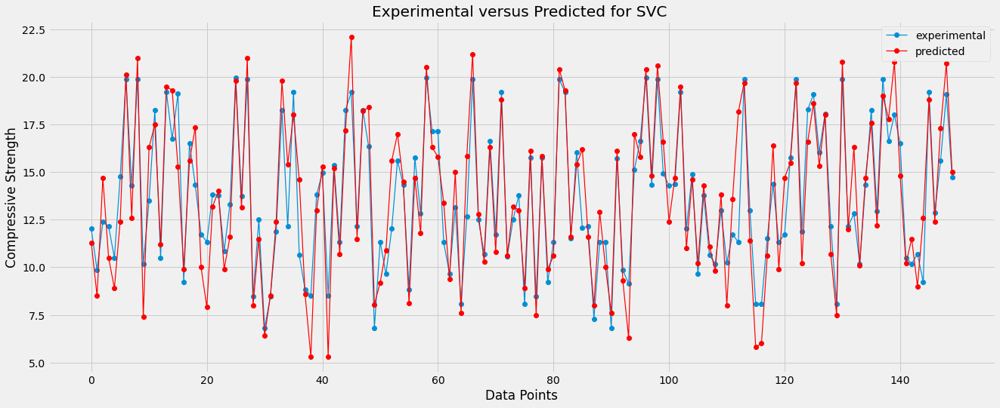

In [34]:
plt.figure(figsize=(20, 8))
plt.plot(np.arange(len(svr_model_pred)), svr_model_pred, marker='o', linewidth=1.2)
plt.plot(np.arange(len(y_test)), y_test, marker='o', linewidth=1.2, color='red')
plt.title('Experimental versus Predicted for SVC ')
plt.xlabel('Data Points')
plt.ylabel('Compressive Strength')
plt.legend(['experimental', 'predicted'])
plt.savefig('opc_cwp_svc_experimental_predicted.jpg');

In [35]:
# the residual between the actual value and the predicted value
svc_residual = svr_model_pred-y_test

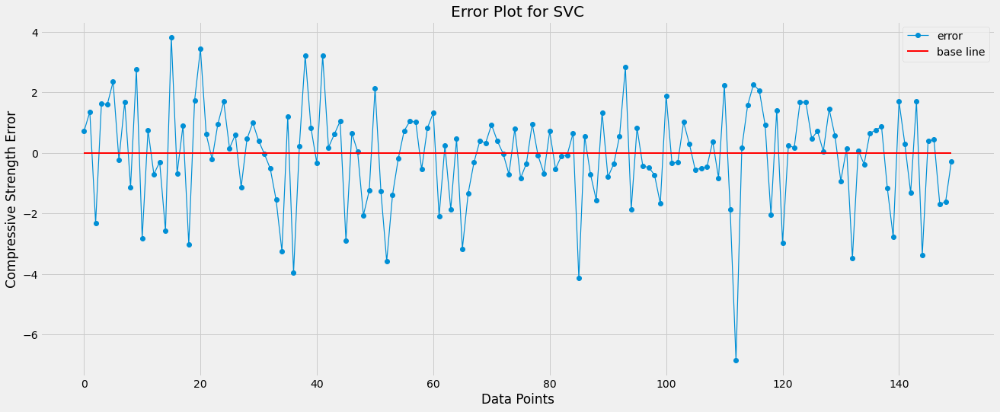

In [36]:
plt.figure(figsize=(20, 8))
plt.plot(np.arange(len(svc_residual)), svc_residual, marker='o', linewidth=1.2)
plt.plot(np.zeros(len(svc_residual)), color='red', linewidth=2)
plt.title('Error Plot for SVC')
plt.xlabel('Data Points')
plt.ylabel('Compressive Strength Error')
plt.legend(['error', 'base line'])
plt.savefig('opc_cwp_svc_error_analysis.jpg');

#### Encoding Technique

In [26]:
from sklearn.preprocessing import LabelEncoder

In [27]:
X = df_opc_cwp.drop('Compressive', axis=1)
y = df_opc_cwp['Compressive']

In [28]:
df_opc_cwp_encode = df_opc_cwp.copy()

In [29]:
for feature in X.columns:
    lbl_encoder = {}
    lbl_encoder[feature] = LabelEncoder()
    df_opc_cwp_encode[feature] = lbl_encoder[feature].fit_transform(df_opc_cwp_encode[feature])

In [30]:
df_opc_cwp_encode

,OPC,CWP,Sand,CG,WC,Age,Compressive
0,6,0,0,0,0,0,17.2
1,6,0,0,0,0,0,18.1
2,6,0,0,0,0,0,19.8
3,5,0,0,0,1,0,13.2
4,4,0,0,0,1,0,12.6
...,...,...,...,...,...,...,...
493,0,3,0,0,2,3,11.8
494,0,3,0,0,2,3,11.6
495,0,1,0,0,2,3,13.8
496,0,1,0,0,2,3,13.6


In [31]:
X_encoded = df_opc_cwp_encode.drop('Compressive', axis=1)
y_encoded = df_opc_cwp_encode['Compressive']

In [32]:
X_train_encoded, X_test_encoded, y_train_encoded, y_test_encoded = train_test_split(X_encoded, y_encoded, 
                                                                                    test_size=0.3, random_state=42)

In [33]:
X_train_encoded.drop(constant_columns, axis=1, inplace=True)
X_test_encoded.drop(constant_columns, axis=1, inplace=True)

###### Decision Tree

In [34]:
import optuna
def objective(trial):
    min_samples_split = trial.suggest_int('min_samples_split', 2, 10, step=1)
    max_depth = trial.suggest_int('max_depth',3, 10, step=1)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 10, step=1)
    max_features = trial.suggest_categorical('max_features', ["auto", "sqrt", "log2"])
    encoded_dtree = DecisionTreeRegressor(random_state=42, min_samples_split=min_samples_split, max_depth=max_depth, 
                                          min_samples_leaf=min_samples_leaf, max_features=max_features)
    encoded_dtree.fit(X_train_encoded, y_train_encoded)
    encoded_dtree_pred = encoded_dtree.predict(X_test_encoded)
    error = mean_squared_error(y_test, encoded_dtree_pred)
    return error
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=5000)

[I 2023-01-12 16:45:45,510] A new study created in memory with name: no-name-24ce56ed-ca75-4758-8136-28958de050de
[I 2023-01-12 16:45:45,535] Trial 0 finished with value: 4.6601824517317345 and parameters: {'min_samples_split': 8, 'max_depth': 4, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 4.6601824517317345.
[I 2023-01-12 16:45:45,549] Trial 1 finished with value: 3.8721583955590737 and parameters: {'min_samples_split': 9, 'max_depth': 3, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 1 with value: 3.8721583955590737.
[I 2023-01-12 16:45:45,574] Trial 2 finished with value: 2.9516732130298724 and parameters: {'min_samples_split': 5, 'max_depth': 5, 'min_samples_leaf': 8, 'max_features': 'auto'}. Best is trial 2 with value: 2.9516732130298724.
[I 2023-01-12 16:45:45,587] Trial 3 finished with value: 3.4013120250939317 and parameters: {'min_samples_split': 2, 'max_depth': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 2 wi

[I 2023-01-12 16:45:46,774] Trial 34 finished with value: 2.787213854781055 and parameters: {'min_samples_split': 5, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:46,852] Trial 35 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:46,929] Trial 36 finished with value: 3.6908179410618596 and parameters: {'min_samples_split': 5, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:46,975] Trial 37 finished with value: 3.8721583955590737 and parameters: {'min_samples_split': 7, 'max_depth': 3, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:47,015] Trial 38 finished with value: 2.979918877101262 a

[I 2023-01-12 16:45:48,366] Trial 68 finished with value: 3.371859407733812 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:48,405] Trial 69 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:48,446] Trial 70 finished with value: 2.9492509604345947 and parameters: {'min_samples_split': 3, 'max_depth': 9, 'min_samples_leaf': 8, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:48,480] Trial 71 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:48,513] Trial 72 finished with value: 2.784791602185775

[I 2023-01-12 16:45:50,021] Trial 102 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:50,057] Trial 103 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:50,101] Trial 104 finished with value: 2.787213854781055 and parameters: {'min_samples_split': 2, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:50,160] Trial 105 finished with value: 3.122245580779883 and parameters: {'min_samples_split': 4, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:50,208] Trial 106 finished with value: 2.784791602

[I 2023-01-12 16:45:51,576] Trial 136 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:51,629] Trial 137 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:51,676] Trial 138 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:51,738] Trial 139 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:51,793] Trial 140 finished with value: 2.784791602

[I 2023-01-12 16:45:53,363] Trial 170 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:53,520] Trial 171 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:53,574] Trial 172 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:53,614] Trial 173 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:53,650] Trial 174 finished with value: 2.7847916

[I 2023-01-12 16:45:54,919] Trial 204 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:54,954] Trial 205 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:54,995] Trial 206 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:55,040] Trial 207 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:55,079] Trial 208 finished with value: 2.7847

[I 2023-01-12 16:45:56,532] Trial 238 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:56,582] Trial 239 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:56,632] Trial 240 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:56,686] Trial 241 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:56,861] Trial 242 finished with value: 2.7847916

[I 2023-01-12 16:45:58,400] Trial 272 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:58,444] Trial 273 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:58,490] Trial 274 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:58,532] Trial 275 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:45:58,584] Trial 276 finished with value: 2.7847916

[I 2023-01-12 16:46:00,142] Trial 306 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:00,183] Trial 307 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:00,228] Trial 308 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:00,268] Trial 309 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:00,307] Trial 310 finished with value: 2.979

[I 2023-01-12 16:46:01,703] Trial 340 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:01,758] Trial 341 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:01,809] Trial 342 finished with value: 2.9492509604345947 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 8, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:01,859] Trial 343 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:01,925] Trial 344 finished with value: 2.7847916021

[I 2023-01-12 16:46:03,749] Trial 374 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:03,817] Trial 375 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:03,877] Trial 376 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:03,932] Trial 377 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:03,991] Trial 378 finished with value: 2.97991

[I 2023-01-12 16:46:05,485] Trial 408 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:05,530] Trial 409 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:05,580] Trial 410 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:05,625] Trial 411 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:05,673] Trial 412 finished with value: 2.784791602

[I 2023-01-12 16:46:07,257] Trial 442 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:07,306] Trial 443 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:07,361] Trial 444 finished with value: 3.371859407733812 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:07,408] Trial 445 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:07,458] Trial 446 finished with value: 2.784791602

[I 2023-01-12 16:46:08,988] Trial 476 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:09,043] Trial 477 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:09,100] Trial 478 finished with value: 2.787213854781055 and parameters: {'min_samples_split': 7, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:09,151] Trial 479 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:09,201] Trial 480 finished with value: 2.784791602

[I 2023-01-12 16:46:10,730] Trial 510 finished with value: 2.787213854781055 and parameters: {'min_samples_split': 6, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:10,800] Trial 511 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:10,855] Trial 512 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:10,905] Trial 513 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:10,950] Trial 514 finished with value: 2.784791

[I 2023-01-12 16:46:12,536] Trial 544 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:12,586] Trial 545 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:12,646] Trial 546 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:12,701] Trial 547 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:12,757] Trial 548 finished with value: 2.9799188

[I 2023-01-12 16:46:14,512] Trial 578 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:14,565] Trial 579 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:14,620] Trial 580 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:14,677] Trial 581 finished with value: 4.115013294483376 and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:14,739] Trial 582 finished with value: 2.78

[I 2023-01-12 16:46:16,483] Trial 612 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:16,538] Trial 613 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:16,593] Trial 614 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:16,648] Trial 615 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:16,713] Trial 616 finished with value: 2.784

[I 2023-01-12 16:46:18,641] Trial 646 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:18,712] Trial 647 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:18,765] Trial 648 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:18,864] Trial 649 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:18,939] Trial 650 finished with value: 2.7847

[I 2023-01-12 16:46:21,290] Trial 680 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:21,390] Trial 681 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:21,475] Trial 682 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:21,580] Trial 683 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:21,645] Trial 684 finished with value: 2.78479

[I 2023-01-12 16:46:23,960] Trial 714 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:24,020] Trial 715 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:24,080] Trial 716 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:24,140] Trial 717 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:24,200] Trial 718 finished with value: 2.784791602

[I 2023-01-12 16:46:26,215] Trial 748 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:26,280] Trial 749 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:26,340] Trial 750 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:26,400] Trial 751 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:26,465] Trial 752 finished with value: 2.9492509

[I 2023-01-12 16:46:28,435] Trial 782 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:28,500] Trial 783 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:28,560] Trial 784 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:28,630] Trial 785 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 7, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:28,695] Trial 786 finished with value: 3.463958131

[I 2023-01-12 16:46:31,615] Trial 816 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:31,680] Trial 817 finished with value: 2.833904821872335 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:31,745] Trial 818 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:31,815] Trial 819 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:31,890] Trial 820 finished with value: 2.78479160

[I 2023-01-12 16:46:34,125] Trial 850 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:34,195] Trial 851 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:34,270] Trial 852 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:34,340] Trial 853 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:34,410] Trial 854 finished with value: 2.78479160

[I 2023-01-12 16:46:36,765] Trial 884 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:36,855] Trial 885 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:37,042] Trial 886 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:37,155] Trial 887 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:37,255] Trial 888 finished with value: 2.784791602

[I 2023-01-12 16:46:40,052] Trial 918 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:40,122] Trial 919 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:40,192] Trial 920 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:40,267] Trial 921 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:40,352] Trial 922 finished with value: 2.7847

[I 2023-01-12 16:46:42,617] Trial 952 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:42,697] Trial 953 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:42,777] Trial 954 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:42,852] Trial 955 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:42,937] Trial 956 finished with value: 3.46395

[I 2023-01-12 16:46:45,672] Trial 986 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:45,807] Trial 987 finished with value: 2.9822895403472796 and parameters: {'min_samples_split': 7, 'max_depth': 4, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:45,947] Trial 988 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:46,067] Trial 989 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:46,162] Trial 990 finished with value: 2.78479

[I 2023-01-12 16:46:49,311] Trial 1020 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:49,421] Trial 1021 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:49,521] Trial 1022 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:49,661] Trial 1023 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:49,756] Trial 1024 finished with value: 2.7

[I 2023-01-12 16:46:52,768] Trial 1054 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:52,863] Trial 1055 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:52,938] Trial 1056 finished with value: 3.100153509241712 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 2, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:53,018] Trial 1057 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:53,098] Trial 1058 finished with value: 2.78

[I 2023-01-12 16:46:55,448] Trial 1088 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:55,528] Trial 1089 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:55,608] Trial 1090 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:55,683] Trial 1091 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:55,758] Trial 1092 finished with value: 2.784

[I 2023-01-12 16:46:58,413] Trial 1122 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:58,503] Trial 1123 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:58,583] Trial 1124 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:58,663] Trial 1125 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:46:58,743] Trial 1126 finished with value: 2.

[I 2023-01-12 16:47:01,253] Trial 1156 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:01,337] Trial 1157 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:01,447] Trial 1158 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:01,532] Trial 1159 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:01,612] Trial 1160 finished with value: 2.78

[I 2023-01-12 16:47:04,307] Trial 1190 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:04,392] Trial 1191 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:04,472] Trial 1192 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:04,562] Trial 1193 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:04,672] Trial 1194 finished with value: 2.78

[I 2023-01-12 16:47:07,981] Trial 1224 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:08,108] Trial 1225 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:08,234] Trial 1226 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:08,340] Trial 1227 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:08,435] Trial 1228 finished with value: 2.78

[I 2023-01-12 16:47:11,998] Trial 1258 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:12,118] Trial 1259 finished with value: 2.833904821872335 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 7, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:12,296] Trial 1260 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:12,396] Trial 1261 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:12,496] Trial 1262 finished with value: 2.7847

[I 2023-01-12 16:47:16,418] Trial 1292 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:16,513] Trial 1293 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:16,608] Trial 1294 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:16,749] Trial 1295 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:16,899] Trial 1296 finished with value: 2

[I 2023-01-12 16:47:20,634] Trial 1326 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:20,779] Trial 1327 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:20,961] Trial 1328 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:21,122] Trial 1329 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:21,235] Trial 1330 finished with value: 2.7847

[I 2023-01-12 16:47:24,594] Trial 1360 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:24,709] Trial 1361 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:24,819] Trial 1362 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:25,058] Trial 1363 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:25,159] Trial 1364 finished with value: 2.784

[I 2023-01-12 16:47:28,715] Trial 1394 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:28,816] Trial 1395 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:28,919] Trial 1396 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:29,013] Trial 1397 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:29,116] Trial 1398 finished with value: 2.7847

[I 2023-01-12 16:47:32,629] Trial 1428 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:32,750] Trial 1429 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:32,852] Trial 1430 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:32,970] Trial 1431 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:33,071] Trial 1432 finished with value: 2.784

[I 2023-01-12 16:47:36,325] Trial 1462 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:36,424] Trial 1463 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:36,526] Trial 1464 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:36,749] Trial 1465 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:36,854] Trial 1466 finished with value: 2.

[I 2023-01-12 16:47:40,255] Trial 1496 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:40,360] Trial 1497 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:40,495] Trial 1498 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:40,598] Trial 1499 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:40,700] Trial 1500 finished with value: 2.

[I 2023-01-12 16:47:44,278] Trial 1530 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:44,382] Trial 1531 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:44,492] Trial 1532 finished with value: 2.985089024037393 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:44,599] Trial 1533 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:44,705] Trial 1534 finished with value: 2.78

[I 2023-01-12 16:47:48,356] Trial 1564 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:48,466] Trial 1565 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:48,586] Trial 1566 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:48,689] Trial 1567 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:48,801] Trial 1568 finished with value: 2.9

[I 2023-01-12 16:47:52,521] Trial 1598 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:52,640] Trial 1599 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:52,751] Trial 1600 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:52,871] Trial 1601 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:52,983] Trial 1602 finished with value: 3.0

[I 2023-01-12 16:47:56,812] Trial 1632 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:56,928] Trial 1633 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:57,035] Trial 1634 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:57,152] Trial 1635 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:47:57,264] Trial 1636 finished with value: 2.7

[I 2023-01-12 16:48:01,392] Trial 1666 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:01,503] Trial 1667 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:01,624] Trial 1668 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:01,735] Trial 1669 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:01,845] Trial 1670 finished with value: 2.

[I 2023-01-12 16:48:06,093] Trial 1700 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:06,208] Trial 1701 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:06,340] Trial 1702 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:06,471] Trial 1703 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:06,590] Trial 1704 finished with value: 2.784

[I 2023-01-12 16:48:10,668] Trial 1734 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:10,790] Trial 1735 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:11,029] Trial 1736 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:11,151] Trial 1737 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:11,269] Trial 1738 finished with value: 3.46

[I 2023-01-12 16:48:15,296] Trial 1768 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:15,413] Trial 1769 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:15,539] Trial 1770 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:15,651] Trial 1771 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:15,907] Trial 1772 finished with value: 2.7

[I 2023-01-12 16:48:20,396] Trial 1802 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:20,517] Trial 1803 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:20,635] Trial 1804 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:20,880] Trial 1805 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:21,003] Trial 1806 finished with value: 2.784

[I 2023-01-12 16:48:25,360] Trial 1836 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:25,493] Trial 1837 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:25,618] Trial 1838 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:25,760] Trial 1839 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:25,885] Trial 1840 finished with value: 3.4639

[I 2023-01-12 16:48:30,798] Trial 1870 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:30,968] Trial 1871 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:31,183] Trial 1872 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:31,465] Trial 1873 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:31,590] Trial 1874 finished with value: 2.78

[I 2023-01-12 16:48:36,013] Trial 1904 finished with value: 2.848871268867799 and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 7, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:36,140] Trial 1905 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:36,268] Trial 1906 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:36,391] Trial 1907 finished with value: 2.787213854781055 and parameters: {'min_samples_split': 4, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:36,536] Trial 1908 finished with value: 2.979

[I 2023-01-12 16:48:41,124] Trial 1938 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:41,254] Trial 1939 finished with value: 2.9492509604345947 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:41,382] Trial 1940 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:41,512] Trial 1941 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:41,649] Trial 1942 finished with value: 2.78

[I 2023-01-12 16:48:46,074] Trial 1972 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:46,225] Trial 1973 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:46,359] Trial 1974 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:46,618] Trial 1975 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:46,755] Trial 1976 finished with value: 2.979

[I 2023-01-12 16:48:51,218] Trial 2006 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:51,360] Trial 2007 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:51,484] Trial 2008 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:51,646] Trial 2009 finished with value: 2.787213854781055 and parameters: {'min_samples_split': 9, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:51,788] Trial 2010 finished with value: 2.78479

[I 2023-01-12 16:48:56,323] Trial 2040 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:56,463] Trial 2041 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:56,594] Trial 2042 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:56,722] Trial 2043 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:48:56,850] Trial 2044 finished with value: 2.784

[I 2023-01-12 16:49:01,556] Trial 2074 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:01,685] Trial 2075 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:01,823] Trial 2076 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:01,956] Trial 2077 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:02,211] Trial 2078 finished with value: 

[I 2023-01-12 16:49:06,951] Trial 2108 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:07,089] Trial 2109 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:07,227] Trial 2110 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:07,368] Trial 2111 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:07,508] Trial 2112 finished with value: 2.7

[I 2023-01-12 16:49:12,526] Trial 2142 finished with value: 2.9486001816045384 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:12,669] Trial 2143 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:12,822] Trial 2144 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:12,959] Trial 2145 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:13,250] Trial 2146 finished with value: 2.784

[I 2023-01-12 16:49:18,273] Trial 2176 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:18,418] Trial 2177 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:18,581] Trial 2178 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:18,874] Trial 2179 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:19,022] Trial 2180 finished with value: 2.78479

[I 2023-01-12 16:49:24,521] Trial 2210 finished with value: 2.9492509604345947 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:24,808] Trial 2211 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:24,978] Trial 2212 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:25,127] Trial 2213 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:25,282] Trial 2214 finished with value: 2.7847

[I 2023-01-12 16:49:30,889] Trial 2244 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:31,039] Trial 2245 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:31,184] Trial 2246 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:31,332] Trial 2247 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:31,499] Trial 2248 finished with value: 2.7847

[I 2023-01-12 16:49:36,999] Trial 2278 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:37,162] Trial 2279 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:37,305] Trial 2280 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:37,459] Trial 2281 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:37,747] Trial 2282 finished with value: 2.979

[I 2023-01-12 16:49:42,954] Trial 2312 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:43,249] Trial 2313 finished with value: 3.000656398352451 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:43,430] Trial 2314 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:43,584] Trial 2315 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:43,748] Trial 2316 finished with value: 2.784

[I 2023-01-12 16:49:49,437] Trial 2346 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:49,602] Trial 2347 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:49,800] Trial 2348 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:49,953] Trial 2349 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:50,228] Trial 2350 finished with value: 2.97

[I 2023-01-12 16:49:55,971] Trial 2380 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:56,139] Trial 2381 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:56,322] Trial 2382 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:56,479] Trial 2383 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:49:56,631] Trial 2384 finished with value: 2.9

[I 2023-01-12 16:50:02,606] Trial 2414 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:02,827] Trial 2415 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:03,147] Trial 2416 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:03,315] Trial 2417 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:03,474] Trial 2418 finished with value: 3

[I 2023-01-12 16:50:09,261] Trial 2448 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:09,415] Trial 2449 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:09,568] Trial 2450 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:09,721] Trial 2451 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:10,001] Trial 2452 finished with value: 

[I 2023-01-12 16:50:15,548] Trial 2482 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:15,734] Trial 2483 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:15,896] Trial 2484 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:16,064] Trial 2485 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:16,215] Trial 2486 finished with value: 2.78

[I 2023-01-12 16:50:21,770] Trial 2516 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:21,924] Trial 2517 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:22,238] Trial 2518 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:22,402] Trial 2519 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 9, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:22,562] Trial 2520 finished with value: 3.4

[I 2023-01-12 16:50:28,693] Trial 2550 finished with value: 3.371859407733812 and parameters: {'min_samples_split': 9, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:28,980] Trial 2551 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:29,254] Trial 2552 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:29,596] Trial 2553 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:29,855] Trial 2554 finished with value: 2.784

[I 2023-01-12 16:50:36,267] Trial 2584 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:36,445] Trial 2585 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:36,629] Trial 2586 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:36,803] Trial 2587 finished with value: 2.787213854781055 and parameters: {'min_samples_split': 10, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:36,992] Trial 2588 finished with value: 2.784

[I 2023-01-12 16:50:44,142] Trial 2618 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:44,347] Trial 2619 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:44,547] Trial 2620 finished with value: 2.848871268867799 and parameters: {'min_samples_split': 7, 'max_depth': 7, 'min_samples_leaf': 7, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:44,942] Trial 2621 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:45,142] Trial 2622 finished with value: 2.784

[I 2023-01-12 16:50:52,046] Trial 2652 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:52,401] Trial 2653 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:52,606] Trial 2654 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:52,851] Trial 2655 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:53,091] Trial 2656 finished with value: 2.7847

[I 2023-01-12 16:50:58,929] Trial 2686 finished with value: 2.9215495854285845 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:59,094] Trial 2687 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:59,384] Trial 2688 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:59,559] Trial 2689 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:50:59,719] Trial 2690 finished with value: 2.784

[I 2023-01-12 16:51:06,873] Trial 2720 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:07,083] Trial 2721 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:07,303] Trial 2722 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:07,588] Trial 2723 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:07,928] Trial 2724 finished with value: 2.7847

[I 2023-01-12 16:51:13,620] Trial 2754 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:13,790] Trial 2755 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:13,970] Trial 2756 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:14,140] Trial 2757 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:14,310] Trial 2758 finished with value: 2.78

[I 2023-01-12 16:51:20,295] Trial 2788 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:20,460] Trial 2789 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:20,625] Trial 2790 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:20,790] Trial 2791 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:21,080] Trial 2792 finished with value: 2.78

[I 2023-01-12 16:51:27,211] Trial 2822 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:27,391] Trial 2823 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:27,561] Trial 2824 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:27,891] Trial 2825 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:28,061] Trial 2826 finished with value: 2.7847

[I 2023-01-12 16:51:34,369] Trial 2856 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:34,549] Trial 2857 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:34,734] Trial 2858 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:34,919] Trial 2859 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:35,239] Trial 2860 finished with value: 2.7847

[I 2023-01-12 16:51:41,801] Trial 2890 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:41,991] Trial 2891 finished with value: 2.9215495854285845 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 6, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:42,171] Trial 2892 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:42,356] Trial 2893 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:42,691] Trial 2894 finished with value: 2.7847

[I 2023-01-12 16:51:49,260] Trial 2924 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:49,435] Trial 2925 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:49,615] Trial 2926 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:49,933] Trial 2927 finished with value: 3.000656398352451 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 5, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:50,113] Trial 2928 finished with value: 2.784

[I 2023-01-12 16:51:56,583] Trial 2958 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:56,783] Trial 2959 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:56,958] Trial 2960 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:57,138] Trial 2961 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:51:57,448] Trial 2962 finished with value: 2.8488

[I 2023-01-12 16:52:03,976] Trial 2992 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:04,176] Trial 2993 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:04,381] Trial 2994 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:04,566] Trial 2995 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:04,891] Trial 2996 finished with value: 2.78

[I 2023-01-12 16:52:11,574] Trial 3026 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:11,893] Trial 3027 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:12,068] Trial 3028 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:12,243] Trial 3029 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:12,433] Trial 3030 finished with value: 2.784

[I 2023-01-12 16:52:19,458] Trial 3060 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:19,643] Trial 3061 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:19,827] Trial 3062 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:20,017] Trial 3063 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:20,362] Trial 3064 finished with value: 2.98

[I 2023-01-12 16:52:27,246] Trial 3094 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:27,426] Trial 3095 finished with value: 2.787213854781055 and parameters: {'min_samples_split': 4, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:27,791] Trial 3096 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:28,006] Trial 3097 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:28,216] Trial 3098 finished with value: 2.

[I 2023-01-12 16:52:36,185] Trial 3128 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:36,507] Trial 3129 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:36,717] Trial 3130 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:36,937] Trial 3131 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:37,137] Trial 3132 finished with value: 2.7847

[I 2023-01-12 16:52:44,529] Trial 3162 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:44,739] Trial 3163 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:44,939] Trial 3164 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:45,259] Trial 3165 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:45,449] Trial 3166 finished with value: 2.7847

[I 2023-01-12 16:52:52,674] Trial 3196 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:52,879] Trial 3197 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:53,254] Trial 3198 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:53,474] Trial 3199 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:52:53,663] Trial 3200 finished with value: 2.7847

[I 2023-01-12 16:53:00,892] Trial 3230 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:01,084] Trial 3231 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:01,274] Trial 3232 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:01,459] Trial 3233 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:01,789] Trial 3234 finished with value: 2.784

[I 2023-01-12 16:53:09,138] Trial 3264 finished with value: 2.9492509604345947 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:09,358] Trial 3265 finished with value: 3.066312863088561 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:09,568] Trial 3266 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:09,888] Trial 3267 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:10,083] Trial 3268 finished with value: 2.784791

[I 2023-01-12 16:53:17,566] Trial 3298 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:17,776] Trial 3299 finished with value: 2.787213854781055 and parameters: {'min_samples_split': 4, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:18,115] Trial 3300 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:18,346] Trial 3301 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:18,536] Trial 3302 finished with value: 2.784

[I 2023-01-12 16:53:26,207] Trial 3332 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:26,577] Trial 3333 finished with value: 2.9492509604345947 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 8, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:26,792] Trial 3334 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:27,002] Trial 3335 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:27,362] Trial 3336 finished with value: 2.9

[I 2023-01-12 16:53:35,419] Trial 3366 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:35,639] Trial 3367 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:35,919] Trial 3368 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:36,304] Trial 3369 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:36,549] Trial 3370 finished with value: 2.7

[I 2023-01-12 16:53:44,752] Trial 3400 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:44,954] Trial 3401 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:45,310] Trial 3402 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:45,570] Trial 3403 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:45,825] Trial 3404 finished with value: 2.

[I 2023-01-12 16:53:54,118] Trial 3434 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:54,503] Trial 3435 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:54,723] Trial 3436 finished with value: 3.0289361172286773 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:54,938] Trial 3437 finished with value: 2.787213854781055 and parameters: {'min_samples_split': 4, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:53:55,318] Trial 3438 finished with value: 2.7

[I 2023-01-12 16:54:03,474] Trial 3468 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:54:03,679] Trial 3469 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:54:03,929] Trial 3470 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:54:04,284] Trial 3471 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:54:04,494] Trial 3472 finished with value: 3.4639

[I 2023-01-12 16:54:12,660] Trial 3502 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:54:13,040] Trial 3503 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:54:13,325] Trial 3504 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:54:13,665] Trial 3505 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:54:14,085] Trial 3506 finished with value: 2.78

[I 2023-01-12 16:54:22,802] Trial 3536 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:54:23,022] Trial 3537 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:54:23,262] Trial 3538 finished with value: 2.787213854781055 and parameters: {'min_samples_split': 9, 'max_depth': 5, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:54:23,636] Trial 3539 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:54:23,855] Trial 3540 finished with value: 2.7847

[I 2023-01-12 16:54:32,901] Trial 3570 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:54:33,126] Trial 3571 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:54:33,473] Trial 3572 finished with value: 2.985089024037393 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 6, 'max_features': 'sqrt'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:54:33,700] Trial 3573 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:54:33,940] Trial 3574 finished with value: 2.784791

[I 2023-01-12 16:54:42,388] Trial 3604 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:54:42,793] Trial 3605 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:54:43,083] Trial 3606 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:54:43,387] Trial 3607 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:54:43,837] Trial 3608 finished with value: 2.

[I 2023-01-12 16:54:52,324] Trial 3638 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:54:52,549] Trial 3639 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:54:52,794] Trial 3640 finished with value: 3.122245580779883 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:54:53,194] Trial 3641 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:54:53,414] Trial 3642 finished with value: 2.78

[I 2023-01-12 16:55:02,247] Trial 3672 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:55:02,467] Trial 3673 finished with value: 2.9823411296965396 and parameters: {'min_samples_split': 4, 'max_depth': 5, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:55:02,862] Trial 3674 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:55:03,087] Trial 3675 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:55:03,437] Trial 3676 finished with value: 2.78

[I 2023-01-12 16:55:12,107] Trial 3706 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:55:12,527] Trial 3707 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:55:12,742] Trial 3708 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:55:13,127] Trial 3709 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:55:13,352] Trial 3710 finished with value: 2.7

[I 2023-01-12 16:55:22,171] Trial 3740 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:55:22,546] Trial 3741 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:55:22,776] Trial 3742 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:55:23,176] Trial 3743 finished with value: 3.3004952994911454 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 1, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:55:23,421] Trial 3744 finished with value: 2.979

[I 2023-01-12 16:55:32,318] Trial 3774 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:55:32,538] Trial 3775 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:55:32,763] Trial 3776 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:55:33,173] Trial 3777 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:55:33,404] Trial 3778 finished with value: 2.78479

[I 2023-01-12 16:55:42,439] Trial 3808 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:55:42,688] Trial 3809 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:55:43,073] Trial 3810 finished with value: 2.961447359077951 and parameters: {'min_samples_split': 4, 'max_depth': 5, 'min_samples_leaf': 6, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:55:43,318] Trial 3811 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:55:43,738] Trial 3812 finished with value: 2.784

[I 2023-01-12 16:55:53,908] Trial 3842 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:55:54,546] Trial 3843 finished with value: 3.371859407733812 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:55:54,998] Trial 3844 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:55:55,374] Trial 3845 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:55:55,807] Trial 3846 finished with value: 3.00

[I 2023-01-12 16:56:05,062] Trial 3876 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:56:05,340] Trial 3877 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:56:05,583] Trial 3878 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:56:05,962] Trial 3879 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:56:06,192] Trial 3880 finished with value: 2.

[I 2023-01-12 16:56:15,671] Trial 3910 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:56:15,911] Trial 3911 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:56:16,319] Trial 3912 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:56:16,569] Trial 3913 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:56:16,802] Trial 3914 finished with value: 2.7

[I 2023-01-12 16:56:26,441] Trial 3944 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:56:26,888] Trial 3945 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:56:27,181] Trial 3946 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:56:27,442] Trial 3947 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:56:27,852] Trial 3948 finished with value: 2.9

[I 2023-01-12 16:56:38,242] Trial 3978 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:56:38,656] Trial 3979 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:56:38,946] Trial 3980 finished with value: 2.9486001816045384 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 5, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:56:39,207] Trial 3981 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:56:39,650] Trial 3982 finished with value: 2.9

[I 2023-01-12 16:56:50,883] Trial 4012 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:56:51,126] Trial 4013 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:56:51,374] Trial 4014 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:56:51,795] Trial 4015 finished with value: 3.420751078249506 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:56:52,044] Trial 4016 finished with value: 2.78

[I 2023-01-12 16:57:01,712] Trial 4046 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:57:01,971] Trial 4047 finished with value: 2.906583138433119 and parameters: {'min_samples_split': 10, 'max_depth': 6, 'min_samples_leaf': 6, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:57:02,355] Trial 4048 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:57:02,663] Trial 4049 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:57:03,080] Trial 4050 finished with value: 2.784

[I 2023-01-12 16:57:12,888] Trial 4080 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:57:13,298] Trial 4081 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:57:13,549] Trial 4082 finished with value: 2.9492509604345947 and parameters: {'min_samples_split': 8, 'max_depth': 7, 'min_samples_leaf': 8, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:57:13,795] Trial 4083 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:57:14,184] Trial 4084 finished with value: 3.463

[I 2023-01-12 16:57:23,578] Trial 4114 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:57:24,043] Trial 4115 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:57:24,309] Trial 4116 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:57:24,715] Trial 4117 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:57:24,969] Trial 4118 finished with value: 2.78

[I 2023-01-12 16:57:34,756] Trial 4148 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:57:35,035] Trial 4149 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:57:35,431] Trial 4150 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:57:35,673] Trial 4151 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:57:35,950] Trial 4152 finished with value: 2

[I 2023-01-12 16:57:46,220] Trial 4182 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:57:46,669] Trial 4183 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:57:46,952] Trial 4184 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:57:47,242] Trial 4185 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:57:47,691] Trial 4186 finished with value: 2.78

[I 2023-01-12 16:57:58,759] Trial 4216 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:57:59,169] Trial 4217 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:57:59,479] Trial 4218 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:57:59,944] Trial 4219 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:58:00,209] Trial 4220 finished with value: 2

[I 2023-01-12 16:58:10,885] Trial 4250 finished with value: 3.371859407733812 and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:58:11,188] Trial 4251 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:58:11,642] Trial 4252 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:58:11,901] Trial 4253 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:58:12,349] Trial 4254 finished with value: 2.78

[I 2023-01-12 16:58:22,722] Trial 4284 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:58:23,132] Trial 4285 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:58:23,457] Trial 4286 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:58:23,902] Trial 4287 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:58:24,272] Trial 4288 finished with value: 2.78

[I 2023-01-12 16:58:36,513] Trial 4318 finished with value: 3.0406691389172535 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:58:36,794] Trial 4319 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:58:37,080] Trial 4320 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:58:37,525] Trial 4321 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:58:37,811] Trial 4322 finished with value: 2.78

[I 2023-01-12 16:58:49,463] Trial 4352 finished with value: 2.9492509604345947 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 8, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:58:49,755] Trial 4353 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:58:50,227] Trial 4354 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:58:50,579] Trial 4355 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:58:51,083] Trial 4356 finished with value: 2.784

[I 2023-01-12 16:59:03,606] Trial 4386 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:59:04,263] Trial 4387 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:59:04,771] Trial 4388 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:59:05,391] Trial 4389 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:59:05,890] Trial 4390 finished with value: 3.46

[I 2023-01-12 16:59:18,309] Trial 4420 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:59:18,588] Trial 4421 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:59:18,998] Trial 4422 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:59:19,308] Trial 4423 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:59:19,825] Trial 4424 finished with value: 2.7

[I 2023-01-12 16:59:31,618] Trial 4454 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:59:31,993] Trial 4455 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:59:32,493] Trial 4456 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:59:32,893] Trial 4457 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:59:33,453] Trial 4458 finished with value: 2.78

[I 2023-01-12 16:59:45,521] Trial 4488 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:59:45,890] Trial 4489 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:59:46,300] Trial 4490 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:59:46,584] Trial 4491 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:59:47,045] Trial 4492 finished with value: 3.463

[I 2023-01-12 16:59:57,557] Trial 4522 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:59:57,973] Trial 4523 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:59:58,243] Trial 4524 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:59:58,688] Trial 4525 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 16:59:58,963] Trial 4526 finished with value: 2.784

[I 2023-01-12 17:00:10,170] Trial 4556 finished with value: 3.371859407733812 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:00:10,485] Trial 4557 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:00:10,897] Trial 4558 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:00:11,164] Trial 4559 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:00:11,609] Trial 4560 finished with value: 2.7847

[I 2023-01-12 17:00:22,543] Trial 4590 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:00:22,840] Trial 4591 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:00:23,275] Trial 4592 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:00:23,600] Trial 4593 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:00:24,035] Trial 4594 finished with value: 3.10

[I 2023-01-12 17:00:35,896] Trial 4624 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:00:36,336] Trial 4625 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:00:36,616] Trial 4626 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:00:37,055] Trial 4627 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 7, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:00:37,352] Trial 4628 finished with value: 2.78

[I 2023-01-12 17:00:48,382] Trial 4658 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:00:48,827] Trial 4659 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:00:49,102] Trial 4660 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:00:49,569] Trial 4661 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:00:49,854] Trial 4662 finished with value: 2.7847

[I 2023-01-12 17:01:01,241] Trial 4692 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:01:01,691] Trial 4693 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:01:01,966] Trial 4694 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:01:02,411] Trial 4695 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:01:02,701] Trial 4696 finished with value: 3.4639

[I 2023-01-12 17:01:13,807] Trial 4726 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:01:14,115] Trial 4727 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:01:14,543] Trial 4728 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:01:14,842] Trial 4729 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:01:15,277] Trial 4730 finished with value: 2.784

[I 2023-01-12 17:01:26,329] Trial 4760 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:01:26,794] Trial 4761 finished with value: 3.371859407733812 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:01:27,089] Trial 4762 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:01:27,504] Trial 4763 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 8, 'max_depth': 10, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:01:27,824] Trial 4764 finished with value: 2.784

[I 2023-01-12 17:01:39,095] Trial 4794 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:01:39,375] Trial 4795 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:01:39,830] Trial 4796 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:01:40,126] Trial 4797 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:01:40,556] Trial 4798 finished with value: 2.784

[I 2023-01-12 17:01:51,719] Trial 4828 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:01:52,154] Trial 4829 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 2, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:01:52,474] Trial 4830 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:01:52,919] Trial 4831 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 9, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:01:53,209] Trial 4832 finished with value: 2.78479

[I 2023-01-12 17:02:04,656] Trial 4862 finished with value: 2.979918877101262 and parameters: {'min_samples_split': 7, 'max_depth': 7, 'min_samples_leaf': 9, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:02:04,945] Trial 4863 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:02:05,530] Trial 4864 finished with value: 3.463958131220549 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:02:05,976] Trial 4865 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:02:06,669] Trial 4866 finished with value: 2.7847

[I 2023-01-12 17:02:18,199] Trial 4896 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:02:18,629] Trial 4897 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:02:18,929] Trial 4898 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:02:19,394] Trial 4899 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:02:19,684] Trial 4900 finished with value: 2.78

[I 2023-01-12 17:02:32,446] Trial 4930 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:02:32,936] Trial 4931 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:02:33,406] Trial 4932 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:02:33,714] Trial 4933 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:02:34,154] Trial 4934 finished with value: 2.7

[I 2023-01-12 17:02:45,918] Trial 4964 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:02:46,208] Trial 4965 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:02:46,653] Trial 4966 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:02:46,978] Trial 4967 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:02:47,427] Trial 4968 finished with value: 2.78

[I 2023-01-12 17:02:58,981] Trial 4998 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 4, 'max_depth': 6, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.
[I 2023-01-12 17:02:59,290] Trial 4999 finished with value: 2.7847916021857757 and parameters: {'min_samples_split': 5, 'max_depth': 9, 'min_samples_leaf': 10, 'max_features': 'auto'}. Best is trial 10 with value: 2.7847916021857757.


In [35]:
encoded_dtree = DecisionTreeRegressor(min_samples_split= 4, max_depth = 7, min_samples_leaf = 10, max_features = 'auto',
                             random_state=42)
encoded_dtree.fit(X_train_encoded, y_train_encoded)

DecisionTreeRegressor(max_depth=7, max_features='auto', min_samples_leaf=10,
                      min_samples_split=4, random_state=42)

In [36]:
encoded_dtree_pred = encoded_dtree.predict(X_test_encoded)
accuracy = r2_score(y_test_encoded, encoded_dtree_pred)
MSE = mean_squared_error(y_test_encoded, encoded_dtree_pred)
RMSE = np.sqrt(MSE)
MAE = mean_absolute_error(y_test_encoded, encoded_dtree_pred)
print('R^2 score: {}%'.format(np.round(accuracy*100, 2)))
print('MSE: {}'.format(np.round(MSE, 2)))
print('RMSE: {}'.format(np.round(RMSE, 2)))
print('MAE: {}'.format(np.round(MAE)))
print('Test score {}%'.format(np.round(encoded_dtree.score(X_test_encoded, y_test_encoded)*100, 2)))
print('Train score {}%'.format(np.round(encoded_dtree.score(X_train_encoded, y_train_encoded)*100, 2)))

R^2 score: 83.93%
MSE: 2.78
RMSE: 1.67
MAE: 1.0
Test score 83.93%
Train score 81.45%


###### SVR

In [37]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaled_encoded = scaler.fit_transform(X_train_encoded)
X_test_scaled_encoded = scaler.fit_transform(X_test_encoded)

In [38]:
import optuna
def objective(trial):
    epsilon = trial.suggest_float('epsilon', 0.1, 10, step=0.1)
    C = trial.suggest_int('C',1, 201, step=2)
    degree = trial.suggest_int('degree', 1, 20, step=1)
    kernel = trial.suggest_categorical('kernel', ['linear', 'poly', 'rbf', 'sigmoid'])
    gamma = trial.suggest_categorical('gamma', ['auto', 'scale'])
    encoded_svr_model = SVR(kernel=kernel, degree=degree, gamma=gamma, C=C, epsilon=epsilon)
    encoded_svr_model.fit(X_train_scaled_encoded, y_train_encoded)
    encoded_svr_pred = encoded_svr_model.predict(X_test_scaled_encoded)
    error = mean_squared_error(y_test_encoded, encoded_svr_pred)
    return error
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=5000)

[I 2023-01-12 17:10:50,308] A new study created in memory with name: no-name-62ac5e28-77dc-4939-9e5f-c3da5972f655
[I 2023-01-12 17:10:50,378] Trial 0 finished with value: 4.931009244042916 and parameters: {'epsilon': 5.5, 'C': 121, 'degree': 4, 'kernel': 'sigmoid', 'gamma': 'auto'}. Best is trial 0 with value: 4.931009244042916.
[I 2023-01-12 17:10:50,407] Trial 1 finished with value: 3.40481914329014 and parameters: {'epsilon': 2.2, 'C': 25, 'degree': 6, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 1 with value: 3.40481914329014.
[I 2023-01-12 17:10:50,424] Trial 2 finished with value: 9.964360017093892 and parameters: {'epsilon': 6.3, 'C': 9, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 1 with value: 3.40481914329014.
[I 2023-01-12 17:10:50,447] Trial 3 finished with value: 4.493197601126757 and parameters: {'epsilon': 4.3, 'C': 89, 'degree': 10, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 1 with value: 3.40481914329014.
[I 2023-01-12 17:10:50,515] Tri

[I 2023-01-12 17:10:52,468] Trial 35 finished with value: 2.942137189167629 and parameters: {'epsilon': 1.4000000000000001, 'C': 61, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 21 with value: 2.7404092671062337.
[I 2023-01-12 17:10:52,501] Trial 36 finished with value: 11.099841388536234 and parameters: {'epsilon': 7.0, 'C': 83, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 21 with value: 2.7404092671062337.
[I 2023-01-12 17:10:52,587] Trial 37 finished with value: 3.5446610518520743 and parameters: {'epsilon': 0.1, 'C': 17, 'degree': 18, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 21 with value: 2.7404092671062337.
[I 2023-01-12 17:10:52,647] Trial 38 finished with value: 3.5367380515479137 and parameters: {'epsilon': 2.4000000000000004, 'C': 25, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 21 with value: 2.7404092671062337.
[I 2023-01-12 17:10:52,757] Trial 39 finished with value: 104003.20672555642 and parameters: {'eps

[I 2023-01-12 17:10:54,778] Trial 70 finished with value: 12.058592306426307 and parameters: {'epsilon': 8.3, 'C': 1, 'degree': 18, 'kernel': 'sigmoid', 'gamma': 'auto'}. Best is trial 61 with value: 2.7384015527220695.
[I 2023-01-12 17:10:54,837] Trial 71 finished with value: 2.7677263749028125 and parameters: {'epsilon': 0.9, 'C': 33, 'degree': 19, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 61 with value: 2.7384015527220695.
[I 2023-01-12 17:10:54,899] Trial 72 finished with value: 2.792182858160273 and parameters: {'epsilon': 1.0, 'C': 31, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 61 with value: 2.7384015527220695.
[I 2023-01-12 17:10:54,956] Trial 73 finished with value: 2.9882339364115396 and parameters: {'epsilon': 1.7000000000000002, 'C': 23, 'degree': 19, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 61 with value: 2.7384015527220695.
[I 2023-01-12 17:10:55,077] Trial 74 finished with value: 2.749338532096352 and parameters: {'epsilon': 0.5, 'C': 3

[I 2023-01-12 17:10:57,602] Trial 105 finished with value: 7.052515934140396 and parameters: {'epsilon': 4.7, 'C': 19, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 98 with value: 2.6473092583344315.
[I 2023-01-12 17:10:57,686] Trial 106 finished with value: 2.676945991521583 and parameters: {'epsilon': 0.6, 'C': 27, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 98 with value: 2.6473092583344315.
[I 2023-01-12 17:10:57,745] Trial 107 finished with value: 2.7485510105259 and parameters: {'epsilon': 0.9, 'C': 27, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 98 with value: 2.6473092583344315.
[I 2023-01-12 17:10:57,817] Trial 108 finished with value: 89.37365060995263 and parameters: {'epsilon': 1.2000000000000002, 'C': 19, 'degree': 12, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 98 with value: 2.6473092583344315.
[I 2023-01-12 17:10:57,870] Trial 109 finished with value: 3.1154670507350812 and parameters: {'epsilon': 1.800000

[I 2023-01-12 17:10:59,994] Trial 140 finished with value: 29676.211213221282 and parameters: {'epsilon': 0.7000000000000001, 'C': 21, 'degree': 14, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:00,067] Trial 141 finished with value: 2.6848139104266533 and parameters: {'epsilon': 0.6, 'C': 17, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:00,127] Trial 142 finished with value: 2.75805932948551 and parameters: {'epsilon': 0.4, 'C': 17, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:00,191] Trial 143 finished with value: 2.7212500982261605 and parameters: {'epsilon': 0.9, 'C': 21, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:00,257] Trial 144 finished with value: 2.6822345048889327 and parameters: {'epsilon

[I 2023-01-12 17:11:02,264] Trial 175 finished with value: 2.7443432658808273 and parameters: {'epsilon': 0.8, 'C': 33, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:02,323] Trial 176 finished with value: 35578.15351625056 and parameters: {'epsilon': 0.5, 'C': 23, 'degree': 13, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:02,388] Trial 177 finished with value: 2.7306976282784716 and parameters: {'epsilon': 1.0, 'C': 19, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:02,458] Trial 178 finished with value: 2.7431082118694627 and parameters: {'epsilon': 0.1, 'C': 13, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:02,507] Trial 179 finished with value: 12.129039437787204 and parameters: {'epsilon': 7.6, 'C': 3

[I 2023-01-12 17:11:04,543] Trial 210 finished with value: 2.735805976892913 and parameters: {'epsilon': 0.4, 'C': 13, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:04,603] Trial 211 finished with value: 2.6457914127000732 and parameters: {'epsilon': 0.7000000000000001, 'C': 15, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:04,664] Trial 212 finished with value: 2.6457914127000732 and parameters: {'epsilon': 0.7000000000000001, 'C': 15, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:04,731] Trial 213 finished with value: 2.711831432569466 and parameters: {'epsilon': 0.9, 'C': 15, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:04,790] Trial 214 finished with value: 2.7146552273815234 and parameters

[I 2023-01-12 17:11:07,202] Trial 245 finished with value: 2.6502634537183822 and parameters: {'epsilon': 0.7000000000000001, 'C': 13, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:07,243] Trial 246 finished with value: 8.04383952001197 and parameters: {'epsilon': 5.2, 'C': 13, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:07,305] Trial 247 finished with value: 2.714112157358324 and parameters: {'epsilon': 0.9, 'C': 11, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:07,373] Trial 248 finished with value: 2.7146552273815234 and parameters: {'epsilon': 0.5, 'C': 15, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:07,440] Trial 249 finished with value: 2.6473092583344315 and parameters: {'epsilon': 0.

[I 2023-01-12 17:11:09,621] Trial 280 finished with value: 2.737354098293132 and parameters: {'epsilon': 0.4, 'C': 11, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:09,681] Trial 281 finished with value: 24298.860885843045 and parameters: {'epsilon': 0.7000000000000001, 'C': 19, 'degree': 14, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:09,731] Trial 282 finished with value: 6.817553430336355 and parameters: {'epsilon': 4.6, 'C': 177, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:09,791] Trial 283 finished with value: 2.783991225346941 and parameters: {'epsilon': 1.2000000000000002, 'C': 15, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:09,846] Trial 284 finished with value: 3.5197396968560755 and paramet

[I 2023-01-12 17:11:12,180] Trial 315 finished with value: 2.6848139104266533 and parameters: {'epsilon': 0.6, 'C': 17, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:12,246] Trial 316 finished with value: 2.711081388959864 and parameters: {'epsilon': 0.9, 'C': 13, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:12,316] Trial 317 finished with value: 2.77127495759885 and parameters: {'epsilon': 0.4, 'C': 21, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:12,381] Trial 318 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:12,490] Trial 319 finished with value: 3.544910146448364 and parameters: {'epsilon': 0.1

[I 2023-01-12 17:11:14,588] Trial 350 finished with value: 3027.5376537811576 and parameters: {'epsilon': 1.4000000000000001, 'C': 21, 'degree': 16, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:14,668] Trial 351 finished with value: 2.7316871715478777 and parameters: {'epsilon': 1.0, 'C': 15, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:14,738] Trial 352 finished with value: 2.8016143141349583 and parameters: {'epsilon': 0.30000000000000004, 'C': 27, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:14,808] Trial 353 finished with value: 2.66780879162697 and parameters: {'epsilon': 0.8, 'C': 13, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:14,873] Trial 354 finished with value: 2.68350621263294 and parameters

[I 2023-01-12 17:11:17,006] Trial 385 finished with value: 2.7304374369073607 and parameters: {'epsilon': 0.9, 'C': 23, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:17,082] Trial 386 finished with value: 2.7350862815451245 and parameters: {'epsilon': 0.4, 'C': 5, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:17,125] Trial 387 finished with value: 9.12831420960422 and parameters: {'epsilon': 5.8, 'C': 15, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:17,195] Trial 388 finished with value: 2.6813418171295975 and parameters: {'epsilon': 0.7000000000000001, 'C': 31, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:17,255] Trial 389 finished with value: 2.7702469733329442 and parameters: {'epsilon': 1.

[I 2023-01-12 17:11:19,470] Trial 420 finished with value: 2.8264920293753213 and parameters: {'epsilon': 1.3000000000000003, 'C': 15, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:19,545] Trial 421 finished with value: 2.782157302437147 and parameters: {'epsilon': 0.30000000000000004, 'C': 19, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:19,615] Trial 422 finished with value: 2.649715521857334 and parameters: {'epsilon': 0.7000000000000001, 'C': 21, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:19,680] Trial 423 finished with value: 2.76458283528927 and parameters: {'epsilon': 1.0, 'C': 27, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:19,776] Trial 424 finished with value: 4637.909748543321 a

[I 2023-01-12 17:11:22,186] Trial 455 finished with value: 2.7769114170057123 and parameters: {'epsilon': 0.30000000000000004, 'C': 17, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:22,256] Trial 456 finished with value: 2.7259210042183257 and parameters: {'epsilon': 1.0, 'C': 9, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:22,366] Trial 457 finished with value: 2.979245265713333 and parameters: {'epsilon': 0.6, 'C': 201, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:22,426] Trial 458 finished with value: 3.3332766721185183 and parameters: {'epsilon': 2.1, 'C': 21, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:22,496] Trial 459 finished with value: 42049.271523695636 and parameters: {'epsilon':

[I 2023-01-12 17:11:24,875] Trial 490 finished with value: 2.6502634537183822 and parameters: {'epsilon': 0.7000000000000001, 'C': 13, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:24,945] Trial 491 finished with value: 2.7059714216665793 and parameters: {'epsilon': 0.9, 'C': 9, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:25,020] Trial 492 finished with value: 2.7734016790577014 and parameters: {'epsilon': 0.30000000000000004, 'C': 15, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:25,085] Trial 493 finished with value: 2.8457561591846705 and parameters: {'epsilon': 1.3000000000000003, 'C': 17, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:25,160] Trial 494 finished with value: 3.44577477842448

[I 2023-01-12 17:11:27,525] Trial 525 finished with value: 4484.806765033697 and parameters: {'epsilon': 0.8, 'C': 149, 'degree': 15, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:27,625] Trial 526 finished with value: 2.782157302437147 and parameters: {'epsilon': 0.30000000000000004, 'C': 19, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:27,685] Trial 527 finished with value: 13.858897855739864 and parameters: {'epsilon': 8.5, 'C': 25, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:27,773] Trial 528 finished with value: 2.9259255571313614 and parameters: {'epsilon': 0.6, 'C': 121, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:27,849] Trial 529 finished with value: 2.7998667923432206 and parameters: {'epsilon'

[I 2023-01-12 17:11:30,373] Trial 560 finished with value: 2.859077286906451 and parameters: {'epsilon': 1.0, 'C': 87, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:30,453] Trial 561 finished with value: 2.8000834415727693 and parameters: {'epsilon': 0.5, 'C': 3, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:30,528] Trial 562 finished with value: 2.862062569992691 and parameters: {'epsilon': 1.3000000000000003, 'C': 9, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:30,613] Trial 563 finished with value: 2.6746412046908477 and parameters: {'epsilon': 0.8, 'C': 17, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:30,698] Trial 564 finished with value: 2.81142889367912 and parameters: {'epsilon': 0.2, 

[I 2023-01-12 17:11:33,338] Trial 595 finished with value: 2.866090019354048 and parameters: {'epsilon': 1.4000000000000001, 'C': 17, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:33,418] Trial 596 finished with value: 2.7336705141365583 and parameters: {'epsilon': 1.0, 'C': 13, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:33,498] Trial 597 finished with value: 2.679727127066915 and parameters: {'epsilon': 0.6, 'C': 31, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:33,608] Trial 598 finished with value: 134.29366538899203 and parameters: {'epsilon': 0.8, 'C': 21, 'degree': 12, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:33,703] Trial 599 finished with value: 2.7846504322690078 and parameters: {'epsilon': 

[I 2023-01-12 17:11:36,313] Trial 630 finished with value: 2.711081388959864 and parameters: {'epsilon': 0.9, 'C': 13, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:36,408] Trial 631 finished with value: 2.9100009423322764 and parameters: {'epsilon': 0.30000000000000004, 'C': 101, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:36,493] Trial 632 finished with value: 2.659280332563358 and parameters: {'epsilon': 0.7000000000000001, 'C': 27, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:36,583] Trial 633 finished with value: 2.7512768213813272 and parameters: {'epsilon': 0.1, 'C': 17, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:36,663] Trial 634 finished with value: 2.8150172074879407 and paramete

[I 2023-01-12 17:11:39,777] Trial 665 finished with value: 2.6473092583344315 and parameters: {'epsilon': 0.7000000000000001, 'C': 19, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:39,872] Trial 666 finished with value: 2.6774057686959005 and parameters: {'epsilon': 0.6, 'C': 7, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:39,962] Trial 667 finished with value: 3.4896369459904366 and parameters: {'epsilon': 1.5000000000000002, 'C': 17, 'degree': 14, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:40,057] Trial 668 finished with value: 2.7304374369073607 and parameters: {'epsilon': 0.9, 'C': 23, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:40,196] Trial 669 finished with value: 2.735805976892913 and paramet

[I 2023-01-12 17:11:43,162] Trial 700 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:43,242] Trial 701 finished with value: 2.856510430927673 and parameters: {'epsilon': 0.30000000000000004, 'C': 3, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:43,337] Trial 702 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:43,427] Trial 703 finished with value: 2.6528240674700965 and parameters: {'epsilon': 0.7000000000000001, 'C': 11, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:43,507] Trial 704 finished with value: 2462.

[I 2023-01-12 17:11:46,452] Trial 735 finished with value: 2.668945275049016 and parameters: {'epsilon': 0.6, 'C': 9, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:46,547] Trial 736 finished with value: 2.6746412046908477 and parameters: {'epsilon': 0.8, 'C': 17, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:46,632] Trial 737 finished with value: 2.752132487334061 and parameters: {'epsilon': 1.1, 'C': 13, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:46,712] Trial 738 finished with value: 3.9805830221175764 and parameters: {'epsilon': 2.9000000000000004, 'C': 11, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:46,802] Trial 739 finished with value: 2.727135036209015 and parameters: {'epsilon': 0.5,

[I 2023-01-12 17:11:49,867] Trial 770 finished with value: 2.7676964441030143 and parameters: {'epsilon': 1.1, 'C': 19, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:49,957] Trial 771 finished with value: 4018.3045813246995 and parameters: {'epsilon': 0.9, 'C': 15, 'degree': 17, 'kernel': 'poly', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:50,052] Trial 772 finished with value: 2.6473092583344315 and parameters: {'epsilon': 0.7000000000000001, 'C': 19, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:50,137] Trial 773 finished with value: 2.848237286124435 and parameters: {'epsilon': 1.4000000000000001, 'C': 25, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:50,252] Trial 774 finished with value: 2.6986204322311544 and parameter

[I 2023-01-12 17:11:53,197] Trial 805 finished with value: 2.8866577674491003 and parameters: {'epsilon': 1.6, 'C': 27, 'degree': 3, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:53,287] Trial 806 finished with value: 2.7163137475409074 and parameters: {'epsilon': 0.9, 'C': 17, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:53,377] Trial 807 finished with value: 2.684856351156429 and parameters: {'epsilon': 0.6, 'C': 5, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:53,502] Trial 808 finished with value: 2.7663086108461865 and parameters: {'epsilon': 0.30000000000000004, 'C': 13, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:53,597] Trial 809 finished with value: 2.837442224003205 and parameters: {'epsilon': 1.1

[I 2023-01-12 17:11:56,737] Trial 840 finished with value: 2.80713581060111 and parameters: {'epsilon': 1.1, 'C': 29, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:56,852] Trial 841 finished with value: 3.4568762175383254 and parameters: {'epsilon': 0.4, 'C': 5, 'degree': 15, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:56,947] Trial 842 finished with value: 2.6473092583344315 and parameters: {'epsilon': 0.7000000000000001, 'C': 19, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:57,022] Trial 843 finished with value: 12.672121904721136 and parameters: {'epsilon': 7.9, 'C': 11, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:11:57,097] Trial 844 finished with value: 9.33713809689494 and parameters: {'epsilon': 5

[I 2023-01-12 17:12:00,262] Trial 875 finished with value: 2.7702469733329442 and parameters: {'epsilon': 1.1, 'C': 9, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:00,356] Trial 876 finished with value: 2.6746412046908477 and parameters: {'epsilon': 0.8, 'C': 17, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:00,456] Trial 877 finished with value: 2.7431082118694627 and parameters: {'epsilon': 0.1, 'C': 13, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:00,551] Trial 878 finished with value: 35584.38596170417 and parameters: {'epsilon': 0.6, 'C': 23, 'degree': 17, 'kernel': 'sigmoid', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:00,646] Trial 879 finished with value: 2.770230833735497 and parameters: {'epsilon': 0.300000000000000

[I 2023-01-12 17:12:03,961] Trial 910 finished with value: 2.6473092583344315 and parameters: {'epsilon': 0.7000000000000001, 'C': 19, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:04,051] Trial 911 finished with value: 2.8650063073285383 and parameters: {'epsilon': 1.3000000000000003, 'C': 7, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:04,156] Trial 912 finished with value: 3.445001167799553 and parameters: {'epsilon': 1.0, 'C': 11, 'degree': 15, 'kernel': 'linear', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:04,281] Trial 913 finished with value: 2.9517834713421944 and parameters: {'epsilon': 0.4, 'C': 151, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:04,396] Trial 914 finished with value: 2.656526221975107 and paramete

[I 2023-01-12 17:12:07,751] Trial 945 finished with value: 2.7485510105259 and parameters: {'epsilon': 0.9, 'C': 27, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:07,851] Trial 946 finished with value: 2.649715521857334 and parameters: {'epsilon': 0.7000000000000001, 'C': 21, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:07,961] Trial 947 finished with value: 2.7769114170057123 and parameters: {'epsilon': 0.30000000000000004, 'C': 17, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:08,046] Trial 948 finished with value: 11.099841388536234 and parameters: {'epsilon': 7.0, 'C': 9, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:08,146] Trial 949 finished with value: 2.7473611538193747 and parameters: 

[I 2023-01-12 17:12:11,441] Trial 980 finished with value: 2.8264920293753213 and parameters: {'epsilon': 1.3000000000000003, 'C': 15, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:11,546] Trial 981 finished with value: 2.6808479183089498 and parameters: {'epsilon': 0.6, 'C': 11, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:11,631] Trial 982 finished with value: 13.248741377372026 and parameters: {'epsilon': 8.2, 'C': 17, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:11,736] Trial 983 finished with value: 2.7608134651231038 and parameters: {'epsilon': 0.30000000000000004, 'C': 7, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:11,851] Trial 984 finished with value: 2.66780879162697 and parameters

[I 2023-01-12 17:12:15,501] Trial 1015 finished with value: 2.6841908626586086 and parameters: {'epsilon': 0.8, 'C': 19, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:15,601] Trial 1016 finished with value: 850.3133992414365 and parameters: {'epsilon': 4.0, 'C': 15, 'degree': 19, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:15,686] Trial 1017 finished with value: 10.27976698193647 and parameters: {'epsilon': 6.5, 'C': 21, 'degree': 19, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:15,796] Trial 1018 finished with value: 2.752409603861607 and parameters: {'epsilon': 0.2, 'C': 11, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:15,906] Trial 1019 finished with value: 2.821363191485784 and parameters: {'epsilon': 1.1, 'C': 31,

[I 2023-01-12 17:12:19,555] Trial 1050 finished with value: 2.6848139104266533 and parameters: {'epsilon': 0.6, 'C': 17, 'degree': 18, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:19,665] Trial 1051 finished with value: 2.6502634537183822 and parameters: {'epsilon': 0.7000000000000001, 'C': 13, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:19,775] Trial 1052 finished with value: 2.7655595122318704 and parameters: {'epsilon': 0.4, 'C': 19, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:19,870] Trial 1053 finished with value: 3.180987515832587 and parameters: {'epsilon': 0.9, 'C': 1, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:19,975] Trial 1054 finished with value: 2.8274209737335028 and parameters: {'epsilon

[I 2023-01-12 17:12:23,615] Trial 1085 finished with value: 3.447457933880528 and parameters: {'epsilon': 0.6, 'C': 15, 'degree': 20, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:23,770] Trial 1086 finished with value: 2.6502634537183822 and parameters: {'epsilon': 0.7000000000000001, 'C': 13, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:23,880] Trial 1087 finished with value: 2.8513487515416087 and parameters: {'epsilon': 1.3000000000000003, 'C': 27, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:24,000] Trial 1088 finished with value: 2.782157302437147 and parameters: {'epsilon': 0.30000000000000004, 'C': 19, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:24,105] Trial 1089 finished with value: 2.7205176

[I 2023-01-12 17:12:27,620] Trial 1120 finished with value: 2.7882983109897697 and parameters: {'epsilon': 0.2, 'C': 19, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:27,730] Trial 1121 finished with value: 2.752132487334061 and parameters: {'epsilon': 1.1, 'C': 13, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:27,845] Trial 1122 finished with value: 42028.82218051776 and parameters: {'epsilon': 0.5, 'C': 25, 'degree': 15, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:27,965] Trial 1123 finished with value: 2.6746412046908477 and parameters: {'epsilon': 0.8, 'C': 17, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:28,120] Trial 1124 finished with value: 2.7259210042183257 and parameters: {'epsilon': 1.0, 'C

[I 2023-01-12 17:12:32,747] Trial 1155 finished with value: 2.7655595122318704 and parameters: {'epsilon': 0.4, 'C': 19, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:32,852] Trial 1156 finished with value: 5.42695117914055 and parameters: {'epsilon': 3.8000000000000003, 'C': 13, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:32,962] Trial 1157 finished with value: 2.689697596427317 and parameters: {'epsilon': 0.8, 'C': 9, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:33,097] Trial 1158 finished with value: 3.4457771868732 and parameters: {'epsilon': 1.1, 'C': 23, 'degree': 15, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:33,217] Trial 1159 finished with value: 2.6848139104266533 and parameters: {'epsilon':

[I 2023-01-12 17:12:37,207] Trial 1190 finished with value: 2.9665483371428962 and parameters: {'epsilon': 0.7000000000000001, 'C': 155, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:37,327] Trial 1191 finished with value: 2.8062794212620443 and parameters: {'epsilon': 0.30000000000000004, 'C': 25, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:37,442] Trial 1192 finished with value: 2.7306976282784716 and parameters: {'epsilon': 1.0, 'C': 19, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:37,557] Trial 1193 finished with value: 2.6986204322311544 and parameters: {'epsilon': 0.5, 'C': 13, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:37,677] Trial 1194 finished with value: 2.6746412046908477 and p

[I 2023-01-12 17:12:41,963] Trial 1225 finished with value: 2.6746412046908477 and parameters: {'epsilon': 0.8, 'C': 17, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:42,083] Trial 1226 finished with value: 2.8624327463430297 and parameters: {'epsilon': 1.3000000000000003, 'C': 25, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:42,258] Trial 1227 finished with value: 2.7454173202292282 and parameters: {'epsilon': 0.5, 'C': 21, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:42,383] Trial 1228 finished with value: 2.8682892433307483 and parameters: {'epsilon': 1.6, 'C': 11, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:42,503] Trial 1229 finished with value: 2.6457914127000732 and parameters: {'epsil

[I 2023-01-12 17:12:46,437] Trial 1260 finished with value: 2.7473611538193747 and parameters: {'epsilon': 0.5, 'C': 23, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:46,602] Trial 1261 finished with value: 6079.128963359733 and parameters: {'epsilon': 1.0, 'C': 19, 'degree': 17, 'kernel': 'poly', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:46,727] Trial 1262 finished with value: 2.799717806906393 and parameters: {'epsilon': 1.2000000000000002, 'C': 13, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:46,847] Trial 1263 finished with value: 2.809002948680809 and parameters: {'epsilon': 0.2, 'C': 27, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:46,967] Trial 1264 finished with value: 2.72674476278449 and parameters: {'epsilon':

[I 2023-01-12 17:12:51,227] Trial 1295 finished with value: 2.7873669833163213 and parameters: {'epsilon': 0.4, 'C': 29, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:51,352] Trial 1296 finished with value: 24299.385468748547 and parameters: {'epsilon': 1.0, 'C': 19, 'degree': 20, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:51,472] Trial 1297 finished with value: 2.737354098293132 and parameters: {'epsilon': 0.4, 'C': 11, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:51,597] Trial 1298 finished with value: 2.852233522490489 and parameters: {'epsilon': 1.3000000000000003, 'C': 37, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:51,717] Trial 1299 finished with value: 2.6705275872371157 and parameters: {'ep

[I 2023-01-12 17:12:55,802] Trial 1330 finished with value: 2.7163137475409074 and parameters: {'epsilon': 0.9, 'C': 17, 'degree': 18, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:55,932] Trial 1331 finished with value: 2.7459403947369094 and parameters: {'epsilon': 0.5, 'C': 25, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:56,057] Trial 1332 finished with value: 2.66780879162697 and parameters: {'epsilon': 0.8, 'C': 13, 'degree': 18, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:56,182] Trial 1333 finished with value: 2.782157302437147 and parameters: {'epsilon': 0.30000000000000004, 'C': 19, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:12:56,352] Trial 1334 finished with value: 2.8150172074879407 and parameters: {'epsilon':

[I 2023-01-12 17:13:00,717] Trial 1365 finished with value: 11335.405228505711 and parameters: {'epsilon': 0.9, 'C': 13, 'degree': 17, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:00,847] Trial 1366 finished with value: 2.6848139104266533 and parameters: {'epsilon': 0.6, 'C': 17, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:00,972] Trial 1367 finished with value: 2.797103315544104 and parameters: {'epsilon': 1.1, 'C': 25, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:01,102] Trial 1368 finished with value: 2.7562266121164614 and parameters: {'epsilon': 0.1, 'C': 19, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:01,237] Trial 1369 finished with value: 2.8593398787165607 and parameters: {'epsilon': 0.8, '

[I 2023-01-12 17:13:05,656] Trial 1400 finished with value: 3.44742625723481 and parameters: {'epsilon': 0.6, 'C': 21, 'degree': 16, 'kernel': 'linear', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:05,791] Trial 1401 finished with value: 2.679300585009688 and parameters: {'epsilon': 0.8, 'C': 11, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:05,911] Trial 1402 finished with value: 2.730286512979454 and parameters: {'epsilon': 0.4, 'C': 7, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:06,066] Trial 1403 finished with value: 2.76084699933746 and parameters: {'epsilon': 1.1, 'C': 17, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:06,196] Trial 1404 finished with value: 2.656526221975107 and parameters: {'epsilon': 0.7000000000000

[I 2023-01-12 17:13:10,706] Trial 1435 finished with value: 2.6457914127000732 and parameters: {'epsilon': 0.7000000000000001, 'C': 15, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:10,836] Trial 1436 finished with value: 2.709714539084683 and parameters: {'epsilon': 0.9, 'C': 19, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:10,966] Trial 1437 finished with value: 2021.1837871785435 and parameters: {'epsilon': 0.1, 'C': 7, 'degree': 17, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:11,096] Trial 1438 finished with value: 2.6822345048889327 and parameters: {'epsilon': 0.6, 'C': 25, 'degree': 13, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:11,226] Trial 1439 finished with value: 2.737354098293132 and parameters: {'epsi

[I 2023-01-12 17:13:15,986] Trial 1470 finished with value: 2.688609790020311 and parameters: {'epsilon': 0.6, 'C': 15, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:16,121] Trial 1471 finished with value: 2.66780879162697 and parameters: {'epsilon': 0.8, 'C': 13, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:16,261] Trial 1472 finished with value: 2.78653982399147 and parameters: {'epsilon': 0.1, 'C': 23, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:16,406] Trial 1473 finished with value: 2.7846504322690078 and parameters: {'epsilon': 0.4, 'C': 27, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:16,556] Trial 1474 finished with value: 3.4457858108431036 and parameters: {'epsilon': 1.1, 'C': 19, 

[I 2023-01-12 17:13:21,175] Trial 1505 finished with value: 3.180987515832587 and parameters: {'epsilon': 0.9, 'C': 1, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:21,320] Trial 1506 finished with value: 2.7998077482541888 and parameters: {'epsilon': 0.30000000000000004, 'C': 29, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:21,465] Trial 1507 finished with value: 2.6848139104266533 and parameters: {'epsilon': 0.6, 'C': 17, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:21,610] Trial 1508 finished with value: 2.862865459562001 and parameters: {'epsilon': 1.3000000000000003, 'C': 21, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:21,745] Trial 1509 finished with value: 2.66780879162697 and paramete

[I 2023-01-12 17:13:26,330] Trial 1540 finished with value: 2.7163137475409074 and parameters: {'epsilon': 0.9, 'C': 17, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:26,480] Trial 1541 finished with value: 2.6502634537183822 and parameters: {'epsilon': 0.7000000000000001, 'C': 13, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:26,755] Trial 1542 finished with value: 11.099841388536234 and parameters: {'epsilon': 7.0, 'C': 25, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:26,895] Trial 1543 finished with value: 2.6801118467415206 and parameters: {'epsilon': 0.6, 'C': 21, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:27,035] Trial 1544 finished with value: 2.773115650183764 and parameters: {'epsil

[I 2023-01-12 17:13:31,675] Trial 1575 finished with value: 17.412735333333337 and parameters: {'epsilon': 10.0, 'C': 35, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:31,825] Trial 1576 finished with value: 2.7473611538193747 and parameters: {'epsilon': 0.5, 'C': 23, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:31,985] Trial 1577 finished with value: 2.8344437393340884 and parameters: {'epsilon': 0.9, 'C': 65, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:32,130] Trial 1578 finished with value: 2.6744224161146266 and parameters: {'epsilon': 0.6, 'C': 19, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:32,290] Trial 1579 finished with value: 4730.6700482455935 and parameters: {'epsilon': 0.7000000

[I 2023-01-12 17:13:37,054] Trial 1610 finished with value: 2.8038251889606203 and parameters: {'epsilon': 0.30000000000000004, 'C': 23, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:37,194] Trial 1611 finished with value: 2.72674476278449 and parameters: {'epsilon': 0.5, 'C': 17, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:37,344] Trial 1612 finished with value: 2.6585977403451295 and parameters: {'epsilon': 0.7000000000000001, 'C': 7, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:37,504] Trial 1613 finished with value: 2.8526620723314884 and parameters: {'epsilon': 1.2000000000000002, 'C': 33, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:37,654] Trial 1614 finished with value: 2.733670514136

[I 2023-01-12 17:13:42,725] Trial 1645 finished with value: 2.7896750114291176 and parameters: {'epsilon': 0.4, 'C': 31, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:42,900] Trial 1646 finished with value: 2.68350621263294 and parameters: {'epsilon': 0.6, 'C': 23, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:43,045] Trial 1647 finished with value: 2.7384015527220695 and parameters: {'epsilon': 1.0, 'C': 21, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:43,315] Trial 1648 finished with value: 2.6473092583344315 and parameters: {'epsilon': 0.7000000000000001, 'C': 19, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:43,445] Trial 1649 finished with value: 268.5479210775983 and parameters: {'epsilon

[I 2023-01-12 17:13:48,530] Trial 1680 finished with value: 2.6705275872371157 and parameters: {'epsilon': 0.8, 'C': 15, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:48,685] Trial 1681 finished with value: 2.710612128841267 and parameters: {'epsilon': 0.5, 'C': 7, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:48,835] Trial 1682 finished with value: 2.8390318404354398 and parameters: {'epsilon': 1.3000000000000003, 'C': 29, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:48,980] Trial 1683 finished with value: 2.7384015527220695 and parameters: {'epsilon': 1.0, 'C': 21, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:49,140] Trial 1684 finished with value: 2.7431082118694627 and parameters: {'epsilon

[I 2023-01-12 17:13:54,452] Trial 1715 finished with value: 3.5449072639091304 and parameters: {'epsilon': 0.1, 'C': 11, 'degree': 16, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:54,757] Trial 1716 finished with value: 2.848237286124435 and parameters: {'epsilon': 1.4000000000000001, 'C': 25, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:54,907] Trial 1717 finished with value: 2.6746412046908477 and parameters: {'epsilon': 0.8, 'C': 17, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:55,047] Trial 1718 finished with value: 2.8150172074879407 and parameters: {'epsilon': 1.1, 'C': 5, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:13:55,172] Trial 1719 finished with value: 9.66943999920915 and parameters: {'epsil

[I 2023-01-12 17:14:00,394] Trial 1750 finished with value: 2.6705275872371157 and parameters: {'epsilon': 0.8, 'C': 15, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:00,539] Trial 1751 finished with value: 2.8513487515416087 and parameters: {'epsilon': 1.3000000000000003, 'C': 27, 'degree': 11, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:00,694] Trial 1752 finished with value: 2.6801118467415206 and parameters: {'epsilon': 0.6, 'C': 21, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:00,849] Trial 1753 finished with value: 2.7689265664723814 and parameters: {'epsilon': 1.1, 'C': 11, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:00,999] Trial 1754 finished with value: 19376.98584312889 and parameters: {'epsilo

[I 2023-01-12 17:14:06,383] Trial 1785 finished with value: 2.82524051316594 and parameters: {'epsilon': 1.2000000000000002, 'C': 21, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:06,548] Trial 1786 finished with value: 2.8913020419617963 and parameters: {'epsilon': 0.9, 'C': 103, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:06,728] Trial 1787 finished with value: 2.7769114170057123 and parameters: {'epsilon': 0.30000000000000004, 'C': 17, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:06,903] Trial 1788 finished with value: 3.4506854530589637 and parameters: {'epsilon': 0.8, 'C': 9, 'degree': 16, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:07,053] Trial 1789 finished with value: 2.7027980742856723 and p

[I 2023-01-12 17:14:12,669] Trial 1820 finished with value: 2.8658560869618865 and parameters: {'epsilon': 1.4000000000000001, 'C': 15, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:12,846] Trial 1821 finished with value: 2.7182284043373937 and parameters: {'epsilon': 0.7000000000000001, 'C': 39, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:13,053] Trial 1822 finished with value: 2.739939958615478 and parameters: {'epsilon': 0.5, 'C': 19, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:13,207] Trial 1823 finished with value: 2.7615310664050927 and parameters: {'epsilon': 0.9, 'C': 31, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:13,367] Trial 1824 finished with value: 2.7431082118694627 and param

[I 2023-01-12 17:14:18,973] Trial 1855 finished with value: 2.675383248371216 and parameters: {'epsilon': 0.6, 'C': 29, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:19,118] Trial 1856 finished with value: 2.8239522222789306 and parameters: {'epsilon': 1.3000000000000003, 'C': 13, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:19,398] Trial 1857 finished with value: 2.6473092583344315 and parameters: {'epsilon': 0.7000000000000001, 'C': 19, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:19,583] Trial 1858 finished with value: 2.823298843010953 and parameters: {'epsilon': 1.0, 'C': 63, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:19,748] Trial 1859 finished with value: 2.68350621263294 and paramete

[I 2023-01-12 17:14:25,306] Trial 1890 finished with value: 2.7398410296099267 and parameters: {'epsilon': 0.9, 'C': 25, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:25,586] Trial 1891 finished with value: 2.6457914127000732 and parameters: {'epsilon': 0.7000000000000001, 'C': 15, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:25,746] Trial 1892 finished with value: 2.7454173202292282 and parameters: {'epsilon': 0.5, 'C': 21, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:25,926] Trial 1893 finished with value: 7516.07655859307 and parameters: {'epsilon': 1.0, 'C': 11, 'degree': 18, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:26,111] Trial 1894 finished with value: 2.7785772298592595 and parameters: {'epsilo

[I 2023-01-12 17:14:32,759] Trial 1925 finished with value: 2.770230833735497 and parameters: {'epsilon': 0.30000000000000004, 'C': 5, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:32,939] Trial 1926 finished with value: 2.937236013428325 and parameters: {'epsilon': 0.6, 'C': 127, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:33,104] Trial 1927 finished with value: 2.709714539084683 and parameters: {'epsilon': 0.9, 'C': 19, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:33,269] Trial 1928 finished with value: 2.6962092636174453 and parameters: {'epsilon': 0.8, 'C': 23, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:33,404] Trial 1929 finished with value: 8.733396873876007 and parameters: {'epsilon'

[I 2023-01-12 17:14:39,325] Trial 1960 finished with value: 2.731401309651366 and parameters: {'epsilon': 0.4, 'C': 9, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:39,495] Trial 1961 finished with value: 2.6457914127000732 and parameters: {'epsilon': 0.7000000000000001, 'C': 15, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:39,655] Trial 1962 finished with value: 2.6929639134616585 and parameters: {'epsilon': 0.8, 'C': 21, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:39,815] Trial 1963 finished with value: 2.78924170937837 and parameters: {'epsilon': 1.2000000000000002, 'C': 17, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:40,000] Trial 1964 finished with value: 2.7459403947369094 and paramete

[I 2023-01-12 17:14:46,003] Trial 1995 finished with value: 2.7454173202292282 and parameters: {'epsilon': 0.5, 'C': 21, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:46,252] Trial 1996 finished with value: 2.8145981696264077 and parameters: {'epsilon': 0.2, 'C': 25, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:46,436] Trial 1997 finished with value: 1655.2866505610803 and parameters: {'epsilon': 0.9, 'C': 5, 'degree': 16, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:46,754] Trial 1998 finished with value: 2.6986204322311544 and parameters: {'epsilon': 0.5, 'C': 13, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:46,925] Trial 1999 finished with value: 2.6473092583344315 and parameters: {'epsilon': 0.70000

[I 2023-01-12 17:14:52,876] Trial 2030 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:53,186] Trial 2031 finished with value: 2.733530280418957 and parameters: {'epsilon': 1.0, 'C': 11, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:53,341] Trial 2032 finished with value: 4.473544760328418 and parameters: {'epsilon': 3.2, 'C': 27, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:53,506] Trial 2033 finished with value: 3.447371933809885 and parameters: {'epsilon': 0.5, 'C': 5, 'degree': 16, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:53,681] Trial 2034 finished with value: 2.6473092583344315 and parameters: {'epsil

[I 2023-01-12 17:14:59,602] Trial 2065 finished with value: 2.8577916865054167 and parameters: {'epsilon': 1.4000000000000001, 'C': 13, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:59,772] Trial 2066 finished with value: 2.6848139104266533 and parameters: {'epsilon': 0.6, 'C': 17, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:14:59,937] Trial 2067 finished with value: 2.7398410296099267 and parameters: {'epsilon': 0.9, 'C': 25, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:00,107] Trial 2068 finished with value: 29653.37086835606 and parameters: {'epsilon': 0.4, 'C': 21, 'degree': 17, 'kernel': 'sigmoid', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:00,287] Trial 2069 finished with value: 2.6457914127000732 and parameters: {'ep

[I 2023-01-12 17:15:06,467] Trial 2100 finished with value: 2.7304374369073607 and parameters: {'epsilon': 0.9, 'C': 23, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:06,647] Trial 2101 finished with value: 2.7431082118694627 and parameters: {'epsilon': 0.1, 'C': 13, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:06,817] Trial 2102 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:07,022] Trial 2103 finished with value: 2.731401309651366 and parameters: {'epsilon': 0.4, 'C': 9, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:07,192] Trial 2104 finished with value: 2.816462308885159 and parameters: {'epsilon'

[I 2023-01-12 17:15:13,519] Trial 2135 finished with value: 2.7473289258488034 and parameters: {'epsilon': 0.1, 'C': 15, 'degree': 11, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:13,689] Trial 2136 finished with value: 2.6841908626586086 and parameters: {'epsilon': 0.8, 'C': 19, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:13,864] Trial 2137 finished with value: 2.676945991521583 and parameters: {'epsilon': 0.6, 'C': 27, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:14,179] Trial 2138 finished with value: 13187.58090690247 and parameters: {'epsilon': 0.9, 'C': 15, 'degree': 18, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:14,334] Trial 2139 finished with value: 10.767977928783633 and parameters: {'epsilon': 6.8, 'C': 5

[I 2023-01-12 17:15:20,731] Trial 2170 finished with value: 2.729505664309262 and parameters: {'epsilon': 0.2, 'C': 13, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:20,931] Trial 2171 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:21,106] Trial 2172 finished with value: 2.6929639134616585 and parameters: {'epsilon': 0.8, 'C': 21, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:21,301] Trial 2173 finished with value: 2.893037977752658 and parameters: {'epsilon': 0.4, 'C': 89, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:21,626] Trial 2174 finished with value: 2.8118087467116495 and parameters: {'epsilo

[I 2023-01-12 17:15:28,440] Trial 2205 finished with value: 4.908883985129808 and parameters: {'epsilon': 3.5000000000000004, 'C': 19, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:28,631] Trial 2206 finished with value: 2.8038251889606203 and parameters: {'epsilon': 0.30000000000000004, 'C': 23, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:28,805] Trial 2207 finished with value: 2.8638414498734552 and parameters: {'epsilon': 1.5000000000000002, 'C': 11, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:28,995] Trial 2208 finished with value: 2.9283083837894712 and parameters: {'epsilon': 0.9, 'C': 131, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:29,185] Trial 2209 finished with value: 3662.48687

[I 2023-01-12 17:15:35,885] Trial 2240 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:36,075] Trial 2241 finished with value: 2.7259210042183257 and parameters: {'epsilon': 1.0, 'C': 9, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:36,400] Trial 2242 finished with value: 2.6744224161146266 and parameters: {'epsilon': 0.6, 'C': 19, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:36,590] Trial 2243 finished with value: 2.66780879162697 and parameters: {'epsilon': 0.8, 'C': 13, 'degree': 18, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:36,775] Trial 2244 finished with value: 2.6449865152229166 and parameters: {'epsilon'

[I 2023-01-12 17:15:43,567] Trial 2275 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:43,747] Trial 2276 finished with value: 2.6841908626586086 and parameters: {'epsilon': 0.8, 'C': 19, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:43,932] Trial 2277 finished with value: 2.7473611538193747 and parameters: {'epsilon': 0.5, 'C': 23, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:44,237] Trial 2278 finished with value: 3.4450165352259727 and parameters: {'epsilon': 1.0, 'C': 7, 'degree': 18, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:44,422] Trial 2279 finished with value: 3.437381714335788 and parameters: {'eps

[I 2023-01-12 17:15:52,466] Trial 2310 finished with value: 6079.128963359733 and parameters: {'epsilon': 1.0, 'C': 19, 'degree': 17, 'kernel': 'poly', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:52,696] Trial 2311 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:52,896] Trial 2312 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:53,286] Trial 2313 finished with value: 92042.10089583392 and parameters: {'epsilon': 1.0, 'C': 37, 'degree': 17, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:15:53,521] Trial 2314 finished with value: 2.6574496923324835 and p

[I 2023-01-12 17:16:01,541] Trial 2345 finished with value: 2.711081388959864 and parameters: {'epsilon': 0.9, 'C': 13, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:01,781] Trial 2346 finished with value: 2.7459403947369094 and parameters: {'epsilon': 0.5, 'C': 25, 'degree': 18, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:01,980] Trial 2347 finished with value: 7.232699797164171 and parameters: {'epsilon': 4.8, 'C': 17, 'degree': 18, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:02,172] Trial 2348 finished with value: 3.1361530025131175 and parameters: {'epsilon': 0.8, 'C': 1, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:02,379] Trial 2349 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.700000000000

[I 2023-01-12 17:16:09,957] Trial 2380 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:10,157] Trial 2381 finished with value: 2.731401309651366 and parameters: {'epsilon': 0.4, 'C': 9, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:10,382] Trial 2382 finished with value: 17.021117692721205 and parameters: {'epsilon': 0.8, 'C': 19, 'degree': 10, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:10,582] Trial 2383 finished with value: 2.7905301847620128 and parameters: {'epsilon': 0.1, 'C': 25, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:10,782] Trial 2384 finished with value: 2.7336705141365583 and parameters: {'epsil

[I 2023-01-12 17:16:17,731] Trial 2415 finished with value: 2.6705275872371157 and parameters: {'epsilon': 0.8, 'C': 15, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:17,941] Trial 2416 finished with value: 2.7891643326919975 and parameters: {'epsilon': 1.1, 'C': 23, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:18,131] Trial 2417 finished with value: 2.8905335160906054 and parameters: {'epsilon': 1.5000000000000002, 'C': 35, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:18,316] Trial 2418 finished with value: 2.7431082118694627 and parameters: {'epsilon': 0.1, 'C': 13, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:18,631] Trial 2419 finished with value: 2.6848139104266533 and parameters: {'epsil

[I 2023-01-12 17:16:26,580] Trial 2450 finished with value: 2.6986204322311544 and parameters: {'epsilon': 0.5, 'C': 13, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:26,795] Trial 2451 finished with value: 2.6705275872371157 and parameters: {'epsilon': 0.8, 'C': 15, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:27,159] Trial 2452 finished with value: 28165.018837927662 and parameters: {'epsilon': 0.30000000000000004, 'C': 27, 'degree': 18, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:27,394] Trial 2453 finished with value: 2.7689265664723814 and parameters: {'epsilon': 1.1, 'C': 11, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:27,624] Trial 2454 finished with value: 2.6449865152229166 and parameters: {'eps

[I 2023-01-12 17:16:37,691] Trial 2485 finished with value: 2.792182858160273 and parameters: {'epsilon': 1.0, 'C': 31, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:38,282] Trial 2486 finished with value: 4.08541455192543 and parameters: {'epsilon': 3.0000000000000004, 'C': 23, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:38,693] Trial 2487 finished with value: 2.6989038339047298 and parameters: {'epsilon': 0.5, 'C': 9, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:39,171] Trial 2488 finished with value: 2.6841908626586086 and parameters: {'epsilon': 0.8, 'C': 19, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:39,465] Trial 2489 finished with value: 16.134964491588423 and parameters: {'epsilon'

[I 2023-01-12 17:16:49,836] Trial 2520 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:50,131] Trial 2521 finished with value: 2.711831432569466 and parameters: {'epsilon': 0.9, 'C': 15, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:50,514] Trial 2522 finished with value: 2.844873773303181 and parameters: {'epsilon': 1.2000000000000002, 'C': 23, 'degree': 19, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:50,912] Trial 2523 finished with value: 2.8638414498734552 and parameters: {'epsilon': 1.5000000000000002, 'C': 11, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:51,250] Trial 2524 finished with value: 2.745417320229

[I 2023-01-12 17:16:58,654] Trial 2555 finished with value: 2.797103315544104 and parameters: {'epsilon': 1.1, 'C': 25, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:58,849] Trial 2556 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:59,069] Trial 2557 finished with value: 2462.298255294829 and parameters: {'epsilon': 0.8, 'C': 7, 'degree': 18, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:59,414] Trial 2558 finished with value: 2.6986204322311544 and parameters: {'epsilon': 0.5, 'C': 13, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:16:59,604] Trial 2559 finished with value: 2.8599754788679927 and parameters: {'eps

[I 2023-01-12 17:17:07,312] Trial 2590 finished with value: 3.2345425974972013 and parameters: {'epsilon': 2.0, 'C': 15, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:17:07,587] Trial 2591 finished with value: 3.5100763395911234 and parameters: {'epsilon': 0.2, 'C': 37, 'degree': 19, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:17:07,938] Trial 2592 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:17:08,168] Trial 2593 finished with value: 2.7461970745854516 and parameters: {'epsilon': 1.0, 'C': 23, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:17:08,384] Trial 2594 finished with value: 2.679300585009688 and parameters: {'ep

[I 2023-01-12 17:17:16,942] Trial 2625 finished with value: 2.688609790020311 and parameters: {'epsilon': 0.6, 'C': 15, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:17:17,154] Trial 2626 finished with value: 2.7211859222737433 and parameters: {'epsilon': 0.8, 'C': 29, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:17:17,381] Trial 2627 finished with value: 2.7655595122318704 and parameters: {'epsilon': 0.4, 'C': 19, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:17:17,741] Trial 2628 finished with value: 2.733530280418957 and parameters: {'epsilon': 1.0, 'C': 11, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:17:18,010] Trial 2629 finished with value: 35584.38596170417 and parameters: {'epsilon': 0.6, 'C': 23

[I 2023-01-12 17:17:26,334] Trial 2660 finished with value: 2.6473092583344315 and parameters: {'epsilon': 0.7000000000000001, 'C': 19, 'degree': 18, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:17:26,564] Trial 2661 finished with value: 2.7846504322690078 and parameters: {'epsilon': 0.4, 'C': 27, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:17:26,769] Trial 2662 finished with value: 2.685923551212614 and parameters: {'epsilon': 0.6, 'C': 13, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:17:26,979] Trial 2663 finished with value: 2.7059714216665793 and parameters: {'epsilon': 0.9, 'C': 9, 'degree': 18, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:17:27,317] Trial 2664 finished with value: 2.6449865152229166 and parameters: {'epsilon':

[I 2023-01-12 17:17:42,675] Trial 2695 finished with value: 2.7571138593580207 and parameters: {'epsilon': 1.0, 'C': 25, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:17:43,470] Trial 2696 finished with value: 1260.5738856625906 and parameters: {'epsilon': 1.3000000000000003, 'C': 9, 'degree': 16, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:17:43,825] Trial 2697 finished with value: 2.7212500982261605 and parameters: {'epsilon': 0.9, 'C': 21, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:17:44,190] Trial 2698 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:17:44,645] Trial 2699 finished with value: 2.7146552273815234 and par

[I 2023-01-12 17:18:03,031] Trial 2730 finished with value: 2.82524051316594 and parameters: {'epsilon': 1.2000000000000002, 'C': 21, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:18:03,417] Trial 2731 finished with value: 2.737354098293132 and parameters: {'epsilon': 0.4, 'C': 11, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:18:04,062] Trial 2732 finished with value: 2.6962092636174453 and parameters: {'epsilon': 0.8, 'C': 23, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:18:04,410] Trial 2733 finished with value: 2.688609790020311 and parameters: {'epsilon': 0.6, 'C': 15, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:18:04,730] Trial 2734 finished with value: 2.709714539084683 and parameters: {'epsilon':

[I 2023-01-12 17:18:13,449] Trial 2765 finished with value: 2.6705275872371157 and parameters: {'epsilon': 0.8, 'C': 15, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:18:13,680] Trial 2766 finished with value: 2.955269260249131 and parameters: {'epsilon': 1.2000000000000002, 'C': 3, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:18:13,893] Trial 2767 finished with value: 237.18591502412718 and parameters: {'epsilon': 5.9, 'C': 125, 'degree': 17, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:18:14,161] Trial 2768 finished with value: 3.4495230309209735 and parameters: {'epsilon': 0.5, 'C': 25, 'degree': 19, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:18:14,405] Trial 2769 finished with value: 2.730286512979454 and parameters: {'ep

[I 2023-01-12 17:18:22,956] Trial 2800 finished with value: 49009.38130990672 and parameters: {'epsilon': 0.4, 'C': 27, 'degree': 18, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:18:23,171] Trial 2801 finished with value: 2.8651414452751673 and parameters: {'epsilon': 1.2000000000000002, 'C': 81, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:18:23,391] Trial 2802 finished with value: 2.6986204322311544 and parameters: {'epsilon': 0.5, 'C': 13, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:18:23,775] Trial 2803 finished with value: 2.7212500982261605 and parameters: {'epsilon': 0.9, 'C': 21, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:18:24,039] Trial 2804 finished with value: 2.7696640707165274 and parameters: {'ep

[I 2023-01-12 17:18:33,799] Trial 2835 finished with value: 2.6841908626586086 and parameters: {'epsilon': 0.8, 'C': 19, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:18:34,154] Trial 2836 finished with value: 2.74313189558014 and parameters: {'epsilon': 1.1, 'C': 15, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:18:34,384] Trial 2837 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:18:34,619] Trial 2838 finished with value: 2.8059508740818386 and parameters: {'epsilon': 0.1, 'C': 31, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:18:35,014] Trial 2839 finished with value: 2.6744224161146266 and parameters: {'epsilon

[I 2023-01-12 17:18:44,603] Trial 2870 finished with value: 7324.060845722857 and parameters: {'epsilon': 1.1, 'C': 11, 'degree': 13, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:18:44,869] Trial 2871 finished with value: 2.7905301847620128 and parameters: {'epsilon': 0.1, 'C': 25, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:18:45,358] Trial 2872 finished with value: 2.6848139104266533 and parameters: {'epsilon': 0.6, 'C': 17, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:18:45,634] Trial 2873 finished with value: 8.372873752094756 and parameters: {'epsilon': 5.4, 'C': 13, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:18:45,977] Trial 2874 finished with value: 2.7212500982261605 and parameters: {'epsilon': 0.9, 'C'

[I 2023-01-12 17:18:54,550] Trial 2905 finished with value: 2.7615310664050927 and parameters: {'epsilon': 0.9, 'C': 31, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:18:54,805] Trial 2906 finished with value: 2.706166655545641 and parameters: {'epsilon': 0.8, 'C': 25, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:18:55,165] Trial 2907 finished with value: 3.456845784607208 and parameters: {'epsilon': 0.4, 'C': 7, 'degree': 17, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:18:55,390] Trial 2908 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:18:55,615] Trial 2909 finished with value: 2.6744224161146266 and parameters: {'epsi

[I 2023-01-12 17:19:04,435] Trial 2940 finished with value: 2.659280332563358 and parameters: {'epsilon': 0.7000000000000001, 'C': 27, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:19:04,655] Trial 2941 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:19:05,020] Trial 2942 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:19:05,260] Trial 2943 finished with value: 2.7663086108461865 and parameters: {'epsilon': 0.30000000000000004, 'C': 13, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:19:05,530] Trial 2944 finished with valu

[I 2023-01-12 17:19:14,895] Trial 2975 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:19:15,179] Trial 2976 finished with value: 2.7702469733329442 and parameters: {'epsilon': 1.1, 'C': 9, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:19:15,425] Trial 2977 finished with value: 2.735805976892913 and parameters: {'epsilon': 0.4, 'C': 13, 'degree': 19, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:19:15,851] Trial 2978 finished with value: 3.458757108969914 and parameters: {'epsilon': 0.9, 'C': 21, 'degree': 17, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:19:16,092] Trial 2979 finished with value: 2.6848139104266533 and parameters: {'epsil

[I 2023-01-12 17:19:25,201] Trial 3010 finished with value: 25631.584324997948 and parameters: {'epsilon': 0.5, 'C': 9, 'degree': 20, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:19:25,458] Trial 3011 finished with value: 2.8708069805891796 and parameters: {'epsilon': 0.9, 'C': 85, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:19:25,718] Trial 3012 finished with value: 2.782151753969221 and parameters: {'epsilon': 1.1, 'C': 21, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:19:26,223] Trial 3013 finished with value: 3.0549004891084692 and parameters: {'epsilon': 0.6, 'C': 1, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:19:26,500] Trial 3014 finished with value: 42042.196674493374 and parameters: {'epsilon': 1.400000000

[I 2023-01-12 17:19:37,768] Trial 3045 finished with value: 2.6705275872371157 and parameters: {'epsilon': 0.8, 'C': 15, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:19:38,222] Trial 3046 finished with value: 2.811230935472943 and parameters: {'epsilon': 1.0, 'C': 59, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:19:38,493] Trial 3047 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:19:38,771] Trial 3048 finished with value: 2.7785772298592595 and parameters: {'epsilon': 0.4, 'C': 23, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:19:39,346] Trial 3049 finished with value: 2.6528240674700965 and parameters: {'epsil

[I 2023-01-12 17:19:50,313] Trial 3080 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:19:50,805] Trial 3081 finished with value: 2.7454173202292282 and parameters: {'epsilon': 0.5, 'C': 21, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:19:51,094] Trial 3082 finished with value: 2.7485510105259 and parameters: {'epsilon': 0.9, 'C': 27, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:19:51,418] Trial 3083 finished with value: 5839.066516838669 and parameters: {'epsilon': 0.5, 'C': 9, 'degree': 18, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:19:51,917] Trial 3084 finished with value: 2.81142889367912 and parameters: {'epsilon': 

[I 2023-01-12 17:20:03,494] Trial 3115 finished with value: 14.502591339824654 and parameters: {'epsilon': 8.8, 'C': 33, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:20:03,834] Trial 3116 finished with value: 2.7785772298592595 and parameters: {'epsilon': 0.4, 'C': 23, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:20:04,292] Trial 3117 finished with value: 2.7259210042183257 and parameters: {'epsilon': 1.0, 'C': 9, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:20:04,676] Trial 3118 finished with value: 2.7451482869493007 and parameters: {'epsilon': 0.5, 'C': 27, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:20:05,214] Trial 3119 finished with value: 2.729505664309262 and parameters: {'epsilon': 0.2, 'C': 1

[I 2023-01-12 17:20:17,338] Trial 3150 finished with value: 2.7026847677820314 and parameters: {'epsilon': 0.5, 'C': 11, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:20:17,584] Trial 3151 finished with value: 2.6705275872371157 and parameters: {'epsilon': 0.8, 'C': 15, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:20:17,860] Trial 3152 finished with value: 17832.022771297048 and parameters: {'epsilon': 0.30000000000000004, 'C': 7, 'degree': 20, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:20:18,248] Trial 3153 finished with value: 2.7891643326919975 and parameters: {'epsilon': 1.1, 'C': 23, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:20:18,498] Trial 3154 finished with value: 2.7431082118694627 and parameters: {'epsi

[I 2023-01-12 17:20:29,715] Trial 3185 finished with value: 2.688609790020311 and parameters: {'epsilon': 0.6, 'C': 15, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:20:30,065] Trial 3186 finished with value: 2.860620471306441 and parameters: {'epsilon': 1.3000000000000003, 'C': 23, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:20:30,404] Trial 3187 finished with value: 2.7306976282784716 and parameters: {'epsilon': 1.0, 'C': 19, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:20:30,904] Trial 3188 finished with value: 56533.77353828648 and parameters: {'epsilon': 0.4, 'C': 29, 'degree': 19, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:20:31,249] Trial 3189 finished with value: 2.7689265664723814 and parameters: {'eps

[I 2023-01-12 17:20:41,076] Trial 3220 finished with value: 3.4495253514661415 and parameters: {'epsilon': 0.5, 'C': 9, 'degree': 19, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:20:41,359] Trial 3221 finished with value: 2.866702754914566 and parameters: {'epsilon': 0.2, 'C': 69, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:20:41,617] Trial 3222 finished with value: 2.7891643326919975 and parameters: {'epsilon': 1.1, 'C': 23, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:20:42,014] Trial 3223 finished with value: 2.7896750114291176 and parameters: {'epsilon': 0.4, 'C': 31, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:20:42,293] Trial 3224 finished with value: 3.100807842180014 and parameters: {'epsilon': 0.7000000

[I 2023-01-12 17:20:52,304] Trial 3255 finished with value: 2.775960919309956 and parameters: {'epsilon': 0.9, 'C': 35, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:20:52,692] Trial 3256 finished with value: 4064.2714485244956 and parameters: {'epsilon': 1.1, 'C': 9, 'degree': 17, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:20:52,970] Trial 3257 finished with value: 2.685923551212614 and parameters: {'epsilon': 0.6, 'C': 13, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:20:53,233] Trial 3258 finished with value: 2.6841908626586086 and parameters: {'epsilon': 0.8, 'C': 19, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:20:53,623] Trial 3259 finished with value: 2.688609790020311 and parameters: {'epsilon': 0.6, 'C':

[I 2023-01-12 17:21:04,111] Trial 3290 finished with value: 2.982303791306039 and parameters: {'epsilon': 1.4000000000000001, 'C': 5, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:21:04,407] Trial 3291 finished with value: 3.5446126617607736 and parameters: {'epsilon': 0.1, 'C': 23, 'degree': 16, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:21:04,689] Trial 3292 finished with value: 2.782151753969221 and parameters: {'epsilon': 1.1, 'C': 21, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:21:05,076] Trial 3293 finished with value: 2.6746412046908477 and parameters: {'epsilon': 0.8, 'C': 17, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:21:05,348] Trial 3294 finished with value: 2.6808479183089498 and parameters: {'epsi

[I 2023-01-12 17:21:15,450] Trial 3325 finished with value: 2.782151753969221 and parameters: {'epsilon': 1.1, 'C': 21, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:21:15,838] Trial 3326 finished with value: 2.872694233806057 and parameters: {'epsilon': 0.9, 'C': 81, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:21:16,096] Trial 3327 finished with value: 2.7969624158384634 and parameters: {'epsilon': 0.1, 'C': 29, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:21:16,522] Trial 3328 finished with value: 2.739939958615478 and parameters: {'epsilon': 0.5, 'C': 19, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:21:16,800] Trial 3329 finished with value: 2.6457914127000732 and parameters: {'epsilon': 0.7000000000

[I 2023-01-12 17:21:27,149] Trial 3360 finished with value: 2.6848139104266533 and parameters: {'epsilon': 0.6, 'C': 17, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:21:27,416] Trial 3361 finished with value: 2.7431082118694627 and parameters: {'epsilon': 0.1, 'C': 13, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:21:27,820] Trial 3362 finished with value: 2.7350862815451245 and parameters: {'epsilon': 0.4, 'C': 5, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:21:28,094] Trial 3363 finished with value: 3.458757108969914 and parameters: {'epsilon': 0.9, 'C': 21, 'degree': 15, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:21:28,371] Trial 3364 finished with value: 2.7398410296099267 and parameters: {'epsilon': 0.9, 'C':

[I 2023-01-12 17:21:38,886] Trial 3395 finished with value: 2.82524051316594 and parameters: {'epsilon': 1.2000000000000002, 'C': 21, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:21:39,292] Trial 3396 finished with value: 2.688609790020311 and parameters: {'epsilon': 0.6, 'C': 15, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:21:39,566] Trial 3397 finished with value: 2.7696640707165274 and parameters: {'epsilon': 0.1, 'C': 9, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:21:39,850] Trial 3398 finished with value: 2.7716628609561704 and parameters: {'epsilon': 0.8, 'C': 37, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:21:40,257] Trial 3399 finished with value: 2.6744224161146266 and parameters: {'epsilon': 

[I 2023-01-12 17:21:50,794] Trial 3430 finished with value: 2.9569577817355968 and parameters: {'epsilon': 0.5, 'C': 143, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:21:51,072] Trial 3431 finished with value: 2.81142889367912 and parameters: {'epsilon': 0.2, 'C': 23, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:21:51,474] Trial 3432 finished with value: 2.7689265664723814 and parameters: {'epsilon': 1.1, 'C': 11, 'degree': 18, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:21:51,780] Trial 3433 finished with value: 2.7485510105259 and parameters: {'epsilon': 0.9, 'C': 27, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:21:52,207] Trial 3434 finished with value: 2.685923551212614 and parameters: {'epsilon': 0.6, 'C': 13, '

[I 2023-01-12 17:22:02,663] Trial 3465 finished with value: 2.844045239108466 and parameters: {'epsilon': 1.5000000000000002, 'C': 15, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:22:03,142] Trial 3466 finished with value: 2.8145981696264077 and parameters: {'epsilon': 0.2, 'C': 25, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:22:03,456] Trial 3467 finished with value: 2.739939958615478 and parameters: {'epsilon': 0.5, 'C': 19, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:22:03,881] Trial 3468 finished with value: 7598.321041266944 and parameters: {'epsilon': 0.9, 'C': 9, 'degree': 19, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:22:04,141] Trial 3469 finished with value: 5.100787382882622 and parameters: {'epsilon'

[I 2023-01-12 17:22:14,821] Trial 3500 finished with value: 2.75189110718284 and parameters: {'epsilon': 1.0, 'C': 5, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:22:15,117] Trial 3501 finished with value: 2.6986204322311544 and parameters: {'epsilon': 0.5, 'C': 13, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:22:15,583] Trial 3502 finished with value: 3.002661804677521 and parameters: {'epsilon': 0.7000000000000001, 'C': 197, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:22:15,876] Trial 3503 finished with value: 2.8632546408367645 and parameters: {'epsilon': 1.4000000000000001, 'C': 19, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:22:16,317] Trial 3504 finished with value: 2.8638370905941337 and paramet

[I 2023-01-12 17:22:27,385] Trial 3535 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:22:27,671] Trial 3536 finished with value: 2.7903891016734184 and parameters: {'epsilon': 0.4, 'C': 35, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:22:28,158] Trial 3537 finished with value: 2.7905301847620128 and parameters: {'epsilon': 0.1, 'C': 25, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:22:28,447] Trial 3538 finished with value: 2.809177367171309 and parameters: {'epsilon': 0.6, 'C': 59, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:22:28,978] Trial 3539 finished with value: 2.7336705141365583 and parameters: {'epsil

[I 2023-01-12 17:22:40,678] Trial 3570 finished with value: 11303.615231814769 and parameters: {'epsilon': 0.1, 'C': 13, 'degree': 17, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:22:40,988] Trial 3571 finished with value: 2.6473092583344315 and parameters: {'epsilon': 0.7000000000000001, 'C': 19, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:22:41,428] Trial 3572 finished with value: 2.7473611538193747 and parameters: {'epsilon': 0.5, 'C': 23, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:22:41,701] Trial 3573 finished with value: 2.807491579277871 and parameters: {'epsilon': 1.2000000000000002, 'C': 11, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:22:42,116] Trial 3574 finished with value: 10.445565097395708 and 

[I 2023-01-12 17:22:53,401] Trial 3605 finished with value: 2.714112157358324 and parameters: {'epsilon': 0.9, 'C': 11, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:22:53,723] Trial 3606 finished with value: 3.447366749710662 and parameters: {'epsilon': 0.6, 'C': 19, 'degree': 19, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:22:54,157] Trial 3607 finished with value: 2.6746412046908477 and parameters: {'epsilon': 0.8, 'C': 17, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:22:54,420] Trial 3608 finished with value: 2.7917860921298843 and parameters: {'epsilon': 0.7000000000000001, 'C': 3, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:22:54,831] Trial 3609 finished with value: 2.752132487334061 and parameters: {'epsilo

[I 2023-01-12 17:23:05,936] Trial 3640 finished with value: 3.0375819178078345 and parameters: {'epsilon': 0.4, 'C': 1, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:23:06,257] Trial 3641 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:23:06,683] Trial 3642 finished with value: 2.688609790020311 and parameters: {'epsilon': 0.6, 'C': 15, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:23:06,977] Trial 3643 finished with value: 49038.339407163214 and parameters: {'epsilon': 0.9, 'C': 27, 'degree': 19, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:23:07,410] Trial 3644 finished with value: 2.870889782672842 and parameters: {'eps

[I 2023-01-12 17:23:18,881] Trial 3675 finished with value: 2.68350621263294 and parameters: {'epsilon': 0.6, 'C': 23, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:23:19,176] Trial 3676 finished with value: 2.6705275872371157 and parameters: {'epsilon': 0.8, 'C': 15, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:23:19,457] Trial 3677 finished with value: 3.5631472012401004 and parameters: {'epsilon': 2.5000000000000004, 'C': 19, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:23:19,884] Trial 3678 finished with value: 2.8019616454910867 and parameters: {'epsilon': 1.0, 'C': 33, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:23:20,179] Trial 3679 finished with value: 2.7878230285998997 and parameters: {'epsilo

[I 2023-01-12 17:23:31,603] Trial 3710 finished with value: 2.6746412046908477 and parameters: {'epsilon': 0.8, 'C': 17, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:23:31,898] Trial 3711 finished with value: 2.74313189558014 and parameters: {'epsilon': 1.1, 'C': 15, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:23:32,186] Trial 3712 finished with value: 2.710612128841267 and parameters: {'epsilon': 0.5, 'C': 7, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:23:32,632] Trial 3713 finished with value: 2.7615310664050927 and parameters: {'epsilon': 0.9, 'C': 31, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:23:32,948] Trial 3714 finished with value: 2.8604743374687414 and parameters: {'epsilon': 1.200000000000

[I 2023-01-12 17:23:44,579] Trial 3745 finished with value: 2.733530280418957 and parameters: {'epsilon': 1.0, 'C': 11, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:23:45,033] Trial 3746 finished with value: 2.7451482869493007 and parameters: {'epsilon': 0.5, 'C': 27, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:23:45,413] Trial 3747 finished with value: 2.856510430927673 and parameters: {'epsilon': 0.30000000000000004, 'C': 3, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:23:45,962] Trial 3748 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:23:46,276] Trial 3749 finished with value: 2.782151753969221 and parame

[I 2023-01-12 17:23:57,840] Trial 3780 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:23:58,301] Trial 3781 finished with value: 2.6989038339047298 and parameters: {'epsilon': 0.5, 'C': 9, 'degree': 18, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:23:58,600] Trial 3782 finished with value: 2.711081388959864 and parameters: {'epsilon': 0.9, 'C': 13, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:23:59,042] Trial 3783 finished with value: 2.8513487515416087 and parameters: {'epsilon': 1.3000000000000003, 'C': 27, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:23:59,350] Trial 3784 finished with value: 2.78653982399147 and paramete

[I 2023-01-12 17:24:10,973] Trial 3815 finished with value: 2.688609790020311 and parameters: {'epsilon': 0.6, 'C': 15, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:24:11,417] Trial 3816 finished with value: 2.7454173202292282 and parameters: {'epsilon': 0.5, 'C': 21, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:24:11,724] Trial 3817 finished with value: 2.7398410296099267 and parameters: {'epsilon': 0.9, 'C': 25, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:24:12,199] Trial 3818 finished with value: 2.8681643493493145 and parameters: {'epsilon': 0.30000000000000004, 'C': 65, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:24:12,477] Trial 3819 finished with value: 2.783991225346941 and parameters: {'epsilo

[I 2023-01-12 17:24:24,245] Trial 3850 finished with value: 2.838404198696851 and parameters: {'epsilon': 1.4000000000000001, 'C': 29, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:24:24,688] Trial 3851 finished with value: 2.75189110718284 and parameters: {'epsilon': 1.0, 'C': 5, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:24:25,025] Trial 3852 finished with value: 2.7459403947369094 and parameters: {'epsilon': 0.5, 'C': 25, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:24:25,462] Trial 3853 finished with value: 2.6746412046908477 and parameters: {'epsilon': 0.8, 'C': 17, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:24:25,779] Trial 3854 finished with value: 5662.515585163037 and parameters: {'epsilon': 

[I 2023-01-12 17:24:38,721] Trial 3885 finished with value: 3.5365461502801017 and parameters: {'epsilon': 2.3000000000000003, 'C': 9, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:24:39,044] Trial 3886 finished with value: 2.6705275872371157 and parameters: {'epsilon': 0.8, 'C': 15, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:24:39,508] Trial 3887 finished with value: 2.739939958615478 and parameters: {'epsilon': 0.5, 'C': 19, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:24:39,831] Trial 3888 finished with value: 2.688609790020311 and parameters: {'epsilon': 0.6, 'C': 15, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:24:40,303] Trial 3889 finished with value: 2.8531550315474745 and parameters: {'epsilon

[I 2023-01-12 17:24:52,377] Trial 3920 finished with value: 3.909178777966077 and parameters: {'epsilon': 2.9000000000000004, 'C': 9, 'degree': 14, 'kernel': 'linear', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:24:52,685] Trial 3921 finished with value: 2.6705275872371157 and parameters: {'epsilon': 0.8, 'C': 15, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:24:53,147] Trial 3922 finished with value: 2.782151753969221 and parameters: {'epsilon': 1.1, 'C': 21, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:24:53,462] Trial 3923 finished with value: 2.7846504322690078 and parameters: {'epsilon': 0.4, 'C': 27, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:24:53,913] Trial 3924 finished with value: 2.752409603861607 and parameters: {'epsilon'

[I 2023-01-12 17:25:05,756] Trial 3955 finished with value: 25357.69880184978 and parameters: {'epsilon': 0.5, 'C': 27, 'degree': 18, 'kernel': 'poly', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:25:06,186] Trial 3956 finished with value: 4.897242886166297 and parameters: {'epsilon': 3.5000000000000004, 'C': 17, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:25:06,504] Trial 3957 finished with value: 2.729505664309262 and parameters: {'epsilon': 0.2, 'C': 13, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:25:06,958] Trial 3958 finished with value: 10.767977928783633 and parameters: {'epsilon': 6.8, 'C': 17, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:25:07,239] Trial 3959 finished with value: 14.502591339824654 and parameters: {'epsilon'

[I 2023-01-12 17:25:19,368] Trial 3990 finished with value: 2.7775570779312435 and parameters: {'epsilon': 1.0, 'C': 29, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:25:19,710] Trial 3991 finished with value: 2.68350621263294 and parameters: {'epsilon': 0.6, 'C': 23, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:25:20,153] Trial 3992 finished with value: 2.8274209737335028 and parameters: {'epsilon': 1.2000000000000002, 'C': 9, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:25:20,479] Trial 3993 finished with value: 3.457008127049512 and parameters: {'epsilon': 0.4, 'C': 21, 'degree': 16, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:25:20,953] Trial 3994 finished with value: 2.6449865152229166 and parameters: {'epsilo

[I 2023-01-12 17:25:33,190] Trial 4025 finished with value: 2.9008927821167414 and parameters: {'epsilon': 0.5, 'C': 105, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:25:33,662] Trial 4026 finished with value: 2.724755158524481 and parameters: {'epsilon': 1.0, 'C': 7, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:25:33,988] Trial 4027 finished with value: 2.6502634537183822 and parameters: {'epsilon': 0.7000000000000001, 'C': 13, 'degree': 18, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:25:34,445] Trial 4028 finished with value: 42007.75665977362 and parameters: {'epsilon': 0.1, 'C': 25, 'degree': 18, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:25:34,755] Trial 4029 finished with value: 11.955464616746324 and parameters: {'eps

[I 2023-01-12 17:25:47,067] Trial 4060 finished with value: 2.695177983038037 and parameters: {'epsilon': 0.9, 'C': 7, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:25:47,544] Trial 4061 finished with value: 2.6457914127000732 and parameters: {'epsilon': 0.7000000000000001, 'C': 15, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:25:48,003] Trial 4062 finished with value: 2.8727297313926927 and parameters: {'epsilon': 1.3000000000000003, 'C': 95, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:25:48,336] Trial 4063 finished with value: 2.77127495759885 and parameters: {'epsilon': 0.4, 'C': 21, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:25:48,810] Trial 4064 finished with value: 2.6808479183089498 and parameter

[I 2023-01-12 17:26:01,448] Trial 4095 finished with value: 2.6705275872371157 and parameters: {'epsilon': 0.8, 'C': 15, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:26:01,740] Trial 4096 finished with value: 7.8923566811877786 and parameters: {'epsilon': 5.1, 'C': 85, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:26:02,198] Trial 4097 finished with value: 2.7689265664723814 and parameters: {'epsilon': 1.1, 'C': 11, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:26:02,529] Trial 4098 finished with value: 31862.082770582492 and parameters: {'epsilon': 0.2, 'C': 19, 'degree': 19, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:26:02,984] Trial 4099 finished with value: 49009.38130990672 and parameters: {'epsilon': 0.4, 'C':

[I 2023-01-12 17:26:15,465] Trial 4130 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:26:15,943] Trial 4131 finished with value: 2.714112157358324 and parameters: {'epsilon': 0.9, 'C': 11, 'degree': 19, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:26:16,279] Trial 4132 finished with value: 2.6473092583344315 and parameters: {'epsilon': 0.7000000000000001, 'C': 19, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:26:16,752] Trial 4133 finished with value: 2.8106621530247895 and parameters: {'epsilon': 0.4, 'C': 3, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:26:17,056] Trial 4134 finished with value: 2.752132487334061 and paramete

[I 2023-01-12 17:26:30,341] Trial 4165 finished with value: 2.6841908626586086 and parameters: {'epsilon': 0.8, 'C': 19, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:26:30,809] Trial 4166 finished with value: 245.93041713469637 and parameters: {'epsilon': 1.1, 'C': 9, 'degree': 14, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:26:31,566] Trial 4167 finished with value: 2.7846504322690078 and parameters: {'epsilon': 0.4, 'C': 27, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:26:31,918] Trial 4168 finished with value: 2.685923551212614 and parameters: {'epsilon': 0.6, 'C': 13, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:26:32,385] Trial 4169 finished with value: 3.3305169853458216 and parameters: {'epsilon': 2.1, 'C': 

[I 2023-01-12 17:26:45,329] Trial 4200 finished with value: 8.372873752094756 and parameters: {'epsilon': 5.4, 'C': 25, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:26:45,674] Trial 4201 finished with value: 2.7350862815451245 and parameters: {'epsilon': 0.4, 'C': 5, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:26:46,136] Trial 4202 finished with value: 2.782151753969221 and parameters: {'epsilon': 1.1, 'C': 21, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:26:46,470] Trial 4203 finished with value: 2.688609790020311 and parameters: {'epsilon': 0.6, 'C': 15, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:26:46,932] Trial 4204 finished with value: 2.714112157358324 and parameters: {'epsilon': 0.9, 'C': 11, 

[I 2023-01-12 17:26:59,907] Trial 4235 finished with value: 2.821697044825684 and parameters: {'epsilon': 1.3000000000000003, 'C': 173, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:27:00,406] Trial 4236 finished with value: 2.7663086108461865 and parameters: {'epsilon': 0.30000000000000004, 'C': 13, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:27:00,735] Trial 4237 finished with value: 2.6473092583344315 and parameters: {'epsilon': 0.7000000000000001, 'C': 19, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:27:01,214] Trial 4238 finished with value: 2.6848139104266533 and parameters: {'epsilon': 0.6, 'C': 17, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:27:01,546] Trial 4239 finished with value: 196.851998

[I 2023-01-12 17:27:14,782] Trial 4270 finished with value: 319945.8454192049 and parameters: {'epsilon': 0.9, 'C': 69, 'degree': 20, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:27:15,131] Trial 4271 finished with value: 2.7734016790577014 and parameters: {'epsilon': 0.30000000000000004, 'C': 15, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:27:15,606] Trial 4272 finished with value: 2.6822345048889327 and parameters: {'epsilon': 0.6, 'C': 25, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:27:15,947] Trial 4273 finished with value: 2.7212500982261605 and parameters: {'epsilon': 0.9, 'C': 21, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:27:16,438] Trial 4274 finished with value: 2.6449865152229166 and parameters: {'e

[I 2023-01-12 17:27:29,593] Trial 4305 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:27:30,107] Trial 4306 finished with value: 3.4457870233687604 and parameters: {'epsilon': 1.1, 'C': 25, 'degree': 18, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:27:30,462] Trial 4307 finished with value: 2.7026847677820314 and parameters: {'epsilon': 0.5, 'C': 11, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:27:30,952] Trial 4308 finished with value: 2.7878230285998997 and parameters: {'epsilon': 0.4, 'C': 37, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:27:31,310] Trial 4309 finished with value: 2.6841908626586086 and parameters: {'ep

[I 2023-01-12 17:27:44,829] Trial 4340 finished with value: 2.724755158524481 and parameters: {'epsilon': 1.0, 'C': 7, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:27:45,199] Trial 4341 finished with value: 2.688609790020311 and parameters: {'epsilon': 0.6, 'C': 15, 'degree': 13, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:27:45,683] Trial 4342 finished with value: 2.8198748626162917 and parameters: {'epsilon': 1.5000000000000002, 'C': 21, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:27:46,030] Trial 4343 finished with value: 14555.014780804511 and parameters: {'epsilon': 0.8, 'C': 17, 'degree': 20, 'kernel': 'sigmoid', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:27:46,513] Trial 4344 finished with value: 2.737354098293132 and parameters: {'epsilo

[I 2023-01-12 17:27:59,858] Trial 4375 finished with value: 2.72674476278449 and parameters: {'epsilon': 0.5, 'C': 17, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:28:00,376] Trial 4376 finished with value: 2.8390318404354398 and parameters: {'epsilon': 1.3000000000000003, 'C': 29, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:28:00,723] Trial 4377 finished with value: 2.6841908626586086 and parameters: {'epsilon': 0.8, 'C': 19, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:28:01,227] Trial 4378 finished with value: 2.7473611538193747 and parameters: {'epsilon': 0.5, 'C': 23, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:28:01,586] Trial 4379 finished with value: 2.752409603861607 and parameters: {'epsilon'

[I 2023-01-12 17:28:15,092] Trial 4410 finished with value: 4105.878635115485 and parameters: {'epsilon': 0.2, 'C': 7, 'degree': 18, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:28:15,471] Trial 4411 finished with value: 2.7398410296099267 and parameters: {'epsilon': 0.9, 'C': 25, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:28:15,972] Trial 4412 finished with value: 2.744616224414937 and parameters: {'epsilon': 0.5, 'C': 29, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:28:16,321] Trial 4413 finished with value: 2.7212500982261605 and parameters: {'epsilon': 0.9, 'C': 21, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:28:16,778] Trial 4414 finished with value: 14.069736016466244 and parameters: {'epsilon': 8.6, 'C': 1

[I 2023-01-12 17:28:31,073] Trial 4445 finished with value: 2.7620552507433405 and parameters: {'epsilon': 0.30000000000000004, 'C': 11, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:28:31,759] Trial 4446 finished with value: 2.895485043117553 and parameters: {'epsilon': 0.8, 'C': 79, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:28:32,134] Trial 4447 finished with value: 2.7146552273815234 and parameters: {'epsilon': 0.5, 'C': 15, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:28:32,651] Trial 4448 finished with value: 2.771881611680946 and parameters: {'epsilon': 0.1, 'C': 21, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:28:33,004] Trial 4449 finished with value: 2.7163137475409074 and parameters: {'epsilo

[I 2023-01-12 17:28:47,327] Trial 4480 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:28:47,701] Trial 4481 finished with value: 22736.56648170421 and parameters: {'epsilon': 0.1, 'C': 21, 'degree': 18, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:28:48,234] Trial 4482 finished with value: 2.711081388959864 and parameters: {'epsilon': 0.9, 'C': 13, 'degree': 19, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:28:48,560] Trial 4483 finished with value: 16.890447994729723 and parameters: {'epsilon': 9.8, 'C': 25, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:28:49,067] Trial 4484 finished with value: 2.7655595122318704 and parameters: {'epsilon

[I 2023-01-12 17:29:03,091] Trial 4515 finished with value: 2.7304374369073607 and parameters: {'epsilon': 0.9, 'C': 23, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:29:03,592] Trial 4516 finished with value: 2.7426561961131686 and parameters: {'epsilon': 0.4, 'C': 15, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:29:03,961] Trial 4517 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 6, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:29:04,475] Trial 4518 finished with value: 2.854122270846991 and parameters: {'epsilon': 1.2000000000000002, 'C': 31, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:29:04,995] Trial 4519 finished with value: 2.6989038339047298 and param

[I 2023-01-12 17:29:18,923] Trial 4550 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:29:19,304] Trial 4551 finished with value: 19084.215449824867 and parameters: {'epsilon': 1.1, 'C': 25, 'degree': 18, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:29:19,816] Trial 4552 finished with value: 2.7059714216665793 and parameters: {'epsilon': 0.9, 'C': 9, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:29:20,339] Trial 4553 finished with value: 2.6801118467415206 and parameters: {'epsilon': 0.6, 'C': 21, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:29:20,689] Trial 4554 finished with value: 3.4020440179393896 and parameters: {'epsi

[I 2023-01-12 17:29:34,663] Trial 4585 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:29:35,182] Trial 4586 finished with value: 2.797103315544104 and parameters: {'epsilon': 1.1, 'C': 25, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:29:35,697] Trial 4587 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:29:36,050] Trial 4588 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:29:36,558] Trial 4589 finished with value: 2.714112157358

[I 2023-01-12 17:29:50,760] Trial 4620 finished with value: 2.8038251889606203 and parameters: {'epsilon': 0.30000000000000004, 'C': 23, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:29:51,301] Trial 4621 finished with value: 2.727135036209015 and parameters: {'epsilon': 0.5, 'C': 5, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:29:51,629] Trial 4622 finished with value: 9.528896328330653 and parameters: {'epsilon': 6.0, 'C': 13, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:29:52,133] Trial 4623 finished with value: 14.875717392885338 and parameters: {'epsilon': 9.4, 'C': 15, 'degree': 8, 'kernel': 'linear', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:29:52,501] Trial 4624 finished with value: 2.7211859222737433 and parameters: {'epsilon

[I 2023-01-12 17:30:06,803] Trial 4655 finished with value: 11.61949397657022 and parameters: {'epsilon': 7.3, 'C': 13, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:30:07,325] Trial 4656 finished with value: 56533.77353828648 and parameters: {'epsilon': 0.4, 'C': 29, 'degree': 4, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:30:07,851] Trial 4657 finished with value: 2.8571897206553207 and parameters: {'epsilon': 1.0, 'C': 83, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:30:08,214] Trial 4658 finished with value: 2.771881611680946 and parameters: {'epsilon': 0.1, 'C': 21, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:30:08,720] Trial 4659 finished with value: 2.939673796204145 and parameters: {'epsilon': 1.500000000

[I 2023-01-12 17:30:23,236] Trial 4690 finished with value: 3.449542871385585 and parameters: {'epsilon': 0.5, 'C': 23, 'degree': 20, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:30:23,623] Trial 4691 finished with value: 2.799717806906393 and parameters: {'epsilon': 1.2000000000000002, 'C': 13, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:30:24,154] Trial 4692 finished with value: 2.8062794212620443 and parameters: {'epsilon': 0.30000000000000004, 'C': 25, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:30:24,690] Trial 4693 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:30:25,077] Trial 4694 finished with value: 2.684190862

[I 2023-01-12 17:30:40,832] Trial 4725 finished with value: 2.9342788365768864 and parameters: {'epsilon': 0.1, 'C': 113, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:30:41,385] Trial 4726 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:30:41,773] Trial 4727 finished with value: 2.6848139104266533 and parameters: {'epsilon': 0.6, 'C': 17, 'degree': 7, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:30:42,281] Trial 4728 finished with value: 42048.63838097625 and parameters: {'epsilon': 1.0, 'C': 25, 'degree': 18, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:30:42,821] Trial 4729 finished with value: 2.7663086108461865 and parameters: {'eps

[I 2023-01-12 17:30:57,464] Trial 4760 finished with value: 2.711081388959864 and parameters: {'epsilon': 0.9, 'C': 13, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:30:58,096] Trial 4761 finished with value: 2.771881611680946 and parameters: {'epsilon': 0.1, 'C': 21, 'degree': 19, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:30:58,708] Trial 4762 finished with value: 3.445811542135766 and parameters: {'epsilon': 1.1, 'C': 29, 'degree': 16, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:30:59,284] Trial 4763 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:30:59,971] Trial 4764 finished with value: 2.731401309651366 and parameters: {'epsilo

[I 2023-01-12 17:31:14,906] Trial 4795 finished with value: 2.7306976282784716 and parameters: {'epsilon': 1.0, 'C': 19, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:31:15,266] Trial 4796 finished with value: 2.8312250842823787 and parameters: {'epsilon': 1.5000000000000002, 'C': 23, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:31:15,836] Trial 4797 finished with value: 2.7663086108461865 and parameters: {'epsilon': 0.30000000000000004, 'C': 13, 'degree': 19, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:31:16,360] Trial 4798 finished with value: 2.8269295028045387 and parameters: {'epsilon': 1.2000000000000002, 'C': 39, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:31:16,741] Trial 4799 finished with value: 2.6744224161

[I 2023-01-12 17:31:31,614] Trial 4830 finished with value: 2.6848139104266533 and parameters: {'epsilon': 0.6, 'C': 17, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:31:32,180] Trial 4831 finished with value: 2.7846504322690078 and parameters: {'epsilon': 0.4, 'C': 27, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:31:32,552] Trial 4832 finished with value: 2.861064635212537 and parameters: {'epsilon': 1.4000000000000001, 'C': 11, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:31:33,098] Trial 4833 finished with value: 2.782151753969221 and parameters: {'epsilon': 1.1, 'C': 21, 'degree': 8, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:31:33,628] Trial 4834 finished with value: 2.729505664309262 and parameters: {'epsilon': 

[I 2023-01-12 17:31:48,734] Trial 4865 finished with value: 2.6473092583344315 and parameters: {'epsilon': 0.7000000000000001, 'C': 19, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:31:49,122] Trial 4866 finished with value: 2.8662379520350063 and parameters: {'epsilon': 1.0, 'C': 93, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:31:49,670] Trial 4867 finished with value: 2.7896750114291176 and parameters: {'epsilon': 0.4, 'C': 31, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:31:50,230] Trial 4868 finished with value: 2.7891643326919975 and parameters: {'epsilon': 1.1, 'C': 23, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:31:50,623] Trial 4869 finished with value: 5603.978697439575 and parameters: {'epsil

[I 2023-01-12 17:32:05,848] Trial 4900 finished with value: 2.6744224161146266 and parameters: {'epsilon': 0.6, 'C': 19, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:32:06,384] Trial 4901 finished with value: 2.754743865129951 and parameters: {'epsilon': 0.9, 'C': 29, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:32:06,903] Trial 4902 finished with value: 2.6457914127000732 and parameters: {'epsilon': 0.7000000000000001, 'C': 15, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:32:07,310] Trial 4903 finished with value: 2.7587937927399198 and parameters: {'epsilon': 0.1, 'C': 11, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:32:07,844] Trial 4904 finished with value: 2.6841908626586086 and parameters: {'epsil

[I 2023-01-12 17:32:23,185] Trial 4935 finished with value: 2.714112157358324 and parameters: {'epsilon': 0.9, 'C': 11, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:32:23,572] Trial 4936 finished with value: 2.6449865152229166 and parameters: {'epsilon': 0.7000000000000001, 'C': 17, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:32:24,162] Trial 4937 finished with value: 2.6848139104266533 and parameters: {'epsilon': 0.6, 'C': 17, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:32:24,735] Trial 4938 finished with value: 12519.558430224062 and parameters: {'epsilon': 0.1, 'C': 27, 'degree': 17, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:32:25,130] Trial 4939 finished with value: 2.7350862815451245 and parameters: {'epsilo

[I 2023-01-12 17:32:41,805] Trial 4970 finished with value: 8095.842527647731 and parameters: {'epsilon': 0.4, 'C': 11, 'degree': 18, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:32:42,321] Trial 4971 finished with value: 8.04383952001197 and parameters: {'epsilon': 5.2, 'C': 17, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:32:42,724] Trial 4972 finished with value: 12.487368081774612 and parameters: {'epsilon': 7.8, 'C': 23, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:32:43,247] Trial 4973 finished with value: 2.66780879162697 and parameters: {'epsilon': 0.8, 'C': 13, 'degree': 19, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 134 with value: 2.6449865152229166.
[I 2023-01-12 17:32:43,798] Trial 4974 finished with value: 2.792182858160273 and parameters: {'epsilon': 1.0, 'C': 31, 

In [39]:
encoded_svr_model = SVR(epsilon=0.7000000000000001, C = 17, degree = 13, kernel='rbf', gamma = 'scale')
encoded_svr_model.fit(X_train_scaled_encoded, y_train_encoded)

SVR(C=17, degree=13, epsilon=0.7000000000000001)

In [40]:
encoded_svr_model_pred = encoded_svr_model.predict(X_test_scaled_encoded)
accuracy = r2_score(y_test, encoded_svr_model_pred)
MSE = mean_squared_error(y_test_encoded, encoded_svr_model_pred)
RMSE = np.sqrt(MSE)
MAE = mean_absolute_error(y_test_encoded, encoded_svr_model_pred)
print('R^2 score: {}%'.format(np.round(accuracy*100, 2)))
print('MSE: {}'.format(np.round(MSE, 2)))
print('RMSE: {}'.format(np.round(RMSE, 2)))
print('MAE: {}'.format(np.round(MAE, 2)))
print('Test score: {}%'.format(np.round(encoded_svr_model.score(X_test_scaled_encoded, y_test_encoded)*100, 2)))
print('Train score: {}%'.format(np.round(encoded_svr_model.score(X_train_scaled_encoded, y_train_encoded)*100, 2)))

R^2 score: 84.74%
MSE: 2.64
RMSE: 1.63
MAE: 1.23
Test score: 84.74%
Train score: 82.18%


#### Frequency Technique

In [17]:
df_opc_cwp_freq = df_opc_cwp.copy()

In [18]:
for col in df_opc_cwp.columns[:-1]:
    dict_val = df_opc_cwp[col].value_counts().to_dict()
    for k, v in zip(dict_val.keys(), dict_val.values()):
        dict_val[k] = dict_val[k]/len(df_opc_cwp) 
    df_opc_cwp_freq[col] = df_opc_cwp_freq[col].map(dict_val)

In [20]:
df_opc_cwp_freq

,OPC,CWP,Sand,CG,WC,Age,Compressive
0,0.168675,0.487952,1.0,1.0,0.168675,0.242972,17.2
1,0.168675,0.487952,1.0,1.0,0.168675,0.242972,18.1
2,0.168675,0.487952,1.0,1.0,0.168675,0.242972,19.8
3,0.044177,0.487952,1.0,1.0,0.381526,0.242972,13.2
4,0.094378,0.487952,1.0,1.0,0.381526,0.242972,12.6
...,...,...,...,...,...,...,...
493,0.401606,0.112450,1.0,1.0,0.449799,0.261044,11.8
494,0.401606,0.112450,1.0,1.0,0.449799,0.261044,11.6
495,0.401606,0.156627,1.0,1.0,0.449799,0.261044,13.8
496,0.401606,0.156627,1.0,1.0,0.449799,0.261044,13.6


In [21]:
X_freq = df_opc_cwp_freq.drop('Compressive', axis=1)
y_freq = df_opc_cwp_freq['Compressive']

In [22]:
X_train_freq, X_test_freq, y_train_freq, y_test_freq = train_test_split(X_freq, y_freq, test_size=0.3, random_state=42)

In [23]:
X_train_freq.drop(constant_columns, axis=1, inplace=True)
X_test_freq.drop(constant_columns, axis=1, inplace=True)

In [27]:
import optuna
def objective(trial):
    min_samples_split = trial.suggest_int('min_samples_split', 2, 15, step=1)
    max_depth = trial.suggest_int('max_depth',3, 15, step=1)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 5, step=1)
    max_features = trial.suggest_categorical('max_features', ["auto", "sqrt", "log2"])
    freq_dtree = DecisionTreeRegressor(random_state=42, min_samples_split=min_samples_split, max_depth=max_depth, 
                                          min_samples_leaf=min_samples_leaf, max_features=max_features)
    freq_dtree.fit(X_train_freq, y_train_freq)
    freq_dtree_pred = freq_dtree.predict(X_test_freq)
    error = mean_squared_error(y_test_freq, freq_dtree_pred)
    return error
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=5000)

[I 2023-01-12 21:08:07,603] A new study created in memory with name: no-name-bc4980e3-bb4e-4993-be3c-5bbcbd897675
[I 2023-01-12 21:08:07,642] Trial 0 finished with value: 5.501679187505509 and parameters: {'min_samples_split': 11, 'max_depth': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt'}. Best is trial 0 with value: 5.501679187505509.
[I 2023-01-12 21:08:07,663] Trial 1 finished with value: 3.8712353754538222 and parameters: {'min_samples_split': 9, 'max_depth': 10, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 1 with value: 3.8712353754538222.
[I 2023-01-12 21:08:07,677] Trial 2 finished with value: 3.6363805924290924 and parameters: {'min_samples_split': 12, 'max_depth': 9, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 2 with value: 3.6363805924290924.
[I 2023-01-12 21:08:07,688] Trial 3 finished with value: 3.496371892868452 and parameters: {'min_samples_split': 8, 'max_depth': 5, 'min_samples_leaf': 5, 'max_features': 'auto'}. Best is trial 3 wi

[I 2023-01-12 21:08:08,956] Trial 34 finished with value: 2.9226367045511332 and parameters: {'min_samples_split': 11, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 15 with value: 2.8127927009370195.
[I 2023-01-12 21:08:09,003] Trial 35 finished with value: 3.943545485856051 and parameters: {'min_samples_split': 12, 'max_depth': 5, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 15 with value: 2.8127927009370195.
[I 2023-01-12 21:08:09,040] Trial 36 finished with value: 3.335605260119364 and parameters: {'min_samples_split': 14, 'max_depth': 6, 'min_samples_leaf': 4, 'max_features': 'auto'}. Best is trial 15 with value: 2.8127927009370195.
[I 2023-01-12 21:08:09,076] Trial 37 finished with value: 6.670857155091197 and parameters: {'min_samples_split': 11, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 15 with value: 2.8127927009370195.
[I 2023-01-12 21:08:09,113] Trial 38 finished with value: 3.769631354933702

[I 2023-01-12 21:08:10,368] Trial 68 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:10,389] Trial 69 finished with value: 3.0866930841157267 and parameters: {'min_samples_split': 14, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:10,428] Trial 70 finished with value: 3.000031783234951 and parameters: {'min_samples_split': 11, 'max_depth': 11, 'min_samples_leaf': 2, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:10,470] Trial 71 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:10,506] Trial 72 finished with value: 3.0833564884

[I 2023-01-12 21:08:11,937] Trial 102 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 11, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:11,981] Trial 103 finished with value: 3.0866930841157267 and parameters: {'min_samples_split': 14, 'max_depth': 11, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:12,011] Trial 104 finished with value: 2.8966436030534206 and parameters: {'min_samples_split': 12, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:12,056] Trial 105 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:12,092] Trial 106 finished with value: 2.8127

[I 2023-01-12 21:08:13,245] Trial 136 finished with value: 3.1178643825561494 and parameters: {'min_samples_split': 3, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:13,281] Trial 137 finished with value: 4.314527848102125 and parameters: {'min_samples_split': 12, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:13,319] Trial 138 finished with value: 3.0866930841157267 and parameters: {'min_samples_split': 14, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:13,361] Trial 139 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:13,396] Trial 140 finished with value: 2.8966436

[I 2023-01-12 21:08:14,672] Trial 170 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:14,713] Trial 171 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:14,754] Trial 172 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:14,789] Trial 173 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:14,838] Trial 174 finished with value: 2.7851360

[I 2023-01-12 21:08:16,108] Trial 204 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:16,145] Trial 205 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:16,186] Trial 206 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:16,226] Trial 207 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:16,267] Trial 208 finished with value: 3.9446908

[I 2023-01-12 21:08:17,576] Trial 238 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:17,619] Trial 239 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:17,663] Trial 240 finished with value: 3.0866930841157267 and parameters: {'min_samples_split': 14, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:17,705] Trial 241 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:17,748] Trial 242 finished with value: 2.7851360

[I 2023-01-12 21:08:19,110] Trial 272 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:19,159] Trial 273 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:19,204] Trial 274 finished with value: 3.0866930841157267 and parameters: {'min_samples_split': 14, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:19,249] Trial 275 finished with value: 2.8949860663509486 and parameters: {'min_samples_split': 12, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:19,292] Trial 276 finished with value: 2.7851360

[I 2023-01-12 21:08:20,839] Trial 306 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:20,885] Trial 307 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:20,941] Trial 308 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:21,002] Trial 309 finished with value: 3.050092046365058 and parameters: {'min_samples_split': 9, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:21,047] Trial 310 finished with value: 2.785136094

[I 2023-01-12 21:08:22,872] Trial 340 finished with value: 3.4813179894562425 and parameters: {'min_samples_split': 2, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:22,920] Trial 341 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:22,968] Trial 342 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:23,015] Trial 343 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:23,066] Trial 344 finished with value: 3.05903647

[I 2023-01-12 21:08:24,971] Trial 374 finished with value: 2.8966436030534206 and parameters: {'min_samples_split': 12, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:25,027] Trial 375 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:25,077] Trial 376 finished with value: 3.0833564884946867 and parameters: {'min_samples_split': 8, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:25,126] Trial 377 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:25,180] Trial 378 finished with value: 2.89664360

[I 2023-01-12 21:08:26,823] Trial 408 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:26,876] Trial 409 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:26,952] Trial 410 finished with value: 3.0833564884946867 and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:27,036] Trial 411 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:27,112] Trial 412 finished with value: 2.78513609

[I 2023-01-12 21:08:29,091] Trial 442 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:29,147] Trial 443 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:29,199] Trial 444 finished with value: 3.074653744962655 and parameters: {'min_samples_split': 8, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:29,258] Trial 445 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:29,317] Trial 446 finished with value: 2.812792700

[I 2023-01-12 21:08:31,275] Trial 476 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:31,332] Trial 477 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:31,390] Trial 478 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:31,446] Trial 479 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 14, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:31,503] Trial 480 finished with value: 2.812792

[I 2023-01-12 21:08:33,368] Trial 510 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:33,438] Trial 511 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:33,502] Trial 512 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:33,566] Trial 513 finished with value: 3.0866930841157267 and parameters: {'min_samples_split': 14, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:33,628] Trial 514 finished with value: 2.7851360

[I 2023-01-12 21:08:35,695] Trial 544 finished with value: 3.1083807468796567 and parameters: {'min_samples_split': 3, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:35,763] Trial 545 finished with value: 3.1328498025152953 and parameters: {'min_samples_split': 14, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:35,824] Trial 546 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:35,889] Trial 547 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:35,952] Trial 548 finished with value: 3.05903647

[I 2023-01-12 21:08:37,789] Trial 578 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:37,853] Trial 579 finished with value: 3.0866930841157267 and parameters: {'min_samples_split': 14, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:37,906] Trial 580 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:37,972] Trial 581 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:38,030] Trial 582 finished with value: 2.7851360

[I 2023-01-12 21:08:40,206] Trial 612 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:40,272] Trial 613 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:40,340] Trial 614 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:40,428] Trial 615 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:40,498] Trial 616 finished with value: 3.9446908

[I 2023-01-12 21:08:42,735] Trial 646 finished with value: 3.1055692842946225 and parameters: {'min_samples_split': 8, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:42,812] Trial 647 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:42,878] Trial 648 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:42,933] Trial 649 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:43,001] Trial 650 finished with value: 2.78513609

[I 2023-01-12 21:08:45,232] Trial 680 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:45,294] Trial 681 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:45,347] Trial 682 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:45,427] Trial 683 finished with value: 3.036242525311178 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 4, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:45,491] Trial 684 finished with value: 2.89664360

[I 2023-01-12 21:08:47,732] Trial 714 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:47,811] Trial 715 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:47,895] Trial 716 finished with value: 3.0833564884946867 and parameters: {'min_samples_split': 5, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:47,972] Trial 717 finished with value: 3.0590364775270134 and parameters: {'min_samples_split': 15, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:48,044] Trial 718 finished with value: 2.86898699

[I 2023-01-12 21:08:50,385] Trial 748 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:50,459] Trial 749 finished with value: 3.944690819926897 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:50,535] Trial 750 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:50,608] Trial 751 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:50,688] Trial 752 finished with value: 4.91004757

[I 2023-01-12 21:08:53,252] Trial 782 finished with value: 2.8949860663509486 and parameters: {'min_samples_split': 12, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:53,340] Trial 783 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:53,457] Trial 784 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:53,573] Trial 785 finished with value: 2.898075005953535 and parameters: {'min_samples_split': 11, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:53,655] Trial 786 finished with value: 3.94469081

[I 2023-01-12 21:08:56,034] Trial 816 finished with value: 3.1083807468796567 and parameters: {'min_samples_split': 4, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:56,113] Trial 817 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:56,194] Trial 818 finished with value: 3.4378194344094846 and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:56,284] Trial 819 finished with value: 3.4562454612870126 and parameters: {'min_samples_split': 12, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:56,352] Trial 820 finished with value: 2.78513609

[I 2023-01-12 21:08:58,938] Trial 850 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 12, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:59,012] Trial 851 finished with value: 2.8966436030534206 and parameters: {'min_samples_split': 12, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:59,088] Trial 852 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:59,161] Trial 853 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:08:59,232] Trial 854 finished with value: 3.944690

[I 2023-01-12 21:09:01,969] Trial 884 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:02,065] Trial 885 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:02,169] Trial 886 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:02,266] Trial 887 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:02,360] Trial 888 finished with value: 3.1083807

[I 2023-01-12 21:09:05,109] Trial 918 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:05,191] Trial 919 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:05,383] Trial 920 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:05,459] Trial 921 finished with value: 3.944690819926897 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:05,541] Trial 922 finished with value: 3.40067382

[I 2023-01-12 21:09:08,214] Trial 952 finished with value: 3.944690819926897 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:08,296] Trial 953 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:08,372] Trial 954 finished with value: 3.0866930841157267 and parameters: {'min_samples_split': 14, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:08,439] Trial 955 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:08,530] Trial 956 finished with value: 2.85894941

[I 2023-01-12 21:09:11,237] Trial 986 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:11,318] Trial 987 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:11,417] Trial 988 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:11,508] Trial 989 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:11,585] Trial 990 finished with value: 2.8689869

[I 2023-01-12 21:09:14,482] Trial 1020 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:14,565] Trial 1021 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:14,648] Trial 1022 finished with value: 3.1328498025152953 and parameters: {'min_samples_split': 14, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:14,747] Trial 1023 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:14,831] Trial 1024 finished with value: 2.78

[I 2023-01-12 21:09:17,762] Trial 1054 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:17,862] Trial 1055 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:17,949] Trial 1056 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:18,041] Trial 1057 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:18,135] Trial 1058 finished with value: 2.78

[I 2023-01-12 21:09:20,894] Trial 1088 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:20,984] Trial 1089 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:21,081] Trial 1090 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:21,173] Trial 1091 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:21,256] Trial 1092 finished with value: 2.89

[I 2023-01-12 21:09:24,555] Trial 1122 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:24,671] Trial 1123 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:24,771] Trial 1124 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:24,869] Trial 1125 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:24,988] Trial 1126 finished with value: 2.86

[I 2023-01-12 21:09:28,367] Trial 1156 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:28,483] Trial 1157 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:28,600] Trial 1158 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:28,700] Trial 1159 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:28,782] Trial 1160 finished with value: 2.86

[I 2023-01-12 21:09:32,590] Trial 1190 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:32,729] Trial 1191 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:32,857] Trial 1192 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:32,945] Trial 1193 finished with value: 3.092211092164993 and parameters: {'min_samples_split': 9, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:33,027] Trial 1194 finished with value: 3.0746

[I 2023-01-12 21:09:36,616] Trial 1224 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:36,705] Trial 1225 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:36,789] Trial 1226 finished with value: 2.8949860663509486 and parameters: {'min_samples_split': 12, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:36,889] Trial 1227 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:37,016] Trial 1228 finished with value: 3.05

[I 2023-01-12 21:09:40,186] Trial 1258 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:40,285] Trial 1259 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:40,367] Trial 1260 finished with value: 3.1328498025152953 and parameters: {'min_samples_split': 14, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:40,453] Trial 1261 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:40,550] Trial 1262 finished with value: 2.81

[I 2023-01-12 21:09:43,566] Trial 1292 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:43,664] Trial 1293 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:43,748] Trial 1294 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:43,863] Trial 1295 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:43,965] Trial 1296 finished with value: 3.13

[I 2023-01-12 21:09:46,912] Trial 1326 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:47,011] Trial 1327 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:47,110] Trial 1328 finished with value: 3.0356536031227805 and parameters: {'min_samples_split': 13, 'max_depth': 5, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:47,211] Trial 1329 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:47,310] Trial 1330 finished with value: 3.57

[I 2023-01-12 21:09:50,359] Trial 1360 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:50,456] Trial 1361 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:50,558] Trial 1362 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:50,656] Trial 1363 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:50,771] Trial 1364 finished with value: 3.94

[I 2023-01-12 21:09:54,670] Trial 1394 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:54,785] Trial 1395 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:54,923] Trial 1396 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 11, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:55,036] Trial 1397 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:55,150] Trial 1398 finished with value: 2.7

[I 2023-01-12 21:09:58,828] Trial 1428 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:59,088] Trial 1429 finished with value: 3.952803192631734 and parameters: {'min_samples_split': 7, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:59,213] Trial 1430 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:59,313] Trial 1431 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:09:59,430] Trial 1432 finished with value: 2.8127

[I 2023-01-12 21:10:03,378] Trial 1462 finished with value: 3.5767325263572123 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:03,490] Trial 1463 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:03,608] Trial 1464 finished with value: 2.8949860663509486 and parameters: {'min_samples_split': 12, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:03,759] Trial 1465 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:04,030] Trial 1466 finished with value: 2.81

[I 2023-01-12 21:10:07,920] Trial 1496 finished with value: 2.8449738258297868 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 2, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:08,051] Trial 1497 finished with value: 3.074653744962655 and parameters: {'min_samples_split': 9, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:08,201] Trial 1498 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:08,305] Trial 1499 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:08,419] Trial 1500 finished with value: 2.7851

[I 2023-01-12 21:10:11,999] Trial 1530 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:12,100] Trial 1531 finished with value: 2.8949860663509486 and parameters: {'min_samples_split': 12, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:12,215] Trial 1532 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:12,331] Trial 1533 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:12,463] Trial 1534 finished with value: 3.05

[I 2023-01-12 21:10:16,027] Trial 1564 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:16,128] Trial 1565 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:16,243] Trial 1566 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:16,345] Trial 1567 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:16,460] Trial 1568 finished with value: 2.78

[I 2023-01-12 21:10:20,059] Trial 1598 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:20,173] Trial 1599 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:20,289] Trial 1600 finished with value: 3.483191293855118 and parameters: {'min_samples_split': 11, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:20,406] Trial 1601 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:20,506] Trial 1602 finished with value: 3.05

[I 2023-01-12 21:10:24,203] Trial 1632 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:24,318] Trial 1633 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:24,434] Trial 1634 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:24,551] Trial 1635 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:24,653] Trial 1636 finished with value: 2.78

[I 2023-01-12 21:10:28,480] Trial 1666 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:28,597] Trial 1667 finished with value: 2.940194051753471 and parameters: {'min_samples_split': 11, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:28,698] Trial 1668 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:28,813] Trial 1669 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:28,931] Trial 1670 finished with value: 2.785

[I 2023-01-12 21:10:32,849] Trial 1700 finished with value: 3.5767325263572123 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:32,959] Trial 1701 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:33,077] Trial 1702 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:33,192] Trial 1703 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:33,307] Trial 1704 finished with value: 2.85

[I 2023-01-12 21:10:37,187] Trial 1734 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:37,304] Trial 1735 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:37,529] Trial 1736 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:37,653] Trial 1737 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:37,785] Trial 1738 finished with value: 4.26

[I 2023-01-12 21:10:41,601] Trial 1768 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:41,731] Trial 1769 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:41,848] Trial 1770 finished with value: 3.9600926410720225 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:41,981] Trial 1771 finished with value: 3.68006516142619 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:42,224] Trial 1772 finished with value: 2.8689

[I 2023-01-12 21:10:46,093] Trial 1802 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 13, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:46,227] Trial 1803 finished with value: 3.5767325263572123 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:46,358] Trial 1804 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:46,476] Trial 1805 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:46,710] Trial 1806 finished with value: 2.8

[I 2023-01-12 21:10:50,754] Trial 1836 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:50,870] Trial 1837 finished with value: 2.8966436030534206 and parameters: {'min_samples_split': 12, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:50,989] Trial 1838 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:51,105] Trial 1839 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:51,221] Trial 1840 finished with value: 2.78

[I 2023-01-12 21:10:55,702] Trial 1870 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:55,834] Trial 1871 finished with value: 3.0866930841157267 and parameters: {'min_samples_split': 14, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:55,994] Trial 1872 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:56,185] Trial 1873 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:10:56,305] Trial 1874 finished with value: 2.78

[I 2023-01-12 21:11:01,009] Trial 1904 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:01,267] Trial 1905 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:01,378] Trial 1906 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:01,494] Trial 1907 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:01,626] Trial 1908 finished with value: 2.78

[I 2023-01-12 21:11:06,188] Trial 1938 finished with value: 2.8949860663509486 and parameters: {'min_samples_split': 12, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:06,322] Trial 1939 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:06,452] Trial 1940 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:06,572] Trial 1941 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:06,703] Trial 1942 finished with value: 2.8

[I 2023-01-12 21:11:12,030] Trial 1972 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:12,162] Trial 1973 finished with value: 3.379473945508479 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:12,297] Trial 1974 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:12,413] Trial 1975 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:12,555] Trial 1976 finished with value: 2.896

[I 2023-01-12 21:11:17,194] Trial 2006 finished with value: 2.8966436030534206 and parameters: {'min_samples_split': 12, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:17,324] Trial 2007 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:17,604] Trial 2008 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 13, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:17,726] Trial 2009 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:17,857] Trial 2010 finished with value: 3.0

[I 2023-01-12 21:11:22,267] Trial 2040 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:22,402] Trial 2041 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:22,518] Trial 2042 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:22,653] Trial 2043 finished with value: 3.0866930841157267 and parameters: {'min_samples_split': 14, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:22,786] Trial 2044 finished with value: 4.26

[I 2023-01-12 21:11:27,197] Trial 2074 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:27,331] Trial 2075 finished with value: 3.050092046365058 and parameters: {'min_samples_split': 9, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:27,462] Trial 2076 finished with value: 4.314527848102125 and parameters: {'min_samples_split': 12, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:27,611] Trial 2077 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:27,731] Trial 2078 finished with value: 2.78513

[I 2023-01-12 21:11:32,358] Trial 2108 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:32,491] Trial 2109 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:32,641] Trial 2110 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:32,790] Trial 2111 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:32,925] Trial 2112 finished with value: 2.78

[I 2023-01-12 21:11:37,635] Trial 2142 finished with value: 6.670857155091197 and parameters: {'min_samples_split': 13, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:37,768] Trial 2143 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:37,901] Trial 2144 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:38,051] Trial 2145 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:38,293] Trial 2146 finished with value: 2.785

[I 2023-01-12 21:11:42,913] Trial 2176 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:43,061] Trial 2177 finished with value: 3.0208407041660537 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:43,334] Trial 2178 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:43,463] Trial 2179 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:43,595] Trial 2180 finished with value: 2.78

[I 2023-01-12 21:11:48,291] Trial 2210 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:48,566] Trial 2211 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:48,721] Trial 2212 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:48,855] Trial 2213 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:48,990] Trial 2214 finished with value: 2.93

[I 2023-01-12 21:11:54,382] Trial 2244 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:54,517] Trial 2245 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:54,650] Trial 2246 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:54,798] Trial 2247 finished with value: 2.8949860663509486 and parameters: {'min_samples_split': 12, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:11:54,948] Trial 2248 finished with value: 2.78

[I 2023-01-12 21:11:59,944] Trial 2278 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:00,092] Trial 2279 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:00,264] Trial 2280 finished with value: 3.2979279570204962 and parameters: {'min_samples_split': 8, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:00,526] Trial 2281 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:00,660] Trial 2282 finished with value: 2.785

[I 2023-01-12 21:12:05,654] Trial 2312 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:05,788] Trial 2313 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:05,936] Trial 2314 finished with value: 3.0833564884946867 and parameters: {'min_samples_split': 5, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:06,086] Trial 2315 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:06,218] Trial 2316 finished with value: 2.785

[I 2023-01-12 21:12:11,381] Trial 2346 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:11,529] Trial 2347 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:11,805] Trial 2348 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:11,947] Trial 2349 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:12,097] Trial 2350 finished with value: 2.78

[I 2023-01-12 21:12:17,273] Trial 2380 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:17,423] Trial 2381 finished with value: 2.8949860663509486 and parameters: {'min_samples_split': 12, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:17,571] Trial 2382 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:17,725] Trial 2383 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:18,013] Trial 2384 finished with value: 3.96

[I 2023-01-12 21:12:23,194] Trial 2414 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:23,364] Trial 2415 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:23,515] Trial 2416 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:23,665] Trial 2417 finished with value: 3.379473945508479 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:23,801] Trial 2418 finished with value: 3.944

[I 2023-01-12 21:12:29,060] Trial 2448 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:29,211] Trial 2449 finished with value: 3.825123076985476 and parameters: {'min_samples_split': 8, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:29,485] Trial 2450 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:29,659] Trial 2451 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:29,795] Trial 2452 finished with value: 3.1328

[I 2023-01-12 21:12:35,087] Trial 2482 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:35,237] Trial 2483 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:35,386] Trial 2484 finished with value: 3.6193226776789706 and parameters: {'min_samples_split': 14, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:35,552] Trial 2485 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:35,811] Trial 2486 finished with value: 3.95

[I 2023-01-12 21:12:41,270] Trial 2516 finished with value: 3.379473945508479 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:41,413] Trial 2517 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:41,564] Trial 2518 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:41,713] Trial 2519 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:41,879] Trial 2520 finished with value: 2.894

[I 2023-01-12 21:12:47,188] Trial 2550 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:47,339] Trial 2551 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:47,504] Trial 2552 finished with value: 2.956481334534902 and parameters: {'min_samples_split': 12, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:47,790] Trial 2553 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:47,939] Trial 2554 finished with value: 2.785

[I 2023-01-12 21:12:53,492] Trial 2584 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:53,634] Trial 2585 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:53,814] Trial 2586 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:53,980] Trial 2587 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:12:54,274] Trial 2588 finished with value: 2.85

[I 2023-01-12 21:12:59,966] Trial 2618 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:00,140] Trial 2619 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:00,322] Trial 2620 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:00,474] Trial 2621 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:00,625] Trial 2622 finished with value: 2.78

[I 2023-01-12 21:13:06,434] Trial 2652 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:06,600] Trial 2653 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:06,877] Trial 2654 finished with value: 3.1328498025152953 and parameters: {'min_samples_split': 14, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:07,050] Trial 2655 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:07,200] Trial 2656 finished with value: 2.93

[I 2023-01-12 21:13:12,993] Trial 2686 finished with value: 3.4061647782474824 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 1, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:13,158] Trial 2687 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:13,311] Trial 2688 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:13,477] Trial 2689 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:13,642] Trial 2690 finished with value: 2.86

[I 2023-01-12 21:13:19,285] Trial 2720 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:19,578] Trial 2721 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:19,735] Trial 2722 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:19,903] Trial 2723 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:20,068] Trial 2724 finished with value: 4.26

[I 2023-01-12 21:13:25,779] Trial 2754 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:25,946] Trial 2755 finished with value: 3.9600926410720225 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:26,113] Trial 2756 finished with value: 3.050092046365058 and parameters: {'min_samples_split': 9, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:26,389] Trial 2757 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:26,577] Trial 2758 finished with value: 2.8589

[I 2023-01-12 21:13:32,489] Trial 2788 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:32,655] Trial 2789 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:32,962] Trial 2790 finished with value: 3.0866930841157267 and parameters: {'min_samples_split': 14, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:33,121] Trial 2791 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:33,287] Trial 2792 finished with value: 4.26

[I 2023-01-12 21:13:39,464] Trial 2822 finished with value: 3.5767325263572123 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:39,754] Trial 2823 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:39,931] Trial 2824 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:40,097] Trial 2825 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:40,279] Trial 2826 finished with value: 2.78

[I 2023-01-12 21:13:46,456] Trial 2856 finished with value: 3.8643503421850856 and parameters: {'min_samples_split': 15, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:46,637] Trial 2857 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:46,932] Trial 2858 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:47,105] Trial 2859 finished with value: 2.895292505953535 and parameters: {'min_samples_split': 10, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:47,286] Trial 2860 finished with value: 3.132

[I 2023-01-12 21:13:54,243] Trial 2890 finished with value: 3.0866930841157267 and parameters: {'min_samples_split': 14, 'max_depth': 11, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:54,446] Trial 2891 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:54,800] Trial 2892 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:55,026] Trial 2893 finished with value: 2.8966436030534206 and parameters: {'min_samples_split': 12, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:13:55,257] Trial 2894 finished with value: 2.7

[I 2023-01-12 21:14:01,737] Trial 2924 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:02,046] Trial 2925 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:02,221] Trial 2926 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:02,420] Trial 2927 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:02,586] Trial 2928 finished with value: 2.81

[I 2023-01-12 21:14:09,131] Trial 2958 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:09,298] Trial 2959 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:09,605] Trial 2960 finished with value: 3.0208407041660537 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:09,795] Trial 2961 finished with value: 3.3742971809038447 and parameters: {'min_samples_split': 14, 'max_depth': 8, 'min_samples_leaf': 5, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:09,979] Trial 2962 finished with value: 2.86

[I 2023-01-12 21:14:16,339] Trial 2992 finished with value: 3.0590364775270134 and parameters: {'min_samples_split': 15, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:16,506] Trial 2993 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:16,815] Trial 2994 finished with value: 3.0833564884946867 and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:17,005] Trial 2995 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:17,188] Trial 2996 finished with value: 3.944

[I 2023-01-12 21:14:23,822] Trial 3026 finished with value: 2.8949860663509486 and parameters: {'min_samples_split': 12, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:24,013] Trial 3027 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:24,194] Trial 3028 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:24,395] Trial 3029 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:24,697] Trial 3030 finished with value: 2.78

[I 2023-01-12 21:14:31,307] Trial 3060 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:31,488] Trial 3061 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:31,827] Trial 3062 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:32,004] Trial 3063 finished with value: 3.944690819926897 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:32,188] Trial 3064 finished with value: 2.812

[I 2023-01-12 21:14:38,945] Trial 3094 finished with value: 3.480117603235764 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 1, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:39,286] Trial 3095 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:39,463] Trial 3096 finished with value: 3.6193226776789706 and parameters: {'min_samples_split': 14, 'max_depth': 14, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:39,710] Trial 3097 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:40,051] Trial 3098 finished with value: 3.08

[I 2023-01-12 21:14:47,003] Trial 3128 finished with value: 3.944690819926897 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:47,202] Trial 3129 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:47,401] Trial 3130 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:47,741] Trial 3131 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:47,937] Trial 3132 finished with value: 2.785

[I 2023-01-12 21:14:54,827] Trial 3162 finished with value: 3.944690819926897 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:55,026] Trial 3163 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:55,352] Trial 3164 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:55,544] Trial 3165 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:14:55,742] Trial 3166 finished with value: 2.785

[I 2023-01-12 21:15:02,826] Trial 3196 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:03,018] Trial 3197 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:03,202] Trial 3198 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:03,417] Trial 3199 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:03,741] Trial 3200 finished with value: 3.95

[I 2023-01-12 21:15:10,775] Trial 3230 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:10,975] Trial 3231 finished with value: 3.1328498025152953 and parameters: {'min_samples_split': 14, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:11,158] Trial 3232 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:11,484] Trial 3233 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:11,690] Trial 3234 finished with value: 2.78

[I 2023-01-12 21:15:19,011] Trial 3264 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:19,231] Trial 3265 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:19,565] Trial 3266 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:19,792] Trial 3267 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:20,099] Trial 3268 finished with value: 2.86

[I 2023-01-12 21:15:27,789] Trial 3298 finished with value: 3.3095539863014882 and parameters: {'min_samples_split': 14, 'max_depth': 5, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:28,114] Trial 3299 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:28,322] Trial 3300 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:28,506] Trial 3301 finished with value: 2.8949860663509486 and parameters: {'min_samples_split': 12, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:28,846] Trial 3302 finished with value: 2.78

[I 2023-01-12 21:15:36,271] Trial 3332 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:36,479] Trial 3333 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:36,679] Trial 3334 finished with value: 3.1328498025152953 and parameters: {'min_samples_split': 14, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:37,004] Trial 3335 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:37,227] Trial 3336 finished with value: 2.78

[I 2023-01-12 21:15:44,688] Trial 3366 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:44,887] Trial 3367 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:45,227] Trial 3368 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:45,436] Trial 3369 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:45,637] Trial 3370 finished with value: 3.40

[I 2023-01-12 21:15:55,356] Trial 3400 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:55,757] Trial 3401 finished with value: 3.0208407041660537 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:56,008] Trial 3402 finished with value: 3.944690819926897 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:56,255] Trial 3403 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:15:56,632] Trial 3404 finished with value: 2.868

[I 2023-01-12 21:16:05,153] Trial 3434 finished with value: 4.014192592575005 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:16:05,372] Trial 3435 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:16:05,612] Trial 3436 finished with value: 3.0866930841157267 and parameters: {'min_samples_split': 14, 'max_depth': 11, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:16:05,955] Trial 3437 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:16:06,164] Trial 3438 finished with value: 2.78

[I 2023-01-12 21:16:14,722] Trial 3468 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:16:14,937] Trial 3469 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:16:15,293] Trial 3470 finished with value: 4.267397569863621 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:16:15,503] Trial 3471 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:16:15,721] Trial 3472 finished with value: 3.035

[I 2023-01-12 21:16:23,634] Trial 3502 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:16:23,921] Trial 3503 finished with value: 3.0208407041660537 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:16:24,128] Trial 3504 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:16:24,499] Trial 3505 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:16:24,789] Trial 3506 finished with value: 2.85

[I 2023-01-12 21:16:32,776] Trial 3536 finished with value: 3.9600926410720225 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:16:32,983] Trial 3537 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:16:33,325] Trial 3538 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:16:33,534] Trial 3539 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:16:33,764] Trial 3540 finished with value: 2.78

[I 2023-01-12 21:16:41,773] Trial 3570 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:16:42,132] Trial 3571 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:16:42,355] Trial 3572 finished with value: 2.8966436030534206 and parameters: {'min_samples_split': 12, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:16:42,574] Trial 3573 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:16:42,945] Trial 3574 finished with value: 3.08

[I 2023-01-12 21:16:51,004] Trial 3604 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:16:51,212] Trial 3605 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:16:51,453] Trial 3606 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:16:51,802] Trial 3607 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:16:52,012] Trial 3608 finished with value: 2.86

[I 2023-01-12 21:17:00,169] Trial 3638 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:00,401] Trial 3639 finished with value: 3.379473945508479 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 5, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:00,760] Trial 3640 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:00,999] Trial 3641 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:01,220] Trial 3642 finished with value: 2.785

[I 2023-01-12 21:17:09,440] Trial 3672 finished with value: 3.1328498025152953 and parameters: {'min_samples_split': 14, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:09,783] Trial 3673 finished with value: 4.910047579702205 and parameters: {'min_samples_split': 13, 'max_depth': 3, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:09,992] Trial 3674 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:10,211] Trial 3675 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:10,581] Trial 3676 finished with value: 3.960

[I 2023-01-12 21:17:18,891] Trial 3706 finished with value: 3.0833564884946867 and parameters: {'min_samples_split': 6, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:19,115] Trial 3707 finished with value: 3.0866930841157267 and parameters: {'min_samples_split': 14, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:19,350] Trial 3708 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:19,705] Trial 3709 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:19,930] Trial 3710 finished with value: 3.944

[I 2023-01-12 21:17:28,362] Trial 3740 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:28,572] Trial 3741 finished with value: 2.8966436030534206 and parameters: {'min_samples_split': 12, 'max_depth': 14, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:28,803] Trial 3742 finished with value: 3.944690819926897 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:29,175] Trial 3743 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:29,389] Trial 3744 finished with value: 3.13

[I 2023-01-12 21:17:37,877] Trial 3774 finished with value: 3.0590364775270134 and parameters: {'min_samples_split': 15, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:38,110] Trial 3775 finished with value: 3.6193226776789706 and parameters: {'min_samples_split': 14, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:38,468] Trial 3776 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:38,723] Trial 3777 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:39,082] Trial 3778 finished with value: 2.85

[I 2023-01-12 21:17:47,584] Trial 3808 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:47,972] Trial 3809 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:48,214] Trial 3810 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:48,454] Trial 3811 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:48,805] Trial 3812 finished with value: 2.89

[I 2023-01-12 21:17:58,626] Trial 3842 finished with value: 3.944690819926897 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:58,853] Trial 3843 finished with value: 3.0866930841157267 and parameters: {'min_samples_split': 14, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:59,069] Trial 3844 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:59,506] Trial 3845 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:17:59,752] Trial 3846 finished with value: 2.858

[I 2023-01-12 21:18:08,474] Trial 3876 finished with value: 3.1328498025152953 and parameters: {'min_samples_split': 14, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:18:08,692] Trial 3877 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:18:09,051] Trial 3878 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:18:09,306] Trial 3879 finished with value: 2.8966436030534206 and parameters: {'min_samples_split': 12, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:18:09,543] Trial 3880 finished with value: 3.05

[I 2023-01-12 21:18:18,181] Trial 3910 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:18:18,555] Trial 3911 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:18:18,798] Trial 3912 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:18:19,016] Trial 3913 finished with value: 2.8949860663509486 and parameters: {'min_samples_split': 12, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:18:19,387] Trial 3914 finished with value: 3.08

[I 2023-01-12 21:18:28,096] Trial 3944 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:18:28,336] Trial 3945 finished with value: 2.8966436030534206 and parameters: {'min_samples_split': 12, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:18:28,553] Trial 3946 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:18:28,927] Trial 3947 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:18:29,168] Trial 3948 finished with value: 2.78

[I 2023-01-12 21:18:38,066] Trial 3978 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:18:38,339] Trial 3979 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:18:38,558] Trial 3980 finished with value: 2.9374115517534705 and parameters: {'min_samples_split': 10, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:18:38,932] Trial 3981 finished with value: 3.0356536031227805 and parameters: {'min_samples_split': 13, 'max_depth': 5, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:18:39,158] Trial 3982 finished with value: 3.57

[I 2023-01-12 21:18:48,147] Trial 4012 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:18:48,382] Trial 4013 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:18:48,769] Trial 4014 finished with value: 2.8966436030534206 and parameters: {'min_samples_split': 12, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:18:48,996] Trial 4015 finished with value: 3.4378194344094846 and parameters: {'min_samples_split': 11, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:18:49,371] Trial 4016 finished with value: 2.78

[I 2023-01-12 21:18:58,418] Trial 4046 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:18:58,795] Trial 4047 finished with value: 3.944690819926897 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:18:59,035] Trial 4048 finished with value: 3.1328498025152953 and parameters: {'min_samples_split': 14, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:18:59,424] Trial 4049 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:18:59,651] Trial 4050 finished with value: 2.812

[I 2023-01-12 21:19:08,767] Trial 4080 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:19:09,022] Trial 4081 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:19:09,256] Trial 4082 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:19:09,658] Trial 4083 finished with value: 4.014192592575005 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:19:09,889] Trial 4084 finished with value: 2.785

[I 2023-01-12 21:19:19,194] Trial 4114 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:19:19,447] Trial 4115 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:19:19,853] Trial 4116 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:19:20,118] Trial 4117 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:19:20,510] Trial 4118 finished with value: 2.78

[I 2023-01-12 21:19:29,721] Trial 4148 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:19:30,120] Trial 4149 finished with value: 3.944690819926897 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:19:30,373] Trial 4150 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:19:30,616] Trial 4151 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:19:31,006] Trial 4152 finished with value: 2.785

[I 2023-01-12 21:19:42,329] Trial 4182 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:19:42,707] Trial 4183 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 14, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:19:43,101] Trial 4184 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:19:43,647] Trial 4185 finished with value: 3.1091435076430005 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 4, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:19:44,029] Trial 4186 finished with value: 3.5

[I 2023-01-12 21:19:55,581] Trial 4216 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:19:55,823] Trial 4217 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:19:56,214] Trial 4218 finished with value: 2.8966436030534206 and parameters: {'min_samples_split': 12, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:19:56,472] Trial 4219 finished with value: 2.898075005953535 and parameters: {'min_samples_split': 11, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:19:56,844] Trial 4220 finished with value: 2.785

[I 2023-01-12 21:20:06,545] Trial 4250 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:20:06,949] Trial 4251 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:20:07,223] Trial 4252 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:20:07,631] Trial 4253 finished with value: 2.8966436030534206 and parameters: {'min_samples_split': 12, 'max_depth': 9, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:20:07,875] Trial 4254 finished with value: 2.78

[I 2023-01-12 21:20:18,221] Trial 4284 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:20:18,478] Trial 4285 finished with value: 2.8966436030534206 and parameters: {'min_samples_split': 12, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:20:18,868] Trial 4286 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:20:19,111] Trial 4287 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:20:19,363] Trial 4288 finished with value: 2.78

[I 2023-01-12 21:20:29,034] Trial 4318 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:20:29,300] Trial 4319 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:20:29,691] Trial 4320 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:20:29,950] Trial 4321 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:20:30,356] Trial 4322 finished with value: 2.93

[I 2023-01-12 21:20:39,971] Trial 4352 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:20:40,362] Trial 4353 finished with value: 3.5352268963235187 and parameters: {'min_samples_split': 14, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:20:40,605] Trial 4354 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:20:41,026] Trial 4355 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:20:41,269] Trial 4356 finished with value: 2.81

[I 2023-01-12 21:20:51,068] Trial 4386 finished with value: 2.8966436030534206 and parameters: {'min_samples_split': 12, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:20:51,356] Trial 4387 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:20:51,748] Trial 4388 finished with value: 3.944690819926897 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:20:52,007] Trial 4389 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:20:52,429] Trial 4390 finished with value: 2.785

[I 2023-01-12 21:21:02,263] Trial 4420 finished with value: 2.8726304324184997 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 2, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:21:02,669] Trial 4421 finished with value: 3.1328498025152953 and parameters: {'min_samples_split': 14, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:21:02,945] Trial 4422 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:21:03,338] Trial 4423 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:21:03,689] Trial 4424 finished with value: 4.91

[I 2023-01-12 21:21:13,850] Trial 4454 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:21:14,260] Trial 4455 finished with value: 3.9512137971056505 and parameters: {'min_samples_split': 13, 'max_depth': 4, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:21:14,516] Trial 4456 finished with value: 3.9600926410720225 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:21:14,924] Trial 4457 finished with value: 3.0590364775270134 and parameters: {'min_samples_split': 15, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:21:15,197] Trial 4458 finished with value: 2.86

[I 2023-01-12 21:21:25,204] Trial 4488 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:21:25,610] Trial 4489 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:21:25,870] Trial 4490 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:21:26,277] Trial 4491 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:21:26,551] Trial 4492 finished with value: 2.81

[I 2023-01-12 21:21:36,731] Trial 4522 finished with value: 2.8949860663509486 and parameters: {'min_samples_split': 12, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:21:36,990] Trial 4523 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:21:37,412] Trial 4524 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:21:37,658] Trial 4525 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:21:38,065] Trial 4526 finished with value: 2.81

[I 2023-01-12 21:21:48,227] Trial 4556 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:21:48,636] Trial 4557 finished with value: 2.8966436030534206 and parameters: {'min_samples_split': 12, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:21:48,910] Trial 4558 finished with value: 3.0356536031227805 and parameters: {'min_samples_split': 13, 'max_depth': 5, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:21:49,318] Trial 4559 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:21:49,594] Trial 4560 finished with value: 3.05

[I 2023-01-12 21:22:01,235] Trial 4590 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:22:01,511] Trial 4591 finished with value: 2.8949860663509486 and parameters: {'min_samples_split': 12, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:22:01,903] Trial 4592 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:22:02,194] Trial 4593 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:22:02,477] Trial 4594 finished with value: 3.94

[I 2023-01-12 21:22:12,889] Trial 4624 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:22:13,149] Trial 4625 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:22:13,558] Trial 4626 finished with value: 3.1328498025152953 and parameters: {'min_samples_split': 14, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:22:13,847] Trial 4627 finished with value: 3.9600926410720225 and parameters: {'min_samples_split': 13, 'max_depth': 11, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:22:14,258] Trial 4628 finished with value: 2.7

[I 2023-01-12 21:22:24,930] Trial 4658 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:22:25,204] Trial 4659 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:22:25,625] Trial 4660 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:22:25,902] Trial 4661 finished with value: 2.8949860663509486 and parameters: {'min_samples_split': 12, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:22:26,311] Trial 4662 finished with value: 2.78

[I 2023-01-12 21:22:36,855] Trial 4692 finished with value: 4.267397569863621 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:22:37,263] Trial 4693 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:22:37,539] Trial 4694 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:22:37,963] Trial 4695 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:22:38,238] Trial 4696 finished with value: 2.858

[I 2023-01-12 21:22:48,811] Trial 4726 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:22:49,233] Trial 4727 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:22:49,524] Trial 4728 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:22:49,949] Trial 4729 finished with value: 3.1328498025152953 and parameters: {'min_samples_split': 14, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:22:50,224] Trial 4730 finished with value: 2.78

[I 2023-01-12 21:23:03,480] Trial 4760 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:23:03,788] Trial 4761 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:23:04,268] Trial 4762 finished with value: 3.1055692842946225 and parameters: {'min_samples_split': 8, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:23:04,579] Trial 4763 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:23:05,069] Trial 4764 finished with value: 2.868

[I 2023-01-12 21:23:16,159] Trial 4794 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:23:16,597] Trial 4795 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:23:16,924] Trial 4796 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:23:17,485] Trial 4797 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:23:17,786] Trial 4798 finished with value: 2.78

[I 2023-01-12 21:23:29,586] Trial 4828 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:23:29,864] Trial 4829 finished with value: 3.0866930841157267 and parameters: {'min_samples_split': 14, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:23:30,287] Trial 4830 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:23:30,594] Trial 4831 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:23:31,020] Trial 4832 finished with value: 2.78

[I 2023-01-12 21:23:42,216] Trial 4862 finished with value: 2.8589494193365876 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:23:42,639] Trial 4863 finished with value: 2.8966436030534206 and parameters: {'min_samples_split': 12, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:23:42,931] Trial 4864 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:23:43,359] Trial 4865 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:23:43,647] Trial 4866 finished with value: 3.05

[I 2023-01-12 21:23:55,166] Trial 4896 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:23:55,484] Trial 4897 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:23:55,908] Trial 4898 finished with value: 3.8643503421850856 and parameters: {'min_samples_split': 15, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:23:56,183] Trial 4899 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:23:56,623] Trial 4900 finished with value: 2.89

[I 2023-01-12 21:24:08,674] Trial 4930 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:24:09,156] Trial 4931 finished with value: 2.8127927009370195 and parameters: {'min_samples_split': 13, 'max_depth': 8, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:24:09,466] Trial 4932 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:24:09,940] Trial 4933 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:24:10,268] Trial 4934 finished with value: 5.82

[I 2023-01-12 21:24:22,304] Trial 4964 finished with value: 3.0833564884946867 and parameters: {'min_samples_split': 5, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:24:22,807] Trial 4965 finished with value: 3.0590364775270125 and parameters: {'min_samples_split': 14, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:24:23,136] Trial 4966 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:24:23,627] Trial 4967 finished with value: 2.8689869964647072 and parameters: {'min_samples_split': 12, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:24:23,966] Trial 4968 finished with value: 2.812

[I 2023-01-12 21:24:36,616] Trial 4998 finished with value: 2.7851360943483057 and parameters: {'min_samples_split': 13, 'max_depth': 7, 'min_samples_leaf': 3, 'max_features': 'auto'}. Best is trial 62 with value: 2.7851360943483057.
[I 2023-01-12 21:24:37,139] Trial 4999 finished with value: 4.014192592575005 and parameters: {'min_samples_split': 13, 'max_depth': 6, 'min_samples_leaf': 3, 'max_features': 'sqrt'}. Best is trial 62 with value: 2.7851360943483057.


In [28]:
freq_dtree = DecisionTreeRegressor(min_samples_split= 13, max_depth = 7, min_samples_leaf = 3, max_features = 'auto',
                             random_state=42)
freq_dtree.fit(X_train_freq, y_train_freq)

DecisionTreeRegressor(max_depth=7, max_features='auto', min_samples_leaf=3,
                      min_samples_split=13, random_state=42)

In [29]:
freq_dtree_pred = freq_dtree.predict(X_test_freq)
accuracy = r2_score(y_test_freq, freq_dtree_pred)
MSE = mean_squared_error(y_test_freq, freq_dtree_pred)
RMSE = np.sqrt(MSE)
MAE = mean_absolute_error(y_test_freq, freq_dtree_pred)
print('R^2 score: {}%'.format(np.round(accuracy*100, 2)))
print('MSE: {}'.format(np.round(MSE, 2)))
print('RMSE: {}'.format(np.round(RMSE, 2)))
print('MAE: {}'.format(np.round(MAE)))
print('Test score {}%'.format(np.round(freq_dtree.score(X_test_freq, y_test_freq)*100, 2)))
print('Train score {}%'.format(np.round(freq_dtree.score(X_train_freq, y_train_freq)*100, 2)))

R^2 score: 83.93%
MSE: 2.79
RMSE: 1.67
MAE: 1.0
Test score 83.93%
Train score 82.98%


#### SVR

In [84]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaled_freq = scaler.fit_transform(X_train_freq)
X_test_scaled_freq = scaler.fit_transform(X_test_freq)

NameError: name 'X_train_freq' is not defined

In [34]:
import optuna
def objective(trial):
    epsilon = trial.suggest_float('epsilon', 0.1, 10, step=0.1)
    C = trial.suggest_int('C',1, 201, step=2)
    degree = trial.suggest_int('degree', 1, 20, step=1)
    kernel = trial.suggest_categorical('kernel', ['linear', 'poly', 'rbf', 'sigmoid'])
    gamma = trial.suggest_categorical('gamma', ['auto', 'scale'])
    freq_svr_model = SVR(kernel=kernel, degree=degree, gamma=gamma, C=C, epsilon=epsilon)
    freq_svr_model.fit(X_train_scaled_freq, y_train_freq)
    freq_svr_pred = freq_svr_model.predict(X_test_scaled_freq)
    error = mean_squared_error(y_test_freq, freq_svr_pred)
    return error
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=5000)

[I 2023-01-12 21:28:07,444] A new study created in memory with name: no-name-ba469266-38e4-476d-9a1b-df2428d8862e
[I 2023-01-12 21:28:07,728] Trial 0 finished with value: 287325.5405208295 and parameters: {'epsilon': 1.6, 'C': 71, 'degree': 19, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 0 with value: 287325.5405208295.
[I 2023-01-12 21:28:07,761] Trial 1 finished with value: 54.06662631829554 and parameters: {'epsilon': 2.9000000000000004, 'C': 191, 'degree': 12, 'kernel': 'poly', 'gamma': 'auto'}. Best is trial 1 with value: 54.06662631829554.
[I 2023-01-12 21:28:07,771] Trial 2 finished with value: 16.05727985858446 and parameters: {'epsilon': 9.4, 'C': 27, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 2 with value: 16.05727985858446.
[I 2023-01-12 21:28:07,783] Trial 3 finished with value: 50.3686779493334 and parameters: {'epsilon': 4.3, 'C': 25, 'degree': 14, 'kernel': 'poly', 'gamma': 'auto'}. Best is trial 2 with value: 16.05727985858446.
[I 2023-01-

[I 2023-01-12 21:28:09,451] Trial 35 finished with value: 92.09634288293415 and parameters: {'epsilon': 2.5000000000000004, 'C': 59, 'degree': 15, 'kernel': 'poly', 'gamma': 'auto'}. Best is trial 22 with value: 4.318958162933891.
[I 2023-01-12 21:28:09,622] Trial 36 finished with value: 4.754850523380658 and parameters: {'epsilon': 0.2, 'C': 89, 'degree': 12, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 22 with value: 4.318958162933891.
[I 2023-01-12 21:28:09,681] Trial 37 finished with value: 3.244764099575681 and parameters: {'epsilon': 0.30000000000000004, 'C': 89, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 37 with value: 3.244764099575681.
[I 2023-01-12 21:28:09,725] Trial 38 finished with value: 5.261584337802359 and parameters: {'epsilon': 3.4000000000000004, 'C': 111, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 37 with value: 3.244764099575681.
[I 2023-01-12 21:28:09,781] Trial 39 finished with value: 3.3176035431457573 and param

[I 2023-01-12 21:28:11,690] Trial 70 finished with value: 3.2159102421202457 and parameters: {'epsilon': 0.4, 'C': 79, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 70 with value: 3.2159102421202457.
[I 2023-01-12 21:28:11,748] Trial 71 finished with value: 3.2169517910034156 and parameters: {'epsilon': 0.4, 'C': 81, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 70 with value: 3.2159102421202457.
[I 2023-01-12 21:28:11,808] Trial 72 finished with value: 3.2367621435890626 and parameters: {'epsilon': 0.5, 'C': 69, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 70 with value: 3.2159102421202457.
[I 2023-01-12 21:28:11,862] Trial 73 finished with value: 3.222805415253001 and parameters: {'epsilon': 0.5, 'C': 77, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 70 with value: 3.2159102421202457.
[I 2023-01-12 21:28:11,920] Trial 74 finished with value: 3.371557175557152 and parameters: {'epsilon': 0.8, 'C': 69, 'degree': 1

[I 2023-01-12 21:28:13,848] Trial 105 finished with value: 3.2830855357454136 and parameters: {'epsilon': 1.2000000000000002, 'C': 85, 'degree': 8, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 76 with value: 3.209957408989498.
[I 2023-01-12 21:28:13,907] Trial 106 finished with value: 3.3400251041484537 and parameters: {'epsilon': 0.7000000000000001, 'C': 69, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 76 with value: 3.209957408989498.
[I 2023-01-12 21:28:13,956] Trial 107 finished with value: 433040.12803602655 and parameters: {'epsilon': 0.30000000000000004, 'C': 87, 'degree': 10, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 76 with value: 3.209957408989498.
[I 2023-01-12 21:28:14,006] Trial 108 finished with value: 3.4433959257744178 and parameters: {'epsilon': 1.6, 'C': 77, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 76 with value: 3.209957408989498.
[I 2023-01-12 21:28:14,062] Trial 109 finished with value: 3.3311474535878287 a

[I 2023-01-12 21:28:16,696] Trial 140 finished with value: 4.806539030224843 and parameters: {'epsilon': 0.9, 'C': 65, 'degree': 14, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 76 with value: 3.209957408989498.
[I 2023-01-12 21:28:16,765] Trial 141 finished with value: 3.2169517910034156 and parameters: {'epsilon': 0.4, 'C': 81, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 76 with value: 3.209957408989498.
[I 2023-01-12 21:28:16,831] Trial 142 finished with value: 3.228375839879568 and parameters: {'epsilon': 0.5, 'C': 73, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 76 with value: 3.209957408989498.
[I 2023-01-12 21:28:16,899] Trial 143 finished with value: 3.287599244288351 and parameters: {'epsilon': 0.6, 'C': 73, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 76 with value: 3.209957408989498.
[I 2023-01-12 21:28:16,966] Trial 144 finished with value: 3.2464337322826093 and parameters: {'epsilon': 0.5, 'C': 89, 'degree'

[I 2023-01-12 21:28:19,269] Trial 176 finished with value: 3.282997724311415 and parameters: {'epsilon': 0.30000000000000004, 'C': 41, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:19,327] Trial 177 finished with value: 3.341892863433931 and parameters: {'epsilon': 0.7000000000000001, 'C': 53, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:19,389] Trial 178 finished with value: 3.327865052923511 and parameters: {'epsilon': 0.1, 'C': 61, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:19,500] Trial 179 finished with value: 4.738928310980715 and parameters: {'epsilon': 0.4, 'C': 69, 'degree': 15, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:19,560] Trial 180 finished with value: 3.3719269516958486 and parameters: 

[I 2023-01-12 21:28:21,601] Trial 211 finished with value: 3.217689058211459 and parameters: {'epsilon': 0.4, 'C': 83, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:21,668] Trial 212 finished with value: 3.211663153567185 and parameters: {'epsilon': 0.4, 'C': 71, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:21,735] Trial 213 finished with value: 3.233509341387478 and parameters: {'epsilon': 0.5, 'C': 71, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:21,802] Trial 214 finished with value: 3.2809321725430536 and parameters: {'epsilon': 0.2, 'C': 65, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:21,885] Trial 215 finished with value: 3.3400251041484537 and parameters: {'epsilon': 0.7000000000000001, '

[I 2023-01-12 21:28:24,032] Trial 246 finished with value: 3.3317376211835557 and parameters: {'epsilon': 0.1, 'C': 73, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:24,098] Trial 247 finished with value: 3.3708127356064566 and parameters: {'epsilon': 0.8, 'C': 67, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:24,166] Trial 248 finished with value: 3.2653551741912765 and parameters: {'epsilon': 0.30000000000000004, 'C': 71, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:24,231] Trial 249 finished with value: 226495.13440479618 and parameters: {'epsilon': 0.5, 'C': 63, 'degree': 15, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:24,299] Trial 250 finished with value: 3.3309478317231593 and parameters: {'epsilon'

[I 2023-01-12 21:28:26,596] Trial 281 finished with value: 3.337226152105879 and parameters: {'epsilon': 0.1, 'C': 77, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:26,678] Trial 282 finished with value: 3.24221976828128 and parameters: {'epsilon': 0.30000000000000004, 'C': 87, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:26,746] Trial 283 finished with value: 3.370463190094061 and parameters: {'epsilon': 0.8, 'C': 73, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:26,810] Trial 284 finished with value: 3.3150218365304602 and parameters: {'epsilon': 1.1, 'C': 69, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:26,879] Trial 285 finished with value: 3.222805415253001 and parameters: {'epsilon': 0.5, 'C

[I 2023-01-12 21:28:29,244] Trial 316 finished with value: 3.371557175557152 and parameters: {'epsilon': 0.8, 'C': 69, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:29,309] Trial 317 finished with value: 3.3048078141633734 and parameters: {'epsilon': 1.1, 'C': 77, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:29,392] Trial 318 finished with value: 3.290857426422664 and parameters: {'epsilon': 0.2, 'C': 63, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:29,445] Trial 319 finished with value: 11.729164902352776 and parameters: {'epsilon': 6.9, 'C': 87, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:29,510] Trial 320 finished with value: 3.228375839879568 and parameters: {'epsilon': 0.5, 'C': 73, 'degree'

[I 2023-01-12 21:28:31,807] Trial 351 finished with value: 3.228375839879568 and parameters: {'epsilon': 0.5, 'C': 73, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:31,921] Trial 352 finished with value: 50.37714424474205 and parameters: {'epsilon': 0.30000000000000004, 'C': 63, 'degree': 14, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:31,990] Trial 353 finished with value: 3.3359172157118153 and parameters: {'epsilon': 0.7000000000000001, 'C': 75, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:32,063] Trial 354 finished with value: 3.8106004020432813 and parameters: {'epsilon': 2.3000000000000003, 'C': 83, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:32,110] Trial 355 finished with value: 13.054876122785355 a

[I 2023-01-12 21:28:34,538] Trial 386 finished with value: 3.3014587030923783 and parameters: {'epsilon': 0.6, 'C': 67, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:34,597] Trial 387 finished with value: 13.3263835033391 and parameters: {'epsilon': 7.9, 'C': 183, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:34,669] Trial 388 finished with value: 3.219105902265719 and parameters: {'epsilon': 0.4, 'C': 85, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:34,736] Trial 389 finished with value: 3.3565725166759806 and parameters: {'epsilon': 0.9, 'C': 75, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:34,819] Trial 390 finished with value: 3.3497138891977105 and parameters: {'epsilon': 0.1, 'C': 91, 'degre

[I 2023-01-12 21:28:37,266] Trial 421 finished with value: 3.283744766534192 and parameters: {'epsilon': 0.2, 'C': 83, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:37,350] Trial 422 finished with value: 3.2367621435890626 and parameters: {'epsilon': 0.5, 'C': 69, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:37,418] Trial 423 finished with value: 356681.2463270878 and parameters: {'epsilon': 0.6, 'C': 79, 'degree': 14, 'kernel': 'sigmoid', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:37,483] Trial 424 finished with value: 3.2580644532004506 and parameters: {'epsilon': 0.30000000000000004, 'C': 73, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:37,583] Trial 425 finished with value: 3.217817736096667 and parameters: {'epsilon': 0.4

[I 2023-01-12 21:28:40,233] Trial 456 finished with value: 11.339253954832785 and parameters: {'epsilon': 6.6, 'C': 73, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:40,298] Trial 457 finished with value: 3.217689058211459 and parameters: {'epsilon': 0.4, 'C': 83, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:40,365] Trial 458 finished with value: 13.636213174126429 and parameters: {'epsilon': 8.1, 'C': 71, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:40,447] Trial 459 finished with value: 3.222805415253001 and parameters: {'epsilon': 0.5, 'C': 77, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:40,514] Trial 460 finished with value: 3.3708127356064566 and parameters: {'epsilon': 0.8, 'C': 67, 'degree

[I 2023-01-12 21:28:43,009] Trial 491 finished with value: 3.30355946824887 and parameters: {'epsilon': 0.6, 'C': 63, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:43,092] Trial 492 finished with value: 3.337226152105879 and parameters: {'epsilon': 0.1, 'C': 77, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:43,161] Trial 493 finished with value: 3.250430999043655 and parameters: {'epsilon': 0.5, 'C': 59, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:43,244] Trial 494 finished with value: 3.23904015836752 and parameters: {'epsilon': 0.30000000000000004, 'C': 85, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:43,326] Trial 495 finished with value: 3.211271721962928 and parameters: {'epsilon': 0.4, 'C': 

[I 2023-01-12 21:28:45,956] Trial 526 finished with value: 37.58851294363759 and parameters: {'epsilon': 0.7000000000000001, 'C': 75, 'degree': 13, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:46,055] Trial 527 finished with value: 3.348326391892377 and parameters: {'epsilon': 1.0, 'C': 53, 'degree': 13, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:46,124] Trial 528 finished with value: 3.2367621435890626 and parameters: {'epsilon': 0.5, 'C': 69, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:46,225] Trial 529 finished with value: 3.23904015836752 and parameters: {'epsilon': 0.30000000000000004, 'C': 85, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:46,368] Trial 530 finished with value: 4.733419593703611 and parameters: {'ep

[I 2023-01-12 21:28:48,954] Trial 561 finished with value: 3.3317376211835557 and parameters: {'epsilon': 0.1, 'C': 73, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:49,021] Trial 562 finished with value: 3.2697463282439414 and parameters: {'epsilon': 0.6, 'C': 85, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:49,120] Trial 563 finished with value: 3.237743755961444 and parameters: {'epsilon': 0.30000000000000004, 'C': 79, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:49,203] Trial 564 finished with value: 3.240725483754085 and parameters: {'epsilon': 0.5, 'C': 67, 'degree': 8, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:49,287] Trial 565 finished with value: 3.307026124380137 and parameters: {'epsilon': 1.1, 'C

[I 2023-01-12 21:28:51,901] Trial 596 finished with value: 256505.8155108005 and parameters: {'epsilon': 0.1, 'C': 67, 'degree': 19, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:51,983] Trial 597 finished with value: 3.208368921394267 and parameters: {'epsilon': 0.4, 'C': 75, 'degree': 11, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:52,083] Trial 598 finished with value: 3.23904015836752 and parameters: {'epsilon': 0.30000000000000004, 'C': 85, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:52,166] Trial 599 finished with value: 3.363629564350305 and parameters: {'epsilon': 0.8, 'C': 81, 'degree': 11, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:52,250] Trial 600 finished with value: 3.2246357883350654 and parameters: {'epsilon': 0.5, '

[I 2023-01-12 21:28:55,291] Trial 631 finished with value: 11.219895239983467 and parameters: {'epsilon': 6.5, 'C': 65, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:55,378] Trial 632 finished with value: 3.351815982236723 and parameters: {'epsilon': 0.1, 'C': 95, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:55,481] Trial 633 finished with value: 3.3137850033319514 and parameters: {'epsilon': 1.1, 'C': 71, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:55,563] Trial 634 finished with value: 3.2391122927273477 and parameters: {'epsilon': 0.30000000000000004, 'C': 77, 'degree': 13, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:55,646] Trial 635 finished with value: 3.371557175557152 and parameters: {'epsilon': 0.8, 'C'

[I 2023-01-12 21:28:58,526] Trial 666 finished with value: 3.3332952467747594 and parameters: {'epsilon': 0.1, 'C': 69, 'degree': 11, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:58,640] Trial 667 finished with value: 3.240725483754085 and parameters: {'epsilon': 0.5, 'C': 67, 'degree': 11, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:58,742] Trial 668 finished with value: 3.2367621435890626 and parameters: {'epsilon': 0.5, 'C': 69, 'degree': 11, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:58,825] Trial 669 finished with value: 3.265920546052108 and parameters: {'epsilon': 0.30000000000000004, 'C': 63, 'degree': 6, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:28:58,909] Trial 670 finished with value: 3.3719269516958486 and parameters: {'epsilon': 0.8, 'C':

[I 2023-01-12 21:29:01,837] Trial 701 finished with value: 3.3479068051979426 and parameters: {'epsilon': 0.1, 'C': 89, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:01,922] Trial 702 finished with value: 3.351127651543125 and parameters: {'epsilon': 1.0, 'C': 63, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:02,021] Trial 703 finished with value: 3.257693252059512 and parameters: {'epsilon': 0.30000000000000004, 'C': 67, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:02,105] Trial 704 finished with value: 3.3169980958976346 and parameters: {'epsilon': 0.6, 'C': 51, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:02,204] Trial 705 finished with value: 3.250406053570819 and parameters: {'epsilon': 0.3000

[I 2023-01-12 21:29:05,251] Trial 736 finished with value: 3.2391122927273477 and parameters: {'epsilon': 0.30000000000000004, 'C': 77, 'degree': 8, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:05,351] Trial 737 finished with value: 3.270444830426318 and parameters: {'epsilon': 0.6, 'C': 87, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:05,435] Trial 738 finished with value: 5.540623787043357 and parameters: {'epsilon': 3.5000000000000004, 'C': 75, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:05,533] Trial 739 finished with value: 3.276990699144717 and parameters: {'epsilon': 0.30000000000000004, 'C': 55, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:05,617] Trial 740 finished with value: 3.2367621435890626 and pa

[I 2023-01-12 21:29:08,714] Trial 771 finished with value: 3.3317376211835557 and parameters: {'epsilon': 0.1, 'C': 73, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:08,798] Trial 772 finished with value: 3.305457806315307 and parameters: {'epsilon': 0.6, 'C': 65, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:08,897] Trial 773 finished with value: 3.2363579124812953 and parameters: {'epsilon': 0.30000000000000004, 'C': 81, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:08,996] Trial 774 finished with value: 3.2246357883350654 and parameters: {'epsilon': 0.5, 'C': 75, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:09,096] Trial 775 finished with value: 3.2599660727524458 and parameters: {'epsilon': 0.300

[I 2023-01-12 21:29:12,609] Trial 806 finished with value: 3.2385272130528135 and parameters: {'epsilon': 0.5, 'C': 85, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:12,709] Trial 807 finished with value: 3.2653551741912765 and parameters: {'epsilon': 0.30000000000000004, 'C': 71, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:12,794] Trial 808 finished with value: 4.163739163552118 and parameters: {'epsilon': 2.6, 'C': 77, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:12,892] Trial 809 finished with value: 3.306205959873197 and parameters: {'epsilon': 0.7000000000000001, 'C': 107, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:13,008] Trial 810 finished with value: 3.3330192854710052 and parameters: {'

[I 2023-01-12 21:29:16,138] Trial 841 finished with value: 3.287599244288351 and parameters: {'epsilon': 0.6, 'C': 73, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:16,238] Trial 842 finished with value: 3.3586880471875853 and parameters: {'epsilon': 0.9, 'C': 83, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:16,338] Trial 843 finished with value: 3.2599660727524458 and parameters: {'epsilon': 0.30000000000000004, 'C': 69, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:16,453] Trial 844 finished with value: 226495.13440479618 and parameters: {'epsilon': 0.5, 'C': 63, 'degree': 15, 'kernel': 'sigmoid', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:16,556] Trial 845 finished with value: 3.3363044173804575 and parameters: {'epsilon': 0.1

[I 2023-01-12 21:29:20,034] Trial 876 finished with value: 3.3556989594584796 and parameters: {'epsilon': 0.9, 'C': 77, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:20,117] Trial 877 finished with value: 4.250724834116198 and parameters: {'epsilon': 0.7000000000000001, 'C': 1, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:20,233] Trial 878 finished with value: 3.332419176205787 and parameters: {'epsilon': 0.1, 'C': 71, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:20,334] Trial 879 finished with value: 3.243326504271171 and parameters: {'epsilon': 0.5, 'C': 65, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:20,434] Trial 880 finished with value: 3.237557589615674 and parameters: {'epsilon': 0.30000000

[I 2023-01-12 21:29:23,746] Trial 911 finished with value: 3.319377190224392 and parameters: {'epsilon': 0.7000000000000001, 'C': 83, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:23,847] Trial 912 finished with value: 3.237743755961444 and parameters: {'epsilon': 0.30000000000000004, 'C': 79, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:23,946] Trial 913 finished with value: 3.240725483754085 and parameters: {'epsilon': 0.5, 'C': 67, 'degree': 11, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:24,048] Trial 914 finished with value: 3.3419636578326464 and parameters: {'epsilon': 0.7000000000000001, 'C': 71, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:24,163] Trial 915 finished with value: 3.240868748979231 and par

[I 2023-01-12 21:29:27,558] Trial 946 finished with value: 3.3363679920516955 and parameters: {'epsilon': 0.1, 'C': 81, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:27,659] Trial 947 finished with value: 3.3114666909412667 and parameters: {'epsilon': 0.7000000000000001, 'C': 85, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:27,837] Trial 948 finished with value: 4.754873130293498 and parameters: {'epsilon': 0.2, 'C': 73, 'degree': 13, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:27,956] Trial 949 finished with value: 3.30355946824887 and parameters: {'epsilon': 0.6, 'C': 63, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:28,075] Trial 950 finished with value: 3.209957408989498 and parameters: {'epsilon': 0.4, '

[I 2023-01-12 21:29:31,756] Trial 981 finished with value: 3.358203842209784 and parameters: {'epsilon': 0.9, 'C': 85, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:31,870] Trial 982 finished with value: 3.328076604518726 and parameters: {'epsilon': 0.4, 'C': 31, 'degree': 11, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:31,970] Trial 983 finished with value: 3.2789949025984586 and parameters: {'epsilon': 0.6, 'C': 101, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:32,071] Trial 984 finished with value: 3.281179381598444 and parameters: {'epsilon': 1.2000000000000002, 'C': 75, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:32,202] Trial 985 finished with value: 3.2363579124812953 and parameters: {'epsilon': 0.30000000

[I 2023-01-12 21:29:35,716] Trial 1016 finished with value: 3.3419636578326464 and parameters: {'epsilon': 0.7000000000000001, 'C': 71, 'degree': 7, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:35,834] Trial 1017 finished with value: 3.2599660727524458 and parameters: {'epsilon': 0.30000000000000004, 'C': 69, 'degree': 11, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:35,964] Trial 1018 finished with value: 28.165671044971006 and parameters: {'epsilon': 0.9, 'C': 79, 'degree': 13, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:36,067] Trial 1019 finished with value: 3.228375839879568 and parameters: {'epsilon': 0.5, 'C': 73, 'degree': 18, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:36,183] Trial 1020 finished with value: 3.237557589615674 and parameters:

[I 2023-01-12 21:29:39,927] Trial 1051 finished with value: 3.217689058211459 and parameters: {'epsilon': 0.4, 'C': 83, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:40,029] Trial 1052 finished with value: 3.277236805315575 and parameters: {'epsilon': 0.6, 'C': 77, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:40,144] Trial 1053 finished with value: 3.364723161555635 and parameters: {'epsilon': 1.0, 'C': 73, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:40,229] Trial 1054 finished with value: 13.479210267838711 and parameters: {'epsilon': 8.0, 'C': 69, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:40,312] Trial 1055 finished with value: 13.003044718852932 and parameters: {'epsilon': 7.7, 'C': 79, 'deg

[I 2023-01-12 21:29:43,876] Trial 1086 finished with value: 3.2580644532004506 and parameters: {'epsilon': 0.30000000000000004, 'C': 73, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:43,990] Trial 1087 finished with value: 3.224355324760927 and parameters: {'epsilon': 0.5, 'C': 79, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:44,090] Trial 1088 finished with value: 3.3578549344297954 and parameters: {'epsilon': 0.9, 'C': 87, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:44,237] Trial 1089 finished with value: 46.35756010493918 and parameters: {'epsilon': 0.7000000000000001, 'C': 71, 'degree': 14, 'kernel': 'poly', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:44,340] Trial 1090 finished with value: 339027.28151957894 and parameter

[I 2023-01-12 21:29:48,268] Trial 1121 finished with value: 3.217689058211459 and parameters: {'epsilon': 0.4, 'C': 83, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:48,385] Trial 1122 finished with value: 3.2985239299046065 and parameters: {'epsilon': 0.7000000000000001, 'C': 103, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:48,501] Trial 1123 finished with value: 3.2630650874979854 and parameters: {'epsilon': 0.30000000000000004, 'C': 65, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:48,618] Trial 1124 finished with value: 3.222805415253001 and parameters: {'epsilon': 0.5, 'C': 77, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:48,703] Trial 1125 finished with value: 7.803805845838451 and parameters: 

[I 2023-01-12 21:29:52,787] Trial 1156 finished with value: 3.2106630032645254 and parameters: {'epsilon': 0.4, 'C': 69, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:52,912] Trial 1157 finished with value: 3.2580644532004506 and parameters: {'epsilon': 0.30000000000000004, 'C': 73, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:53,037] Trial 1158 finished with value: 356681.2463270878 and parameters: {'epsilon': 0.6, 'C': 79, 'degree': 9, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:53,237] Trial 1159 finished with value: 3.370463190094061 and parameters: {'epsilon': 0.8, 'C': 73, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:53,346] Trial 1160 finished with value: 3.3851557009281077 and parameters: {'epsilon'

[I 2023-01-12 21:29:58,086] Trial 1191 finished with value: 4.761365612836256 and parameters: {'epsilon': 0.30000000000000004, 'C': 67, 'degree': 14, 'kernel': 'linear', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:58,192] Trial 1192 finished with value: 3.2837285818656348 and parameters: {'epsilon': 0.6, 'C': 75, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:58,323] Trial 1193 finished with value: 3.3578549344297954 and parameters: {'epsilon': 0.9, 'C': 87, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:58,565] Trial 1194 finished with value: 3.3261023673652086 and parameters: {'epsilon': 0.1, 'C': 59, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:29:58,690] Trial 1195 finished with value: 3.2159102421202457 and parameters: {'epsilon'

[I 2023-01-12 21:30:02,735] Trial 1226 finished with value: 3.2367621435890626 and parameters: {'epsilon': 0.5, 'C': 69, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:02,855] Trial 1227 finished with value: 3.3586880471875853 and parameters: {'epsilon': 0.9, 'C': 83, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:02,984] Trial 1228 finished with value: 3.272505819899733 and parameters: {'epsilon': 0.30000000000000004, 'C': 59, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:03,102] Trial 1229 finished with value: 3.3048078141633734 and parameters: {'epsilon': 1.1, 'C': 77, 'degree': 11, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:03,203] Trial 1230 finished with value: 15.327311808189874 and parameters: {'epsilon': 9

[I 2023-01-12 21:30:07,468] Trial 1261 finished with value: 3.237743755961444 and parameters: {'epsilon': 0.30000000000000004, 'C': 79, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:07,596] Trial 1262 finished with value: 3.356995248079336 and parameters: {'epsilon': 1.0, 'C': 67, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:07,775] Trial 1263 finished with value: 4.739024963727231 and parameters: {'epsilon': 0.5, 'C': 75, 'degree': 14, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:07,913] Trial 1264 finished with value: 3.3114666909412667 and parameters: {'epsilon': 0.7000000000000001, 'C': 85, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:08,046] Trial 1265 finished with value: 3.2688960913927274 and parameter

[I 2023-01-12 21:30:12,391] Trial 1296 finished with value: 3.250406053570819 and parameters: {'epsilon': 0.30000000000000004, 'C': 75, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:12,526] Trial 1297 finished with value: 3.3731036015794924 and parameters: {'epsilon': 1.0, 'C': 91, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:12,656] Trial 1298 finished with value: 3.340438922871068 and parameters: {'epsilon': 0.7000000000000001, 'C': 73, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:12,789] Trial 1299 finished with value: 3.321258748079247 and parameters: {'epsilon': 0.1, 'C': 51, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:12,907] Trial 1300 finished with value: 3.2367621435890626 and parameters:

[I 2023-01-12 21:30:17,168] Trial 1331 finished with value: 3.23904015836752 and parameters: {'epsilon': 0.30000000000000004, 'C': 85, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:17,319] Trial 1332 finished with value: 13.245018172510623 and parameters: {'epsilon': 0.7000000000000001, 'C': 77, 'degree': 9, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:17,451] Trial 1333 finished with value: 3.2580644532004506 and parameters: {'epsilon': 0.30000000000000004, 'C': 73, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:17,586] Trial 1334 finished with value: 3.3363044173804575 and parameters: {'epsilon': 0.1, 'C': 79, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:17,721] Trial 1335 finished with value: 3.243326504271171

[I 2023-01-12 21:30:21,916] Trial 1366 finished with value: 3.287599244288351 and parameters: {'epsilon': 0.6, 'C': 73, 'degree': 19, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:22,047] Trial 1367 finished with value: 3.333745949312305 and parameters: {'epsilon': 0.1, 'C': 65, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:22,181] Trial 1368 finished with value: 3.237743755961444 and parameters: {'epsilon': 0.30000000000000004, 'C': 79, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:22,312] Trial 1369 finished with value: 3.3359172157118153 and parameters: {'epsilon': 0.7000000000000001, 'C': 75, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:22,446] Trial 1370 finished with value: 3.2337356972288855 and parameters:

[I 2023-01-12 21:30:26,943] Trial 1401 finished with value: 375149.32283020375 and parameters: {'epsilon': 0.4, 'C': 81, 'degree': 15, 'kernel': 'sigmoid', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:27,075] Trial 1402 finished with value: 3.250406053570819 and parameters: {'epsilon': 0.30000000000000004, 'C': 75, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:27,208] Trial 1403 finished with value: 3.27076496730784 and parameters: {'epsilon': 0.6, 'C': 89, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:27,325] Trial 1404 finished with value: 3.3670428424375762 and parameters: {'epsilon': 1.0, 'C': 79, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:27,457] Trial 1405 finished with value: 3.219105902265719 and parameters: {'epsilon': 

[I 2023-01-12 21:30:32,135] Trial 1436 finished with value: 3.368557353199769 and parameters: {'epsilon': 1.0, 'C': 81, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:32,268] Trial 1437 finished with value: 3.233509341387478 and parameters: {'epsilon': 0.5, 'C': 71, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:32,385] Trial 1438 finished with value: 3.716453668256402 and parameters: {'epsilon': 2.0, 'C': 77, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:32,518] Trial 1439 finished with value: 3.217689058211459 and parameters: {'epsilon': 0.4, 'C': 83, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:32,652] Trial 1440 finished with value: 3.370463190094061 and parameters: {'epsilon': 0.8, 'C': 73, 'degree

[I 2023-01-12 21:30:37,246] Trial 1471 finished with value: 3.240725483754085 and parameters: {'epsilon': 0.5, 'C': 67, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:37,395] Trial 1472 finished with value: 3.2391122927273477 and parameters: {'epsilon': 0.30000000000000004, 'C': 77, 'degree': 19, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:37,529] Trial 1473 finished with value: 287716.5377281097 and parameters: {'epsilon': 1.0, 'C': 71, 'degree': 14, 'kernel': 'sigmoid', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:37,662] Trial 1474 finished with value: 3.3479068051979426 and parameters: {'epsilon': 0.1, 'C': 89, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:37,920] Trial 1475 finished with value: 3.370463190094061 and parameters: {'epsilon':

[I 2023-01-12 21:30:42,857] Trial 1506 finished with value: 3.3268856160482674 and parameters: {'epsilon': 0.7000000000000001, 'C': 79, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:43,006] Trial 1507 finished with value: 3.238231628515169 and parameters: {'epsilon': 0.4, 'C': 95, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:43,139] Trial 1508 finished with value: 3.2106630032645254 and parameters: {'epsilon': 0.4, 'C': 69, 'degree': 16, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:43,273] Trial 1509 finished with value: 3.311127968484728 and parameters: {'epsilon': 1.1, 'C': 73, 'degree': 19, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:43,423] Trial 1510 finished with value: 3.222805415253001 and parameters: {'epsilon': 0.5

[I 2023-01-12 21:30:48,051] Trial 1541 finished with value: 3.273511167048133 and parameters: {'epsilon': 0.6, 'C': 79, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:48,199] Trial 1542 finished with value: 3.363629564350305 and parameters: {'epsilon': 0.8, 'C': 81, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:48,333] Trial 1543 finished with value: 3.2391122927273477 and parameters: {'epsilon': 0.30000000000000004, 'C': 77, 'degree': 10, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:48,469] Trial 1544 finished with value: 3.2464337322826093 and parameters: {'epsilon': 0.5, 'C': 89, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:48,633] Trial 1545 finished with value: 3.3390348921327155 and parameters: {'epsilon':

[I 2023-01-12 21:30:53,544] Trial 1576 finished with value: 3.2853776904561185 and parameters: {'epsilon': 0.2, 'C': 85, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:53,679] Trial 1577 finished with value: 3.2580644532004506 and parameters: {'epsilon': 0.30000000000000004, 'C': 73, 'degree': 12, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:53,827] Trial 1578 finished with value: 3.222805415253001 and parameters: {'epsilon': 0.5, 'C': 77, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:53,991] Trial 1579 finished with value: 3.3571353590909028 and parameters: {'epsilon': 0.9, 'C': 89, 'degree': 3, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:54,205] Trial 1580 finished with value: 4.733508670020266 and parameters: {'epsilon': 0.

[I 2023-01-12 21:30:59,021] Trial 1611 finished with value: 3.3680846769079804 and parameters: {'epsilon': 0.8, 'C': 77, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:59,172] Trial 1612 finished with value: 3.23904015836752 and parameters: {'epsilon': 0.30000000000000004, 'C': 85, 'degree': 6, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:59,305] Trial 1613 finished with value: 3.2945831709477353 and parameters: {'epsilon': 0.6, 'C': 69, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:59,454] Trial 1614 finished with value: 3.3945319263750684 and parameters: {'epsilon': 0.4, 'C': 17, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:30:59,588] Trial 1615 finished with value: 3.3317376211835557 and parameters: {'epsilon': 0.

[I 2023-01-12 21:31:04,765] Trial 1646 finished with value: 3.211663153567185 and parameters: {'epsilon': 0.4, 'C': 71, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:04,978] Trial 1647 finished with value: 55.01491486957934 and parameters: {'epsilon': 0.1, 'C': 93, 'degree': 14, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:05,131] Trial 1648 finished with value: 3.3309478317231593 and parameters: {'epsilon': 0.7000000000000001, 'C': 77, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:05,296] Trial 1649 finished with value: 3.228375839879568 and parameters: {'epsilon': 0.5, 'C': 73, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:05,447] Trial 1650 finished with value: 3.3702687249936254 and parameters: {'epsilon': 1.

[I 2023-01-12 21:31:10,742] Trial 1681 finished with value: 3.2246357883350654 and parameters: {'epsilon': 0.5, 'C': 75, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:10,890] Trial 1682 finished with value: 3.3363679920516955 and parameters: {'epsilon': 0.1, 'C': 81, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:11,040] Trial 1683 finished with value: 3.211663153567185 and parameters: {'epsilon': 0.4, 'C': 71, 'degree': 14, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:11,207] Trial 1684 finished with value: 3.3680846769079804 and parameters: {'epsilon': 0.8, 'C': 77, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:11,340] Trial 1685 finished with value: 3.23904015836752 and parameters: {'epsilon': 0.30000000000000004

[I 2023-01-12 21:31:16,437] Trial 1716 finished with value: 321531.3130513621 and parameters: {'epsilon': 0.30000000000000004, 'C': 75, 'degree': 18, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:16,569] Trial 1717 finished with value: 13.797392222202252 and parameters: {'epsilon': 8.2, 'C': 79, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:16,720] Trial 1718 finished with value: 3.305247567243174 and parameters: {'epsilon': 0.7000000000000001, 'C': 87, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:17,008] Trial 1719 finished with value: 3.335914287473879 and parameters: {'epsilon': 0.1, 'C': 75, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:17,166] Trial 1720 finished with value: 3.257424451345267 and parame

[I 2023-01-12 21:31:22,462] Trial 1751 finished with value: 3.211271721962928 and parameters: {'epsilon': 0.4, 'C': 73, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:22,612] Trial 1752 finished with value: 3.273511167048133 and parameters: {'epsilon': 0.6, 'C': 79, 'degree': 13, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:22,761] Trial 1753 finished with value: 3.2688960913927274 and parameters: {'epsilon': 0.2, 'C': 71, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:22,926] Trial 1754 finished with value: 3.359387248532192 and parameters: {'epsilon': 0.8, 'C': 85, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:23,091] Trial 1755 finished with value: 3.337226152105879 and parameters: {'epsilon': 0.1, 'C': 77, 'deg

[I 2023-01-12 21:31:28,537] Trial 1786 finished with value: 3.3363679920516955 and parameters: {'epsilon': 0.1, 'C': 81, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:28,688] Trial 1787 finished with value: 3.2580644532004506 and parameters: {'epsilon': 0.30000000000000004, 'C': 73, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:28,837] Trial 1788 finished with value: 3.3702687249936254 and parameters: {'epsilon': 1.0, 'C': 83, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:28,989] Trial 1789 finished with value: 356732.4256629683 and parameters: {'epsilon': 0.5, 'C': 79, 'degree': 17, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:29,121] Trial 1790 finished with value: 4.306609194732211 and parameters: {'epsil

[I 2023-01-12 21:31:34,647] Trial 1821 finished with value: 3.3578113646423504 and parameters: {'epsilon': 0.9, 'C': 81, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:34,938] Trial 1822 finished with value: 3.2246357883350654 and parameters: {'epsilon': 0.5, 'C': 75, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:35,144] Trial 1823 finished with value: 4.733477030263541 and parameters: {'epsilon': 0.1, 'C': 79, 'degree': 19, 'kernel': 'linear', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:35,313] Trial 1824 finished with value: 3.2653551741912765 and parameters: {'epsilon': 0.30000000000000004, 'C': 71, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:35,479] Trial 1825 finished with value: 3.2697463282439414 and parameters: {'epsilo

[I 2023-01-12 21:31:40,825] Trial 1856 finished with value: 3.222805415253001 and parameters: {'epsilon': 0.5, 'C': 77, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:40,990] Trial 1857 finished with value: 3.2363579124812953 and parameters: {'epsilon': 0.30000000000000004, 'C': 81, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:41,157] Trial 1858 finished with value: 3.287599244288351 and parameters: {'epsilon': 0.6, 'C': 73, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:41,308] Trial 1859 finished with value: 3.3642671202711 and parameters: {'epsilon': 0.9, 'C': 65, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:41,590] Trial 1860 finished with value: 3.250406053570819 and parameters: {'epsilon': 0.30

[I 2023-01-12 21:31:47,053] Trial 1891 finished with value: 16.27274874990567 and parameters: {'epsilon': 9.5, 'C': 69, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:47,232] Trial 1892 finished with value: 304307.7411186427 and parameters: {'epsilon': 0.8, 'C': 73, 'degree': 19, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:47,367] Trial 1893 finished with value: 397.48851653957536 and parameters: {'epsilon': 4.8, 'C': 73, 'degree': 17, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:47,659] Trial 1894 finished with value: 3.331506465311754 and parameters: {'epsilon': 0.7000000000000001, 'C': 65, 'degree': 19, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:47,816] Trial 1895 finished with value: 3.250406053570819 and parameters: {'epsilon'

[I 2023-01-12 21:31:54,141] Trial 1926 finished with value: 3.250406053570819 and parameters: {'epsilon': 0.30000000000000004, 'C': 75, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:54,432] Trial 1927 finished with value: 3.228726016966481 and parameters: {'epsilon': 0.5, 'C': 81, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:54,591] Trial 1928 finished with value: 3.3419636578326464 and parameters: {'epsilon': 0.7000000000000001, 'C': 71, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:54,759] Trial 1929 finished with value: 3.24221976828128 and parameters: {'epsilon': 0.30000000000000004, 'C': 87, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:31:54,925] Trial 1930 finished with value: 3.283728581865634

[I 2023-01-12 21:32:00,653] Trial 1961 finished with value: 271619.8845265007 and parameters: {'epsilon': 1.1, 'C': 69, 'degree': 18, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:00,834] Trial 1962 finished with value: 3.3244477824390968 and parameters: {'epsilon': 0.7000000000000001, 'C': 81, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:01,001] Trial 1963 finished with value: 3.250406053570819 and parameters: {'epsilon': 0.30000000000000004, 'C': 75, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:01,167] Trial 1964 finished with value: 3.3714681805460494 and parameters: {'epsilon': 0.8, 'C': 63, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:01,333] Trial 1965 finished with value: 3.3363044173804575 and para

[I 2023-01-12 21:32:07,351] Trial 1996 finished with value: 4.806420381384499 and parameters: {'epsilon': 0.9, 'C': 73, 'degree': 17, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:07,527] Trial 1997 finished with value: 3.287599244288351 and parameters: {'epsilon': 0.6, 'C': 73, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:07,694] Trial 1998 finished with value: 3.2822768818023778 and parameters: {'epsilon': 0.2, 'C': 81, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:07,827] Trial 1999 finished with value: 5.38914075464602 and parameters: {'epsilon': 3.4000000000000004, 'C': 69, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:08,009] Trial 2000 finished with value: 3.209957408989498 and parameters: {'epsilon': 0

[I 2023-01-12 21:32:14,053] Trial 2031 finished with value: 3.209957408989498 and parameters: {'epsilon': 0.4, 'C': 77, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:14,206] Trial 2032 finished with value: 3.243326504271171 and parameters: {'epsilon': 0.5, 'C': 65, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:14,370] Trial 2033 finished with value: 3.3656019058425417 and parameters: {'epsilon': 1.0, 'C': 77, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:14,676] Trial 2034 finished with value: 3.237743755961444 and parameters: {'epsilon': 0.30000000000000004, 'C': 79, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:14,838] Trial 2035 finished with value: 704954.7844787284 and parameters: {'epsilon': 0

[I 2023-01-12 21:32:20,920] Trial 2066 finished with value: 3.3400251041484537 and parameters: {'epsilon': 0.7000000000000001, 'C': 69, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:21,095] Trial 2067 finished with value: 3.208368921394267 and parameters: {'epsilon': 0.4, 'C': 75, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:21,292] Trial 2068 finished with value: 4.869948721609246 and parameters: {'epsilon': 1.1, 'C': 61, 'degree': 20, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:21,461] Trial 2069 finished with value: 3.3014587030923783 and parameters: {'epsilon': 0.6, 'C': 67, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:21,629] Trial 2070 finished with value: 3.2809321725430536 and parameters: {'epsilon

[I 2023-01-12 21:32:27,844] Trial 2101 finished with value: 3.295318571012609 and parameters: {'epsilon': 0.4, 'C': 45, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:28,020] Trial 2102 finished with value: 3.3390348921327155 and parameters: {'epsilon': 0.1, 'C': 83, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:28,173] Trial 2103 finished with value: 9.321843724093371 and parameters: {'epsilon': 5.3, 'C': 71, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:28,322] Trial 2104 finished with value: 13.479210267838711 and parameters: {'epsilon': 8.0, 'C': 57, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:28,503] Trial 2105 finished with value: 3.2837285818656348 and parameters: {'epsilon': 0.6, 'C': 75, '

[I 2023-01-12 21:32:34,713] Trial 2136 finished with value: 3.2599660727524458 and parameters: {'epsilon': 0.30000000000000004, 'C': 69, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:34,957] Trial 2137 finished with value: 399.26812799422413 and parameters: {'epsilon': 1.1, 'C': 71, 'degree': 19, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:35,130] Trial 2138 finished with value: 3.3014587030923783 and parameters: {'epsilon': 0.6, 'C': 67, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:35,444] Trial 2139 finished with value: 3.3317376211835557 and parameters: {'epsilon': 0.1, 'C': 73, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:35,627] Trial 2140 finished with value: 3.2246357883350654 and parameters: {'epsilo

[I 2023-01-12 21:32:42,122] Trial 2171 finished with value: 3.2159102421202457 and parameters: {'epsilon': 0.4, 'C': 79, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:42,304] Trial 2172 finished with value: 3.237557589615674 and parameters: {'epsilon': 0.30000000000000004, 'C': 83, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:42,487] Trial 2173 finished with value: 3.364376809290983 and parameters: {'epsilon': 1.0, 'C': 75, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:42,671] Trial 2174 finished with value: 3.3014587030923783 and parameters: {'epsilon': 0.6, 'C': 67, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:42,979] Trial 2175 finished with value: 3.228375839879568 and parameters: {'epsilon': 

[I 2023-01-12 21:32:49,604] Trial 2206 finished with value: 3.2803097804060855 and parameters: {'epsilon': 1.2000000000000002, 'C': 79, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:49,779] Trial 2207 finished with value: 3.2580644532004506 and parameters: {'epsilon': 0.30000000000000004, 'C': 73, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:49,963] Trial 2208 finished with value: 3.224355324760927 and parameters: {'epsilon': 0.5, 'C': 79, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:50,255] Trial 2209 finished with value: 219.63805541789463 and parameters: {'epsilon': 0.1, 'C': 69, 'degree': 18, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:50,446] Trial 2210 finished with value: 3.319377190224392 and paramet

[I 2023-01-12 21:32:57,103] Trial 2241 finished with value: 3.224355324760927 and parameters: {'epsilon': 0.5, 'C': 79, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:57,285] Trial 2242 finished with value: 3.3578549344297954 and parameters: {'epsilon': 0.9, 'C': 87, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:57,587] Trial 2243 finished with value: 3.250406053570819 and parameters: {'epsilon': 0.30000000000000004, 'C': 75, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:57,770] Trial 2244 finished with value: 3.3014587030923783 and parameters: {'epsilon': 0.6, 'C': 67, 'degree': 9, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:32:57,952] Trial 2245 finished with value: 3.2790608887005916 and parameters: {'epsilon': 

[I 2023-01-12 21:33:04,579] Trial 2276 finished with value: 3.370463190094061 and parameters: {'epsilon': 0.8, 'C': 73, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:04,760] Trial 2277 finished with value: 3.208368921394267 and parameters: {'epsilon': 0.4, 'C': 75, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:05,055] Trial 2278 finished with value: 226445.25107493505 and parameters: {'epsilon': 0.6, 'C': 63, 'degree': 18, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:05,246] Trial 2279 finished with value: 3.257693252059512 and parameters: {'epsilon': 0.30000000000000004, 'C': 67, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:05,427] Trial 2280 finished with value: 3.2548072762477047 and parameters: {'epsilo

[I 2023-01-12 21:33:12,182] Trial 2311 finished with value: 4.7548103400791035 and parameters: {'epsilon': 0.2, 'C': 79, 'degree': 18, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:12,356] Trial 2312 finished with value: 3.364723161555635 and parameters: {'epsilon': 1.0, 'C': 73, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:12,553] Trial 2313 finished with value: 3.208368921394267 and parameters: {'epsilon': 0.4, 'C': 75, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:12,861] Trial 2314 finished with value: 3.3400251041484537 and parameters: {'epsilon': 0.7000000000000001, 'C': 69, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:13,067] Trial 2315 finished with value: 3.3363679920516955 and parameters: {'epsilon

[I 2023-01-12 21:33:19,653] Trial 2346 finished with value: 3.212993948602754 and parameters: {'epsilon': 0.4, 'C': 67, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:19,829] Trial 2347 finished with value: 3.273511167048133 and parameters: {'epsilon': 0.6, 'C': 79, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:20,028] Trial 2348 finished with value: 3.3429089317940033 and parameters: {'epsilon': 0.1, 'C': 85, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:20,212] Trial 2349 finished with value: 4.046713789209136 and parameters: {'epsilon': 2.5000000000000004, 'C': 73, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:20,409] Trial 2350 finished with value: 3.208368921394267 and parameters: {'epsilon': 0.4,

[I 2023-01-12 21:33:27,724] Trial 2381 finished with value: 11.2604281752815 and parameters: {'epsilon': 0.9, 'C': 83, 'degree': 2, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:27,919] Trial 2382 finished with value: 3.250406053570819 and parameters: {'epsilon': 0.30000000000000004, 'C': 75, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:28,119] Trial 2383 finished with value: 3.243326504271171 and parameters: {'epsilon': 0.5, 'C': 65, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:28,303] Trial 2384 finished with value: 3.3419636578326464 and parameters: {'epsilon': 0.7000000000000001, 'C': 71, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:28,548] Trial 2385 finished with value: 4.761278743061689 and parameters: {

[I 2023-01-12 21:33:35,947] Trial 2416 finished with value: 3.3048078141633734 and parameters: {'epsilon': 1.1, 'C': 77, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:36,214] Trial 2417 finished with value: 3.2580644532004506 and parameters: {'epsilon': 0.30000000000000004, 'C': 73, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:36,442] Trial 2418 finished with value: 3.3330192854710052 and parameters: {'epsilon': 0.1, 'C': 67, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:36,650] Trial 2419 finished with value: 3.2246357883350654 and parameters: {'epsilon': 0.5, 'C': 75, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:36,995] Trial 2420 finished with value: 3.3244477824390968 and parameters: {'epsilon': 

[I 2023-01-12 21:33:44,664] Trial 2451 finished with value: 3.3559870104469165 and parameters: {'epsilon': 0.8, 'C': 93, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:44,882] Trial 2452 finished with value: 3.3706227653339718 and parameters: {'epsilon': 0.4, 'C': 181, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:45,095] Trial 2453 finished with value: 3.3363044173804575 and parameters: {'epsilon': 0.1, 'C': 79, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:45,549] Trial 2454 finished with value: 4.422206365680837 and parameters: {'epsilon': 0.6, 'C': 67, 'degree': 4, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:45,761] Trial 2455 finished with value: 3.2391122927273477 and parameters: {'epsilon': 0.3000000000000

[I 2023-01-12 21:33:55,242] Trial 2486 finished with value: 3.240868748979231 and parameters: {'epsilon': 0.4, 'C': 61, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:55,478] Trial 2487 finished with value: 3.208368921394267 and parameters: {'epsilon': 0.4, 'C': 75, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:55,880] Trial 2488 finished with value: 3.332419176205787 and parameters: {'epsilon': 0.1, 'C': 71, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:56,156] Trial 2489 finished with value: 3.3359172157118153 and parameters: {'epsilon': 0.7000000000000001, 'C': 75, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:33:56,546] Trial 2490 finished with value: 3.3670428424375762 and parameters: {'epsilon': 1.0, 

[I 2023-01-12 21:34:05,485] Trial 2521 finished with value: 3.362658012446844 and parameters: {'epsilon': 0.9, 'C': 61, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:34:05,713] Trial 2522 finished with value: 3.248218472462598 and parameters: {'epsilon': 0.30000000000000004, 'C': 91, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:34:05,991] Trial 2523 finished with value: 3.3371086353572763 and parameters: {'epsilon': 0.7000000000000001, 'C': 67, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:34:06,182] Trial 2524 finished with value: 3.2246357883350654 and parameters: {'epsilon': 0.5, 'C': 75, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:34:06,434] Trial 2525 finished with value: 413117.0918827057 and parameters: {

[I 2023-01-12 21:34:14,746] Trial 2556 finished with value: 3.2580644532004506 and parameters: {'epsilon': 0.30000000000000004, 'C': 73, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:34:14,952] Trial 2557 finished with value: 3.368988581035366 and parameters: {'epsilon': 1.5000000000000002, 'C': 77, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:34:15,303] Trial 2558 finished with value: 3.228375839879568 and parameters: {'epsilon': 0.5, 'C': 73, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:34:15,530] Trial 2559 finished with value: 3.371557175557152 and parameters: {'epsilon': 0.8, 'C': 69, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:34:15,875] Trial 2560 finished with value: 3.208368921394267 and parameters: {'

[I 2023-01-12 21:34:23,722] Trial 2591 finished with value: 3.208368921394267 and parameters: {'epsilon': 0.4, 'C': 75, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:34:23,925] Trial 2592 finished with value: 3.2653551741912765 and parameters: {'epsilon': 0.30000000000000004, 'C': 71, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:34:24,122] Trial 2593 finished with value: 3.3710261957574867 and parameters: {'epsilon': 1.0, 'C': 85, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:34:24,463] Trial 2594 finished with value: 3.277236805315575 and parameters: {'epsilon': 0.6, 'C': 77, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:34:24,672] Trial 2595 finished with value: 375344.9492748655 and parameters: {'epsilon': 0.1,

[I 2023-01-12 21:34:32,322] Trial 2626 finished with value: 3.233509341387478 and parameters: {'epsilon': 0.5, 'C': 71, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:34:32,529] Trial 2627 finished with value: 5.0562645428876145 and parameters: {'epsilon': 2.7, 'C': 65, 'degree': 2, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:34:32,747] Trial 2628 finished with value: 3.208368921394267 and parameters: {'epsilon': 0.4, 'C': 75, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:34:32,960] Trial 2629 finished with value: 3.3363679920516955 and parameters: {'epsilon': 0.1, 'C': 81, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:34:33,288] Trial 2630 finished with value: 3.351388939774216 and parameters: {'epsilon': 1.0, 'C': 59, 'de

[I 2023-01-12 21:34:41,155] Trial 2661 finished with value: 3.2246357883350654 and parameters: {'epsilon': 0.5, 'C': 75, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:34:41,510] Trial 2662 finished with value: 3.355805273763678 and parameters: {'epsilon': 0.9, 'C': 79, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:34:41,720] Trial 2663 finished with value: 3.2580644532004506 and parameters: {'epsilon': 0.30000000000000004, 'C': 73, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:34:41,936] Trial 2664 finished with value: 3.222805415253001 and parameters: {'epsilon': 0.5, 'C': 77, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:34:42,152] Trial 2665 finished with value: 3.327865052923511 and parameters: {'epsilon': 0.1,

[I 2023-01-12 21:34:50,276] Trial 2696 finished with value: 3.228375839879568 and parameters: {'epsilon': 0.5, 'C': 73, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:34:50,535] Trial 2697 finished with value: 11.19184944659673 and parameters: {'epsilon': 0.8, 'C': 163, 'degree': 2, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:34:50,951] Trial 2698 finished with value: 3.3363679920516955 and parameters: {'epsilon': 0.1, 'C': 81, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:34:51,214] Trial 2699 finished with value: 4.794883728370913 and parameters: {'epsilon': 0.7000000000000001, 'C': 85, 'degree': 2, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:34:51,445] Trial 2700 finished with value: 3.208368921394267 and parameters: {'epsilon': 0

[I 2023-01-12 21:34:59,586] Trial 2731 finished with value: 3.2653551741912765 and parameters: {'epsilon': 0.30000000000000004, 'C': 71, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:34:59,814] Trial 2732 finished with value: 3.277236805315575 and parameters: {'epsilon': 0.6, 'C': 77, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:35:00,031] Trial 2733 finished with value: 3.276653933476852 and parameters: {'epsilon': 1.2000000000000002, 'C': 67, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:35:00,374] Trial 2734 finished with value: 14.665929589402968 and parameters: {'epsilon': 8.7, 'C': 81, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:35:00,598] Trial 2735 finished with value: 3.3719269516958486 and parameters: 

[I 2023-01-12 21:35:08,527] Trial 2766 finished with value: 3.2580644532004506 and parameters: {'epsilon': 0.30000000000000004, 'C': 73, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:35:08,878] Trial 2767 finished with value: 3.3014587030923783 and parameters: {'epsilon': 0.6, 'C': 67, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:35:09,087] Trial 2768 finished with value: 3.209957408989498 and parameters: {'epsilon': 0.4, 'C': 77, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:35:09,305] Trial 2769 finished with value: 3.2580644532004506 and parameters: {'epsilon': 0.30000000000000004, 'C': 73, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:35:09,526] Trial 2770 finished with value: 11.262714411087305 and parameters

[I 2023-01-12 21:35:17,485] Trial 2801 finished with value: 3.3014587030923783 and parameters: {'epsilon': 0.6, 'C': 67, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:35:17,696] Trial 2802 finished with value: 3.211271721962928 and parameters: {'epsilon': 0.4, 'C': 73, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:35:17,911] Trial 2803 finished with value: 3.3363679920516955 and parameters: {'epsilon': 0.1, 'C': 81, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:35:18,284] Trial 2804 finished with value: 3.222805415253001 and parameters: {'epsilon': 0.5, 'C': 77, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:35:18,494] Trial 2805 finished with value: 3.30380507862331 and parameters: {'epsilon': 1.1, 'C': 93, 'degree'

[I 2023-01-12 21:35:26,569] Trial 2836 finished with value: 3.2653551741912765 and parameters: {'epsilon': 0.30000000000000004, 'C': 71, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:35:26,926] Trial 2837 finished with value: 3.3363044173804575 and parameters: {'epsilon': 0.1, 'C': 79, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:35:27,149] Trial 2838 finished with value: 3.331506465311754 and parameters: {'epsilon': 0.7000000000000001, 'C': 65, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:35:27,367] Trial 2839 finished with value: 3.2246357883350654 and parameters: {'epsilon': 0.5, 'C': 75, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:35:27,583] Trial 2840 finished with value: 3.3685515669416524 and parameters:

[I 2023-01-12 21:35:35,907] Trial 2871 finished with value: 3.287599244288351 and parameters: {'epsilon': 0.6, 'C': 73, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:35:36,125] Trial 2872 finished with value: 3.244764099575681 and parameters: {'epsilon': 0.30000000000000004, 'C': 89, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:35:36,465] Trial 2873 finished with value: 3.222805415253001 and parameters: {'epsilon': 0.5, 'C': 77, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:35:36,673] Trial 2874 finished with value: 3.7811947515002826 and parameters: {'epsilon': 2.1, 'C': 81, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:35:36,906] Trial 2875 finished with value: 3.208368921394267 and parameters: {'epsilon': 0.4, '

[I 2023-01-12 21:35:45,271] Trial 2906 finished with value: 3.222805415253001 and parameters: {'epsilon': 0.5, 'C': 77, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:35:45,480] Trial 2907 finished with value: 3.3137850033319514 and parameters: {'epsilon': 1.1, 'C': 71, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:35:45,698] Trial 2908 finished with value: 3.2391122927273477 and parameters: {'epsilon': 0.30000000000000004, 'C': 77, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:35:46,039] Trial 2909 finished with value: 3.3371086353572763 and parameters: {'epsilon': 0.7000000000000001, 'C': 67, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:35:46,277] Trial 2910 finished with value: 304440.8302688246 and parameters: {

[I 2023-01-12 21:35:55,055] Trial 2941 finished with value: 3.273511167048133 and parameters: {'epsilon': 0.6, 'C': 79, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:35:55,262] Trial 2942 finished with value: 11.59388878601744 and parameters: {'epsilon': 6.8, 'C': 87, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:35:55,628] Trial 2943 finished with value: 10.192839226574094 and parameters: {'epsilon': 5.8, 'C': 71, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:35:55,882] Trial 2944 finished with value: 4.830793993195439 and parameters: {'epsilon': 1.0, 'C': 73, 'degree': 1, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:35:56,103] Trial 2945 finished with value: 3.337564949915385 and parameters: {'epsilon': 0.3000000000000000

[I 2023-01-12 21:36:04,809] Trial 2976 finished with value: 3.257424451345267 and parameters: {'epsilon': 0.5, 'C': 93, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:36:05,166] Trial 2977 finished with value: 3.2945831709477353 and parameters: {'epsilon': 0.6, 'C': 69, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:36:05,393] Trial 2978 finished with value: 3.237743755961444 and parameters: {'epsilon': 0.30000000000000004, 'C': 79, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:36:05,607] Trial 2979 finished with value: 4.508738428746803 and parameters: {'epsilon': 2.9000000000000004, 'C': 143, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:36:05,840] Trial 2980 finished with value: 3.332419176205787 and parameters: {

[I 2023-01-12 21:36:15,032] Trial 3011 finished with value: 3.3526339768777818 and parameters: {'epsilon': 0.8, 'C': 99, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:36:15,232] Trial 3012 finished with value: 12.167486653698083 and parameters: {'epsilon': 7.2, 'C': 65, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:36:15,478] Trial 3013 finished with value: 4.564218434160116 and parameters: {'epsilon': 1.2000000000000002, 'C': 79, 'degree': 4, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:36:15,838] Trial 3014 finished with value: 3.250406053570819 and parameters: {'epsilon': 0.30000000000000004, 'C': 75, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:36:16,049] Trial 3015 finished with value: 9.716604402031868 and parameters: 

[I 2023-01-12 21:36:25,359] Trial 3046 finished with value: 3.3400251041484537 and parameters: {'epsilon': 0.7000000000000001, 'C': 69, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:36:25,601] Trial 3047 finished with value: 3.2363579124812953 and parameters: {'epsilon': 0.30000000000000004, 'C': 81, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:36:25,834] Trial 3048 finished with value: 3.250430999043655 and parameters: {'epsilon': 0.5, 'C': 59, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:36:26,102] Trial 3049 finished with value: 3.3556989594584796 and parameters: {'epsilon': 0.9, 'C': 77, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:36:26,491] Trial 3050 finished with value: 3.2653551741912765 and parameters:

[I 2023-01-12 21:36:35,731] Trial 3081 finished with value: 3.2704180352930137 and parameters: {'epsilon': 0.2, 'C': 69, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:36:35,942] Trial 3082 finished with value: 5.75701650719185 and parameters: {'epsilon': 3.7, 'C': 79, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:36:36,188] Trial 3083 finished with value: 4.759813869534558 and parameters: {'epsilon': 0.6, 'C': 89, 'degree': 1, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:36:36,564] Trial 3084 finished with value: 3.2580644532004506 and parameters: {'epsilon': 0.30000000000000004, 'C': 73, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:36:36,807] Trial 3085 finished with value: 3.3244477824390968 and parameters: {'epsilon': 0.7

[I 2023-01-12 21:36:46,567] Trial 3116 finished with value: 3.362462741747274 and parameters: {'epsilon': 1.0, 'C': 71, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:36:46,794] Trial 3117 finished with value: 3.3371086353572763 and parameters: {'epsilon': 0.7000000000000001, 'C': 67, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:36:47,036] Trial 3118 finished with value: 3.237557589615674 and parameters: {'epsilon': 0.30000000000000004, 'C': 83, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:36:47,451] Trial 3119 finished with value: 3.208368921394267 and parameters: {'epsilon': 0.4, 'C': 75, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:36:47,691] Trial 3120 finished with value: 3.30355946824887 and parameters: {'e

[I 2023-01-12 21:36:57,540] Trial 3151 finished with value: 3.3495884836067185 and parameters: {'epsilon': 1.0, 'C': 61, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:36:57,771] Trial 3152 finished with value: 287879.6464283278 and parameters: {'epsilon': 0.6, 'C': 71, 'degree': 3, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:36:58,033] Trial 3153 finished with value: 3.209957408989498 and parameters: {'epsilon': 0.4, 'C': 77, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:36:58,401] Trial 3154 finished with value: 3.370463190094061 and parameters: {'epsilon': 0.8, 'C': 73, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:36:58,640] Trial 3155 finished with value: 3.209957408989498 and parameters: {'epsilon': 0.4, 'C': 77, 'd

[I 2023-01-12 21:37:07,823] Trial 3186 finished with value: 3.208368921394267 and parameters: {'epsilon': 0.4, 'C': 75, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:37:08,067] Trial 3187 finished with value: 3.228375839879568 and parameters: {'epsilon': 0.5, 'C': 73, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:37:08,309] Trial 3188 finished with value: 3.2704180352930137 and parameters: {'epsilon': 0.2, 'C': 69, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:37:08,693] Trial 3189 finished with value: 3.358203842209784 and parameters: {'epsilon': 0.9, 'C': 85, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:37:08,929] Trial 3190 finished with value: 3.277236805315575 and parameters: {'epsilon': 0.6, 'C': 77, 'degre

[I 2023-01-12 21:37:18,208] Trial 3221 finished with value: 3.208368921394267 and parameters: {'epsilon': 0.4, 'C': 75, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:37:18,452] Trial 3222 finished with value: 3.228375839879568 and parameters: {'epsilon': 0.5, 'C': 73, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:37:18,690] Trial 3223 finished with value: 3.2363579124812953 and parameters: {'epsilon': 0.30000000000000004, 'C': 81, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:37:19,087] Trial 3224 finished with value: 3.222805415253001 and parameters: {'epsilon': 0.5, 'C': 77, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:37:19,324] Trial 3225 finished with value: 271753.5820917797 and parameters: {'epsilon': 0.8, 

[I 2023-01-12 21:37:28,864] Trial 3256 finished with value: 3.273511167048133 and parameters: {'epsilon': 0.6, 'C': 79, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:37:29,207] Trial 3257 finished with value: 14.246399582447065 and parameters: {'epsilon': 8.4, 'C': 67, 'degree': 16, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:37:29,448] Trial 3258 finished with value: 5.328222819704371 and parameters: {'epsilon': 4.2, 'C': 87, 'degree': 2, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:37:29,727] Trial 3259 finished with value: 3.2688960913927274 and parameters: {'epsilon': 0.2, 'C': 71, 'degree': 12, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:37:30,087] Trial 3260 finished with value: 3.224355324760927 and parameters: {'epsilon': 0.5, 'C': 79, 

[I 2023-01-12 21:37:40,310] Trial 3291 finished with value: 3.222805415253001 and parameters: {'epsilon': 0.5, 'C': 77, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:37:40,581] Trial 3292 finished with value: 3.208368921394267 and parameters: {'epsilon': 0.4, 'C': 75, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:37:40,831] Trial 3293 finished with value: 3.23904015836752 and parameters: {'epsilon': 0.30000000000000004, 'C': 85, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:37:41,208] Trial 3294 finished with value: 3.3371086353572763 and parameters: {'epsilon': 0.7000000000000001, 'C': 67, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:37:41,466] Trial 3295 finished with value: 3.3390348921327155 and parameters: {'

[I 2023-01-12 21:37:50,934] Trial 3326 finished with value: 3.2580644532004506 and parameters: {'epsilon': 0.30000000000000004, 'C': 73, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:37:51,505] Trial 3327 finished with value: 3.2812565500873396 and parameters: {'epsilon': 1.2000000000000002, 'C': 83, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:37:51,833] Trial 3328 finished with value: 4.733477030263541 and parameters: {'epsilon': 0.1, 'C': 79, 'degree': 4, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:37:52,302] Trial 3329 finished with value: 3.2246357883350654 and parameters: {'epsilon': 0.5, 'C': 75, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:37:52,615] Trial 3330 finished with value: 3.24221976828128 and parameters

[I 2023-01-12 21:38:03,084] Trial 3361 finished with value: 3.371557175557152 and parameters: {'epsilon': 0.8, 'C': 69, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:38:03,341] Trial 3362 finished with value: 3.3460989688706992 and parameters: {'epsilon': 0.1, 'C': 87, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:38:03,716] Trial 3363 finished with value: 3.273511167048133 and parameters: {'epsilon': 0.6, 'C': 79, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:38:03,972] Trial 3364 finished with value: 3.208368921394267 and parameters: {'epsilon': 0.4, 'C': 75, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:38:04,224] Trial 3365 finished with value: 3.2363579124812953 and parameters: {'epsilon': 0.30000000000000004,

[I 2023-01-12 21:38:13,946] Trial 3396 finished with value: 3.2653551741912765 and parameters: {'epsilon': 0.30000000000000004, 'C': 71, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:38:14,336] Trial 3397 finished with value: 3.273511167048133 and parameters: {'epsilon': 0.6, 'C': 79, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:38:14,594] Trial 3398 finished with value: 3.3429089317940033 and parameters: {'epsilon': 0.1, 'C': 85, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:38:15,000] Trial 3399 finished with value: 112.97911567329906 and parameters: {'epsilon': 1.1, 'C': 69, 'degree': 16, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:38:15,259] Trial 3400 finished with value: 3.277236805315575 and parameters: {'epsilon': 0

[I 2023-01-12 21:38:25,375] Trial 3431 finished with value: 3.2580644532004506 and parameters: {'epsilon': 0.30000000000000004, 'C': 73, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:38:25,660] Trial 3432 finished with value: 3.3244477824390968 and parameters: {'epsilon': 0.7000000000000001, 'C': 81, 'degree': 3, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:38:26,106] Trial 3433 finished with value: 3.278155592445176 and parameters: {'epsilon': 1.2000000000000002, 'C': 69, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:38:26,358] Trial 3434 finished with value: 3.222805415253001 and parameters: {'epsilon': 0.5, 'C': 77, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:38:26,739] Trial 3435 finished with value: 3.3526707145325108 an

[I 2023-01-12 21:38:36,563] Trial 3466 finished with value: 356636.79404819163 and parameters: {'epsilon': 0.7000000000000001, 'C': 79, 'degree': 2, 'kernel': 'sigmoid', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:38:36,790] Trial 3467 finished with value: 13.636213174126429 and parameters: {'epsilon': 8.1, 'C': 67, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:38:37,053] Trial 3468 finished with value: 3.3134798766632056 and parameters: {'epsilon': 0.1, 'C': 45, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:38:37,491] Trial 3469 finished with value: 3.208368921394267 and parameters: {'epsilon': 0.4, 'C': 75, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:38:37,736] Trial 3470 finished with value: 4.693423000013573 and parameters: {'epsilon': 3

[I 2023-01-12 21:38:47,706] Trial 3501 finished with value: 3.2599660727524458 and parameters: {'epsilon': 0.30000000000000004, 'C': 69, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:38:48,082] Trial 3502 finished with value: 5.0115013180934405 and parameters: {'epsilon': 3.8000000000000003, 'C': 79, 'degree': 4, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:38:48,341] Trial 3503 finished with value: 3.228375839879568 and parameters: {'epsilon': 0.5, 'C': 73, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:38:48,606] Trial 3504 finished with value: 3.3114666909412667 and parameters: {'epsilon': 0.7000000000000001, 'C': 85, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:38:48,999] Trial 3505 finished with value: 3.2363579124812

[I 2023-01-12 21:38:59,935] Trial 3536 finished with value: 3.257693252059512 and parameters: {'epsilon': 0.30000000000000004, 'C': 67, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:39:00,266] Trial 3537 finished with value: 271788.1428981313 and parameters: {'epsilon': 0.7000000000000001, 'C': 69, 'degree': 3, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:39:00,721] Trial 3538 finished with value: 3.224355324760927 and parameters: {'epsilon': 0.5, 'C': 79, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:39:01,019] Trial 3539 finished with value: 3.3568377132962595 and parameters: {'epsilon': 1.0, 'C': 109, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:39:01,434] Trial 3540 finished with value: 3.2580644532004506 and paramet

[I 2023-01-12 21:39:13,010] Trial 3571 finished with value: 3.3670428424375762 and parameters: {'epsilon': 1.0, 'C': 79, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:39:13,382] Trial 3572 finished with value: 3.265920546052108 and parameters: {'epsilon': 0.30000000000000004, 'C': 63, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:39:13,812] Trial 3573 finished with value: 3.233509341387478 and parameters: {'epsilon': 0.5, 'C': 71, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:39:14,102] Trial 3574 finished with value: 4.759995616703886 and parameters: {'epsilon': 0.6, 'C': 75, 'degree': 1, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:39:14,519] Trial 3575 finished with value: 10.997095211770853 and parameters: {'epsilon': 

[I 2023-01-12 21:39:25,738] Trial 3606 finished with value: 3.273511167048133 and parameters: {'epsilon': 0.6, 'C': 79, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:39:25,982] Trial 3607 finished with value: 12.32389006252199 and parameters: {'epsilon': 7.3, 'C': 75, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:39:26,395] Trial 3608 finished with value: 3.211271721962928 and parameters: {'epsilon': 0.4, 'C': 73, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:39:26,674] Trial 3609 finished with value: 3.27382107710992 and parameters: {'epsilon': 1.3000000000000003, 'C': 83, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:39:27,087] Trial 3610 finished with value: 3.3330192854710052 and parameters: {'epsilon': 0.1, 'C

[I 2023-01-12 21:39:38,136] Trial 3641 finished with value: 3.240725483754085 and parameters: {'epsilon': 0.5, 'C': 67, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:39:38,487] Trial 3642 finished with value: 4.18727000657997 and parameters: {'epsilon': 0.9, 'C': 81, 'degree': 3, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:39:38,922] Trial 3643 finished with value: 3.208368921394267 and parameters: {'epsilon': 0.4, 'C': 75, 'degree': 5, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:39:39,266] Trial 3644 finished with value: 4.733396263323375 and parameters: {'epsilon': 0.1, 'C': 69, 'degree': 1, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:39:39,561] Trial 3645 finished with value: 3.307190757183868 and parameters: {'epsilon': 1.1, 'C': 85, 'degre

[I 2023-01-12 21:39:51,664] Trial 3676 finished with value: 3.3479068051979426 and parameters: {'epsilon': 0.1, 'C': 89, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:39:51,998] Trial 3677 finished with value: 3.364723161555635 and parameters: {'epsilon': 1.0, 'C': 73, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:39:52,674] Trial 3678 finished with value: 3.4693702466165313 and parameters: {'epsilon': 1.6, 'C': 63, 'degree': 5, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:39:53,030] Trial 3679 finished with value: 3.222805415253001 and parameters: {'epsilon': 0.5, 'C': 77, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:39:53,479] Trial 3680 finished with value: 3.359387248532192 and parameters: {'epsilon': 0.8, 'C': 85, 'degre

[I 2023-01-12 21:40:07,294] Trial 3711 finished with value: 4.73356291305712 and parameters: {'epsilon': 0.1, 'C': 69, 'degree': 1, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:40:07,665] Trial 3712 finished with value: 3.268620808004471 and parameters: {'epsilon': 0.6, 'C': 83, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:40:07,935] Trial 3713 finished with value: 3.416163299260798 and parameters: {'epsilon': 0.30000000000000004, 'C': 173, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:40:08,456] Trial 3714 finished with value: 4.7818228493828885 and parameters: {'epsilon': 0.8, 'C': 67, 'degree': 1, 'kernel': 'linear', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:40:08,732] Trial 3715 finished with value: 3.30355946824887 and parameters: {'epsilon': 0.6

[I 2023-01-12 21:40:19,913] Trial 3746 finished with value: 3.237743755961444 and parameters: {'epsilon': 0.30000000000000004, 'C': 79, 'degree': 19, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:40:20,360] Trial 3747 finished with value: 3.3698306598662704 and parameters: {'epsilon': 1.0, 'C': 87, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:40:20,670] Trial 3748 finished with value: 3.208368921394267 and parameters: {'epsilon': 0.4, 'C': 75, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:40:21,076] Trial 3749 finished with value: 3.291249780088291 and parameters: {'epsilon': 0.6, 'C': 71, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:40:21,376] Trial 3750 finished with value: 3.2580644532004506 and parameters: {'epsilon': 0

[I 2023-01-12 21:40:33,235] Trial 3781 finished with value: 3.208368921394267 and parameters: {'epsilon': 0.4, 'C': 75, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:40:33,651] Trial 3782 finished with value: 271991.41743795725 and parameters: {'epsilon': 0.30000000000000004, 'C': 69, 'degree': 2, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:40:33,927] Trial 3783 finished with value: 3.319377190224392 and parameters: {'epsilon': 0.7000000000000001, 'C': 83, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:40:34,442] Trial 3784 finished with value: 4.225071626366563 and parameters: {'epsilon': 0.1, 'C': 71, 'degree': 3, 'kernel': 'poly', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:40:34,725] Trial 3785 finished with value: 3.3193488397931277 and paramete

[I 2023-01-12 21:40:46,134] Trial 3816 finished with value: 3.368557353199769 and parameters: {'epsilon': 1.0, 'C': 81, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:40:46,413] Trial 3817 finished with value: 3.3800787415082643 and parameters: {'epsilon': 0.4, 'C': 185, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:40:46,867] Trial 3818 finished with value: 3.2246357883350654 and parameters: {'epsilon': 0.5, 'C': 75, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:40:47,169] Trial 3819 finished with value: 3.332419176205787 and parameters: {'epsilon': 0.1, 'C': 71, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:40:47,615] Trial 3820 finished with value: 3.305247567243174 and parameters: {'epsilon': 0.7000000000000001,

[I 2023-01-12 21:40:59,035] Trial 3851 finished with value: 375344.9492748655 and parameters: {'epsilon': 0.1, 'C': 81, 'degree': 4, 'kernel': 'sigmoid', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:40:59,343] Trial 3852 finished with value: 3.208368921394267 and parameters: {'epsilon': 0.4, 'C': 75, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:40:59,775] Trial 3853 finished with value: 3.7600278156814846 and parameters: {'epsilon': 2.1, 'C': 87, 'degree': 14, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:41:00,066] Trial 3854 finished with value: 3.3419636578326464 and parameters: {'epsilon': 0.7000000000000001, 'C': 71, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:41:00,520] Trial 3855 finished with value: 3.360402091492948 and parameters: {'epsilon': 0

[I 2023-01-12 21:41:12,194] Trial 3886 finished with value: 3.2363579124812953 and parameters: {'epsilon': 0.30000000000000004, 'C': 81, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:41:12,504] Trial 3887 finished with value: 3.3719269516958486 and parameters: {'epsilon': 0.8, 'C': 71, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:41:12,956] Trial 3888 finished with value: 3.208368921394267 and parameters: {'epsilon': 0.4, 'C': 75, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:41:13,258] Trial 3889 finished with value: 3.2871013816694727 and parameters: {'epsilon': 0.2, 'C': 87, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:41:13,708] Trial 3890 finished with value: 3.224355324760927 and parameters: {'epsilon': 0.5

[I 2023-01-12 21:41:25,833] Trial 3921 finished with value: 3.2585991071161247 and parameters: {'epsilon': 1.3000000000000003, 'C': 73, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:41:26,117] Trial 3922 finished with value: 3.319377190224392 and parameters: {'epsilon': 0.7000000000000001, 'C': 83, 'degree': 6, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:41:26,613] Trial 3923 finished with value: 3.272505819899733 and parameters: {'epsilon': 0.30000000000000004, 'C': 59, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:41:26,901] Trial 3924 finished with value: 241040.16848670275 and parameters: {'epsilon': 0.8, 'C': 65, 'degree': 18, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:41:27,319] Trial 3925 finished with value: 3.22435532476092

[I 2023-01-12 21:41:38,793] Trial 3956 finished with value: 3.2385272130528135 and parameters: {'epsilon': 0.5, 'C': 85, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:41:39,244] Trial 3957 finished with value: 3.360402091492948 and parameters: {'epsilon': 0.9, 'C': 67, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:41:39,610] Trial 3958 finished with value: 4.761357661117312 and parameters: {'epsilon': 0.30000000000000004, 'C': 73, 'degree': 1, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:41:40,045] Trial 3959 finished with value: 3.3244477824390968 and parameters: {'epsilon': 0.7000000000000001, 'C': 81, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:41:40,349] Trial 3960 finished with value: 3.3332952467747594 and parameter

[I 2023-01-12 21:41:52,372] Trial 3991 finished with value: 3.3114666909412667 and parameters: {'epsilon': 0.7000000000000001, 'C': 85, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:41:52,763] Trial 3992 finished with value: 3.2630650874979854 and parameters: {'epsilon': 0.30000000000000004, 'C': 65, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:41:53,419] Trial 3993 finished with value: 3.268902171814685 and parameters: {'epsilon': 0.6, 'C': 81, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:41:53,854] Trial 3994 finished with value: 3.211271721962928 and parameters: {'epsilon': 0.4, 'C': 73, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:41:54,374] Trial 3995 finished with value: 3.27306691400581 and parameters: {'

[I 2023-01-12 21:42:06,304] Trial 4026 finished with value: 5.170000263493629 and parameters: {'epsilon': 3.3000000000000003, 'C': 75, 'degree': 4, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:42:06,755] Trial 4027 finished with value: 3.23904015836752 and parameters: {'epsilon': 0.30000000000000004, 'C': 85, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:42:07,034] Trial 4028 finished with value: 3.222805415253001 and parameters: {'epsilon': 0.5, 'C': 77, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:42:07,617] Trial 4029 finished with value: 4.7819767318126365 and parameters: {'epsilon': 0.8, 'C': 11, 'degree': 2, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:42:08,054] Trial 4030 finished with value: 3.3014587030923783 and parameters: 

[I 2023-01-12 21:42:20,044] Trial 4061 finished with value: 3.359387248532192 and parameters: {'epsilon': 0.8, 'C': 85, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:42:20,320] Trial 4062 finished with value: 4.448097595377116 and parameters: {'epsilon': 2.8000000000000003, 'C': 73, 'degree': 4, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:42:20,757] Trial 4063 finished with value: 3.2391122927273477 and parameters: {'epsilon': 0.30000000000000004, 'C': 77, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:42:21,065] Trial 4064 finished with value: 3.2246357883350654 and parameters: {'epsilon': 0.5, 'C': 75, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:42:21,508] Trial 4065 finished with value: 3.2630650874979854 and parameters: {'

[I 2023-01-12 21:42:33,044] Trial 4096 finished with value: 3.228375839879568 and parameters: {'epsilon': 0.5, 'C': 73, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:42:33,323] Trial 4097 finished with value: 3.2391122927273477 and parameters: {'epsilon': 0.30000000000000004, 'C': 77, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:42:33,786] Trial 4098 finished with value: 4.794901467940226 and parameters: {'epsilon': 0.7000000000000001, 'C': 69, 'degree': 1, 'kernel': 'poly', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:42:34,211] Trial 4099 finished with value: 3.208368921394267 and parameters: {'epsilon': 0.4, 'C': 75, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:42:34,504] Trial 4100 finished with value: 3.364510736003452 and parameters: {'

[I 2023-01-12 21:42:46,188] Trial 4131 finished with value: 3.3363679920516955 and parameters: {'epsilon': 0.1, 'C': 81, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:42:46,631] Trial 4132 finished with value: 3.2902738894085504 and parameters: {'epsilon': 1.3000000000000003, 'C': 93, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:42:46,936] Trial 4133 finished with value: 3.2599660727524458 and parameters: {'epsilon': 0.30000000000000004, 'C': 69, 'degree': 8, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:42:47,372] Trial 4134 finished with value: 3.211271721962928 and parameters: {'epsilon': 0.4, 'C': 73, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:42:47,672] Trial 4135 finished with value: 3.3680846769079804 and parameters:

[I 2023-01-12 21:42:59,564] Trial 4166 finished with value: 3.3268856160482674 and parameters: {'epsilon': 0.7000000000000001, 'C': 79, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:42:59,858] Trial 4167 finished with value: 3.228375839879568 and parameters: {'epsilon': 0.5, 'C': 73, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:43:00,299] Trial 4168 finished with value: 3.359419874119951 and parameters: {'epsilon': 1.0, 'C': 69, 'degree': 6, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:43:00,605] Trial 4169 finished with value: 3.337226152105879 and parameters: {'epsilon': 0.1, 'C': 77, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:43:01,047] Trial 4170 finished with value: 3.3021712122198172 and parameters: {'epsilon': 0.6, 

[I 2023-01-12 21:43:13,159] Trial 4201 finished with value: 3.3586880471875853 and parameters: {'epsilon': 0.9, 'C': 83, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:43:13,476] Trial 4202 finished with value: 3.30355946824887 and parameters: {'epsilon': 0.6, 'C': 63, 'degree': 4, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:43:13,914] Trial 4203 finished with value: 4.774172641407768 and parameters: {'epsilon': 3.1, 'C': 123, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:43:14,364] Trial 4204 finished with value: 3.2391122927273477 and parameters: {'epsilon': 0.30000000000000004, 'C': 77, 'degree': 4, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:43:14,674] Trial 4205 finished with value: 3.2424540842222944 and parameters: {'epsilon': 0.5, 

[I 2023-01-12 21:43:26,703] Trial 4236 finished with value: 3.209957408989498 and parameters: {'epsilon': 0.4, 'C': 77, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:43:27,027] Trial 4237 finished with value: 3.208368921394267 and parameters: {'epsilon': 0.4, 'C': 75, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:43:27,466] Trial 4238 finished with value: 256398.97742950896 and parameters: {'epsilon': 0.30000000000000004, 'C': 67, 'degree': 3, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:43:27,792] Trial 4239 finished with value: 3.2518129778603835 and parameters: {'epsilon': 0.5, 'C': 91, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:43:28,250] Trial 4240 finished with value: 3.363629564350305 and parameters: {'epsilon': 

[I 2023-01-12 21:43:40,344] Trial 4271 finished with value: 4.90279865800064 and parameters: {'epsilon': 1.2000000000000002, 'C': 65, 'degree': 1, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:43:40,802] Trial 4272 finished with value: 3.356892850499124 and parameters: {'epsilon': 0.9, 'C': 69, 'degree': 17, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:43:41,110] Trial 4273 finished with value: 3.222805415253001 and parameters: {'epsilon': 0.5, 'C': 77, 'degree': 6, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:43:41,581] Trial 4274 finished with value: 3.2853776904561185 and parameters: {'epsilon': 0.2, 'C': 85, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:43:41,879] Trial 4275 finished with value: 3.3244477824390968 and parameters: {'epsilon': 0.

[I 2023-01-12 21:43:54,785] Trial 4306 finished with value: 3.2337356972288855 and parameters: {'epsilon': 0.5, 'C': 83, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:43:55,109] Trial 4307 finished with value: 3.3037602829840567 and parameters: {'epsilon': 1.1, 'C': 79, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:43:55,585] Trial 4308 finished with value: 3.3330192854710052 and parameters: {'epsilon': 0.1, 'C': 67, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:43:55,910] Trial 4309 finished with value: 3.318244383159216 and parameters: {'epsilon': 0.30000000000000004, 'C': 119, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:43:56,350] Trial 4310 finished with value: 287800.6224676109 and parameters: {'epsilon': 0

[I 2023-01-12 21:44:09,091] Trial 4341 finished with value: 3.328823668551968 and parameters: {'epsilon': 0.7000000000000001, 'C': 63, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:44:09,575] Trial 4342 finished with value: 3.3037602829840567 and parameters: {'epsilon': 1.1, 'C': 79, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:44:09,906] Trial 4343 finished with value: 3.2580644532004506 and parameters: {'epsilon': 0.30000000000000004, 'C': 73, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:44:10,339] Trial 4344 finished with value: 6.794534875522957 and parameters: {'epsilon': 4.2, 'C': 77, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:44:10,723] Trial 4345 finished with value: 4.738931526286228 and parameters: {'

[I 2023-01-12 21:44:23,287] Trial 4376 finished with value: 3.2580644532004506 and parameters: {'epsilon': 0.30000000000000004, 'C': 73, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:44:23,611] Trial 4377 finished with value: 3.3166215133885673 and parameters: {'epsilon': 1.1, 'C': 65, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:44:24,054] Trial 4378 finished with value: 3.2246357883350654 and parameters: {'epsilon': 0.5, 'C': 75, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:44:24,379] Trial 4379 finished with value: 3.356892850499124 and parameters: {'epsilon': 0.9, 'C': 69, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:44:24,837] Trial 4380 finished with value: 374987.25966828136 and parameters: {'epsilon': 0.

[I 2023-01-12 21:44:37,399] Trial 4411 finished with value: 3.333745949312305 and parameters: {'epsilon': 0.1, 'C': 65, 'degree': 20, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:44:37,885] Trial 4412 finished with value: 3.237743755961444 and parameters: {'epsilon': 0.30000000000000004, 'C': 79, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:44:38,210] Trial 4413 finished with value: 3.2837285818656348 and parameters: {'epsilon': 0.6, 'C': 75, 'degree': 4, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:44:38,679] Trial 4414 finished with value: 3.3719269516958486 and parameters: {'epsilon': 0.8, 'C': 71, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:44:39,120] Trial 4415 finished with value: 9.5294020812915 and parameters: {'epsilon': 5.4, 'C'

[I 2023-01-12 21:44:52,037] Trial 4446 finished with value: 3.228375839879568 and parameters: {'epsilon': 0.5, 'C': 73, 'degree': 4, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:44:52,379] Trial 4447 finished with value: 3.237743755961444 and parameters: {'epsilon': 0.30000000000000004, 'C': 79, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:44:52,852] Trial 4448 finished with value: 3.2246357883350654 and parameters: {'epsilon': 0.5, 'C': 75, 'degree': 6, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:44:53,194] Trial 4449 finished with value: 3.3586880471875853 and parameters: {'epsilon': 0.9, 'C': 83, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:44:53,683] Trial 4450 finished with value: 3.3479068051979426 and parameters: {'epsilon': 0.1, 

[I 2023-01-12 21:45:06,750] Trial 4481 finished with value: 3.305457806315307 and parameters: {'epsilon': 0.6, 'C': 65, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:45:07,237] Trial 4482 finished with value: 3.377103200782745 and parameters: {'epsilon': 1.4000000000000001, 'C': 169, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:45:07,546] Trial 4483 finished with value: 3.3670428424375762 and parameters: {'epsilon': 1.0, 'C': 79, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:45:08,004] Trial 4484 finished with value: 7.9918274590493565 and parameters: {'epsilon': 4.8, 'C': 71, 'degree': 6, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:45:08,467] Trial 4485 finished with value: 3.208368921394267 and parameters: {'epsilon': 0.4, 

[I 2023-01-12 21:45:21,508] Trial 4516 finished with value: 5.5217776301530925 and parameters: {'epsilon': 3.5000000000000004, 'C': 83, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:45:21,845] Trial 4517 finished with value: 3.370463190094061 and parameters: {'epsilon': 0.8, 'C': 73, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:45:22,314] Trial 4518 finished with value: 3.2780474178892534 and parameters: {'epsilon': 0.2, 'C': 79, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:45:22,789] Trial 4519 finished with value: 3.3580335781184028 and parameters: {'epsilon': 0.9, 'C': 71, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:45:23,127] Trial 4520 finished with value: 3.30355946824887 and parameters: {'epsilon': 0.6, '

[I 2023-01-12 21:45:36,097] Trial 4551 finished with value: 3.228375839879568 and parameters: {'epsilon': 0.5, 'C': 73, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:45:36,565] Trial 4552 finished with value: 3.3363044173804575 and parameters: {'epsilon': 0.1, 'C': 79, 'degree': 5, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:45:37,054] Trial 4553 finished with value: 3.3284290290452563 and parameters: {'epsilon': 0.6, 'C': 127, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:45:37,381] Trial 4554 finished with value: 3.3580335781184028 and parameters: {'epsilon': 0.9, 'C': 71, 'degree': 4, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:45:37,855] Trial 4555 finished with value: 3.3309770870349014 and parameters: {'epsilon': 0.7000000000000001, '

[I 2023-01-12 21:45:51,007] Trial 4586 finished with value: 3.362462741747274 and parameters: {'epsilon': 1.0, 'C': 71, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:45:51,739] Trial 4587 finished with value: 3.331506465311754 and parameters: {'epsilon': 0.7000000000000001, 'C': 65, 'degree': 18, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:45:52,130] Trial 4588 finished with value: 3.3479068051979426 and parameters: {'epsilon': 0.1, 'C': 89, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:45:52,645] Trial 4589 finished with value: 13.797392222202252 and parameters: {'epsilon': 8.2, 'C': 69, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:45:53,130] Trial 4590 finished with value: 3.222805415253001 and parameters: {'epsilon': 0.5, 

[I 2023-01-12 21:46:07,527] Trial 4621 finished with value: 3.3603236727156793 and parameters: {'epsilon': 0.8, 'C': 83, 'degree': 15, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:46:07,922] Trial 4622 finished with value: 3.250406053570819 and parameters: {'epsilon': 0.30000000000000004, 'C': 75, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:46:08,432] Trial 4623 finished with value: 15.657388905270885 and parameters: {'epsilon': 9.5, 'C': 71, 'degree': 3, 'kernel': 'sigmoid', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:46:08,838] Trial 4624 finished with value: 3.3021712122198172 and parameters: {'epsilon': 0.6, 'C': 61, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:46:09,365] Trial 4625 finished with value: 3.3479068051979426 and parameters: {'epsilon':

[I 2023-01-12 21:46:23,001] Trial 4656 finished with value: 3.2580644532004506 and parameters: {'epsilon': 0.30000000000000004, 'C': 73, 'degree': 6, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:46:23,655] Trial 4657 finished with value: 4.759952017357411 and parameters: {'epsilon': 0.6, 'C': 79, 'degree': 1, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:46:23,995] Trial 4658 finished with value: 3.337226152105879 and parameters: {'epsilon': 0.1, 'C': 77, 'degree': 4, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:46:24,594] Trial 4659 finished with value: 3.3419636578326464 and parameters: {'epsilon': 0.7000000000000001, 'C': 71, 'degree': 2, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:46:24,943] Trial 4660 finished with value: 3.208368921394267 and parameters: {

[I 2023-01-12 21:46:38,626] Trial 4691 finished with value: 3.359387248532192 and parameters: {'epsilon': 0.8, 'C': 85, 'degree': 20, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:46:39,115] Trial 4692 finished with value: 3.209957408989498 and parameters: {'epsilon': 0.4, 'C': 77, 'degree': 10, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:46:39,599] Trial 4693 finished with value: 3.283744766534192 and parameters: {'epsilon': 0.2, 'C': 83, 'degree': 18, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:46:39,943] Trial 4694 finished with value: 226445.25107493505 and parameters: {'epsilon': 0.6, 'C': 63, 'degree': 2, 'kernel': 'sigmoid', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:46:40,415] Trial 4695 finished with value: 3.2790608887005916 and parameters: {'epsilon': 1.2000000000000

[I 2023-01-12 21:46:54,134] Trial 4726 finished with value: 3.2391122927273477 and parameters: {'epsilon': 0.30000000000000004, 'C': 77, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:46:54,504] Trial 4727 finished with value: 3.3371086353572763 and parameters: {'epsilon': 0.7000000000000001, 'C': 67, 'degree': 8, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:46:55,020] Trial 4728 finished with value: 3.224355324760927 and parameters: {'epsilon': 0.5, 'C': 79, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:46:55,591] Trial 4729 finished with value: 4.733396263323375 and parameters: {'epsilon': 0.1, 'C': 69, 'degree': 2, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:46:56,081] Trial 4730 finished with value: 3.211271721962928 and parameters: {

[I 2023-01-12 21:47:10,197] Trial 4761 finished with value: 3.209957408989498 and parameters: {'epsilon': 0.4, 'C': 77, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:47:10,681] Trial 4762 finished with value: 3.3330192854710052 and parameters: {'epsilon': 0.1, 'C': 67, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:47:11,038] Trial 4763 finished with value: 3.268902171814685 and parameters: {'epsilon': 0.6, 'C': 81, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:47:11,529] Trial 4764 finished with value: 3.3580335781184028 and parameters: {'epsilon': 0.9, 'C': 71, 'degree': 1, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:47:12,028] Trial 4765 finished with value: 3.2580644532004506 and parameters: {'epsilon': 0.30000000000000004, 

[I 2023-01-12 21:47:25,806] Trial 4796 finished with value: 3.250406053570819 and parameters: {'epsilon': 0.30000000000000004, 'C': 75, 'degree': 6, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:47:26,281] Trial 4797 finished with value: 3.2106630032645254 and parameters: {'epsilon': 0.4, 'C': 69, 'degree': 5, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:47:26,778] Trial 4798 finished with value: 3.2812565500873396 and parameters: {'epsilon': 1.2000000000000002, 'C': 83, 'degree': 4, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:47:27,120] Trial 4799 finished with value: 3.335914287473879 and parameters: {'epsilon': 0.1, 'C': 75, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:47:27,607] Trial 4800 finished with value: 3.4422889351311894 and parameters: {

[I 2023-01-12 21:47:41,656] Trial 4831 finished with value: 3.3363044173804575 and parameters: {'epsilon': 0.1, 'C': 79, 'degree': 1, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:47:42,004] Trial 4832 finished with value: 3.208368921394267 and parameters: {'epsilon': 0.4, 'C': 75, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:47:42,510] Trial 4833 finished with value: 3.208368921394267 and parameters: {'epsilon': 0.4, 'C': 75, 'degree': 5, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:47:43,009] Trial 4834 finished with value: 3.208368921394267 and parameters: {'epsilon': 0.4, 'C': 75, 'degree': 5, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:47:43,368] Trial 4835 finished with value: 3.356892850499124 and parameters: {'epsilon': 0.9, 'C': 69, 'degree':

[I 2023-01-12 21:47:58,486] Trial 4866 finished with value: 3.211271721962928 and parameters: {'epsilon': 0.4, 'C': 73, 'degree': 6, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:47:59,012] Trial 4867 finished with value: 4.412657101430785 and parameters: {'epsilon': 0.7000000000000001, 'C': 67, 'degree': 4, 'kernel': 'poly', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:47:59,526] Trial 4868 finished with value: 3.237743755961444 and parameters: {'epsilon': 0.30000000000000004, 'C': 79, 'degree': 19, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:47:59,868] Trial 4869 finished with value: 11.869746819183458 and parameters: {'epsilon': 7.0, 'C': 147, 'degree': 9, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:48:00,406] Trial 4870 finished with value: 4.806530325020727 and parameters: {'e

[I 2023-01-12 21:48:14,601] Trial 4901 finished with value: 3.358203842209784 and parameters: {'epsilon': 0.9, 'C': 85, 'degree': 3, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:48:15,107] Trial 4902 finished with value: 3.3382652788054314 and parameters: {'epsilon': 0.5, 'C': 131, 'degree': 6, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:48:15,701] Trial 4903 finished with value: 3.3380220039481516 and parameters: {'epsilon': 0.7000000000000001, 'C': 59, 'degree': 2, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:48:16,053] Trial 4904 finished with value: 4.856329731868506 and parameters: {'epsilon': 3.1, 'C': 75, 'degree': 4, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:48:16,633] Trial 4905 finished with value: 3.2391122927273477 and parameters: {'epsilon': 0.30

[I 2023-01-12 21:48:31,040] Trial 4936 finished with value: 3.237557589615674 and parameters: {'epsilon': 0.30000000000000004, 'C': 83, 'degree': 6, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:48:31,398] Trial 4937 finished with value: 212172.02296635203 and parameters: {'epsilon': 0.8, 'C': 61, 'degree': 15, 'kernel': 'sigmoid', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:48:31,920] Trial 4938 finished with value: 3.3189847064471167 and parameters: {'epsilon': 1.4000000000000001, 'C': 79, 'degree': 15, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:48:32,421] Trial 4939 finished with value: 3.3330192854710052 and parameters: {'epsilon': 0.1, 'C': 67, 'degree': 5, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:48:32,796] Trial 4940 finished with value: 3.228375839879568 and paramete

[I 2023-01-12 21:48:47,471] Trial 4971 finished with value: 3.3390348921327155 and parameters: {'epsilon': 0.1, 'C': 83, 'degree': 4, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:48:48,036] Trial 4972 finished with value: 4.7598905635767865 and parameters: {'epsilon': 0.6, 'C': 67, 'degree': 2, 'kernel': 'linear', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:48:48,397] Trial 4973 finished with value: 3.3580335781184028 and parameters: {'epsilon': 0.9, 'C': 71, 'degree': 17, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:48:48,903] Trial 4974 finished with value: 3.273511167048133 and parameters: {'epsilon': 0.6, 'C': 79, 'degree': 16, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 167 with value: 3.208368921394267.
[I 2023-01-12 21:48:49,435] Trial 4975 finished with value: 3.2391122927273477 and parameters: {'epsilon': 0.3000000000000

In [35]:
freq_svr_model = SVR(epsilon=0.4, C = 75, degree = 14, kernel='rbf', gamma = 'scale')
freq_svr_model.fit(X_train_scaled_freq, y_train_freq)

SVR(C=75, degree=14, epsilon=0.4)

In [36]:
freq_svr_model_pred = freq_svr_model.predict(X_test_scaled_freq)
accuracy = r2_score(y_test_freq, freq_svr_model_pred)
MSE = mean_squared_error(y_test_freq, freq_svr_model_pred)
RMSE = np.sqrt(MSE)
MAE = mean_absolute_error(y_test_freq, freq_svr_model_pred)
print('R^2 score: {}%'.format(np.round(accuracy*100, 2)))
print('MSE: {}'.format(np.round(MSE, 2)))
print('RMSE: {}'.format(np.round(RMSE, 2)))
print('MAE: {}'.format(np.round(MAE, 2)))
print('Test score: {}%'.format(np.round(freq_svr_model.score(X_test_scaled_freq, y_test_freq)*100, 2)))
print('Train score: {}%'.format(np.round(freq_svr_model.score(X_train_scaled_freq, y_train_freq)*100, 2)))

R^2 score: 81.48%
MSE: 3.21
RMSE: 1.79
MAE: 1.3
Test score: 81.48%
Train score: 81.56%


#### GEP

In [ ]:
# These are constant for the three trials
# Numeric constants    
Constants per gene: 10
Data Type: Floating point
Lower Bound: -10
Upper Bound: 10
    
# Genetic Operators
Mutation rate--------0.00138
Fixed root mutation rate------0.00068
Function insertion rate-------0.00206
Inversion rate--------0.00546
IS transposition rate-------0.00546
RIS transposition rate--------0.00546
Gene composition rate---------0.00277
Gene transposition rate-------0.00277

# Dataset Partitioning
Training----- 70%
Validation------30%

In [ ]:
R-square score validation ----- 80.19%
correlation------------ 89.55%
MSE: 3.64
RMSE: 1.91
MAE: 1.48
RSE: 0.21

R-square score training ------- 81.29%
correlation ------- 90.16%
MSE: 3.14
RMSE: 1.77
MAE: 1.39
RSE: 0.19
    
Generation----------22000
Linking function----Addition
Function sets--- +, -, *, /, 3Rt, Avg2, Atan

Number of chromosomes----30
Head Size: 8
Number of genes: 3
Evaluation metric for fitness function: RMSE
Used variables: 6

In [3]:
df_validation_gene3 = pd.read_excel('gep_opc_cwp_gene3_validation.xlsx')
df_validation_gene3

,Record ID,Target,Model,Residual
0,196,15.3,16.060738,-0.760738
1,322,20.6,21.253844,-0.653844
2,129,12.2,9.744214,2.455786
3,110,24.0,19.200941,4.799059
4,324,19.7,21.253844,-1.553844
...,...,...,...,...
144,168,17.4,14.142655,3.257345
145,267,7.9,11.286901,-3.386901
146,490,10.8,13.027121,-2.227121
147,338,10.5,12.710819,-2.210819


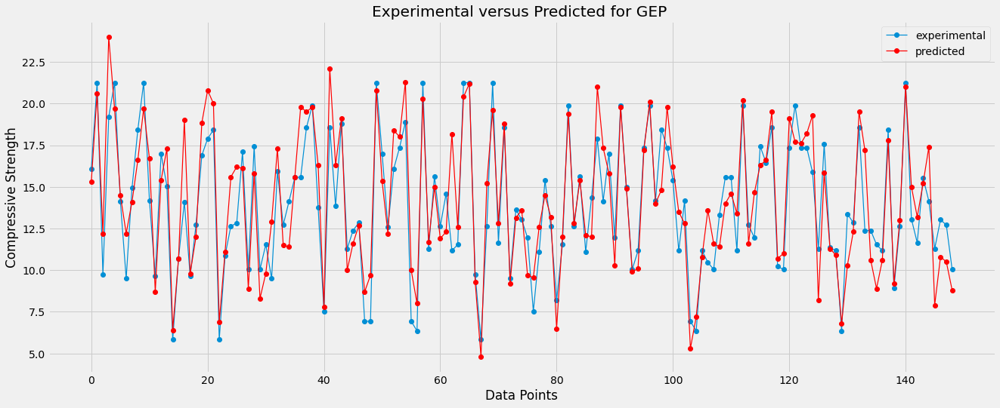

In [6]:
plt.figure(figsize=(20, 8))
plt.plot(np.arange(len(df_validation_gene3)), df_validation_gene3['Model'], marker='o', linewidth=1.2)
plt.plot(np.arange(len(df_validation_gene3)), df_validation_gene3['Target'], marker='o', linewidth=1.2, color='red')
plt.title('Experimental versus Predicted for GEP ')
plt.xlabel('Data Points')
plt.ylabel('Compressive Strength')
plt.legend(['experimental', 'predicted'])
plt.savefig('opc_cwp_gep_gene3_experimental_predicted.jpg');

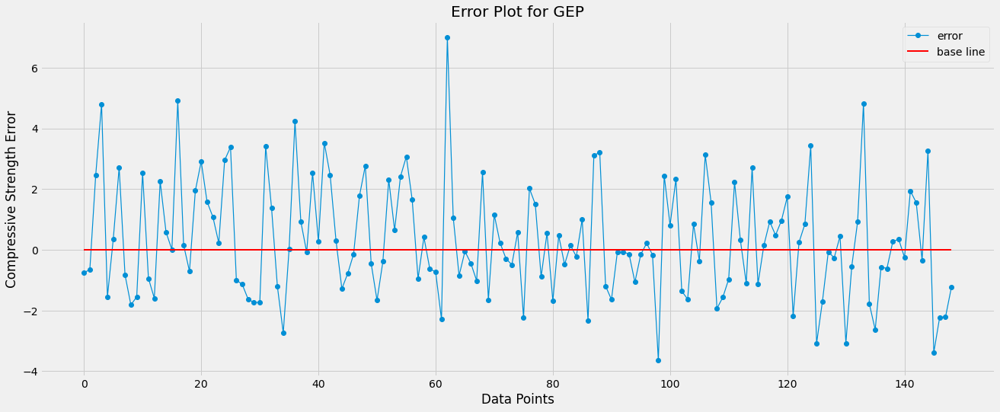

In [7]:
plt.figure(figsize=(20, 8))
plt.plot(np.arange(len(df_validation_gene3)), df_validation_gene3['Residual'], marker='o', linewidth=1.2)
plt.plot(np.zeros(len(df_validation_gene3)), color='red', linewidth=2)
plt.title('Error Plot for GEP')
plt.xlabel('Data Points')
plt.ylabel('Compressive Strength Error')
plt.legend(['error', 'base line'])
plt.savefig('opc_cwp_gep_gene3_error_analysis.jpg');

In [ ]:
R-square score validation ----- 77.75%
correlation------------ 88.18%
MSE: 3.80
RMSE: 1.95
MAE: 1.55
RSE: 0.22

R-square score training ------- 81.84%
correlation ------- 90.47%
MSE: 3.12
RMSE: 1.77
MAE: 1.33
RSE: 0.18
    
Generation----------30000
Linking function----Addition
Function sets--- +, -, *, /, Ln, Inv, 3Rt, Avg2, Atan, NOT

Number of chromosomes----50
Head Size: 10
Number of genes: 4
Evaluation metric for fitness function: RMSE
Used variables: 6

In [ ]:
R-square score validation ----- 79.92%
correlation------------ 89.4%
MSE: 3.81
RMSE: 1.95
MAE: 1.51
RSE: 0.20

R-square score training ------- 81.84%
correlation ------- 90.47%
MSE: 3.07
RMSE: 1.75
MAE: 1.36
RSE: 0.19
    
Generation----------30000
Linking function----Addition
Function sets--- +, -, *, /, Ln, Inv, 3Rt, Min2, Avg2, Atan, NOT

Number of chromosomes----100
Head Size: 10
Number of genes: 5
Evaluation metric for fitness function: RMSE
Used variables: 6

In [ ]:
R-square score validation ----- 77.38%
correlation------------ 87.97%
MSE: 3.75
RMSE: 1.94
MAE: 1.51
RSE: 0.23

R-square score training ------- 79.15%
correlation ------- 88.97%
MSE: 3.61
RMSE: 1.90
MAE: 1.45
RSE: 0.21
    
Generation----------30000
Linking function----Addition
Function sets--- +, -, *, /, Exp, Ln, Inv, X2, 3Rt, Min2, Max2, Avg2, Atan

Number of chromosomes----200
Head Size: 12
Number of genes: 5
Evaluation metric for fitness function: RMSE
Used variables: 4

In [7]:
genes = [3, 4, 5, 5]
Head = [8, 10, 10, 12]

MSE_validation = [3.64, 3.8, 3.81, 3.75]
RMSE_validation = [1.91, 1.95, 1.95, 1.94]
MAE_validation = [1.48, 1.55, 1.51, 1.51]
r_square_validation = [0.80, 0.78, 0.80, 0.77]

MSE_training = [3.14, 3.12, 3.07, 3.61]
RMSE_training = [1.77, 1.77, 1.75, 1.9]
MAE_training = [1.39, 1.33, 1.36, 1.45]
r_square_training = [0.81, 0.82, 0.82, 0.79]

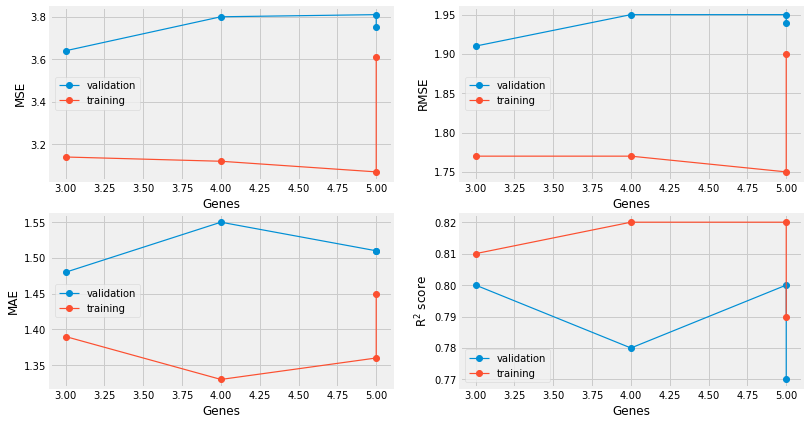

In [11]:
plt.figure(figsize=(12, 7))
plt.subplot(2, 2, 1)
plt.plot(genes, MSE_validation, marker='o', linewidth=1.2)
plt.subplot(2, 2, 1)
plt.plot(genes, MSE_training, marker='o', linewidth=1.2)
plt.ylabel('MSE')
plt.xlabel('Genes')
plt.legend(['validation', 'training'])

plt.subplot(2, 2, 2)
plt.plot(genes, RMSE_validation, marker='o', linewidth=1.2)
plt.subplot(2, 2, 2)
plt.plot(genes, RMSE_training, marker='o', linewidth=1.2)
plt.ylabel('RMSE')
plt.xlabel('Genes')
plt.legend(['validation', 'training'])

plt.subplot(2, 2, 3)
plt.plot(genes, MAE_validation, marker='o', linewidth=1.2)
plt.subplot(2, 2, 3)
plt.plot(genes, MAE_training, marker='o', linewidth=1.2)
plt.ylabel('MAE')
plt.xlabel('Genes')
plt.legend(['validation', 'training'])

plt.subplot(2, 2, 4)
plt.plot(genes, r_square_validation, marker='o', linewidth=1.2)
plt.subplot(2, 2, 4)
plt.plot(genes, r_square_training, marker='o', linewidth=1.2)
plt.ylabel('R$^2$ score')
plt.xlabel('Genes')
plt.legend(['validation', 'training'])

plt.savefig('opc_cwp_gene_parameters_variation.jpg')

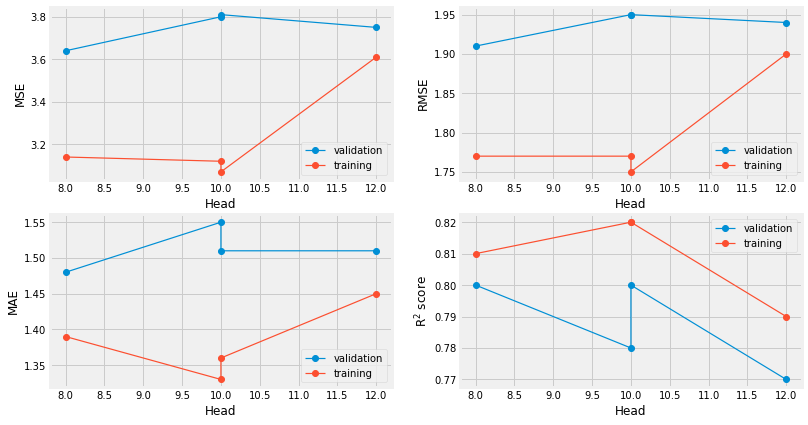

In [12]:
plt.figure(figsize=(12, 7))
plt.subplot(2, 2, 1)
plt.plot(Head, MSE_validation, marker='o', linewidth=1.2)
plt.subplot(2, 2, 1)
plt.plot(Head, MSE_training, marker='o', linewidth=1.2)
plt.ylabel('MSE')
plt.xlabel('Head')
plt.legend(['validation', 'training'])

plt.subplot(2, 2, 2)
plt.plot(Head, RMSE_validation, marker='o', linewidth=1.2)
plt.subplot(2, 2, 2)
plt.plot(Head, RMSE_training, marker='o', linewidth=1.2)
plt.ylabel('RMSE')
plt.xlabel('Head')
plt.legend(['validation', 'training'])

plt.subplot(2, 2, 3)
plt.plot(Head, MAE_validation, marker='o', linewidth=1.2)
plt.subplot(2, 2, 3)
plt.plot(Head, MAE_training, marker='o', linewidth=1.2)
plt.ylabel('MAE')
plt.xlabel('Head')
plt.legend(['validation', 'training'])

plt.subplot(2, 2, 4)
plt.plot(Head, r_square_validation, marker='o', linewidth=1.2)
plt.subplot(2, 2, 4)
plt.plot(Head, r_square_training, marker='o', linewidth=1.2)
plt.ylabel('R$^2$ score')
plt.xlabel('Head')
plt.legend(['validation', 'training'])

plt.savefig('opc_cwp_head_parameters_variation.jpg')

#### Sensitivity Analysis

###### GEP

In [20]:
from math import *

def gepModel(d):

    G1C1 = -5.2335123685606
    G1C3 = 10.522992302629
    G2C3 = -6.91491981105574
    G2C5 = 6.88527292516593
    G2C0 = -8.8913750596866
    G2C4 = -7.0413690160903
    G2C2 = 3.688921241365
    G2C7 = -8.02554593646046
    G3C9 = -9.2143079692533

    y = 0.0

    y = gep3Rt((((d[0]+d[1])*(d[1]+G1C1))-((G1C3-d[2])*((d[5]+d[0])/2.0))))
    y = y + ((G2C3+((((d[0]-d[3])-((G2C0+G2C4)/2.0))+(((G2C2+G2C7)/2.0)+G2C5))/2.0))/2.0)
    y = y + atan((gep3Rt((((d[0]/d[4])*G3C9)*d[1]))+d[5]))

    return y
    

def gep3Rt(x):
    if (x < 0.0):
        return -pow(-x,(1.0/3.0))
    else:
        return pow(x,(1.0/3.0))

In [21]:
def sensitivity_analysis_gep(features):
    opc = [100, 90, 80, 85, 95, 70, 75, 90, 100, 70]
    cwp = [0, 0, 5, 15, 20, 25, 30, 20, 5, 15]
    CG = [100, 100, 100, 100, 100, 100, 100, 100, 100, 100]
    sand = [100, 100, 100, 100, 100, 100, 100, 100, 100, 100]
    wc = [0.5, 0.6, 0.5, 0.7, 0.6, 0.5, 0.7, 0.7, 0.6, 0.6]
    age = [7, 28, 28, 56, 90, 7, 90, 56, 7, 56]
    
    features_type = [opc, cwp, sand, CG, wc, age]
    features_random_values = [x for x in features_type]
    
    col_to_values_index = dict(zip(range(len(features_random_values)), features_random_values))
    sa_gep_data = np.median(features, axis=0)
    
    preds_max_min = []
    for key, value in col_to_values_index.items():
        sa_gep_data_copy = sa_gep_data.copy()
        col_predictions = []
        for val in value:
            sa_gep_data_copy[key] = val
            pred = gepModel(sa_gep_data_copy)
            col_predictions.append(pred)
        preds_max_min.append((max(col_predictions), min(col_predictions)))
        
    ## Calculate preds differences
    diff_fn = lambda x: [x[i][0] - x[i][1] for i in range(len(x))]
    min_max_diff = diff_fn(preds_max_min)

    I_sum = sum(min_max_diff)
    col_sa_fn = lambda x, i_sum: [(diff/i_sum)*100 for diff in x]
    col_sa = col_sa_fn(min_max_diff, I_sum)
    
    #merge col_sa back with feature_names
    sa_gep_df =pd.DataFrame(data=np.array(col_sa).reshape(1, features.shape[1]), columns=features.columns.values)
    return sa_gep_df

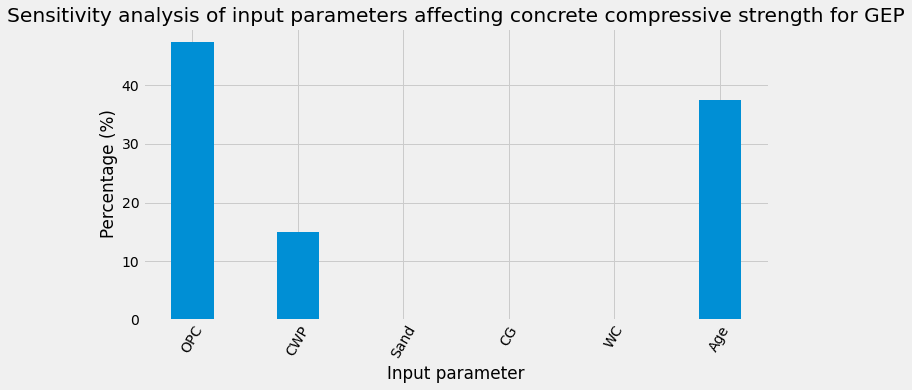

In [22]:
sa_df_gep = sensitivity_analysis_gep(df_opc_cwp.iloc[:, :-1])
fig = plt.figure(figsize = (10, 5))
# creating the bar plot
plt.bar(np.array(sa_df_gep.columns), sa_df_gep.values.flatten(), width = 0.4)
plt.xlabel("Input parameter")
plt.ylabel("Percentage (%)")
plt.title("Sensitivity analysis of input parameters affecting concrete compressive strength for GEP")
plt.xticks(rotation=60)
plt.savefig('gep_sensitivity_analysis_opc_cwp.jpg');

#### DTREE

In [25]:
def sensitivity_analysis(features, model=None, scaler=False):
    opc = [100, 90, 80, 85, 95, 70, 75, 90, 100, 70]
    cwp = [0, 0, 5, 15, 20, 25, 30, 20, 5, 15]
    wc = [0.5, 0.6, 0.5, 0.7, 0.6, 0.5, 0.7, 0.7, 0.6, 0.6]
    age = [7, 28, 28, 56, 90, 7, 90, 56, 7, 56]
    
    features_type = [opc, cwp, wc, age]
    features_random_values = [x for x in features_type]
    
    col_to_values_index = dict(zip(range(len(features_random_values)), features_random_values))
    sa_data = np.median(features, axis=0)
    
    preds_max_min = []
    for key, value in col_to_values_index.items():
        sa_data_copy = sa_data.copy()
        col_predictions = []
        for val in value:
            sa_data_copy[key] = val
            if scaler == False:
                data = sa_data_copy
                pred = model.predict([data])
            else:
                data = scaler.transform(sa_data_copy.reshape(-1, features.shape[1]))
                pred = model.predict(data)
            col_predictions.append(pred)
        preds_max_min.append((max(col_predictions), min(col_predictions)))
        
    ## Calculate preds differences
    diff_fn = lambda x: [x[i][0] - x[i][1] for i in range(len(x))]
    min_max_diff = diff_fn(preds_max_min)

    I_sum = sum(min_max_diff)
    col_sa_fn = lambda x, i_sum: [(diff/i_sum)*100 for diff in x]
    col_sa = col_sa_fn(min_max_diff, I_sum)
    
    #merge col_sa back with feature_names
    sa_df =pd.DataFrame(data=np.array(col_sa).reshape(1, features.shape[1]), columns=features.columns.values)
    return sa_df

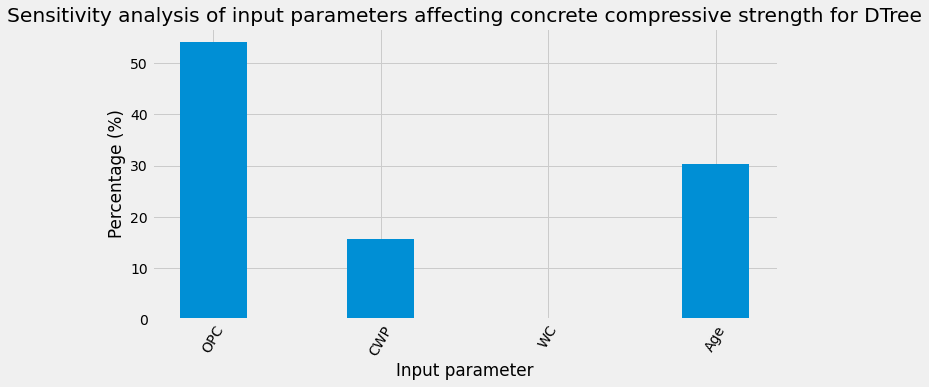

In [26]:
sa_df_dtree = sensitivity_analysis(X_train, model=dtree, scaler=False)
fig = plt.figure(figsize = (10, 5))
# creating the bar plot
plt.bar(np.array(sa_df_dtree.columns), sa_df_dtree.values.flatten(), width = 0.4)
plt.xlabel("Input parameter")
plt.ylabel("Percentage (%)")
plt.title("Sensitivity analysis of input parameters affecting concrete compressive strength for DTree")
plt.xticks(rotation=60)
plt.savefig('dtree_sensitivity_analysis_opc_cwp.jpg');

###### SVC

In [27]:
scaler = StandardScaler()
scaler.fit(X_train)

StandardScaler()

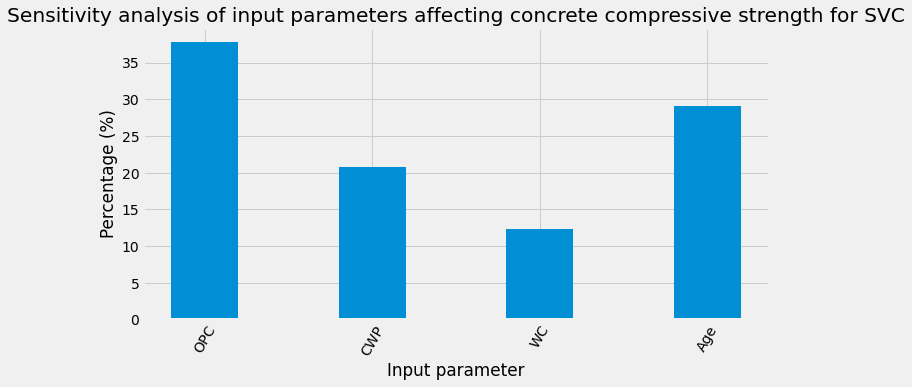

In [28]:
sa_df_svc = sensitivity_analysis(X_train, model=svr_model, scaler=scaler)
fig = plt.figure(figsize = (10, 5))
# creating the bar plot
plt.bar(np.array(sa_df_svc.columns), sa_df_svc.values.flatten(), width = 0.4)
plt.xlabel("Input parameter")
plt.ylabel("Percentage (%)")
plt.title("Sensitivity analysis of input parameters affecting concrete compressive strength for SVC")
plt.xticks(rotation=60)
plt.savefig('svc_sensitivity_analysis_opc_cwp.jpg');

###### Result Summary

In [ ]:
## Original Data
1. Decision Tree ---83.93%
2. SVR -------------84.6%
3. GEP -------------80.19%

## Encoded Data
1. Decision Tree ---83.93%
2. SVR -------------84.74%

## Frequency Data
1. Decision Tree ---83.91%
2. SVR -------------881.48%


The original form of the data is similar to the encoded data and better than the frequency data